In [1]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

In [2]:
def coth(a):
    if a>0: return (1+tf.math.exp(-2*a))/(1-tf.math.exp(-2*a))
    if a<0: return (tf.math.exp(2*a)+1)/(tf.math.exp(2*a)-1)
    if a==0: return 0

def tanh(a):
    if a>0: return (1-tf.math.exp(-2*a))/(1+tf.math.exp(-2*a))
    if a<0: return (tf.math.exp(2*a)-1)/(tf.math.exp(2*a)+1)
    if a==0: return 0

In [24]:
data=1000
batch=100
set=10
layer=10
n_ini=1.0
n_fin=0.1
dn=-0.1
m2=-1
lam=1
c_reg1=0.01
c_reg2=0

<tf.Variable 'Variable:0' shape=(10,) dtype=float64, numpy=
array([0.74148256, 1.48977687, 0.83079561, 1.55431961, 2.03923067,
       1.16302122, 2.99080278, 3.31693495, 6.00087931, 9.60930968])>
tf.Tensor(
[ 3.01490951  3.02722263  3.04978824  3.09134316  3.16854751  3.31437385
  3.59861219  4.18820179  5.58607614 10.29821491], shape=(10,), dtype=float64)


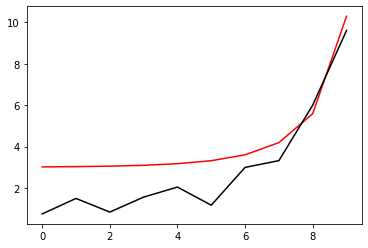

In [25]:
h=tf.zeros(layer)
h_in=[]
#h_in=[3.0205426, 3.022307 , 3.0291433, 3.04402  , 3.0732646, 3.131582 ,
# 3.2585216, 3.5762587, 4.59116  , 9.752249]
for i in range (layer):
#   midd=np.float64(10.0)
#    h_in.append(midd)
#    midd=3*coth(3*((i-layer)*dn)).numpy()
#    h_in.append(midd)
    mu=1/(1-i/10)
    h_inn=np.float64(np.random.normal(mu, 1))
    h_in.append(h_inn)
h=tf.Variable(h_in)
print(h)

h_real=tf.zeros(layer)
middd=[]
for i in range (layer):
    midd=3*coth(3*((i-layer)*dn)).numpy()
    middd.append(midd)
h_real=tf.constant(middd)
print(h_real)
plt.plot(h_real, 'r-')
plt.plot(h.numpy(), 'k-')
plt.show()

In [7]:
def F_func(a,b):
    return 2*b/n_fin-m2*a-lam*(a**3)

def t_func(a):
    return 0.5*(tf.math.tanh(100*(a-0.1))-tf.math.tanh(100*(a+0.1))+2)

In [8]:
def LP2(hh, phi, pi):
    for j in range (layer-1):
        phi1=phi+dn*pi
        pi1 =phi*m2*dn+(1-dn*hh[j])*pi+dn*lam*(phi1**3)
        phi=phi1
        pi=pi1
    return phi, pi
def NN_func_p(hh):
    Positive=[]
    while len(Positive)<batch:
        phi1=np.random.uniform(0.0, 1.5, 10000)
        pi1=np.random.uniform(-0.2, 0.2, 10000)
        phi_1, pi_1=LP2(hh, phi1, pi1)
        F=np.array(tf.math.abs(F_func(phi_1, pi_1)))
        for i in range (len(phi1[F<0.1])):
            Positive.append([phi1[F<0.1][i], pi1[F<0.1][i]])
            if len(Positive)>=batch: break
    return Positive
def NN_func_n(hh):
    Negative=[]
    while len(Negative)<batch:
        phi1=np.random.uniform(0.0, 1.5, 10000)
        pi1=np.random.uniform(-0.2, 0.2, 10000)
        phi_1, pi_1=LP2(hh, phi1, pi1)
        F=np.array(tf.math.abs(F_func(phi_1, pi_1)))
        for i in range (len(phi1[F>=0.1])):
            Negative.append([phi1[F>=0.1][i], pi1[F>=0.1][i]])
            if len(Negative)>=batch: break
    return Negative
def NN_func_01(hh, list1):
    PP=[]
    NN=[]
    phi=np.array(list1)[:, 0]
    pi=np.array(list1)[:, 1]
    F=np.array(tf.math.abs(LP2(hh, phi, pi)[1]))
    for i in range (len(phi[F<0.1])):
        PP.append([phi[F<0.1][i], pi[F<0.1][i]])
    for i in range (len(phi[F>=0.1])):
        NN.append([phi[F>=0.1][i], pi[F>=0.1][i]])
    return PP, NN

In [19]:
Positive=[]
Negative=[]
for i in range (set):
    Positive.insert(i, NN_func_p(h_real))
    Negative.insert(i, NN_func_n(h_real))

In [20]:
Positive0=[]
Positive1=[]
Negative0=[]
Negative1=[]
for i in range (set):
    Positive0.insert(i, NN_func_01(h, Positive[i])[0])
    Positive1.insert(i, NN_func_01(h, Positive[i])[1])
    Negative0.insert(i, NN_func_01(h, Negative[i])[0])
    Negative1.insert(i, NN_func_01(h, Negative[i])[1])

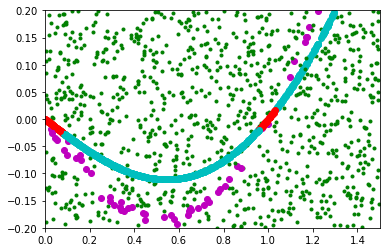

In [21]:
x_data1=[]
y_data1=[]
x_data2=[]
y_data2=[]
x_data3=[]
y_data3=[]
x_data4=[]
y_data4=[]
for i in range (set):
    x_data1.insert(i, [v[0] for v in Positive0[i]])
    y_data1.insert(i, [v[1] for v in Positive0[i]])
    x_data2.insert(i, [v[0] for v in Positive1[i]])
    y_data2.insert(i, [v[1] for v in Positive1[i]])
    x_data3.insert(i, [v[0] for v in Negative0[i]])
    y_data3.insert(i, [v[1] for v in Negative0[i]])
    x_data4.insert(i, [v[0] for v in Negative1[i]])
    y_data4.insert(i, [v[1] for v in Negative1[i]])
    plt.plot(x_data4[i], y_data4[i], 'g.')
    plt.plot(x_data2[i], y_data2[i], 'co')
    plt.plot(x_data1[i], y_data1[i], 'ro')
    plt.plot(x_data3[i], y_data3[i], 'mo')
plt.xlim(0.0, 1.5)
plt.ylim(-0.2, 0.2)
plt.show()

# Error function

$E=\sum_{data} \left\vert y(\bar{x}^{(1)}) - \bar{y} \right\vert+E_{reg}(W)$
, $E_{reg}=c_{reg}^{(1)}\sum_{n=1}^{N-1}(\eta^{(n)})^{4}(h(\eta^{(n+1)})-h(\eta^{(n)}))^{2}+c_{reg}^{(2)}(h(\eta^{(N)})-1/\eta^{(N)})^{2}$

In [12]:
def Error_func(hh, list1, list2):
    phi0=np.array([v[0] for v in list1])
    pi0=np.array([v[1] for v in list1])
    phi1=np.array([v[0] for v in list2])
    pi1=np.array([v[1] for v in list2])
    phi_0, pi_0=LP2(hh, phi0, pi0)
    phi_1, pi_1=LP2(hh, phi1, pi1)
    PPlist=t_func(pi_0)
    NNlist=t_func(pi_1)
    sum_p=sum(PPlist)/batch
    sum_n=(batch-sum(NNlist))/batch

    inside=0
    for k in range (layer-1):
        second=((n_ini+k*dn)**4)*((hh[k+1]-hh[k])**2)
        inside=inside+second
    E_reg1=c_reg1*inside
    E_reg2=c_reg2*((hh[layer-1]-1/n_fin)**2)
    return E_reg1+E_reg2+sum_p+sum_n

In [22]:
for i in range (set):
    print(Error_func(h_real, Positive[i], Negative[i]))
for i in range (set):
    print(Error_func(h, Positive[i], Negative[i]))

tf.Tensor(0.018755392392518493, shape=(), dtype=float64)
tf.Tensor(0.010991927388774166, shape=(), dtype=float64)
tf.Tensor(0.04008748333949867, shape=(), dtype=float64)
tf.Tensor(0.027288058045249565, shape=(), dtype=float64)
tf.Tensor(0.03146716451684301, shape=(), dtype=float64)
tf.Tensor(0.0206306757958848, shape=(), dtype=float64)
tf.Tensor(0.0107231915449381, shape=(), dtype=float64)
tf.Tensor(0.013158891854943944, shape=(), dtype=float64)
tf.Tensor(0.0007157790292637214, shape=(), dtype=float64)
tf.Tensor(0.01404351460213818, shape=(), dtype=float64)
tf.Tensor(1.0558212545106747, shape=(), dtype=float64)
tf.Tensor(1.0964639935016707, shape=(), dtype=float64)
tf.Tensor(1.026119452740882, shape=(), dtype=float64)
tf.Tensor(1.0192629512250768, shape=(), dtype=float64)
tf.Tensor(1.0055903993087, shape=(), dtype=float64)
tf.Tensor(1.032358038377713, shape=(), dtype=float64)
tf.Tensor(1.0679691792459496, shape=(), dtype=float64)
tf.Tensor(1.0236343758695379, shape=(), dtype=float64)
t

0 0.964190126398754
[0.84148088 1.38978188 0.93079284 1.4543548  1.93924032 1.26182524
 2.89081007 3.21694318 5.90088711 9.50981938]


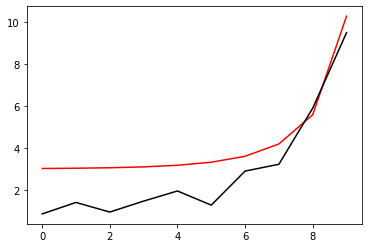

1100 0.9596298312310189
[1.36192206 1.35886399 1.37936601 1.38960491 1.34217419 0.82734257
 1.83910731 2.06467901 4.74303837 8.41225298]


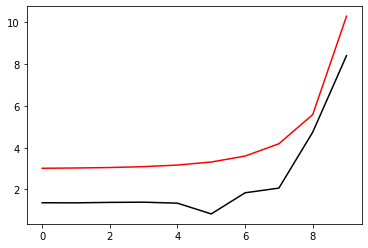

2200 0.613475620545402
[2.57002407 2.51145306 2.44183211 2.2707027  1.86727899 1.21032969
 1.15956281 1.06754914 3.58003213 7.32189319]


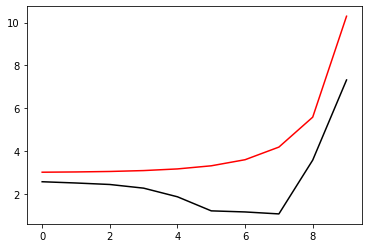

3300 0.04583140286928805
[3.18321335 3.13697044 3.07161036 2.92360145 2.58332649 2.04347384
 1.79161971 1.37840759 3.51113742 6.26231078]


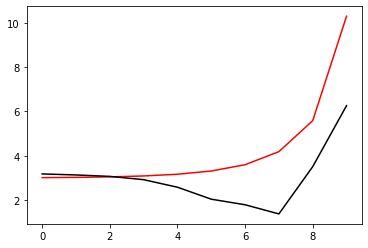

4400 0.046978982789548276
[3.15231259 3.11846579 3.05981649 2.93862191 2.68879512 2.32607422
 2.19982299 1.95584812 3.91191065 5.459082  ]


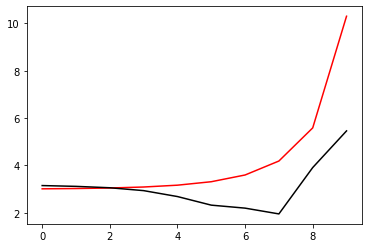

5500 0.05566336490173733
[2.97607601 2.94774873 2.89248876 2.79189926 2.61952506 2.40232512
 2.33986447 2.29880042 4.15711603 4.85699638]


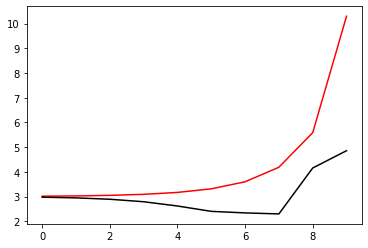

6600 0.016448955805279577
[3.2335228  3.2202182  3.18042797 3.10106595 2.96538278 2.79641409
 2.72822867 2.65521126 4.11174172 4.36018052]


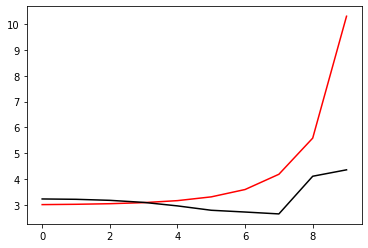

7700 0.020232288809429927
[3.07744375 3.06761671 3.03677822 2.973358   2.86902541 2.75045007
 2.7236211  2.77408436 4.18241866 4.19898947]


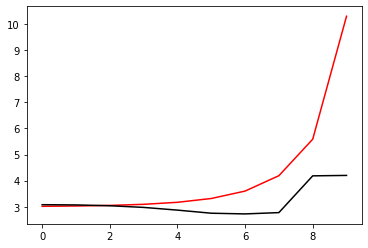

8800 0.0002134591024339521
[3.14623177 3.14562288 3.13262845 3.10160242 3.05471856 3.02492067
 3.10400637 3.32406829 4.67582406 4.47984113]


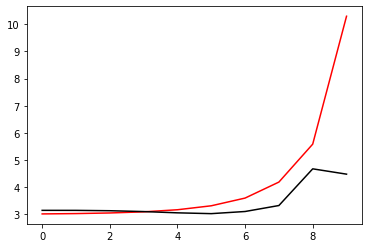

9900 0.018835591559703744
[3.00084091 2.98896235 2.96963187 2.93798344 2.89667553 2.87563836
 2.95643665 3.17393221 4.45128743 4.4548597 ]


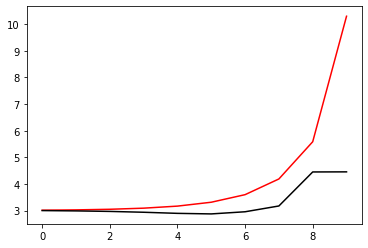

11000 0.020454416795276573
[2.99672078 2.98804997 2.97298245 2.9488627  2.91919507 2.9130981
 3.00869888 3.25630147 4.54428657 4.53280868]


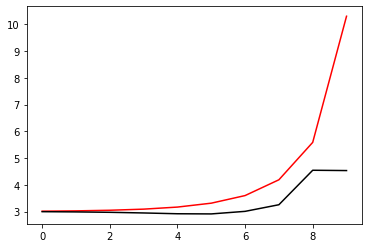

12100 0.023220767121953468
[3.00996997 3.0105115  3.00868324 3.00445538 3.00331589 3.03387387
 3.17030582 3.48484908 4.81271207 4.75956564]


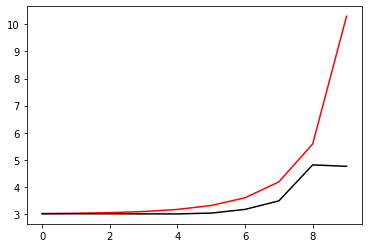

13200 0.03260005688214887
[2.87801316 2.9019123  2.93526595 2.97767014 3.03804586 3.1459188
 3.37208798 3.81345718 5.23124734 5.16100054]


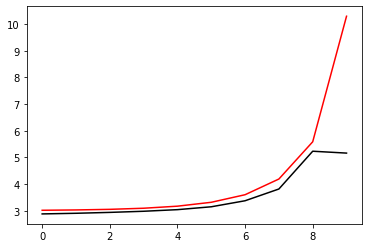

14300 0.025860498339379884
[2.95568829 2.99478589 3.04835946 3.11697901 3.21039659 3.35601947
 3.61611601 4.10147449 5.47314501 5.51310901]


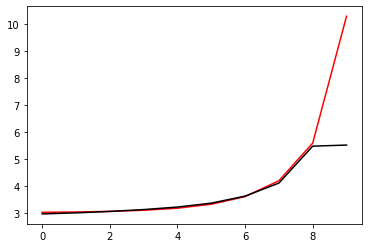

15400 0.03157117308001152
[2.9877881  3.01237234 3.05827981 3.12120078 3.20602586 3.32978586
 3.52911626 3.8825874  4.9973434  5.10038517]


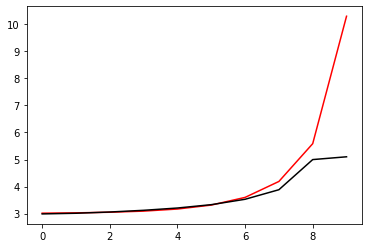

16500 0.018116118522005967
[2.92728411 2.95768194 3.01079375 3.08369988 3.18284955 3.32929075
 3.57009638 4.00365907 5.14714518 5.14069463]


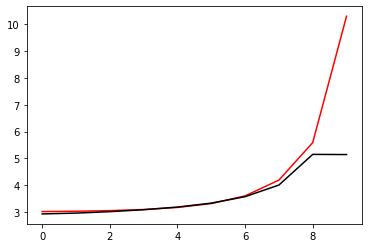

17600 0.010658705090671856
[2.88433437 2.91663454 2.9759181  3.06071173 3.18001858 3.36105921
 3.66542318 4.21139336 5.38699674 5.37838138]


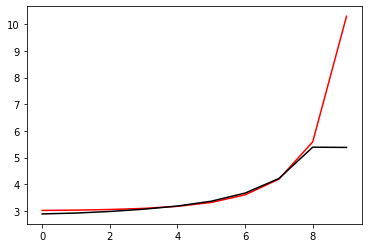

18700 0.010560599675618496
[2.95762315 2.99488207 3.06461953 3.16742565 3.31539123 3.54129631
 3.91390362 4.54377029 5.68951018 5.69069997]


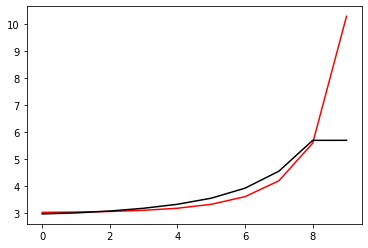

19800 0.0005713095324287381
[2.85400996 2.89461733 2.96855143 3.07517168 3.22600117 3.4521843
 3.8166046  4.40915305 5.42530482 5.42953108]


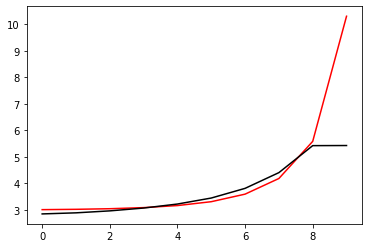

20900 0.010517432772073725
[2.85611605 2.89611302 2.97057299 3.07909118 3.2333277  3.46463596
 3.83600845 4.43906327 5.46356312 5.46481124]


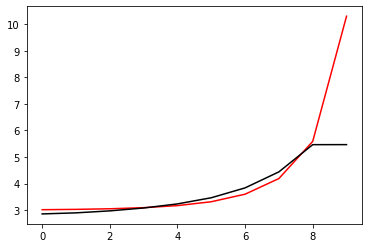

22000 0.010874005963521439
[2.86381586 2.90341701 2.97930084 3.09167352 3.25252083 3.49362395
 3.87827376 4.50056894 5.54015477 5.52989963]


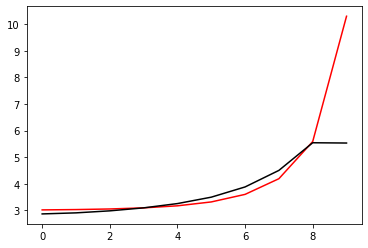

23100 0.010587399355583936
[2.92026393 2.96100141 3.04076272 3.16129098 3.33538383 3.5956388
 4.00565312 4.660987   5.72166159 5.63378572]


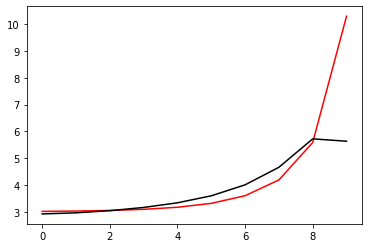

24200 0.028435385785130333
[2.87226464 2.91299149 2.9991999  3.13499219 3.3359325  3.63860147
 4.11259203 4.86158974 6.01291245 5.98346327]


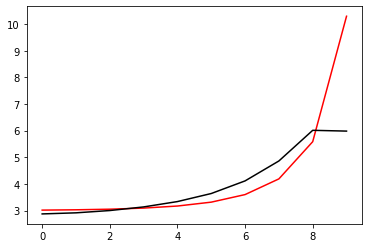

25300 0.025350195005019317
[2.8403837  2.85191099 2.91035741 3.0216005  3.20052552 3.47919223
 3.90988303 4.5389198  5.53692977 5.64809192]


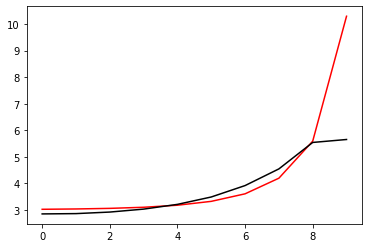

26400 0.030591770202483846
[2.8970121  2.91019422 2.96711608 3.07861732 3.26027227 3.54403158
 3.98207308 4.62494834 5.63411144 5.63682904]


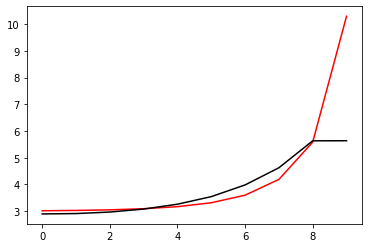

27500 0.011524520852273684
[2.84118265 2.8650067  2.93134429 3.05561972 3.25636994 3.56741844
 4.04332169 4.74240228 5.80951109 5.77928254]


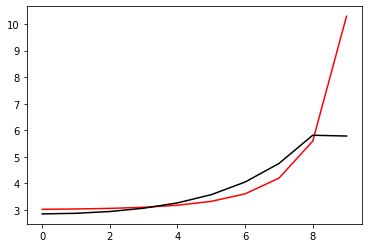

28600 0.010661828634839193
[2.95122161 2.96745908 3.0248691  3.14113435 3.33698936 3.64629846
 4.12323709 4.83477576 5.9100994  5.90355437]


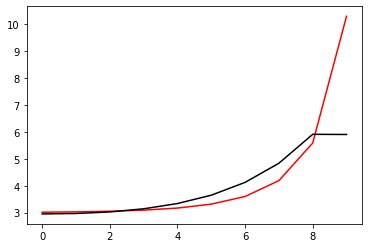

29700 0.01074626303965985
[2.93829301 2.95302349 3.00513428 3.11667483 3.31264977 3.63060217
 4.13000061 4.89225613 6.01866529 6.04119594]


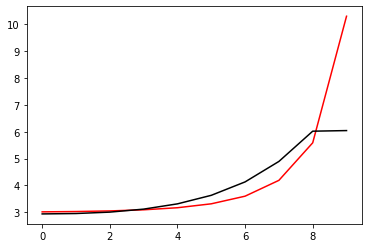

30800 0.00044624806260299386
[3.00298128 2.98992851 3.00988527 3.08637404 3.244576   3.52017802
 3.96063504 4.53529429 5.34803279 5.34653766]


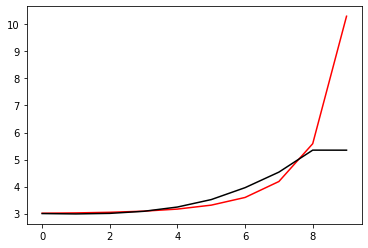

31900 0.010534329199144349
[2.90339712 2.89859745 2.92556474 3.01160063 3.1846337  3.48296587
 3.95557858 4.58402286 5.45352006 5.4554494 ]


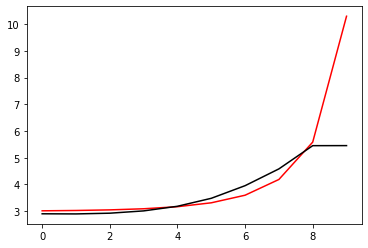

33000 0.010804816278095633
[2.90742051 2.91380691 2.95130671 3.04787727 3.23397342 3.54964242
 4.04425007 4.71556765 5.6252324  5.61686324]


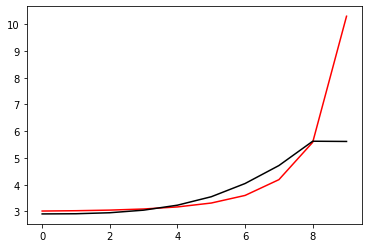

34100 0.6997646012517421
[3.20006799 3.21635759 3.26899409 3.38176891 3.58600333 3.91957436
 4.41588767 5.04021542 5.83917754 5.98370519]


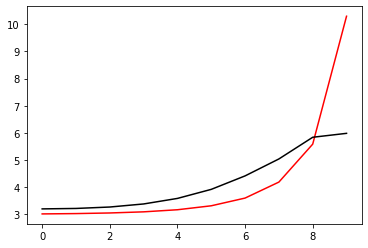

35200 0.02542350370815985
[2.89168033 2.89457238 2.9320556  3.02950915 3.21783063 3.53495236
 4.01649937 4.64098556 5.46201752 5.43343065]


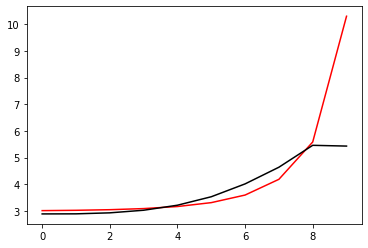

36300 0.019875210883553394
[2.89675859 2.90959423 2.95573977 3.06180968 3.25941461 3.58751572
 4.08405105 4.73762681 5.58796366 5.58023369]


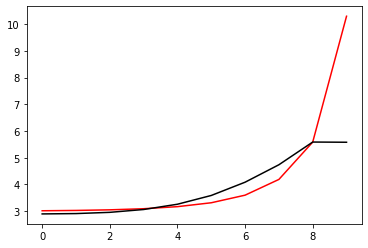

37400 0.03080605204988526
[2.92079173 2.94129681 2.99749518 3.11691611 3.33332985 3.68886415
 4.22662312 4.94780565 5.86502248 5.92556873]


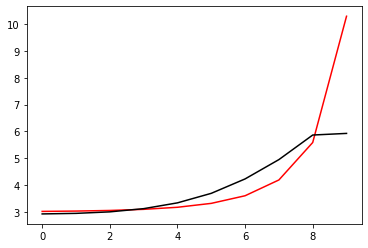

38500 0.04135747952399724
[2.80124146 2.82672274 2.88686305 3.00509139 3.21264438 3.54727273
 4.04490434 4.70453537 5.52668058 5.62768345]


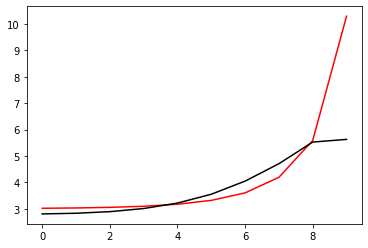

39600 0.010688225674176566
[2.85977312 2.87987862 2.93579357 3.05060504 3.25525591 3.58729509
 4.08254482 4.740883   5.55839644 5.55748073]


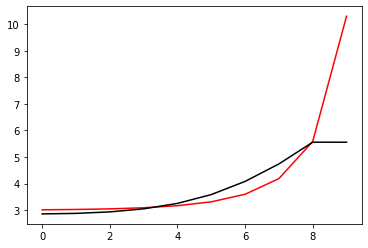

40700 0.016365222958002572
[2.86574516 2.89049153 2.95173783 3.07248197 3.28423165 3.62600387
 4.13653269 4.82021596 5.66131996 5.64497989]


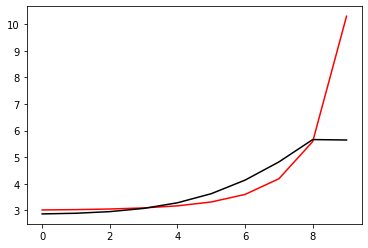

41800 0.0007499621624543324
[2.88043119 2.9094997  2.97682215 3.10445355 3.3243521  3.67727682
 4.2058449  4.92160898 5.79404366 5.85067778]


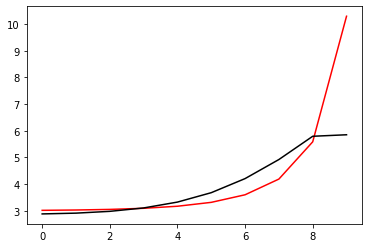

42900 0.010841020495193556
[2.92942084 2.94978601 3.00955294 3.13083467 3.34464655 3.69186078
 4.21812694 4.94771926 5.84644207 5.8542698 ]


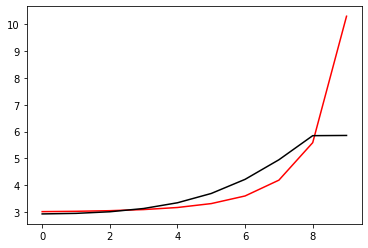

44000 0.03903034169370568
[2.78679596 2.81879483 2.89548281 3.03882002 3.28307204 3.67752195
 4.28660708 5.1624481  6.22530923 6.15986856]


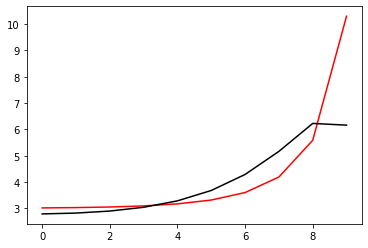

45100 0.010889432027425715
[2.90879619 2.91779628 2.96697328 3.07856808 3.28370094 3.625474
 4.15292315 4.85683804 5.58488382 5.57788481]


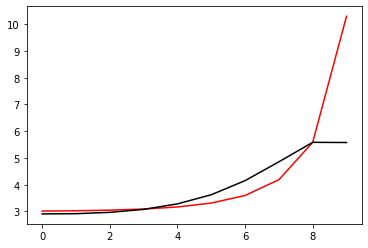

46200 0.022064504316629277
[2.84265034 2.85818822 2.91433046 3.03630055 3.25717891 3.62299763
 4.1870881  4.95008461 5.75275082 5.70596727]


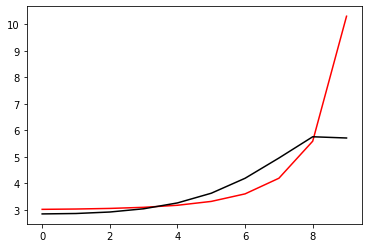

47300 0.016634927719874244
[2.92718699 2.94306587 3.00206496 3.13054125 3.36354642 3.74933899
 4.34425851 5.15883573 6.02636563 6.09297598]


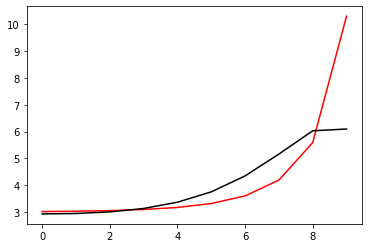

48400 0.030640985942378997
[2.90148137 2.89971553 2.93737707 3.04002694 3.23918894 3.57551534
 4.09087477 4.77899234 5.48429984 5.57417728]


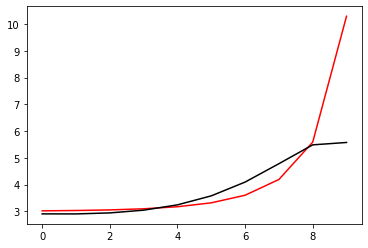

49500 0.012127219172908677
[2.88304612 2.88621755 2.92768706 3.03448428 3.23897773 3.58333277
 4.1126601  4.82550692 5.55714656 5.54714284]


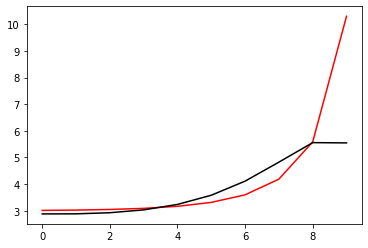

50600 0.010765551030541047
[2.86433027 2.87412736 2.92103992 3.0334263  3.24486355 3.59942612
 4.14629604 4.89072506 5.65722148 5.66508846]


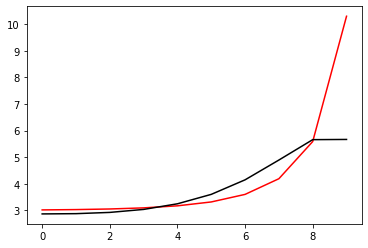

51700 0.011249297265975539
[2.89344423 2.91095983 2.96560677 3.08602841 3.30749096 3.6764953
 4.24642874 5.02726273 5.82642849 5.77162275]


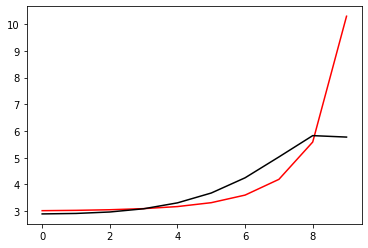

52800 0.0007663627055932988
[2.98616772 2.99264834 3.03627123 3.14591307 3.35677644 3.71483604
 4.27339268 5.05261172 5.87894882 5.87850524]


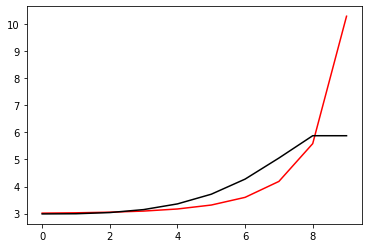

53900 0.010862718184239836
[2.93580771 2.94800745 2.99607921 3.1089428  3.32276761 3.68561956
 4.25766637 5.08462554 6.01440601 6.01163672]


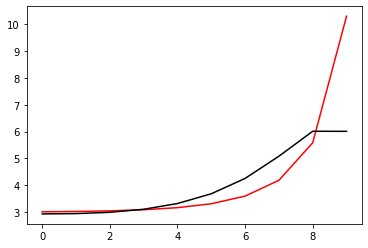

55000 0.010813264424960233
[2.92942999 2.90931061 2.92262407 3.00086227 3.17989176 3.50743975
 4.04223595 4.7899728  5.53685606 5.5355671 ]


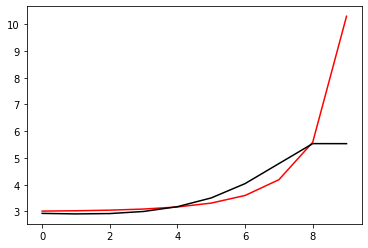

56100 0.010669054143207192
[2.96167056 2.95701424 2.98158475 3.06976072 3.25878101 3.59731367
 4.14489253 4.91398748 5.69818241 5.64177528]


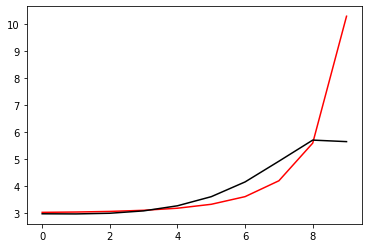

57200 0.0222784095201693
[2.83127469 2.84508766 2.89158348 3.00521276 3.22760513 3.61333479
 4.2296022  5.10198092 6.02336101 5.9862753 ]


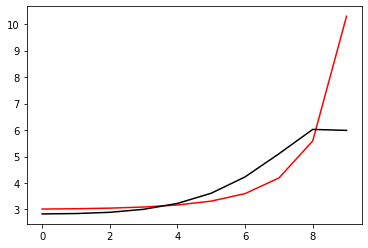

58300 0.01807072123675885
[2.88128035 2.88570989 2.92337661 3.02920823 3.24626814 3.63236998
 4.26247888 5.18368464 6.19348658 6.20383687]


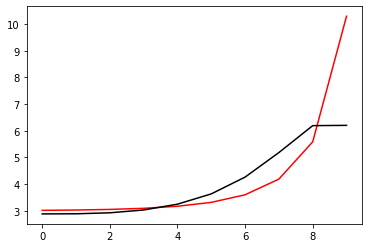

59400 0.03105548779195264
[2.92673614 2.94362204 2.99509991 3.11434295 3.34602021 3.75141726
 4.41152827 5.38729626 6.48078602 6.47021659]


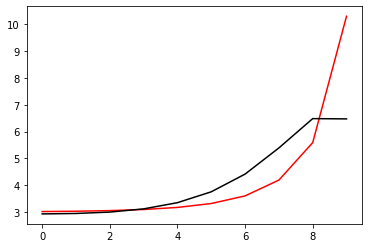

60500 0.06263476930123785
[3.04025173 3.05504578 3.10317262 3.21328581 3.42547168 3.7920062
 4.36200312 4.98508446 5.7798477  6.17808482]


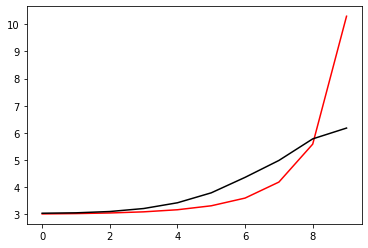

61600 0.010660246034178686
[2.92131324 2.94162393 2.9938546  3.10483901 3.31227947 3.66218092
 4.18128581 4.74689575 5.70736862 5.70955963]


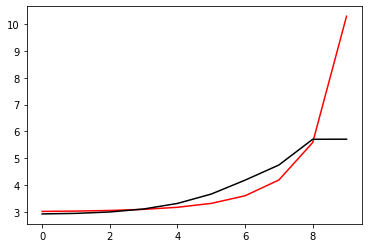

62700 0.011279598689492283
[2.88835683 2.91195438 2.96987624 3.08792174 3.30458749 3.66972762
 4.23166661 4.99183796 5.92221772 5.8574959 ]


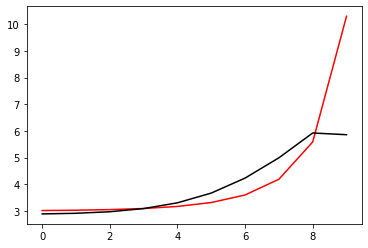

63800 0.000778504838120559
[2.98099176 2.9923491  3.03976054 3.14903711 3.35730641 3.71362918
 4.26995605 5.05009225 5.98884444 5.99492216]


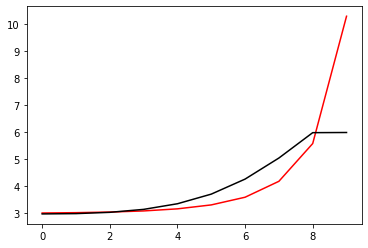

64900 0.010872653592483392
[2.93196895 2.94648421 2.99629312 3.10802138 3.31816186 3.67725488
 4.25135499 5.1185306  6.17593802 6.14986408]


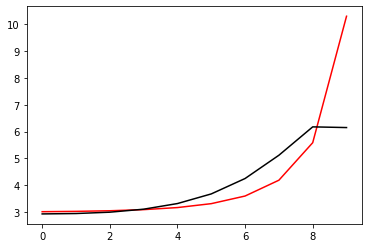

66000 0.011238983317242246
[2.9578757  2.93606569 2.94875224 3.02430826 3.19842028 3.52206596
 4.07155176 4.95952593 5.78163916 5.77718887]


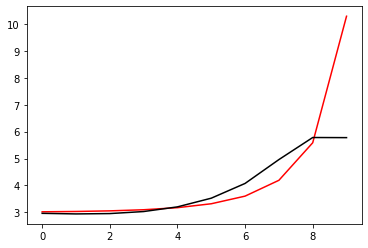

67100 0.010770715812650317
[2.95320264 2.943      2.96305574 3.04551284 3.22712248 3.5600064
 4.12229443 5.02326723 5.88463301 5.84288634]


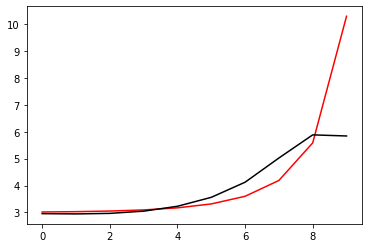

68200 0.021850244465463846
[2.85170786 2.85645466 2.89061388 2.98792063 3.18809287 3.54690403
 4.14775427 5.09811219 6.05656309 6.01060665]


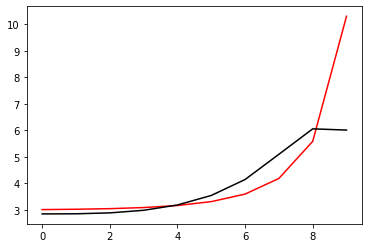

69300 0.020313299651585775
[3.00112214 2.9968229  3.02138523 3.1083537  3.29870291 3.6490524
 4.24237533 5.17746429 6.17342625 6.2687062 ]


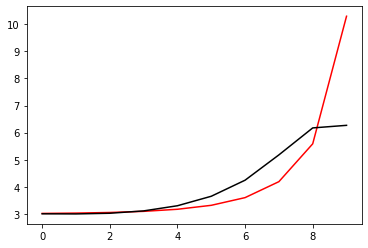

70400 0.06713920894420904
[2.80512746 2.80433632 2.83252121 2.92175526 3.11398155 3.46785724
 4.06779321 5.01501226 6.15439884 6.34072915]


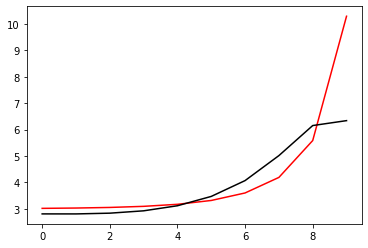

71500 0.020142331274976676
[2.95349223 2.95549189 2.98686237 3.07936905 3.27520984 3.63388192
 4.24025653 5.18935744 6.34406342 6.33734979]


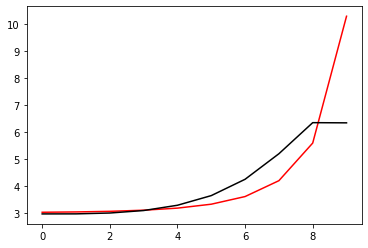

72600 0.039094067336007864
[2.80763085 2.82037577 2.86079812 2.9590363  3.15585122 3.50875539
 4.0992202  5.01418214 6.09992534 6.19217996]


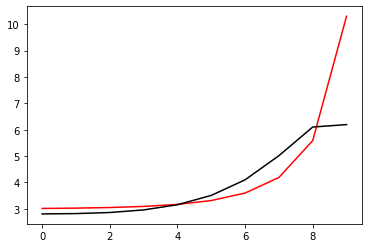

73700 0.01173348259131653
[2.90829895 2.91541915 2.95145097 3.04639125 3.24086362 3.59216119
 4.18057064 5.08887251 6.16416413 6.13109383]


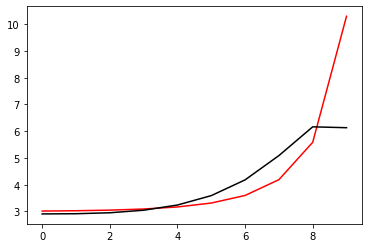

74800 0.0008849188179647699
[2.91131053 2.92607081 2.97032882 3.07376417 3.27786468 3.64178896
 4.24888386 5.18431803 6.29542726 6.30685269]


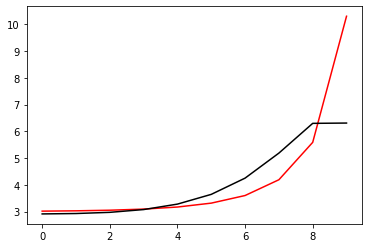

75900 0.010996732929359827
[2.92074401 2.94334595 2.99809324 3.11266111 3.32925872 3.7093349
 4.34006161 5.31060135 6.47317894 6.45497088]


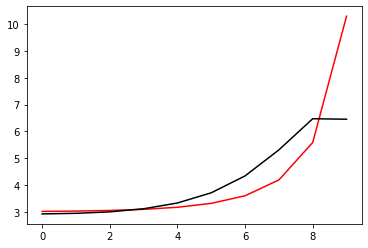

77000 0.011134179905202463
[2.87252062 2.89871377 2.96137684 3.08492185 3.31073946 3.70163
 4.34859937 5.35200039 6.59354408 6.60140996]


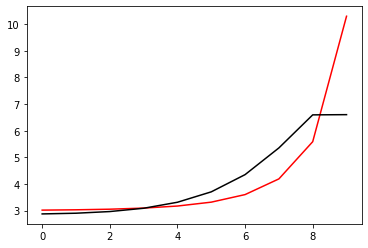

78100 0.010951721088803474
[2.88725334 2.90656946 2.96194446 3.07669363 3.28800389 3.65278518
 4.25317778 5.18739959 6.40928627 6.41898218]


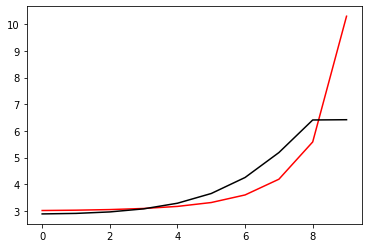

79200 0.03562867639767987
[2.80810582 2.82272448 2.87393989 2.98772943 3.20251793 3.57908678
 4.21553261 5.2520932  6.64547275 6.49140148]


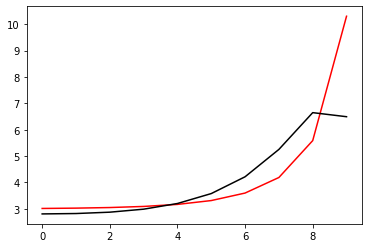

80300 0.01993896517536938
[2.92143817 2.91285009 2.93832378 3.02229726 3.19839746 3.51665586
 4.04609594 4.8397954  5.90531483 5.89396685]


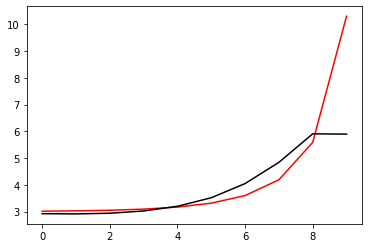

81400 0.030709245516586523
[2.91302209 2.91002559 2.939532   3.02783056 3.20918697 3.53453304
 4.07447949 4.88612851 5.97230113 5.97606035]


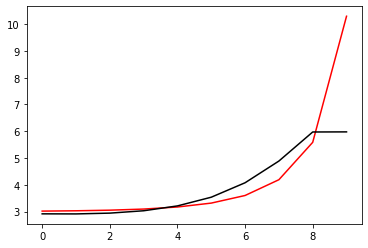

82500 0.011261280457512565
[2.8780113  2.88298628 2.91926664 3.01480463 3.20517785 3.54310263
 4.10257187 4.94864906 6.0773565  6.06563204]


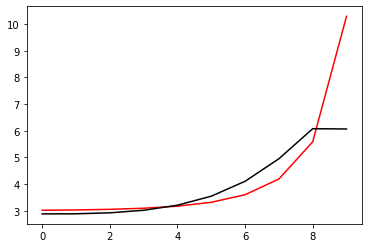

83600 0.01085308348767044
[2.86940809 2.88009894 2.92191626 3.02277039 3.21941423 3.56576407
 4.13827307 5.01142992 6.17745656 6.16037518]


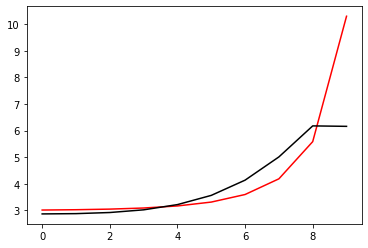

84700 0.01070406054778594
[3.01000199 3.00781088 3.03639491 3.12245176 3.3012362  3.6225829
 4.15377332 4.96226123 6.06156095 6.07675061]


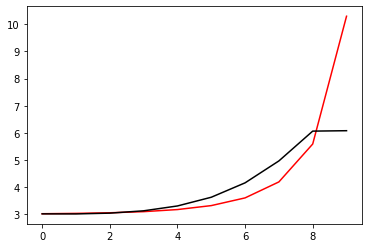

85800 0.0007529750986105206
[2.97917446 2.97244202 2.9951363  3.07706727 3.25533941 3.58319976
 4.13675937 5.00827116 6.22381753 6.28285079]


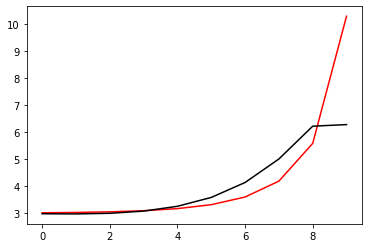

86900 0.010919420712303129
[2.93913213 2.93713021 2.96317881 3.05045021 3.23996807 3.59209396
 4.20019843 5.19070525 6.5492464  6.5550261 ]


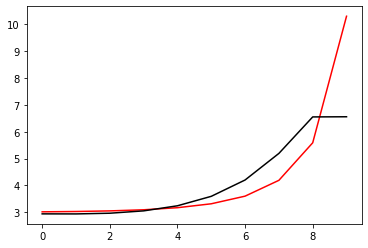

88000 0.01095264024252055
[2.91933685 2.91914142 2.94490575 3.02921375 3.21317129 3.55608597
 4.14744538 5.10238488 6.47653254 6.44037634]


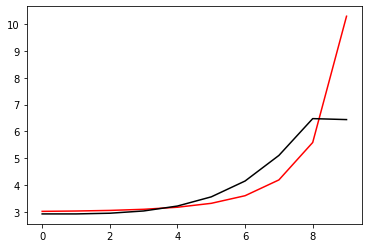

89100 0.011155239006755226
[2.92299523 2.93238231 2.97173984 3.07435838 3.28588322 3.67507374
 4.35160554 5.46914401 7.04437961 6.94737685]


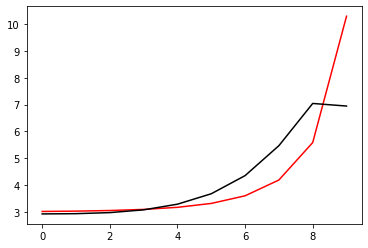

90200 0.021581532768915057
[2.87653676 2.87835939 2.90883746 2.99946345 3.19321203 3.55369721
 4.17934264 5.20947973 6.70946242 6.63214374]


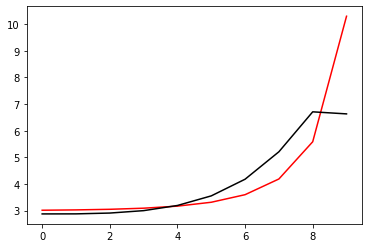

91300 0.017933208576621645
[2.93842428 2.96095465 3.0163853  3.13602041 3.36565916 3.7756505
 4.47740483 5.62403876 7.23095585 7.05201531]


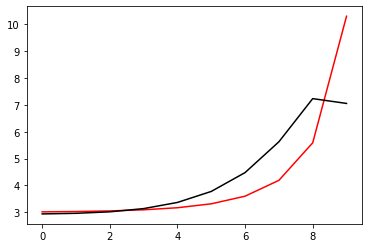

92400 0.03190443937826787
[2.86477461 2.86421659 2.89803342 2.99333067 3.19265343 3.56254981
 4.20910087 5.26258911 6.5696886  6.6521935 ]


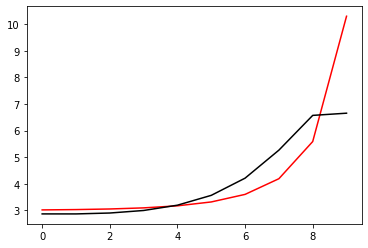

93500 0.011355459087635553
[2.8721571  2.87883032 2.919501   3.02313482 3.23254615 3.6149319
 4.27645397 5.34713538 6.68674047 6.66510032]


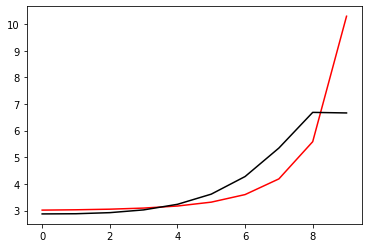

94600 0.01118161135268492
[2.85745019 2.8758944  2.93009826 3.04903297 3.27612475 3.67956595
 4.36605293 5.46613402 6.85851054 6.86671391]


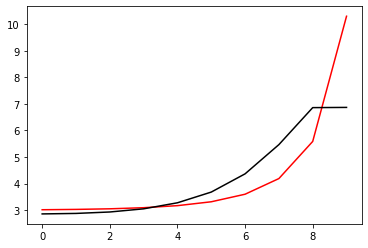

95700 0.011233413486972578
[2.92863076 2.95766998 3.02441614 3.1540673  3.38835208 3.79328211
 4.47187654 5.55476741 6.95997606 6.96525464]


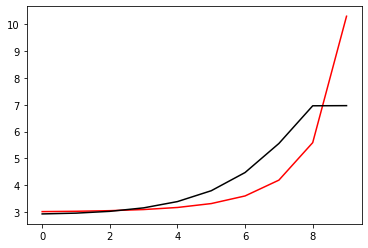

96800 0.0007298399056828431
[2.95448332 2.92862147 2.9412889  3.01538077 3.18723509 3.51380212
 4.08005471 4.96576476 6.01537955 6.02673639]


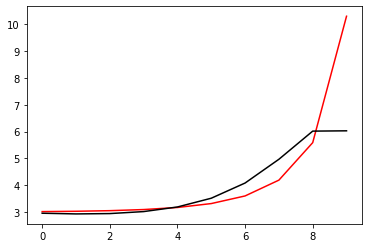

97900 0.010764499642042739
[2.93885527 2.92069067 2.93756674 3.01643568 3.1941253  3.5283184
 4.10516091 5.00765122 6.08746384 6.09127187]


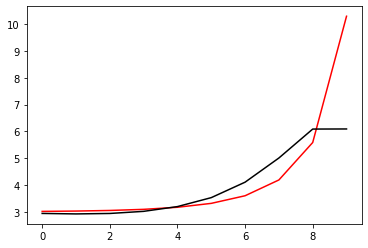

99000 0.010898600710230869
[2.92356803 2.91546024 2.93849637 3.02336816 3.20794444 3.55062244
 4.13867473 5.0595385  6.17727482 6.17621006]


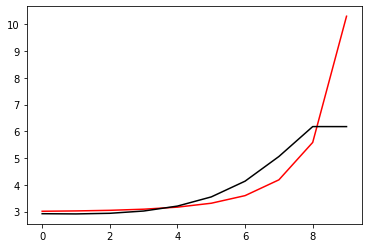

100100 0.010914173512293415
[2.91642554 2.92000782 2.95245065 3.04569682 3.23943176 3.59305827
 4.19521539 5.13961956 6.30942819 6.3021149 ]


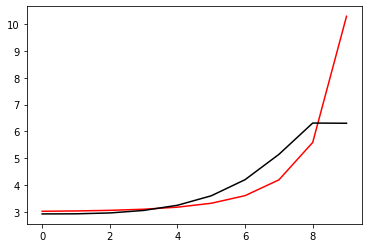

101200 0.02476542097819923
[2.83980953 2.84423021 2.87805123 2.9745055  3.17628812 3.54695554
 4.18322918 5.19678796 6.4905118  6.41314533]


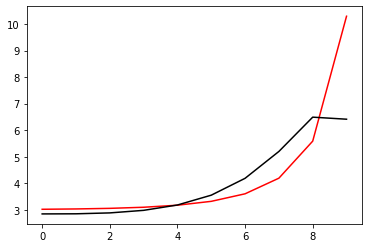

102300 0.1065372019503563
[3.07387845 3.07291858 3.10041137 3.18851843 3.38011997 3.73702504
 4.3458493  5.28595276 6.53076029 6.71125739]


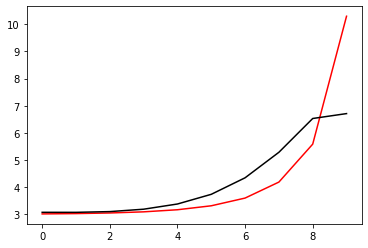

103400 0.03068350328825812
[2.91019982 2.90034284 2.91593928 2.98769068 3.1543614  3.46913585
 4.00022068 4.79947618 5.86157239 5.86116868]


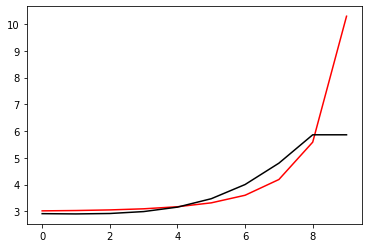

104500 0.011282360068308957
[2.89551801 2.89281851 2.91456721 2.99255079 3.16666022 3.49209513
 4.04147186 4.87422586 5.96490404 5.95184228]


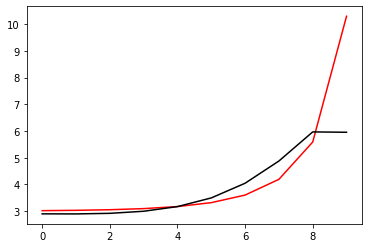

105600 0.010845405192083267
[2.87697064 2.88399983 2.91592376 3.00421615 3.19046771 3.53298764
 4.11085059 4.99412996 6.12933955 6.14624549]


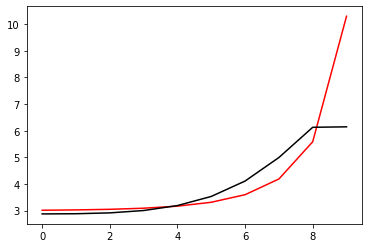

106700 0.010766552629726514
[2.99857266 2.996687   3.02138314 3.10308523 3.28307348 3.61916407
 4.18869955 5.06510242 6.20286691 6.20504985]


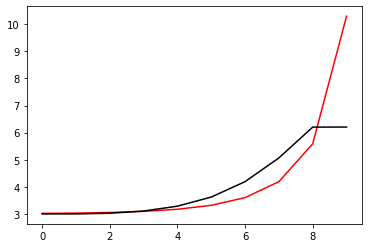

107800 0.0008033992291658539
[2.97563193 2.97651374 3.00337619 3.0869888  3.26868888 3.60732706
 4.18480775 5.09609192 6.31502274 6.3227174 ]


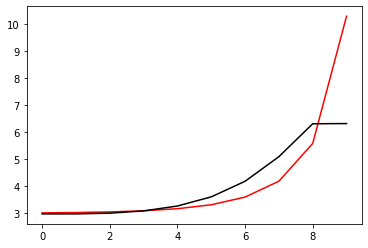

108900 0.010613571531415938
[2.94634647 2.92173482 2.92152181 2.97617644 3.12462679 3.42178547
 3.94401883 4.75877103 5.78117957 5.78234758]


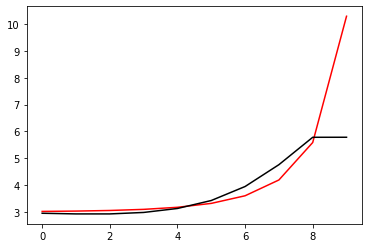

110000 0.010853043236846726
[2.93279279 2.91571027 2.92060346 2.98006528 3.1337832  3.43768336
 3.96973043 4.80112293 5.84811562 5.84501746]


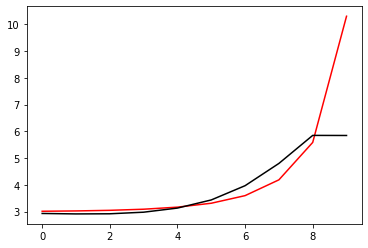

111100 0.010703581759520148
[2.96977423 2.9644293  2.97938909 3.04826176 3.21214486 3.52847789
 4.0769394  4.93164549 6.00671705 5.94399837]


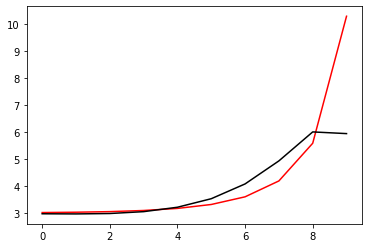

112200 0.02432968603147046
[2.8425008  2.85228496 2.88464977 2.97178892 3.15753165 3.50434772
 4.10111697 5.03777109 6.22528602 6.155455  ]


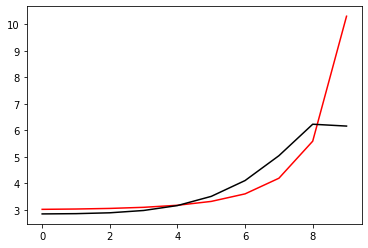

113300 0.021073873039355494
[3.03250356 3.02801842 3.04813359 3.12385201 3.2984119  3.63328885
 4.2129997  5.12205504 6.30395363 6.45966263]


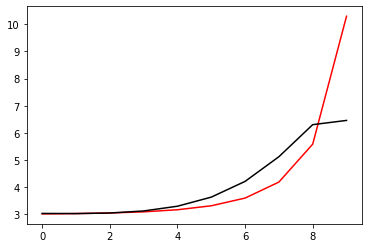

114400 0.05527797434904039
[2.83491601 2.83029138 2.84941911 2.92232204 3.0908653  3.41517567
 3.97868852 4.87993611 6.215481   6.41419417]


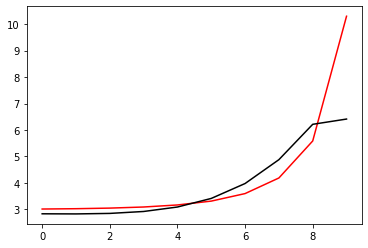

115500 0.020895553404780155
[3.00601138 3.0035639  3.02745823 3.10927973 3.29320533 3.64435117
 4.25635501 5.23342224 6.57262458 6.59074328]


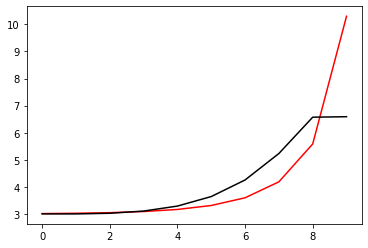

116600 0.010670919315442094
[2.92338728 2.9107699  2.92188665 2.98663809 3.14511577 3.45357508
 3.98504055 4.79678366 5.92584658 6.11000804]


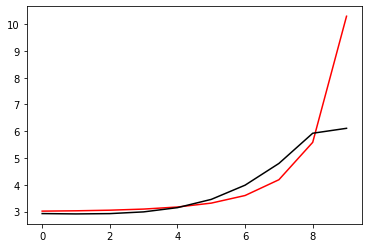

117700 0.017024983082987305
[2.92387708 2.91732288 2.93379771 3.00437789 3.17016292 3.48952564
 4.04025024 4.88417108 6.02198314 6.00584118]


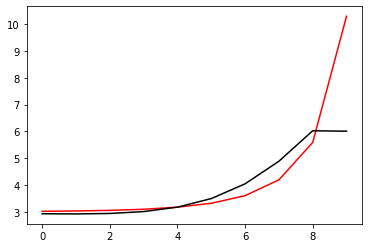

118800 0.0007632790818155044
[2.91425281 2.91559299 2.93972114 3.01822793 3.19351365 3.52657057
 4.10113285 4.98753164 6.14599554 6.15156767]


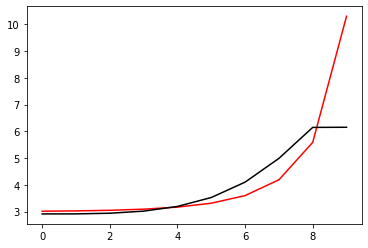

119900 0.010841636937437294
[2.92721902 2.93695815 2.97081112 3.05912853 3.2455161  3.59353631
 4.19186829 5.11744731 6.29386362 6.27436502]


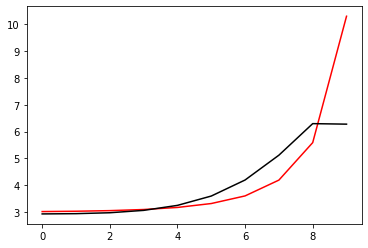

121000 0.01087111801891486
[2.91242443 2.91167916 2.9369281  3.01765    3.1963005  3.53521668
 4.12272682 5.05789153 6.30525523 6.26495687]


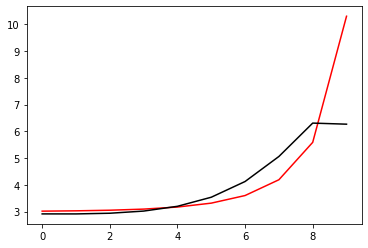

122100 0.010678176248263404
[2.97923758 2.96906174 2.98178708 3.04773359 3.20673637 3.51476341
 4.04413052 4.86342947 6.03167456 5.92596504]


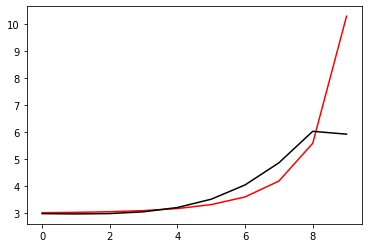

123200 0.023064713754486134
[2.86401217 2.85793379 2.87621722 2.95190731 3.12870928 3.47147798
 4.07918178 5.08362876 6.44999284 6.30228831]


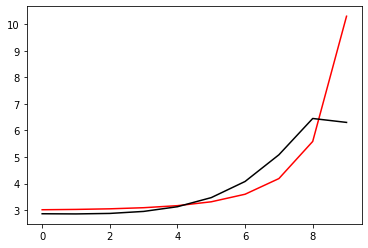

124300 0.0264960337555918
[3.04222898 3.03453654 3.0515794  3.12751824 3.30827634 3.66302301
 4.30027008 5.32506238 6.64206602 6.77509106]


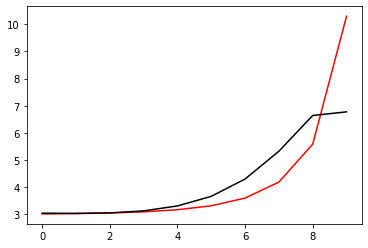

125400 0.030937577999742453
[2.96060672 2.95577143 2.97460856 3.05050335 3.22843152 3.57527206
 4.19365073 5.21085748 6.62041727 6.64548265]


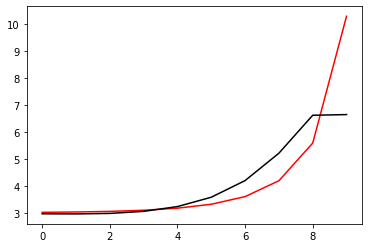

126500 0.05884776133931305
[2.78835242 2.79653765 2.82884253 2.91758263 3.10854126 3.47179472
 4.11885983 5.18554179 6.53407482 6.77938241]


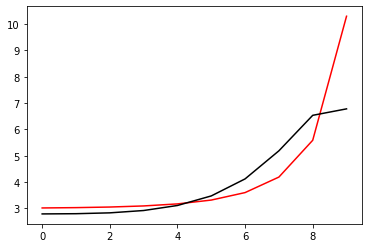

127600 0.010929386972135531
[2.92775154 2.92047328 2.93934741 3.01635269 3.19629223 3.54748308
 4.177449   5.21575797 6.5312547  6.52917673]


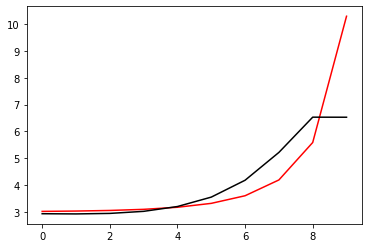

128700 0.011344790800355362
[2.91770126 2.91685519 2.94162105 3.02476717 3.21181795 3.57238383
 4.21573264 5.27302487 6.61547728 6.59815048]


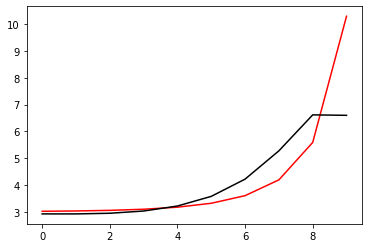

129800 0.0010497482652619327
[2.91228767 2.92069524 2.95504797 3.04801426 3.24616605 3.62090603
 4.28368345 5.36739807 6.74785709 6.78780765]


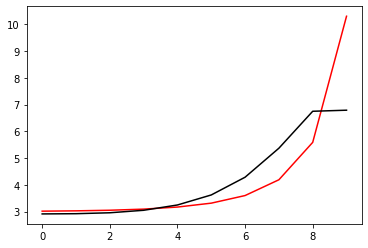

130900 0.011157697502856823
[2.8998123  2.91806885 2.96525853 3.07167523 3.2847908  3.67816237
 4.36589985 5.48442566 6.92138952 6.90532161]


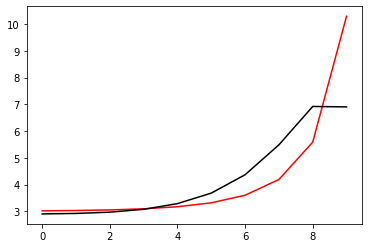

132000 0.028806788747278357
[2.80887931 2.83305188 2.89211884 3.01292983 3.24279929 3.65786448
 4.37778164 5.55279778 7.09659066 7.03703056]


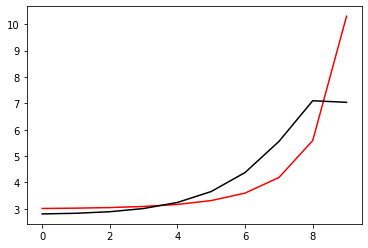

133100 0.010969279571808054
[2.93125619 2.92631076 2.95261548 3.03835908 3.22796326 3.59187522
 4.23568835 5.26455618 6.55288836 6.55370586]


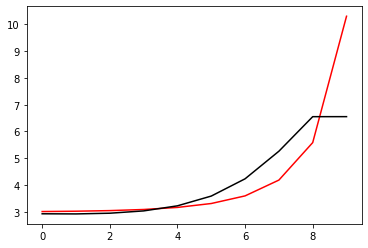

134200 0.02147991768009663
[2.85821295 2.86628254 2.90700309 3.01116762 3.22463083 3.61976714
 4.30434333 5.38813748 6.75103887 6.70005775]


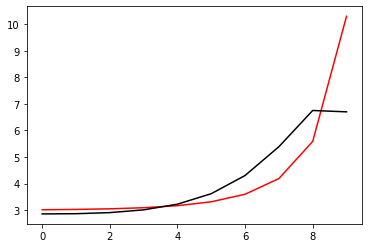

135300 0.1908766038515441
[3.05564506 3.0598964  3.09795749 3.20052766 3.41267095 3.80410499
 4.47735497 5.54225406 6.90360396 6.93860514]


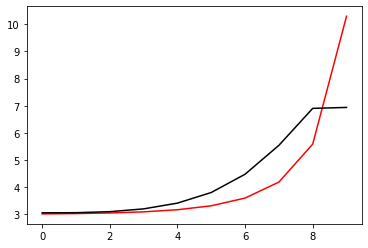

136400 0.03082893816432462
[2.90567916 2.90289867 2.9303398  3.01677371 3.20279517 3.54944871
 4.14279138 5.06901627 6.23822798 6.2381993 ]


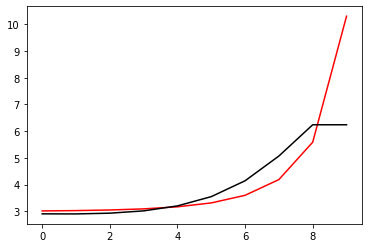

137500 0.011802323891586954
[2.89476846 2.89723472 2.9292711  3.02058573 3.21241598 3.56686917
 4.17223754 5.1183808  6.31373415 6.30064005]


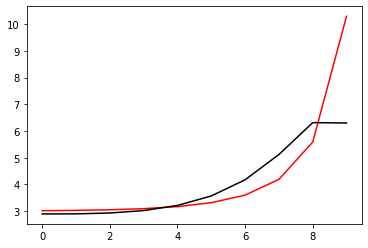

138600 0.010950698423072234
[2.87279483 2.88306787 2.9227781  3.02211592 3.22336553 3.59032135
 4.21482166 5.19283638 6.43132895 6.46905689]


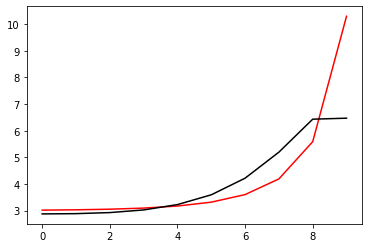

139700 0.011081903606258214
[2.89502361 2.91452625 2.96591721 3.07831917 3.29551017 3.68398217
 4.34044555 5.36670128 6.66126829 6.5771483 ]


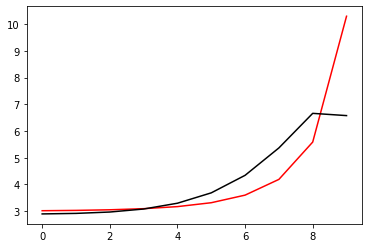

140800 0.001083500351892521
[2.95149143 2.96958066 3.02220247 3.13643608 3.35515263 3.74412679
 4.39937528 5.42737013 6.74881049 6.75927989]


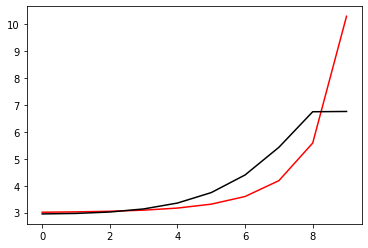

141900 0.011181212917321274
[2.87291821 2.89072782 2.94523709 3.06423721 3.29108931 3.6942186
 4.37795986 5.47076815 6.91139352 6.92062264]


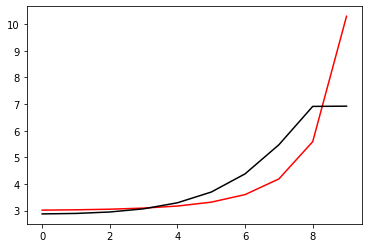

143000 0.011062683916211275
[2.92988174 2.91762522 2.9417399  3.03021961 3.22380973 3.58639269
 4.21442224 5.22267277 6.54966547 6.55177921]


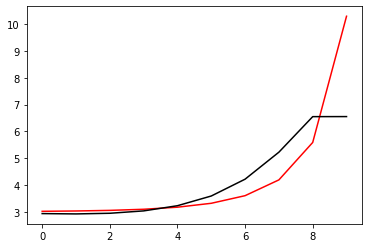

144100 0.011015966727993685
[2.9180426  2.918726   2.95248032 3.05064627 3.25482671 3.62953928
 4.27253258 5.30201847 6.66551543 6.66787031]


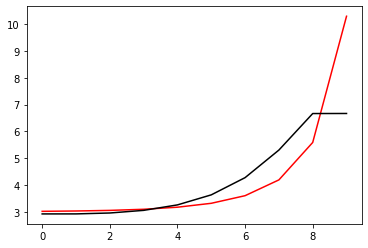

145200 0.021447303204648792
[2.84925965 2.85837914 2.9010917  3.00995249 3.22859902 3.62369693
 4.29679318 5.37353627 6.81392688 6.7611204 ]


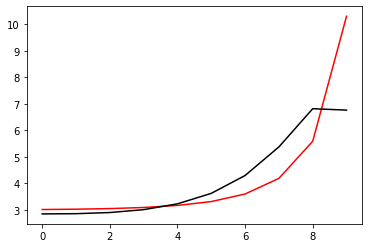

146300 0.018535799957744424
[2.99438057 2.98049279 2.99816019 3.07796086 3.26141461 3.61004461
 4.21417747 5.16985378 6.3978094  6.41986446]


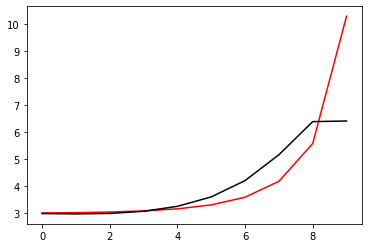

147400 0.030926221811311844
[2.91494538 2.90746905 2.93018524 3.01670102 3.20997685 3.57348406
 4.20015752 5.19013821 6.46713143 6.47583284]


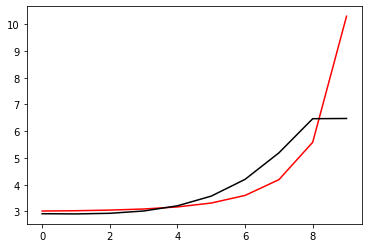

148500 0.011663430546527402
[2.86158291 2.8651797  2.89971573 2.99969099 3.21001179 3.59641129
 4.25475421 5.29025048 6.6309465  6.60650334]


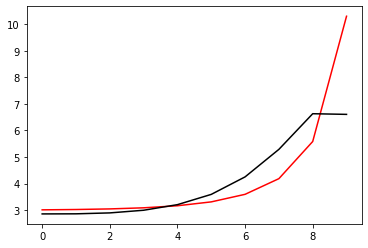

149600 0.011065117589552064
[2.94718704 2.95953694 3.0034493  3.11078365 3.32619449 3.71474961
 4.37131582 5.40630762 6.76757178 6.79195515]


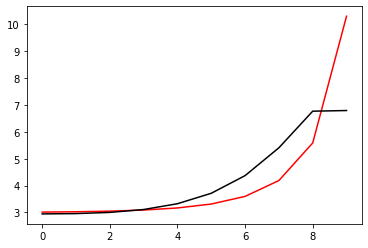

150700 0.01157775086145188
[2.93518061 2.92393541 2.94400432 3.02645079 3.21407287 3.56823025
 4.17024574 5.06901199 6.22555106 6.20063683]


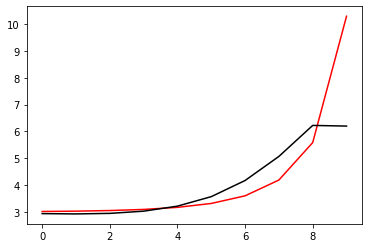

151800 0.000863370173210274
[2.92958564 2.92935948 2.95829509 3.04931823 3.24547979 3.60834619
 4.21974471 5.13510256 6.31489897 6.32594935]


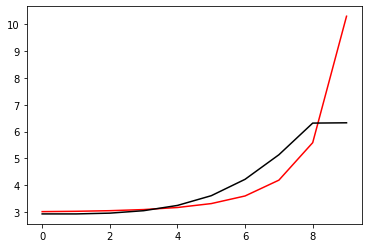

152900 0.01097738881098581
[2.94616936 2.95782481 2.99831106 3.09969371 3.3053018  3.67673676
 4.29643255 5.22939263 6.43719814 6.40271663]


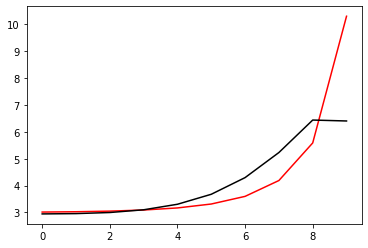

154000 0.030023926141077975
[2.80917432 2.83032677 2.88789818 3.01163491 3.24698049 3.66018726
 4.34169587 5.37327449 6.70596042 6.6568812 ]


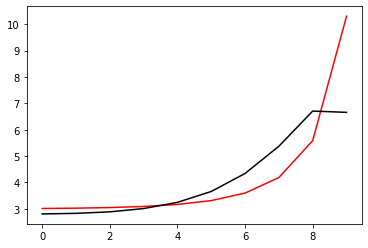

155100 0.010854252398576871
[2.93483694 2.93212205 2.96209518 3.05469904 3.2521856  3.61469375
 4.21939139 5.11729583 6.23316102 6.23252157]


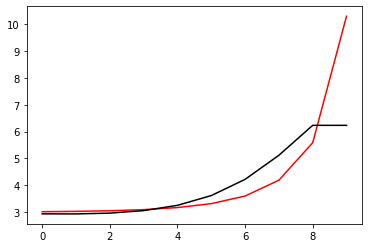

156200 0.02150669815930938
[2.85198499 2.86065246 2.9035016  3.01243764 3.2313325  3.62293733
 4.26871091 5.22815721 6.42025464 6.36907667]


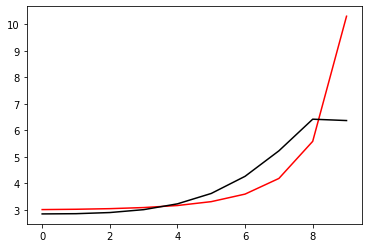

157300 0.012312549241941983
[2.9231367  2.92986528 2.97165059 3.08256812 3.30796878 3.71277948
 4.38287209 5.38825301 6.64130442 6.63928614]


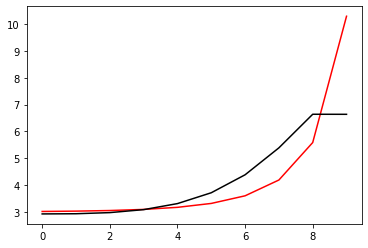

158400 0.07540064812780436
[2.76989191 2.77804626 2.82019496 2.92834792 3.14652031 3.53743106
 4.18795278 5.19467724 6.51858425 6.62916784]


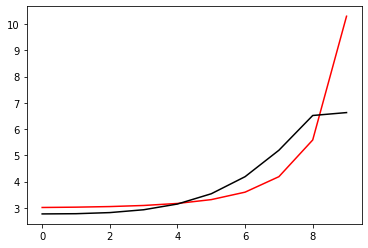

159500 0.020615377144797258
[3.00835057 3.01018545 3.04200449 3.13267916 3.32038814 3.65355229
 4.1737923  4.80685478 5.73254008 6.16320492]


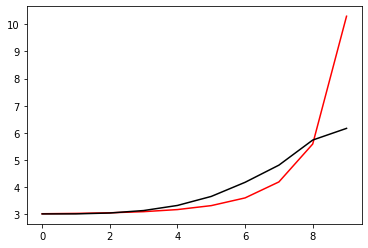

160600 0.01060021952794547
[2.95276214 2.96481627 3.00424872 3.09965026 3.28833391 3.61602059
 4.11590919 4.72798136 5.68317949 5.68445168]


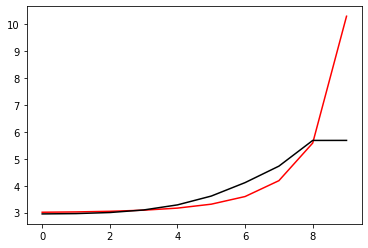

161700 0.017702692728572573
[2.8809732  2.89655646 2.94065469 3.04096854 3.23531365 3.57161116
 4.09624883 4.82205838 5.81700519 5.80097304]


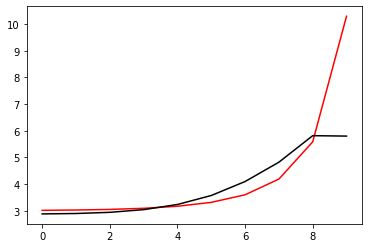

162800 0.000853388348000906
[2.90538166 2.92907831 2.98456776 3.09860074 3.31149632 3.67946782
 4.27760718 5.15264538 6.0840688  6.13170414]


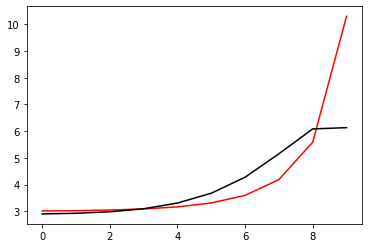

163900 0.010885970373713673
[2.90192257 2.92035949 2.97276303 3.0852209  3.29702538 3.665215
 4.2687354  5.18535826 6.20145953 6.13839137]


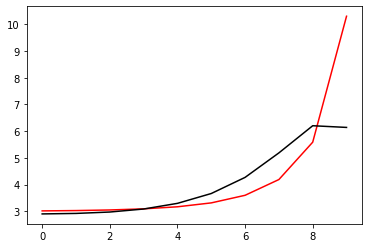

165000 0.010950922400674046
[2.88372005 2.89862394 2.94746896 3.0568831  3.26505901 3.62834912
 4.22725176 5.17026207 6.31954258 6.35789488]


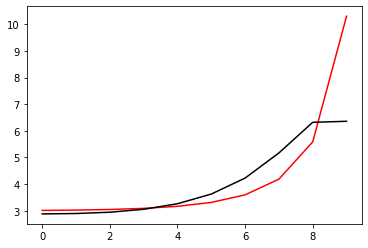

166100 0.012724588395364882
[2.92877491 2.91442619 2.93456685 3.01461909 3.19019337 3.51424062
 4.06504508 4.86647659 5.73585649 5.72097162]


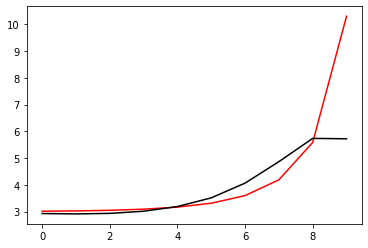

167200 0.025314689080634854
[2.91454835 2.9066613  2.93148027 3.0166518  3.19852382 3.53127309
 4.09439916 4.91698248 5.81745335 5.79423202]


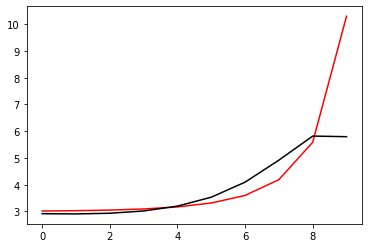

168300 0.019863357393557702
[2.89653293 2.89763339 2.92960292 3.02215805 3.21284358 3.55742495
 4.13684201 4.98788448 5.93187284 5.93974488]


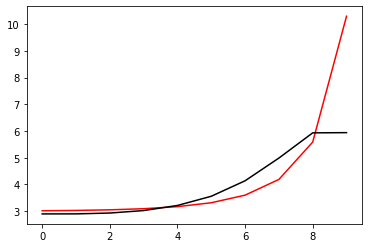

169400 0.030824992735983364
[2.87789049 2.88639963 2.9251461  3.02422226 3.22256138 3.57742306
 4.1708574  5.05079336 6.04800672 6.03198482]


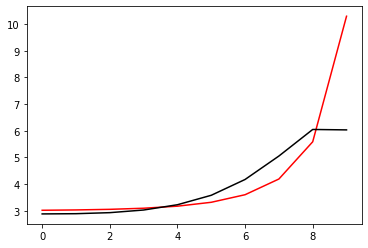

170500 0.020680421712024232
[3.01163934 3.00519386 3.02950342 3.11282002 3.29295326 3.62352541
 4.17657964 4.9969581  5.95279739 5.9863962 ]


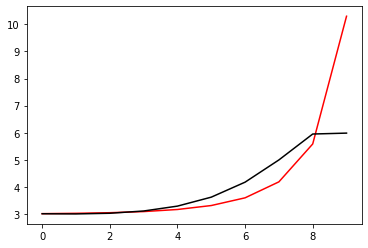

171600 0.010849231664865
[2.89060781 2.88631929 2.91190954 2.99880965 3.18732483 3.53646961
 4.13234069 5.06240469 6.20254611 6.23365954]


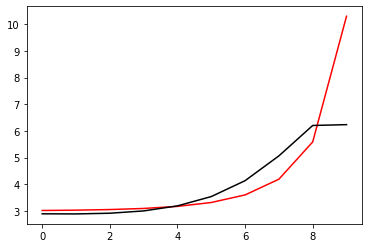

172700 0.010993270358418468
[2.98381661 2.98681527 3.02103801 3.11922484 3.32467499 3.70118676
 4.3414335  5.33958973 6.56241075 6.57047885]


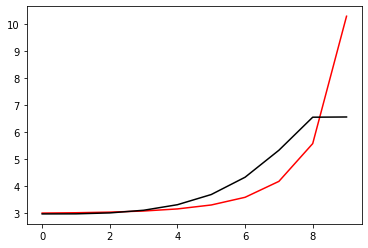

173800 0.0007930795891007967
[2.90765318 2.90503807 2.93128265 3.01736978 3.2041204  3.55063128
 4.1417067  5.05100141 6.09071123 6.11243302]


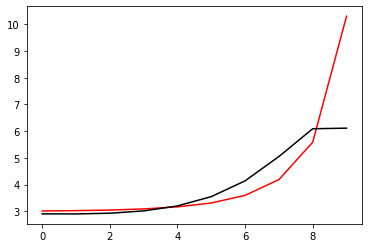

174900 0.010813654638836661
[2.91349134 2.9141293  2.94321432 3.03214235 3.22214628 3.5729674
 4.17025947 5.08865028 6.13980479 6.14257876]


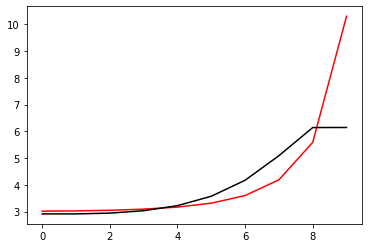

176000 0.01099708616214935
[2.91151454 2.91738309 2.951496   3.04546988 3.24128104 3.59989345
 4.20883269 5.14558927 6.22184879 6.22026311]


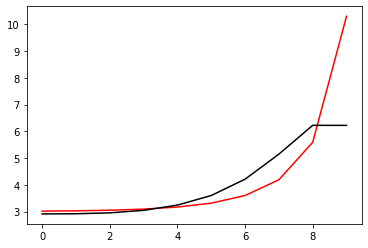

177100 0.01094027728838589
[2.90442617 2.91793967 2.960503   3.0630354  3.26862402 3.64023039
 4.2684936  5.23593469 6.35547393 6.34777576]


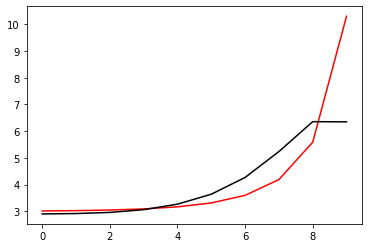

178200 0.02146890175402965
[2.83205399 2.85707687 2.91496842 3.03468263 3.26128509 3.66259501
 4.33830379 5.38546441 6.61312836 6.5448865 ]


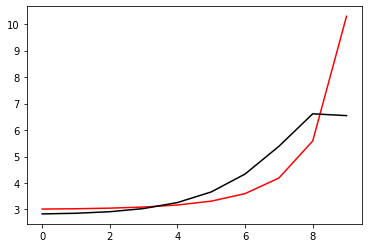

179300 0.021930974634152972
[2.95994733 2.98621627 3.0503644  3.17866645 3.4153938  3.82902635
 4.51933407 5.58469965 6.85252069 6.78493327]


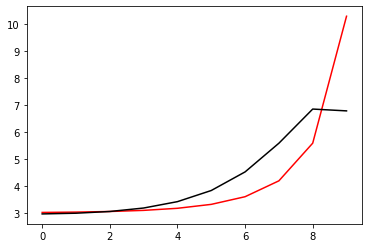

180400 0.03088523159082151
[2.90107205 2.90243462 2.9421443  3.04410807 3.24885627 3.61983841
 4.24554842 5.16716956 6.20360093 6.23531522]


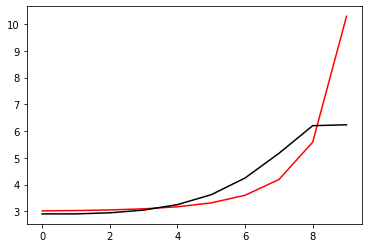

181500 0.011310365634657111
[2.85837003 2.86899114 2.91735026 3.03014542 3.2483334  3.63599279
 4.28208653 5.2338211  6.31366856 6.2988231 ]


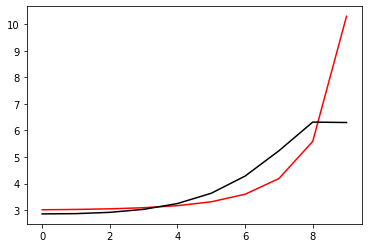

182600 0.011033185070783718
[2.9813125  2.98733948 3.03234657 3.14350978 3.36151254 3.7492067
 4.39366583 5.35005146 6.45291981 6.48855825]


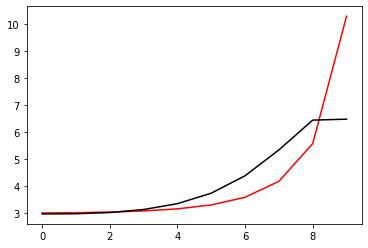

183700 0.011095579700423238
[2.89842874 2.91429961 2.96858881 3.09142947 3.32500505 3.73359443
 4.40685555 5.41364923 6.5995813  6.50949225]


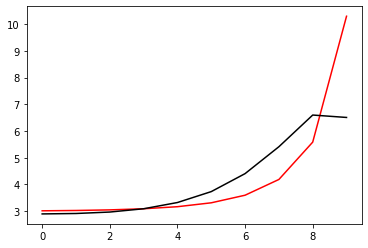

184800 0.0008206454400771714
[2.93489447 2.92552636 2.95244667 3.04431504 3.24027625 3.59792825
 4.19520654 5.09337008 6.16466001 6.17858195]


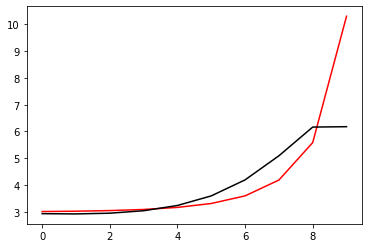

185900 0.010887924393585963
[2.92181856 2.92273551 2.95790612 3.05861402 3.26486644 3.63517525
 4.24933237 5.17412738 6.28880968 6.29597586]


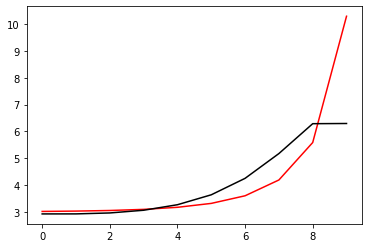

187000 0.01103592464173941
[2.87785357 2.88971345 2.93649615 3.05023589 3.27289671 3.66528458
 4.31139641 5.2877046  6.4827261  6.45493924]


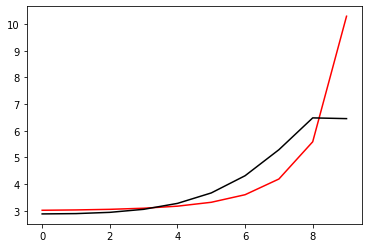

188100 0.011178961575448728
[2.85313893 2.87352998 2.93187656 3.05802327 3.29504121 3.70569458
 4.37826479 5.40220641 6.68361723 6.70771124]


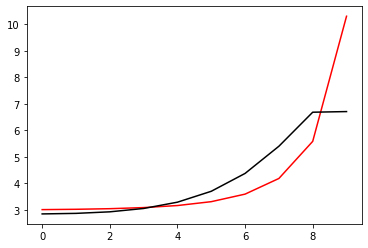

189200 0.03245421322337625
[2.95508786 2.94150762 2.96789306 3.06298267 3.26788585 3.6430586
 4.27345442 5.23443001 6.36521872 6.81637545]


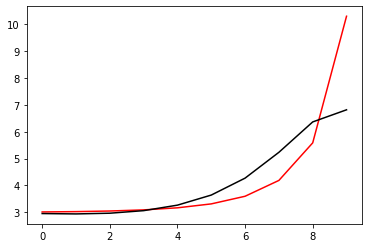

190300 0.013082440852067601
[2.90871409 2.90594059 2.94014513 3.04382686 3.25874109 3.64611259
 4.29196894 5.27456936 6.43976356 6.40503294]


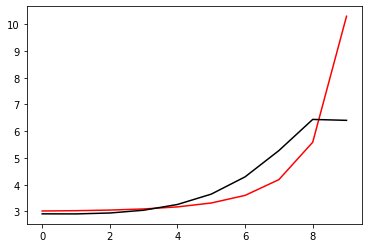

191400 0.0310671561282446
[2.90137362 2.91211718 2.95871036 3.07491495 3.30376037 3.7074308
 4.37323451 5.38358275 6.59476985 6.61207473]


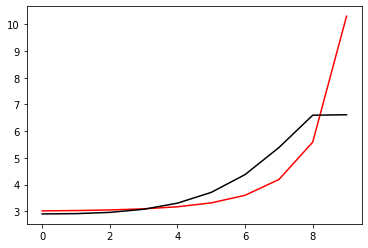

192500 0.019542107047701318
[2.93076302 2.93655796 2.97730894 3.08718858 3.30971397 3.70699483
 4.36693274 5.37965181 6.62552709 6.62429289]


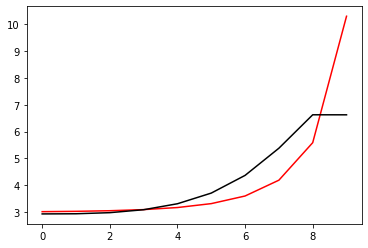

193600 0.011054242794334033
[2.94737211 2.95800246 3.00245044 3.1134256  3.33462329 3.72824837
 4.3831932  5.39956949 6.69391906 6.68803655]


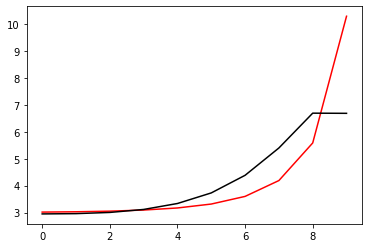

194700 0.0143577611561249
[2.92558216 2.91062833 2.92812251 3.01021563 3.19904145 3.55365906
 4.14808976 4.95921225 6.02751259 6.01827983]


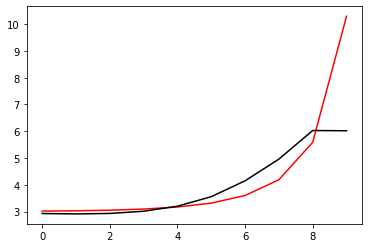

195800 0.0007936608578525206
[2.91842841 2.91352761 2.93828248 3.02697826 3.22214773 3.58300093
 4.18295899 5.01202575 6.10010108 6.09556141]


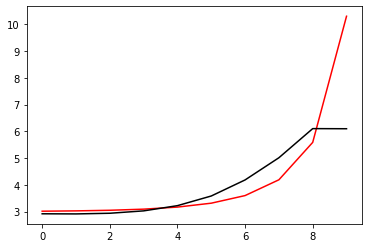

196900 0.010843282121984123
[2.93615738 2.94214637 2.97632101 3.07253481 3.2737768  3.63907553
 4.24112886 5.08905846 6.1993249  6.20476841]


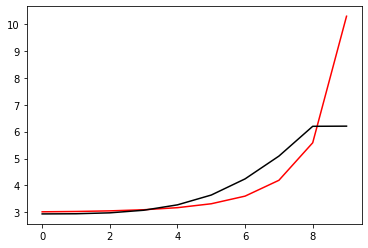

198000 0.010867686857019193
[2.92716966 2.91796496 2.93619371 3.01563069 3.19880415 3.54364493
 4.12279413 4.97327993 6.10939275 6.12069775]


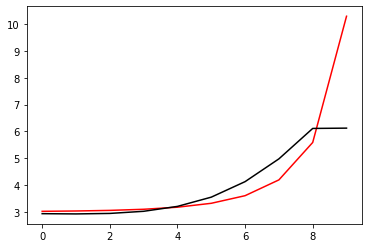

199100 0.010992514721140215
[2.91174469 2.91214032 2.94008436 3.03054874 3.22821311 3.5948627
 4.21175571 5.14489431 6.37157459 6.38210895]


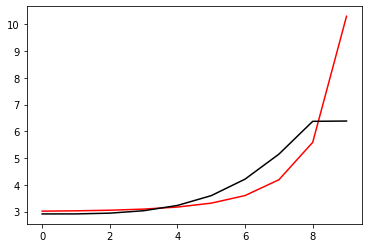

200200 0.022279244729150247
[2.90261352 2.88872896 2.90013862 2.97223074 3.14875235 3.48896547
 4.06926602 4.95770894 6.15260578 6.05873   ]


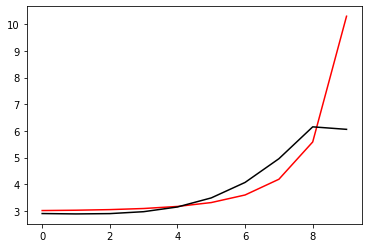

201300 0.020532558591968147
[3.02257053 3.01114755 3.02446047 3.09813575 3.27672704 3.6205279
 4.20848393 5.11569994 6.32777956 6.42827775]


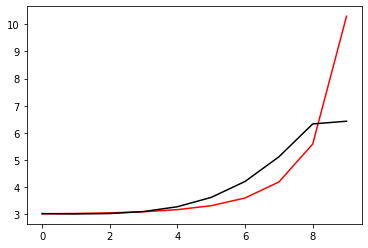

202400 0.0336432847221866
[2.87495089 2.86889325 2.88681137 2.96353882 3.14379528 3.48893496
 4.08319437 5.02871721 6.39148143 6.56042033]


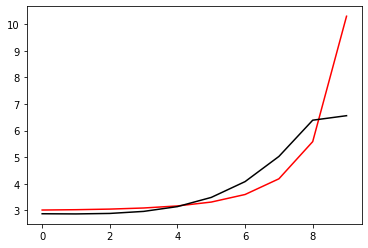

203500 0.02066431836027662
[3.03315493 3.01946964 3.02707644 3.08952688 3.24872853 3.55980335
 4.09194496 4.90889378 6.12381112 6.28693319]


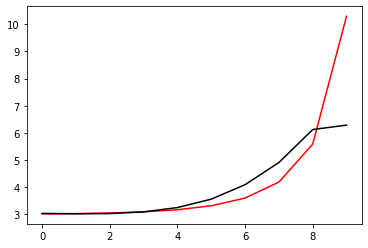

204600 0.010871934960207594
[2.90588783 2.89482556 2.90489656 2.97100764 3.1370682  3.46427216
 4.0440514  5.01685374 6.42822769 6.43695014]


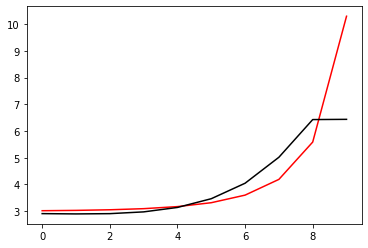

205700 0.01086938001381436
[2.9944271  2.98959346 3.00644105 3.07874903 3.25093434 3.58636196
 4.17934077 5.156623   6.56446705 6.57905084]


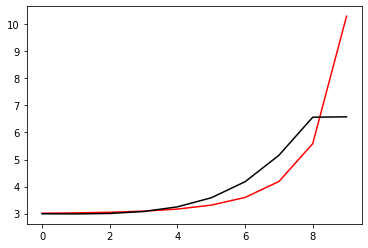

206800 0.0007529553543537552
[2.94615508 2.95505876 2.98352131 3.06231205 3.23309078 3.55447141
 4.11148768 5.01441133 6.20510603 6.24450948]


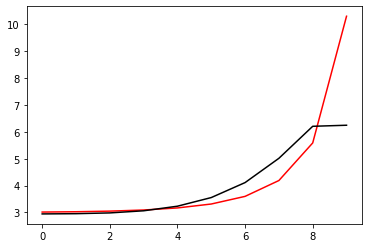

207900 0.010798586367925345
[2.92285649 2.9348584  2.96740826 3.05050922 3.22641456 3.55538555
 4.12647317 5.05467275 6.26881905 6.27064781]


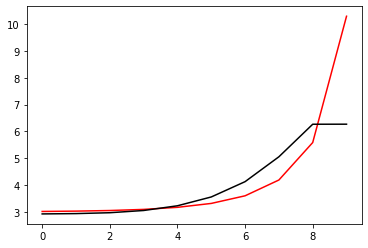

209000 0.011049623260595292
[2.90962296 2.92671144 2.96636972 3.05720587 3.24237808 3.58484112
 4.17931074 5.14366071 6.38301271 6.38061228]


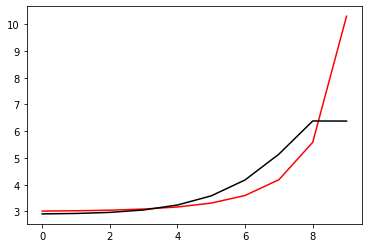

210100 0.010977137754832939
[2.8984175  2.92191843 2.97190622 3.07442704 3.27349734 3.63571419
 4.26277477 5.27532479 6.55167454 6.55988474]


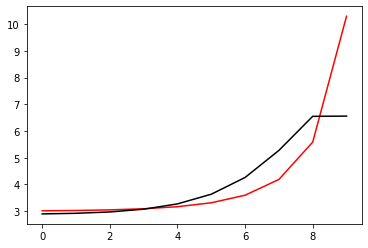

211200 0.021491105588878696
[2.85210031 2.86841653 2.9174012  3.0240769  3.23244713 3.61328718
 4.27893152 5.37035687 6.75471743 6.7128771 ]


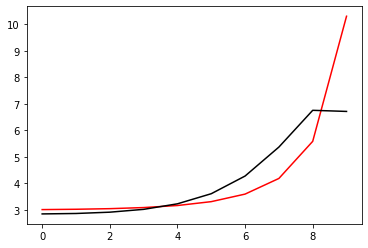

212300 0.06014740852485663
[3.01740578 3.02929006 3.07779537 3.1875479  3.40168147 3.79099207
 4.46481255 5.5444235  6.9153228  7.00895545]


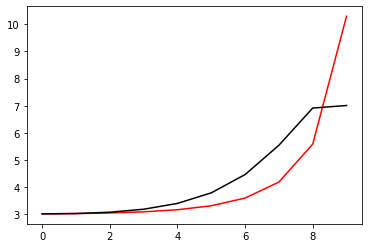

213400 0.03084906351748757
[2.89107397 2.91118015 2.96371654 3.07152115 3.27317335 3.62858437
 4.21608153 5.08173019 6.21490959 6.20621069]


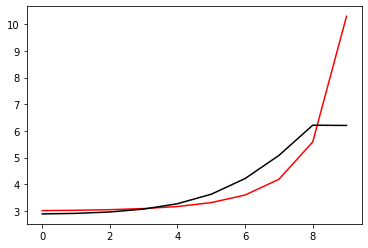

214500 0.011367154723251869
[2.83873799 2.86639125 2.92853366 3.04821562 3.26573782 3.64630114
 4.28523255 5.2539678  6.41198375 6.38389923]


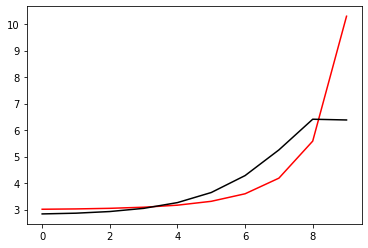

215600 0.011162468898125378
[2.85522264 2.88850942 2.96073688 3.09428028 3.33119827 3.74210319
 4.43392733 5.48152273 6.64825088 6.668232  ]


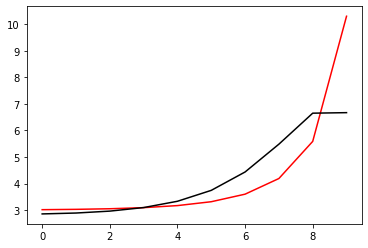

216700 0.016234395821917644
[2.83572369 2.86299721 2.92973687 3.05516564 3.27617131 3.65283036
 4.26504435 5.14010751 6.09180723 6.17216507]


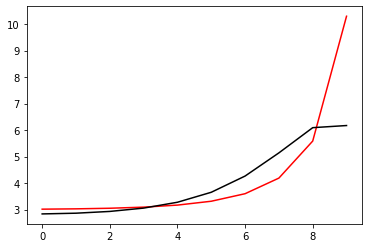

217800 0.0009481899500279766
[2.86531801 2.89479871 2.96445299 3.09418604 3.32121418 3.7064594
 4.33119831 5.2241169  6.18227603 6.17524289]


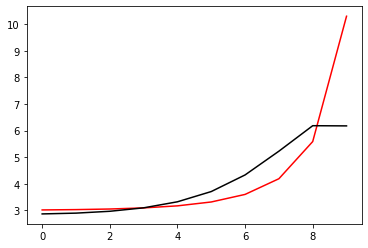

218900 0.011050702938784584
[2.86062475 2.89521752 2.97188241 3.11086988 3.35019282 3.75282109
 4.4048664  5.34511508 6.34466454 6.35049249]


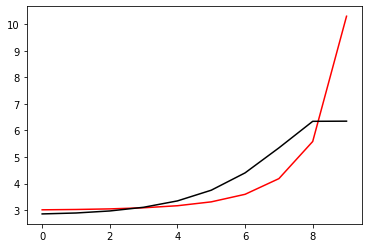

220000 0.011193918029085814
[2.84360481 2.88150767 2.96449581 3.11202262 3.36187974 3.77716381
 4.44575989 5.42287695 6.48590564 6.48640685]


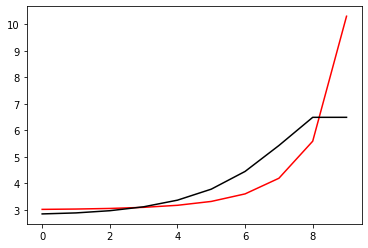

221100 0.0109211155597332
[2.85588233 2.89443871 2.97675714 3.12018475 3.35792157 3.74176397
 4.32673257 5.09760953 5.93387141 5.93496284]


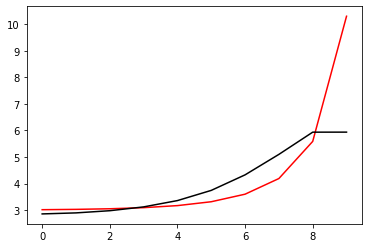

222200 0.02211083269120734
[2.81703695 2.85939569 2.94722724 3.09787715 3.34540522 3.74440032
 4.36064069 5.20281164 6.07485303 6.04223271]


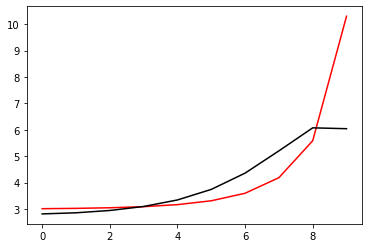

223300 0.012813758377557875
[2.85932239 2.90708377 3.00425591 3.16850726 3.43596826 3.86696424
 4.54182915 5.47061501 6.34035502 6.26959212]


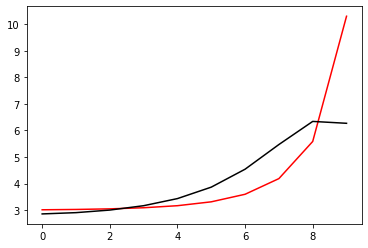

224400 0.1128072671314598
[2.66329803 2.69525969 2.78087442 2.93694763 3.19824395 3.62356788
 4.29192154 5.21766114 6.07527503 6.53357575]


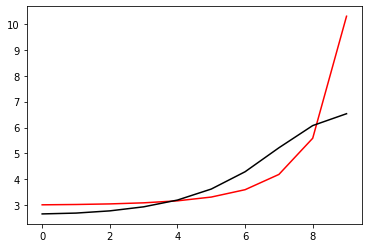

225500 0.011568615750890963
[2.83394961 2.85929722 2.93553474 3.0807568  3.32775376 3.73171352
 4.36626542 5.24579855 6.05867927 6.04230026]


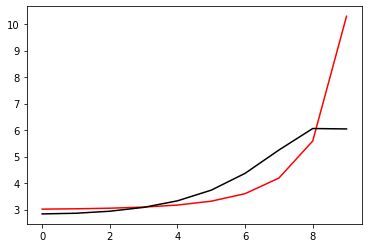

226600 0.011176468257120948
[2.81611729 2.84830033 2.93128522 3.08562296 3.34495433 3.76513547
 4.42150184 5.33895443 6.22540575 6.23720508]


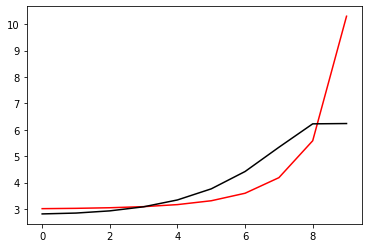

227700 0.011146667012027751
[2.89845386 2.93561546 3.02352399 3.18322808 3.44830679 3.87299473
 4.53087872 5.4568124  6.39096234 6.38156358]


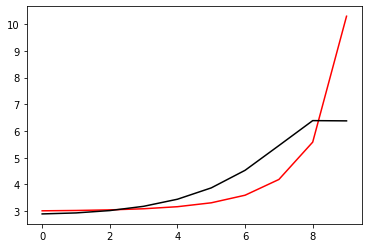

228800 0.0012299541168230956
[2.89805559 2.93557812 3.02519589 3.18876149 3.46061839 3.89504287
 4.56753546 5.53098115 6.57158095 6.58115794]


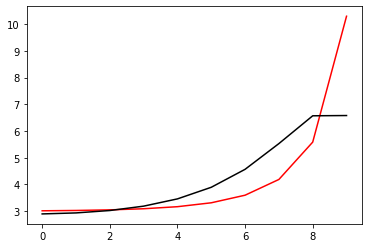

229900 0.010725333009314155
[2.878937   2.872838   2.91632198 3.0294652  3.24097107 3.59462486
 4.14675737 4.90220681 5.54388651 5.54778077]


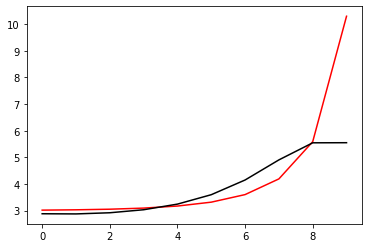

231000 0.01081729077827234
[2.88757685 2.88697575 2.93315522 3.04917135 3.26424562 3.62260929
 4.18118534 4.94722458 5.60900341 5.60948072]


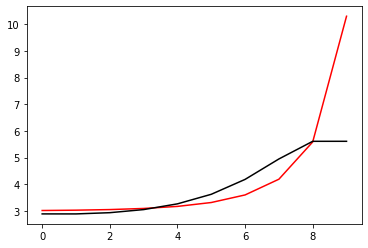

232100 0.010973516646183153
[2.89222096 2.89987075 2.95123433 3.07250637 3.29417672 3.66147034
 4.23278363 5.02004733 5.72043419 5.71284537]


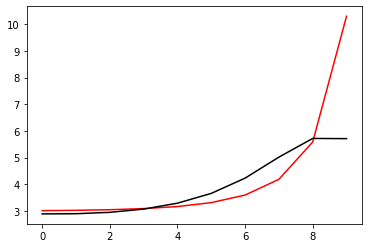

233200 0.02174980765181032
[2.82451811 2.84357467 2.90503202 3.03735753 3.2740917  3.66393925
 4.2713704  5.12085447 5.92109185 5.85675171]


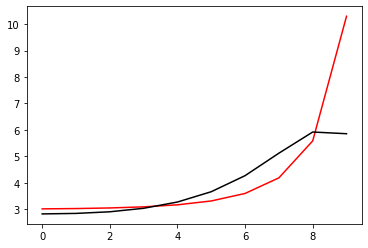

234300 0.01274144916100626
[2.89243388 2.9171758  2.9844965  3.12536988 3.37734965 3.79407653
 4.44774423 5.37381394 6.27719595 6.22105777]


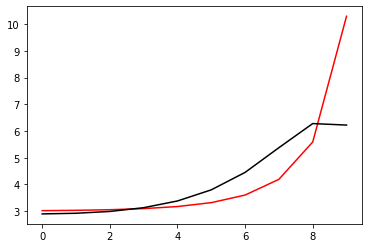

235400 0.42276691536152516
[2.59291302 2.60404335 2.65983882 2.78745468 3.0242597  3.42206193
 4.04727374 4.93654338 5.85999549 6.25788197]


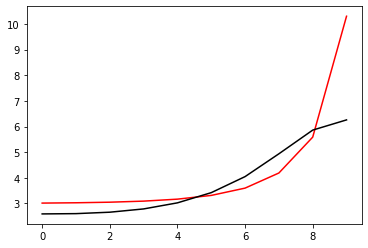

236500 0.012820022024356297
[2.89686464 2.89206405 2.92945687 3.03522544 3.24263442 3.59598305
 4.14817316 4.91810505 5.67988166 5.67032101]


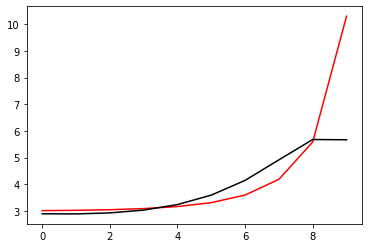

237600 0.010777145887674073
[2.87510741 2.87679823 2.9186806  3.02920037 3.24248624 3.6042983
 4.17042754 4.96512718 5.7663628  5.77403173]


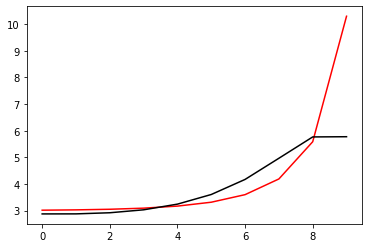

238700 0.011333055843050376
[2.89580856 2.90686127 2.95629851 3.07419985 3.29603803 3.66928202
 4.25263637 5.07526464 5.91905065 5.86870636]


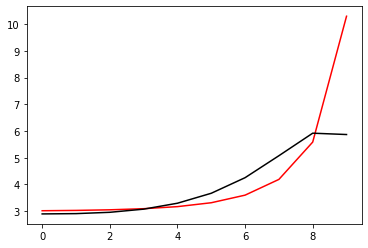

239800 0.0008186729843424694
[2.99448022 2.99240321 3.0291317  3.13530767 3.34703529 3.71215234
 4.29035792 5.11751188 5.99822468 6.04285938]


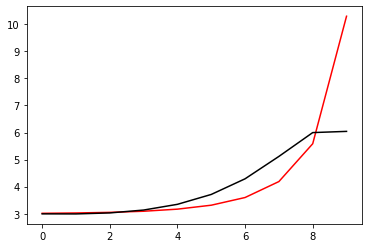

240900 0.010884045214811408
[2.95934584 2.95766738 2.99069495 3.09065259 3.29380231 3.6471749
 4.20951505 5.02582557 5.9572427  5.94227108]


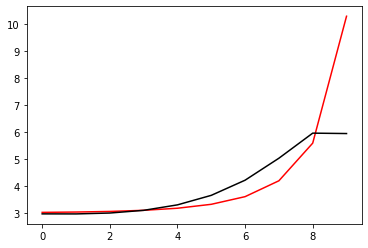

242000 0.010971087689808841
[2.90738824 2.90528307 2.93644499 3.03635031 3.24533391 3.6178942
 4.23116943 5.17406473 6.31067592 6.34616714]


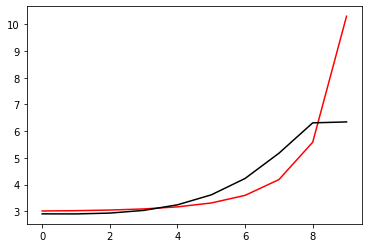

243100 0.010952260881579474
[2.91267086 2.91215975 2.94282736 3.04043271 3.24641751 3.61630643
 4.22778423 5.16486854 6.34847293 6.2811027 ]


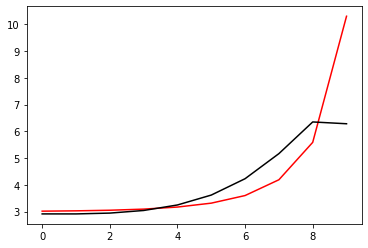

244200 0.023354129089594985
[2.84988859 2.84580318 2.87271777 2.96773609 3.17581959 3.55980696
 4.21533551 5.27112401 6.65462441 6.52254426]


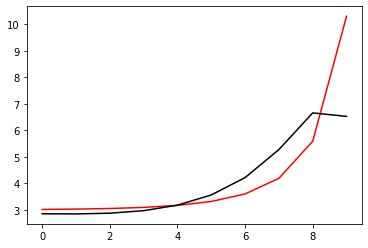

245300 0.019338966485505357
[2.98424621 2.98094537 3.00197826 3.08288973 3.26376558 3.59287391
 4.11251775 4.76648686 5.74312064 5.78908858]


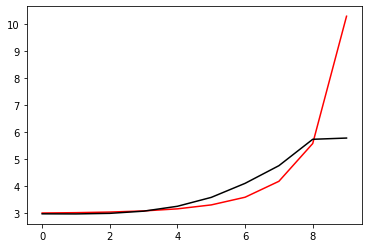

246400 0.030666040468541312
[2.91346631 2.91494031 2.94047135 3.02481271 3.20846408 3.54053037
 4.06932542 4.79815831 5.82320474 5.82643515]


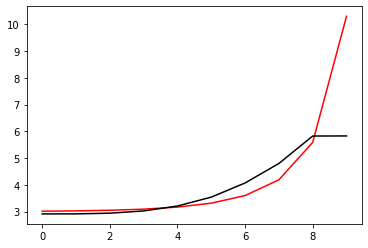

247500 0.011317822137895197
[2.86320708 2.87441873 2.9115736  3.00829884 3.20772733 3.56643857
 4.15986269 5.05386445 6.07456544 6.04104553]


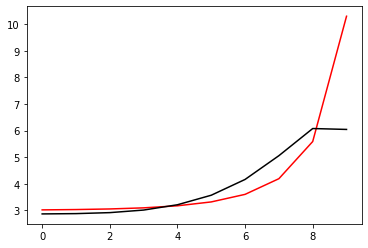

248600 0.010863356011431404
[2.99636766 2.99899304 3.03127544 3.12491153 3.32367681 3.68764626
 4.29823456 5.20896749 6.1994575  6.20545609]


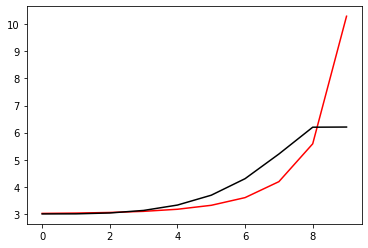

249700 0.010869045850655318
[2.99094384 2.99473377 3.02797974 3.12170041 3.31869329 3.67915854
 4.28419935 5.20440596 6.29789431 6.30205872]


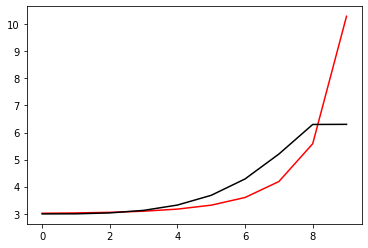

250800 0.0020407422925320627
[2.89040111 2.87491154 2.88952903 2.96279705 3.1346061  3.46238367
 4.03074042 4.86467872 5.76943307 5.80308792]


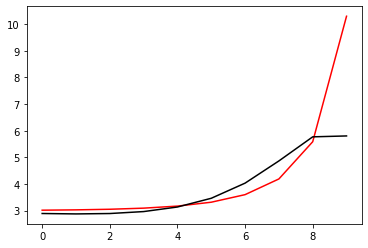

251900 0.01069488958978655
[2.90923517 2.89544912 2.91020535 2.98350516 3.15521721 3.48278435
 4.04981963 4.88414387 5.79478128 5.79607623]


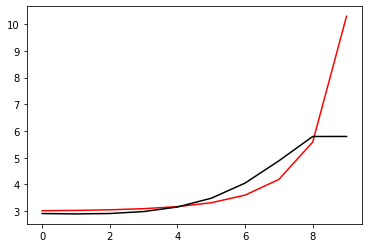

253000 0.010793860891143824
[2.91232894 2.90524293 2.92468221 3.00228404 3.17847037 3.51143075
 4.08459049 4.93180774 5.86716889 5.86612018]


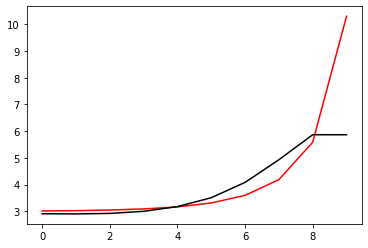

254100 0.010877309787114698
[2.9237289  2.9272769  2.95659715 3.04374066 3.23042515 3.57653249
 4.16634783 5.04323233 6.0269214  5.98158606]


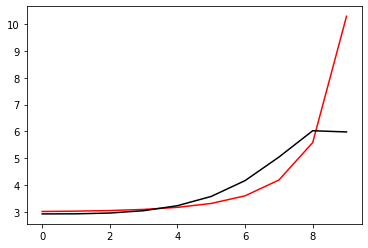

255200 0.022685959031895495
[2.83210973 2.84828902 2.89294081 2.99687052 3.20413269 3.57913462
 4.21290581 5.16998825 6.27667288 6.22188739]


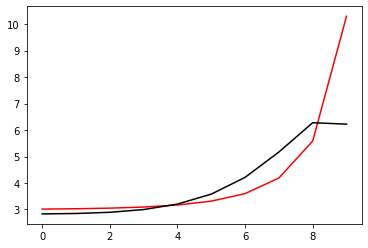

256300 0.018265178803053242
[2.91038638 2.90482238 2.92799101 3.01209971 3.20057669 3.55710366
 4.17297499 5.1324326  6.28897298 6.35435369]


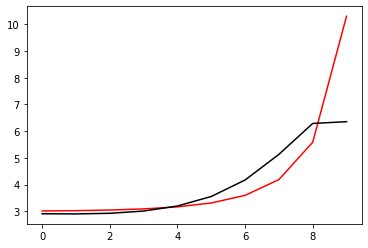

257400 0.15619428113012776
[2.70524523 2.69962027 2.72517801 2.8166241  3.0211364  3.40996063
 4.09009216 5.16466002 6.43839347 6.81650886]


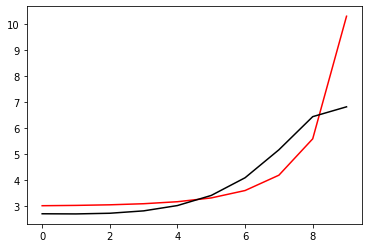

258500 0.012545926725143807
[2.88941498 2.90161917 2.94039272 3.0383019  3.23920262 3.60462564
 4.2084611  5.06456152 6.12329419 6.09759121]


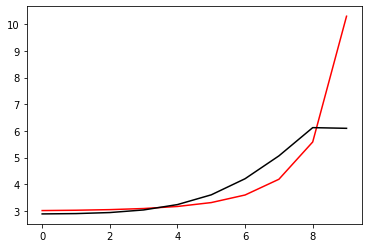

259600 0.011001741276132865
[2.85577    2.87386878 2.92086621 3.02789133 3.24023786 3.62351287
 4.26612455 5.23054687 6.31381874 6.31726269]


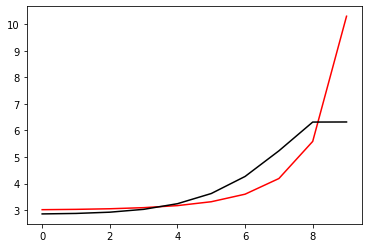

260700 0.011205355383528497
[2.87007046 2.89218331 2.94888563 3.06904571 3.30006509 3.71479075
 4.42159126 5.51069935 6.6220648  6.61701284]


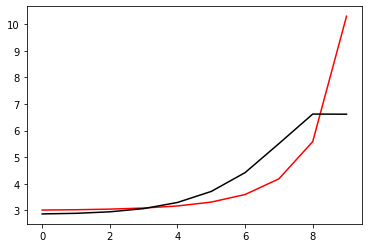

261800 0.0012233574782909826
[2.92778067 2.954407   3.01902891 3.14819093 3.38809499 3.81145786
 4.52344463 5.60919808 6.76366781 6.76754478]


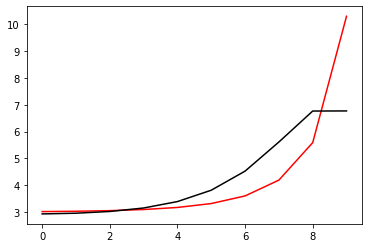

262900 0.010740737245074352
[2.98105862 2.94802162 2.95218193 3.0176135  3.18420938 3.51477582
 4.10071414 4.99643523 5.72387903 5.74462421]


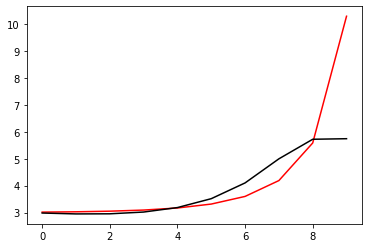

264000 0.011091356925548291
[2.95740167 2.93138658 2.93948399 3.00971311 3.1824038  3.5210952
 4.1181249  5.03030619 5.79380775 5.79253509]


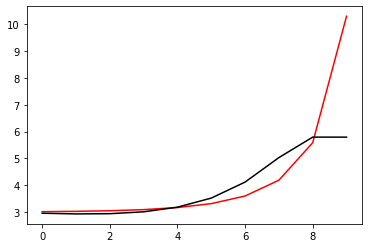

265100 0.010943862188448183
[2.94507617 2.9292947  2.94361911 3.02019036 3.20013832 3.54750969
 4.1550594  5.08243378 5.88957418 5.8668742 ]


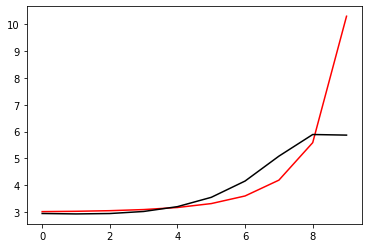

266200 0.021673700266208074
[2.86951942 2.86760551 2.89372954 2.98275824 3.17816693 3.54608677
 4.18211145 5.15315203 6.05496858 6.01578264]


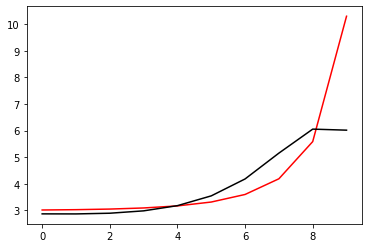

267300 0.016374952733877565
[2.95969348 2.95929384 2.98988454 3.08598656 3.29387079 3.68214879
 4.34856767 5.36583072 6.37127412 6.4490128 ]


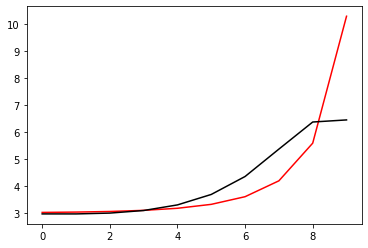

268400 0.03073962787006017
[2.95068358 2.93691423 2.95113114 3.02593513 3.2038869  3.54483851
 4.12688937 4.99537019 5.84490722 5.96832018]


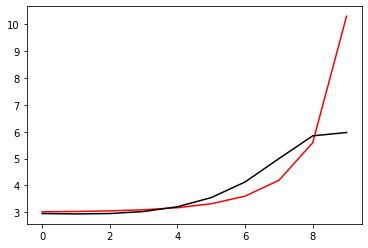

269500 0.01272469922140433
[2.91645311 2.90808813 2.9267902  3.00629883 3.19000841 3.53941655
 4.13631977 5.03177877 5.91610416 5.90475911]


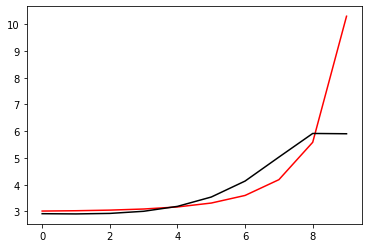

270600 0.010829548247160623
[2.88994348 2.8888919  2.9140877  3.00004218 3.19123781 3.55101
 4.16483041 5.08912027 6.01273735 6.01808197]


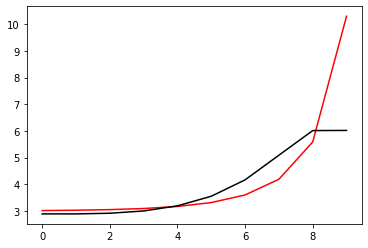

271700 0.010974421747118426
[2.92108285 2.93010887 2.96592273 3.06256955 3.26606091 3.64208185
 4.27905761 5.23248832 6.18647174 6.11302208]


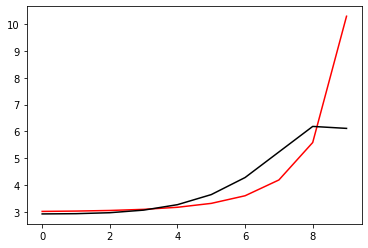

272800 0.0009313283472069836
[2.91497756 2.92390486 2.96202006 3.0613853  3.26811339 3.64881264
 4.29411023 5.27121646 6.29796553 6.32895929]


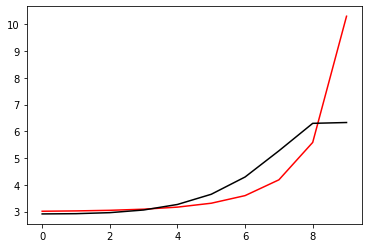

273900 0.010922793697834936
[2.93216022 2.9401981  2.97691346 3.07399593 3.27602094 3.64754576
 4.27675847 5.24559991 6.3523605  6.31994716]


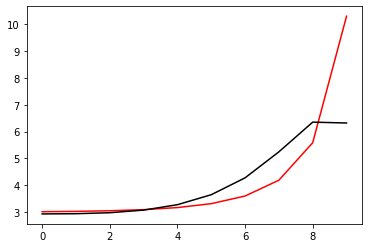

275000 0.011516791860187833
[2.96787655 2.94476257 2.95259489 3.02100665 3.19143685 3.52244179
 4.08523917 4.90028821 5.8132189  5.81322633]


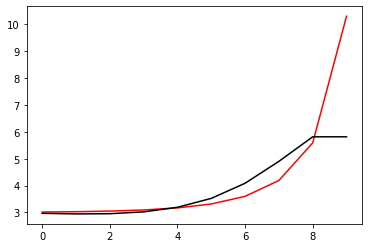

276100 0.01093478890261493
[2.95150206 2.93511879 2.94760691 3.02101835 3.19740855 3.53641039
 4.11158907 4.9498357  5.89446093 5.89035404]


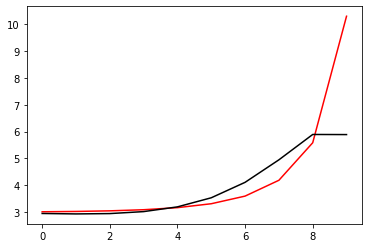

277200 0.022810374300263406
[2.89681684 2.89131893 2.91306139 2.99640305 3.18498481 3.54100131
 4.14363787 5.03275865 6.04669573 6.01295037]


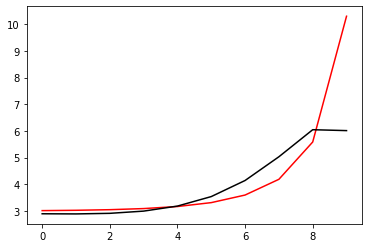

278300 0.01602977817898392
[2.91724622 2.91632433 2.94278894 3.03075607 3.22490126 3.58836967
 4.20283634 5.11959845 6.18122575 6.23635921]


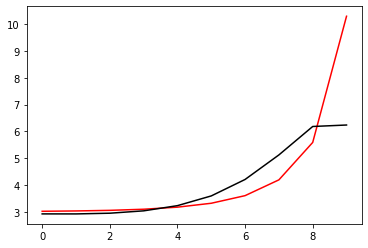

279400 0.03101408407052222
[2.95854151 2.9713443  3.01191312 3.11441667 3.3244115  3.70618311
 4.34381088 5.2975928  6.41096109 6.4440917 ]


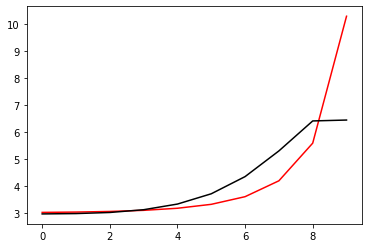

280500 0.01121484139891574
[2.88382887 2.88081581 2.90695661 2.99168059 3.17663842 3.51910015
 4.09065534 4.93967034 5.92173904 5.98551319]


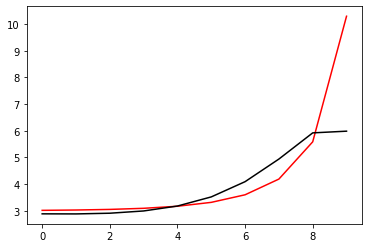

281600 0.010766896381024774
[2.89216671 2.89217801 2.9207492  3.00800976 3.19581358 3.54195908
 4.11905564 4.97674744 5.96816588 5.96767977]


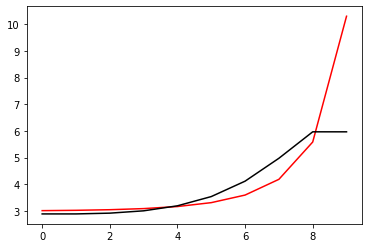

282700 0.01201790171085051
[2.90667874 2.91371967 2.94903204 3.04337226 3.23932612 3.59616468
 4.18900159 5.06892616 6.07948895 6.04592674]


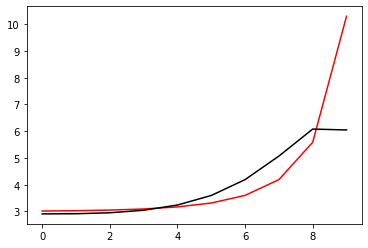

283800 0.0008645433752518726
[2.91820897 2.93288478 2.9765998  3.07940036 3.28450344 3.65267256
 4.26194158 5.16763552 6.20856462 6.27233478]


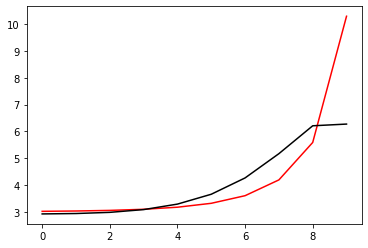

284900 0.010957078245383087
[2.92669709 2.94339076 2.99206114 3.10134615 3.31458015 3.6942737
 4.32307369 5.26685394 6.36687841 6.32617728]


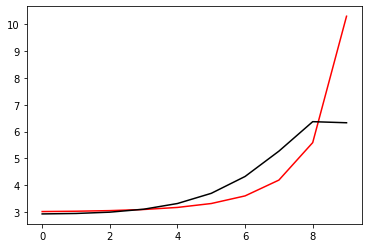

286000 0.043408230873059395
[2.80700351 2.82560932 2.87945927 2.99668028 3.22076781 3.61747015
 4.28100564 5.30991284 6.5597251  6.52789859]


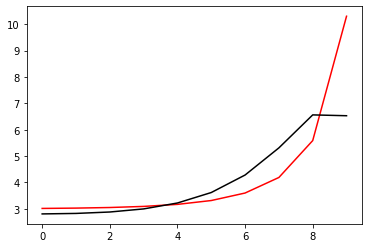

287100 0.01111479649695863
[2.98661542 2.95401599 2.95188592 3.00845209 3.16233514 3.47001291
 4.00638354 4.79537987 5.57046072 5.55035733]


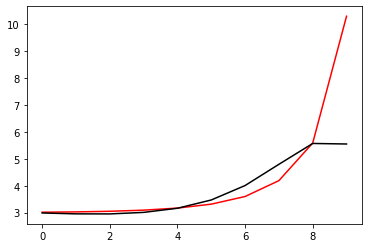

288200 0.025824910622452346
[2.93557209 2.91415995 2.92011567 2.98628507 3.15270322 3.47773013
 4.03910462 4.86880006 5.71101101 5.67687266]


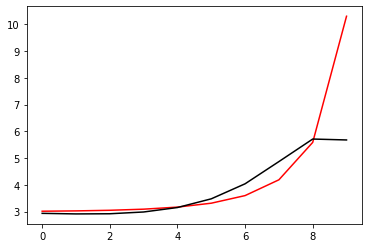

289300 0.01984267556394484
[2.91809537 2.91142203 2.92925434 3.0071007  3.18683734 3.52826007
 4.11118372 4.97714216 5.88664984 5.88364602]


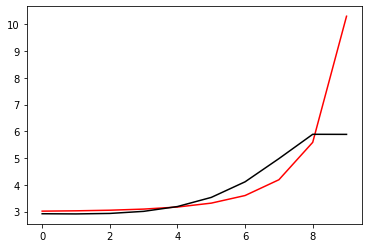

290400 0.03093341704682131
[2.9258622  2.93897885 2.97923514 3.08121001 3.29018125 3.67013772
 4.30684337 5.25509551 6.28470526 6.32000988]


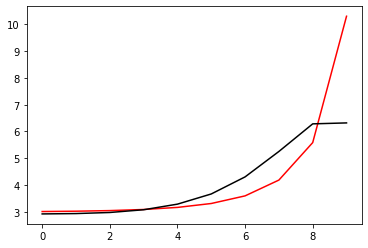

291500 0.01677436912396613
[2.95008237 2.93180689 2.94556362 3.02135396 3.20279355 3.551694
 4.14977906 5.04824136 6.01743132 6.04432291]


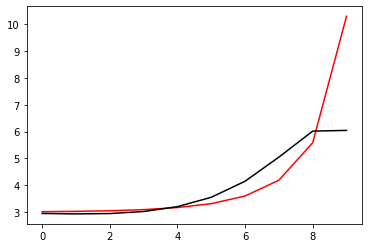

292600 0.010839742457354331
[2.89843789 2.88671297 2.90479942 2.98595558 3.17436518 3.53295869
 4.14529814 5.06750955 6.07923341 6.07929792]


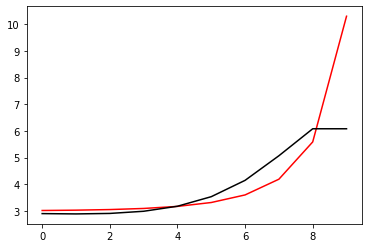

293700 0.01098915165778811
[2.93141327 2.93306887 2.96205021 3.05273541 3.24956019 3.61543887
 4.23430427 5.16774731 6.21172837 6.15885128]


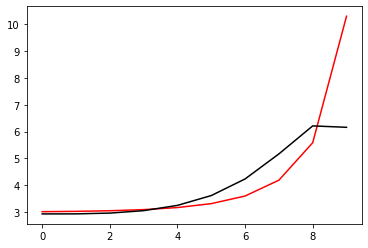

294800 0.003139084388121467
[2.87970122 2.87045327 2.88787178 2.96595941 3.14837875 3.49639618
 4.0929822  5.01220117 6.0951194  6.22227952]


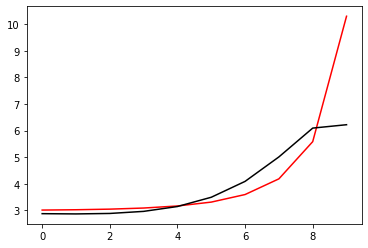

295900 0.010964981885441729
[2.94963405 2.95835417 2.9942543  3.09110003 3.29341964 3.66381472
 4.28738873 5.24209879 6.3795688  6.37374669]


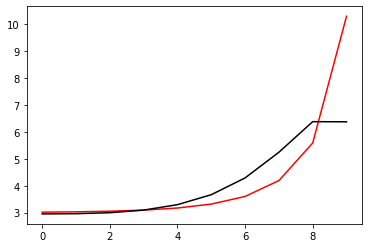

297000 0.02327073088350507
[2.84108837 2.84284958 2.877356   2.9785442  3.19417138 3.59437879
 4.28240477 5.3778476  6.73622445 6.65418737]


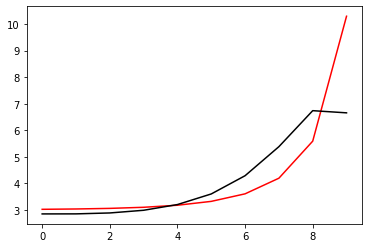

298100 0.011010924451335533
[2.93755498 2.91888761 2.92984602 3.0059622  3.19334585 3.55913553
 4.19942378 5.20374487 6.35838344 6.35834406]


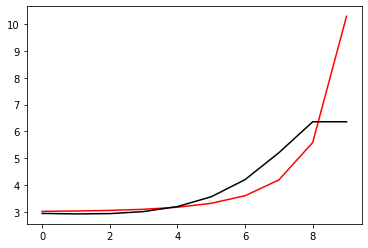

299200 0.02161914131526148
[2.87799183 2.87482841 2.89963015 2.99000707 3.19353321 3.57896205
 4.24438794 5.28343969 6.49612082 6.45382311]


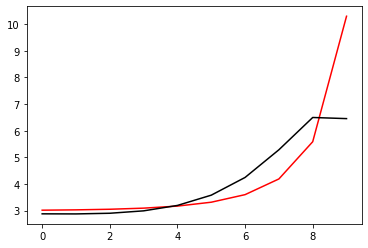

300300 0.012223647325945707
[2.92198958 2.93405566 2.97488524 3.07972724 3.29693008 3.69596439
 4.37564708 5.43421478 6.69451116 6.65698933]


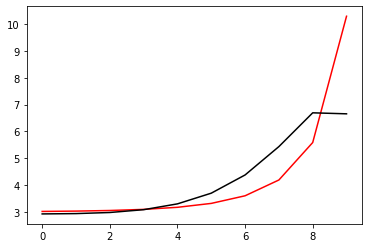

301400 0.3511251164305798
[2.64850191 2.6491952  2.68217535 2.7773644  2.98081028 3.35942633
 4.00778491 5.02604647 6.2798337  6.6709105 ]


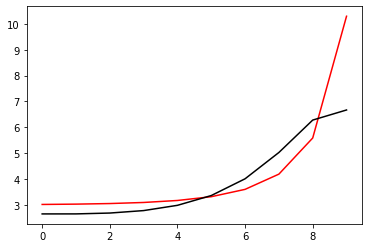

302500 0.013653626979499543
[2.932743   2.91833321 2.93409358 3.00901345 3.1852237  3.52258684
 4.10291381 5.01014785 6.12065464 6.11288442]


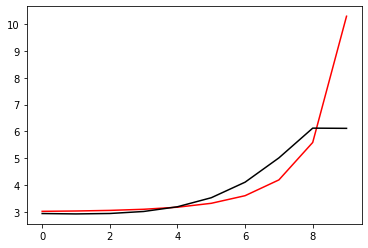

303600 0.010821459760239429
[2.90643351 2.8986104  2.91955023 3.00020092 3.18325816 3.52998284
 4.12508421 5.05631838 6.2004024  6.21196297]


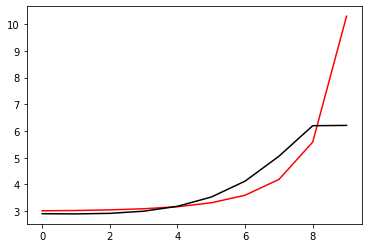

304700 0.011051522306955254
[2.92357132 2.92729259 2.95882034 3.05045405 3.24589285 3.60813973
 4.22474147 5.18497447 6.36267474 6.29793859]


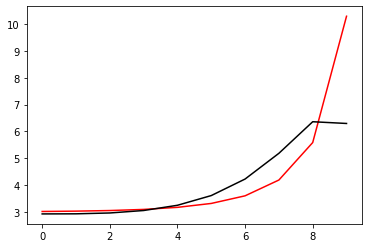

305800 0.0009754600927777261
[2.94335325 2.95789591 3.00125597 3.10477125 3.31305079 3.69080722
 4.32864461 5.31951114 6.54176704 6.63018955]


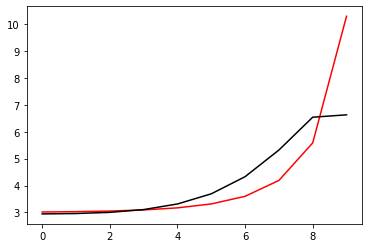

306900 0.011077966456249784
[2.88232543 2.90353815 2.95783567 3.07297119 3.29345042 3.68577071
 4.34540022 5.37802715 6.68510252 6.68152741]


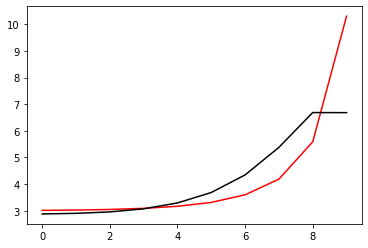

308000 0.018123427124497965
[2.95215693 2.97022642 3.01978729 3.12560944 3.32679271 3.67693401
 4.22560709 4.92334226 5.95944653 5.94799812]


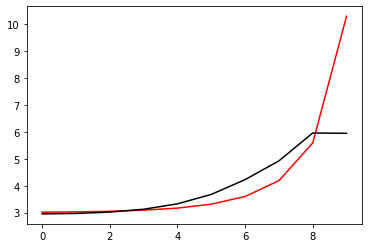

309100 0.010826968863291795
[2.90249484 2.92099408 2.97135663 3.07785079 3.27879256 3.62658182
 4.17148182 4.92355582 6.00495031 6.00608549]


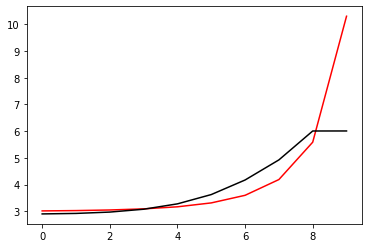

310200 0.021595528997285455
[2.83473868 2.86111779 2.92151171 3.03998574 3.25637168 3.62953877
 4.24034376 5.17358047 6.23665675 6.15963431]


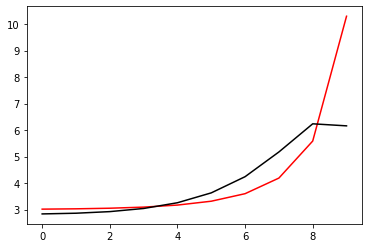

311300 0.025055340371197686
[3.00949981 3.01642665 3.06220874 3.17129794 3.38361525 3.76123164
 4.39654367 5.3447268  6.35237368 6.48123815]


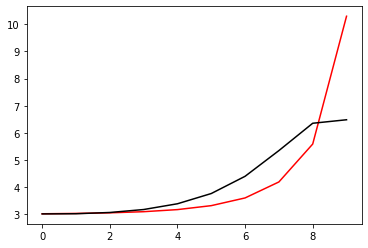

312400 0.030922301373181787
[2.94711442 2.9513746  2.99124595 3.09358168 3.29661074 3.65865478
 4.26618693 5.21625859 6.35070094 6.35188094]


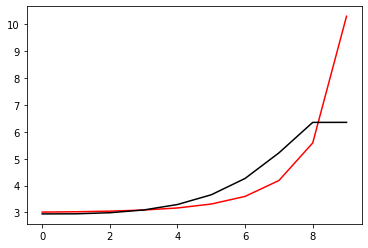

313500 0.02082696284568307
[2.98783925 2.98723027 3.01910633 3.11308538 3.30794953 3.66197416
 4.26252463 5.20892909 6.42780603 6.42461049]


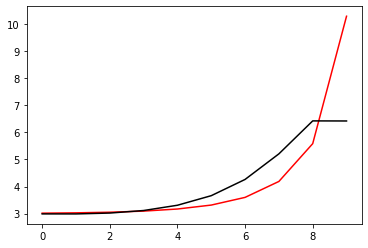

314600 0.04322748235489744
[2.80331857 2.79421198 2.81465635 2.89422382 3.07104929 3.40266891
 3.9827254  4.87224294 5.94675115 6.08653033]


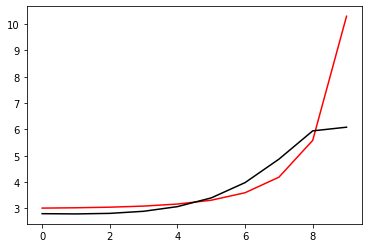

315700 0.019806685655643915
[2.91553553 2.89717552 2.90798041 2.97842822 3.14602262 3.46692469
 4.03105935 4.89720436 5.94352426 5.93970583]


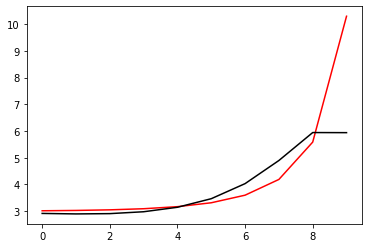

316800 0.0007324245001371547
[2.9216677  2.91050274 2.92618273 3.00109508 3.17365644 3.50096656
 4.07286012 4.95256048 6.02083173 6.02480181]


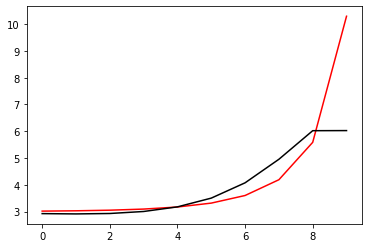

317900 0.010784919371952206
[2.91743133 2.91651546 2.9408395  3.02361528 3.20491138 3.54352152
 4.12985559 5.03489658 6.14446044 6.12273038]


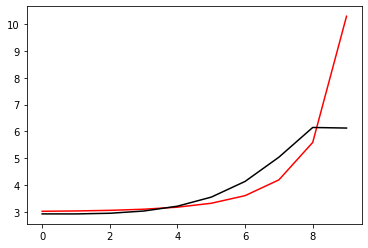

319000 0.010924569320100587
[2.9015186  2.90999002 2.94459334 3.03701123 3.22925394 3.58259237
 4.18905492 5.13176134 6.30661157 6.33914921]


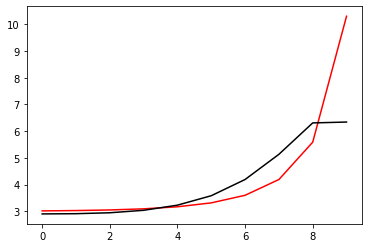

320100 0.010878999243051482
[2.92438973 2.92770991 2.95751511 3.04396779 3.22772887 3.56756764
 4.14925825 5.05828039 6.2235275  6.23118842]


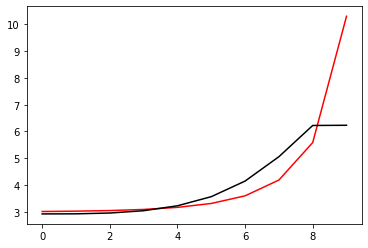

321200 0.02188303667315204
[2.83584457 2.84941818 2.89488791 3.00347431 3.22016488 3.61325536
 4.28787274 5.36793545 6.77543579 6.68496056]


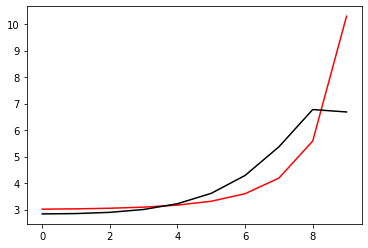

322300 0.016102015196034016
[2.95734306 2.93872809 2.95124475 3.02448838 3.198469   3.5311497
 4.10465122 4.99996592 6.13973438 6.10851851]


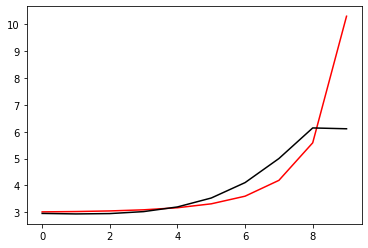

323400 0.03081290189325075
[2.93052177 2.91925944 2.93709758 3.01601281 3.19690479 3.53936062
 4.12878028 5.05199411 6.2282821  6.2351739 ]


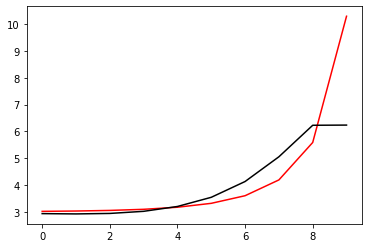

324500 0.01124458303459106
[2.88577515 2.88478292 2.91153734 2.9996045  3.19150519 3.54938494
 4.1637441  5.13066247 6.36557351 6.35187336]


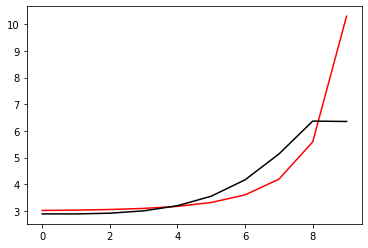

325600 0.01100376565735718
[3.0148384  3.00592386 3.02739126 3.11196482 3.30341819 3.66526596
 4.28912799 5.27218422 6.53189558 6.59872764]


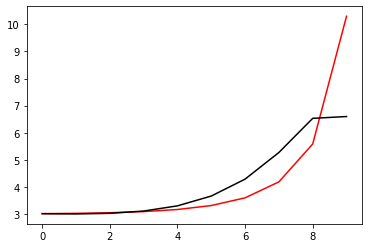

326700 0.010806854831972714
[3.0253953  3.01774854 3.03628621 3.11281904 3.28815541 3.61900061
 4.18171496 5.05684876 6.23959368 6.24748614]


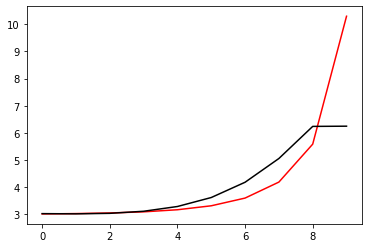

327800 0.0009482931587186891
[2.95183315 2.95722794 2.98943322 3.08192822 3.2782774  3.64174936
 4.26643433 5.26698826 6.58952121 6.63834973]


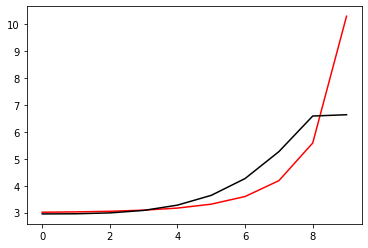

328900 0.011216329847171507
[2.94039809 2.9564845  3.00359257 3.1138872  3.33394537 3.73428751
 4.42435338 5.54069278 6.99576585 7.01353861]


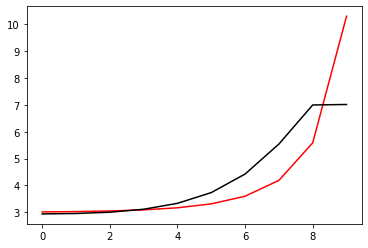

330000 0.010929286712086322
[2.97783147 2.93514602 2.92284154 2.97170906 3.12393127 3.44297135
 4.02838952 4.98713994 5.96752174 5.98291772]


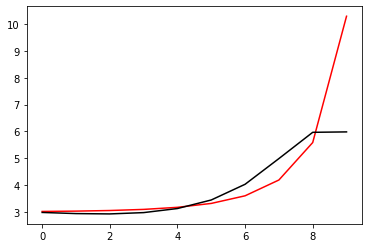

331100 0.011149321072591315
[2.97439372 2.94006521 2.93249405 2.98602169 3.14331867 3.46844878
 4.06136757 5.02937563 6.03471117 6.02052993]


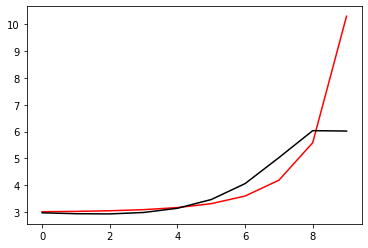

332200 0.023074144292368703
[2.92500004 2.90351365 2.90560773 2.96925072 3.13885675 3.48047175
 4.09633664 5.09632564 6.16462919 6.128777  ]


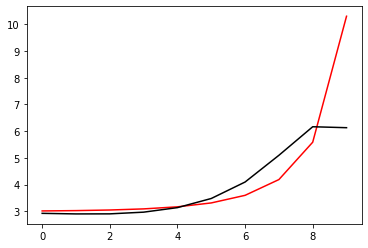

333300 0.019915434839717038
[2.91045821 2.90008855 2.91130379 2.98271293 3.16063959 3.51254997
 4.14157425 5.15933505 6.28531926 6.3329793 ]


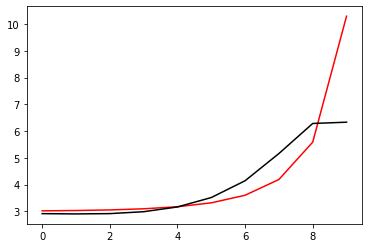

334400 0.03133818072640578
[3.03179654 3.01908833 3.02891985 3.09728247 3.27135639 3.61875266
 4.24026168 5.24665565 6.41289893 6.35062817]


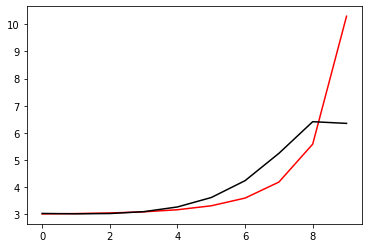

335500 0.025688970830998963
[2.86268939 2.8582972  2.87560476 2.94777808 3.12030211 3.45733313
 4.04822898 4.99594599 6.2159936  6.24288373]


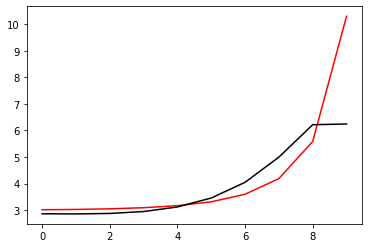

336600 0.010884534481300603
[2.89883331 2.8920918  2.90705798 2.97754151 3.14933182 3.48817803
 4.0892496  5.07144426 6.37111364 6.37834919]


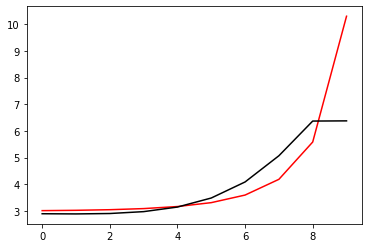

337700 0.08498686115503323
[2.81084521 2.7966407  2.80378486 2.86452262 3.02240608 3.3391355
 3.90122257 4.81355439 6.12665057 6.46060718]


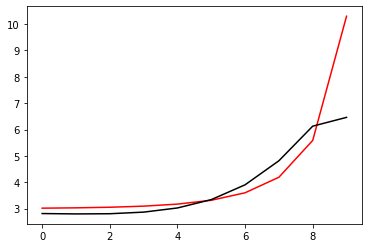

338800 0.000671167035146606
[3.01837453 3.01524416 3.03124557 3.09716397 3.25371399 3.55709087
 4.08285859 4.91805934 6.099162   6.10718826]


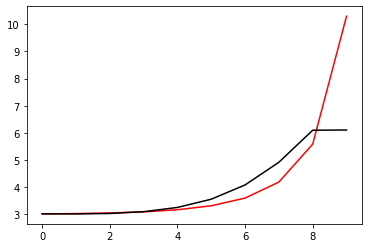

339900 0.010847824964256562
[2.97282298 2.97055499 2.98912727 3.05937462 3.22313416 3.54014156
 4.09668914 5.00914553 6.33290981 6.31377701]


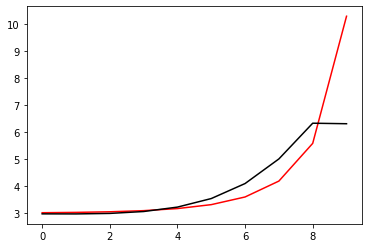

341000 0.011053564829604548
[2.91176077 2.91893369 2.95155912 3.03918059 3.22591051 3.57866839
 4.20187438 5.24489902 6.7320064  6.72442603]


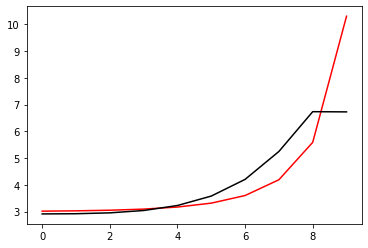

342100 0.01678303094051324
[2.92434484 2.9073448  2.91581666 2.97733771 3.13210244 3.4394279
 3.98331177 4.85341531 6.11324593 6.10423178]


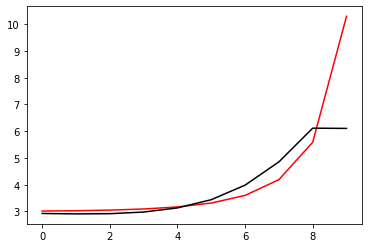

343200 0.02413643124352372
[2.92533384 2.91347297 2.92565762 2.9910153  3.15005112 3.46266463
 4.0139832  4.89649317 6.17089941 6.15040529]


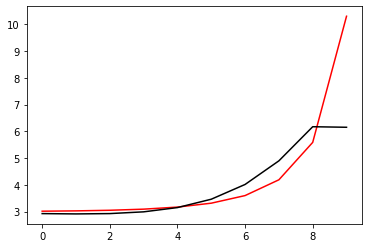

344300 0.019705316155418453
[2.91690803 2.91344519 2.9327429  3.0053339  3.17245974 3.49514936
 4.06074677 4.96679351 6.26938208 6.27493219]


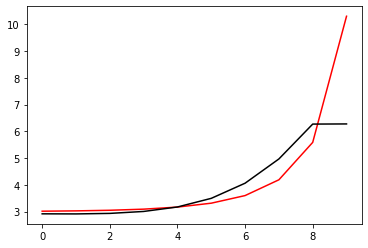

345400 0.03085332704500991
[2.88978877 2.89472607 2.92245569 3.00326791 3.17926119 3.51275711
 4.09405893 5.0289567  6.37039619 6.35090812]


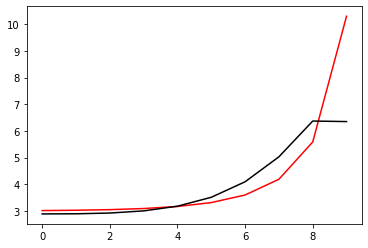

346500 0.04890899942617649
[3.07033942 3.06506672 3.08314538 3.15198022 3.31119751 3.61787906
 4.15060614 4.99898105 6.23423031 6.2896806 ]


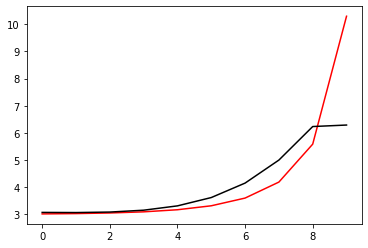

347600 0.01080169500889309
[2.89279649 2.89273711 2.91643809 2.99168558 3.15787318 3.47289078
 4.02092879 4.91454338 6.24278041 6.25298147]


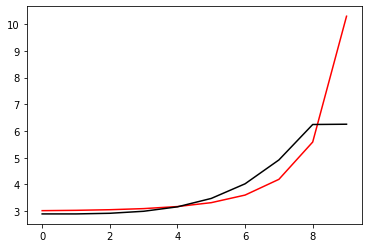

348700 0.010775932183933155
[3.01137689 3.01202141 3.03686347 3.11371186 3.28161883 3.5979665
 4.14587251 5.03609671 6.35430713 6.35940072]


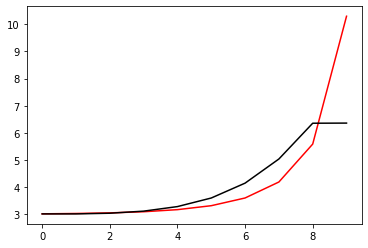

349800 0.0009091847959720458
[2.94808468 2.95291527 2.98409973 3.07074622 3.25413997 3.597399
 4.19766838 5.18309529 6.60779432 6.62302016]


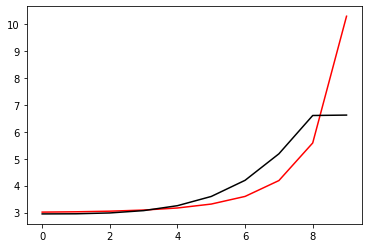

350900 0.010786832695003704
[2.91359803 2.89234263 2.89791885 2.95828548 3.11256765 3.42084054
 3.97680806 4.86976348 6.07234745 6.08615629]


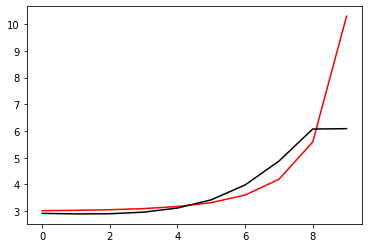

352000 0.01088654355728712
[2.92353482 2.90560447 2.91263261 2.97418782 3.12953369 3.43879156
 3.99523454 4.88985986 6.09691088 6.09616126]


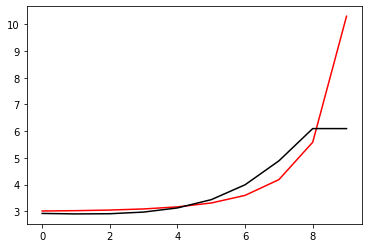

353100 0.01091861105756233
[2.95063125 2.94072981 2.95372789 3.02093339 3.18237639 3.49887868
 4.06392474 4.97137222 6.19476264 6.16586017]


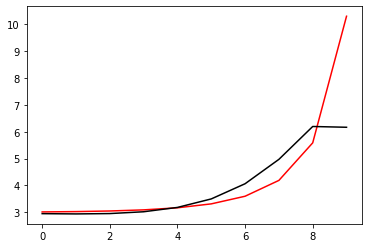

354200 0.021786745315632725
[2.88115064 2.88399787 2.9093034  2.98906816 3.16535027 3.50180878
 4.09623204 5.05363643 6.34877582 6.33343429]


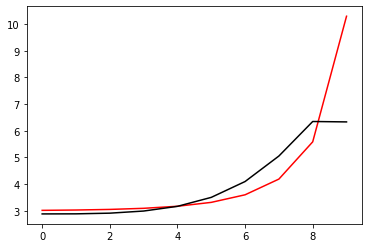

355300 0.027785627767356685
[3.05093895 3.04374681 3.06204636 3.13534196 3.30592059 3.63690285
 4.22286556 5.16972428 6.46190668 6.55798895]


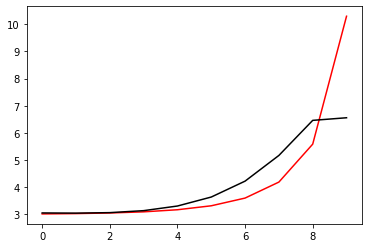

356400 0.030874245385827562
[2.93062417 2.9258414  2.94565534 3.02074366 3.19376266 3.52951424
 4.12815579 5.11683163 6.48603302 6.45656065]


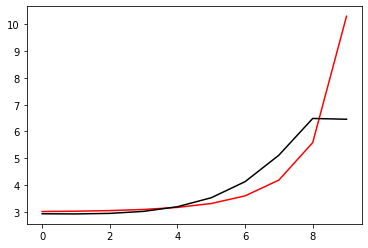

357500 0.01143352533327864
[2.91944258 2.90624099 2.91498288 2.97819628 3.13820629 3.45828612
 4.0344296  4.98602749 6.35728874 6.33022325]


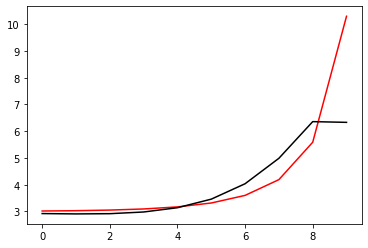

358600 0.010963015492078225
[2.89437538 2.89092296 2.9102958  2.98567093 3.16135965 3.50417289
 4.11809031 5.14456301 6.63709716 6.64624806]


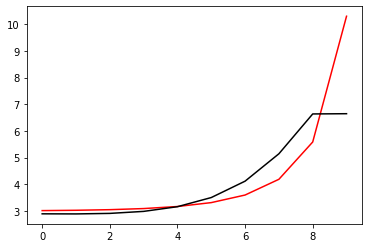

359700 0.011201488984759353
[2.92127005 2.93788    2.98334132 3.08793548 3.29842223 3.68739961
 4.37025886 5.50756662 7.13216088 7.14450394]


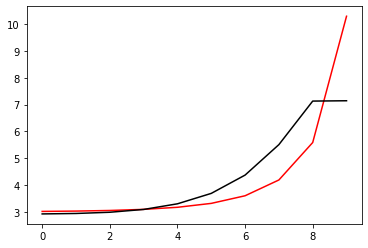

360800 0.00087729614401822
[2.9603493  2.98412871 3.03481735 3.13768209 3.33289251 3.67971327
 4.25809038 5.15167834 6.48041869 6.60764487]


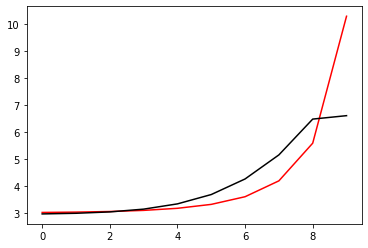

361900 0.0114670459204678
[2.96004512 2.9833011  3.03441877 3.1380957  3.33456048 3.68364519
 4.26757376 5.17633248 6.51155118 6.50703083]


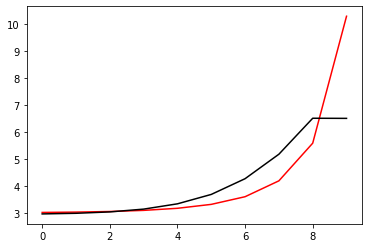

363000 0.013959902119417437
[2.93034377 2.95445511 3.00754329 3.11370684 3.31334719 3.66758734
 4.2639038  5.20911697 6.57386837 6.56226011]


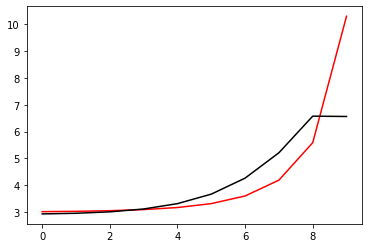

364100 0.011035905658466837
[2.87538314 2.90253278 2.96102864 3.0735966  3.28083016 3.64611134
 4.26537279 5.26618752 6.6757176  6.67857648]


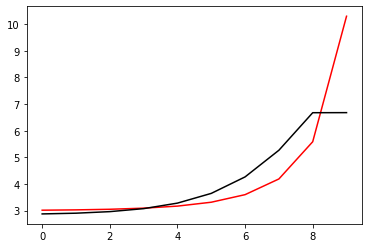

365200 0.0215555247133031
[2.83431718 2.86718443 2.9356902  3.06070395 3.28319867 3.67051234
 4.3297726  5.4026454  6.85305882 6.81883454]


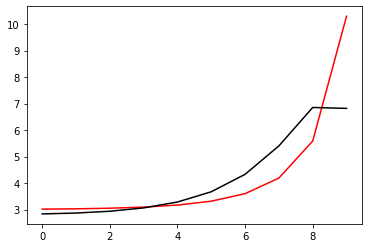

366300 0.02072220802850009
[2.92590797 2.96457679 3.04529243 3.18761667 3.43243448 3.85049477
 4.55451491 5.67505809 7.12411955 7.02476769]


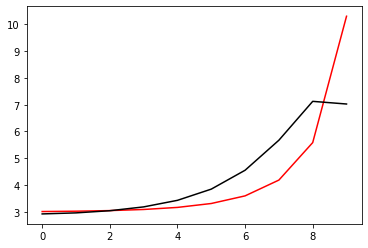

367400 0.030905382247548227
[2.88230268 2.87907896 2.9194955  3.02145909 3.22039184 3.57808008
 4.18578855 5.08073457 6.37115474 6.46568957]


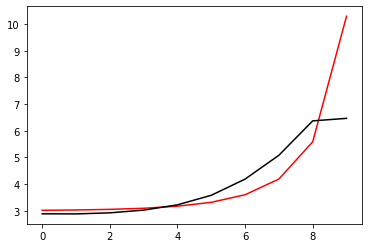

368500 0.011321797762554982
[2.86938412 2.87542219 2.92213058 3.03193688 3.24060323 3.60989333
 4.23066538 5.14989737 6.46677527 6.45116852]


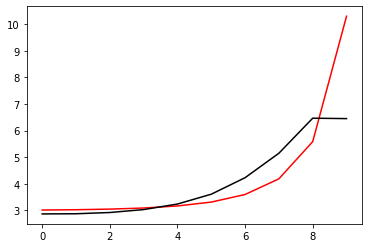

369600 0.011019453043540777
[2.87701431 2.88998321 2.94286804 3.0608542  3.28078243 3.66431569
 4.30193524 5.25479154 6.60898354 6.62071906]


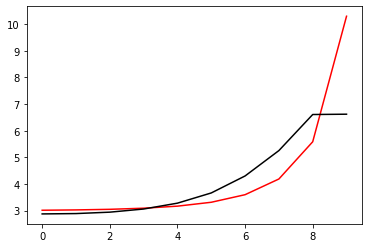

370700 0.011005144467412208
[2.96867432 2.97943424 3.02739393 3.13954233 3.35281841 3.72627275
 4.34684489 5.29308195 6.64347621 6.65268532]


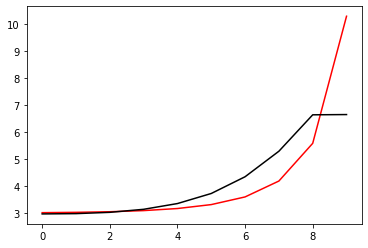

371800 0.0007708853051640552
[2.89056081 2.89419524 2.93300429 3.03318888 3.22871033 3.56986144
 4.12218903 4.93543042 6.11355405 6.10982311]


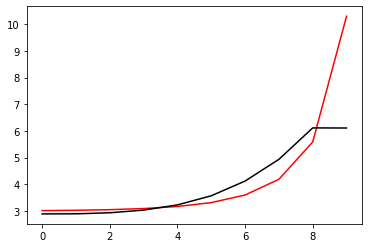

372900 0.010815093815350651
[2.90468259 2.91426762 2.95830663 3.0641163  3.26684571 3.61845464
 4.18764308 5.02590761 6.20539998 6.21019727]


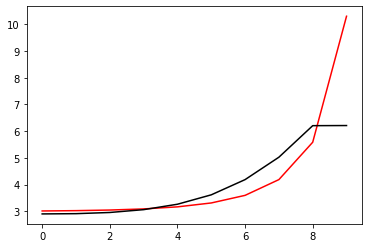

374000 0.011127771605468743
[2.89634771 2.91390422 2.96616919 3.0807627  3.29465793 3.66261543
 4.25926227 5.14427825 6.34617737 6.33748506]


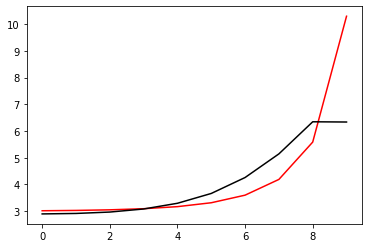

375100 0.011023777889640287
[2.87519951 2.89868925 2.95934115 3.08349445 3.30989063 3.69660742
 4.3255728  5.27162316 6.52014768 6.53216506]


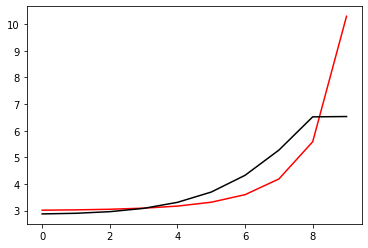

376200 0.021581844459230018
[2.85906319 2.85522266 2.89108316 2.99303816 3.19974232 3.56998382
 4.18848247 5.12695942 6.27003282 6.71040437]


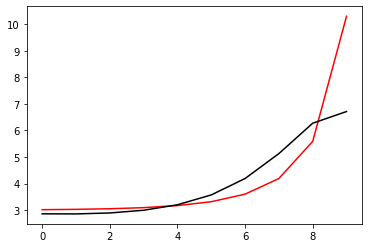

377300 0.01583671075203029
[2.90618959 2.90282721 2.9362611  3.03594803 3.24045117 3.60816074
 4.22335392 5.16046492 6.30975785 6.28777524]


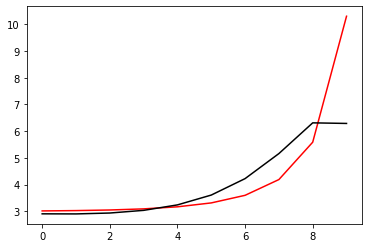

378400 0.0309674356065566
[2.88491615 2.89372363 2.93749912 3.0475911  3.26382541 3.64542966
 4.27770744 5.24006982 6.42952595 6.43801985]


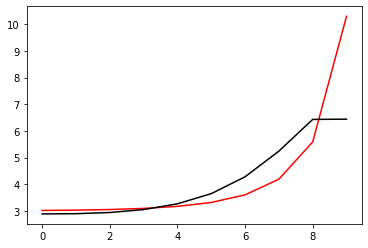

379500 0.015327104972314005
[2.88863811 2.90835619 2.96459666 3.08733709 3.31785544 3.71667788
 4.37073006 5.36656274 6.61151021 6.57115102]


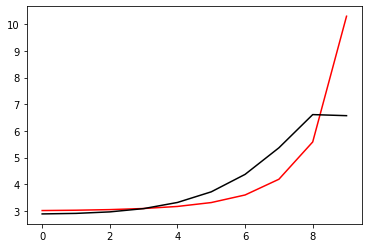

380600 0.0111603714121522
[2.99621799 3.01292779 3.06372609 3.17445649 3.38183239 3.73596001
 4.29309804 5.05045499 6.03192975 6.02816241]


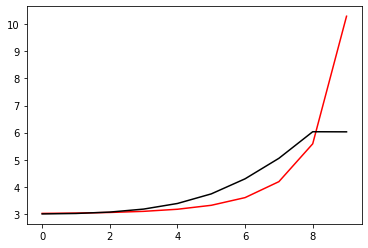

381700 0.010978169709750879
[2.89311941 2.92060454 2.9839366  3.10878382 3.33389382 3.71585562
 4.33473365 5.26314391 6.32250343 6.22551858]


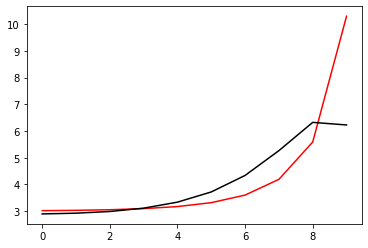

382800 0.0010696534739853148
[2.87719216 2.90155938 2.96602122 3.09481579 3.32735723 3.72433381
 4.37823667 5.38931429 6.53012863 6.53734911]


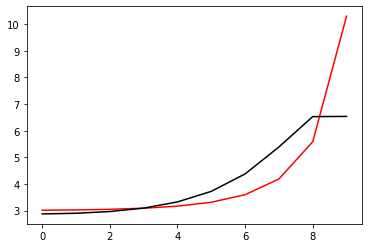

383900 0.010912605870567915
[2.87301194 2.87027473 2.90839929 3.01020909 3.21168549 3.56848691
 4.16463655 5.06862604 5.9991204  6.00720604]


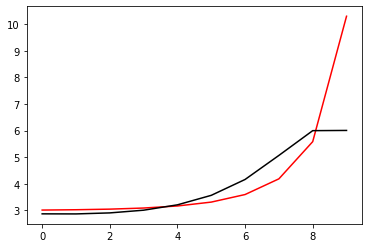

385000 0.010905959709846737
[2.89843867 2.89982168 2.94039116 3.04482738 3.24926887 3.60960747
 4.20957931 5.11733101 6.05712213 6.0574917 ]


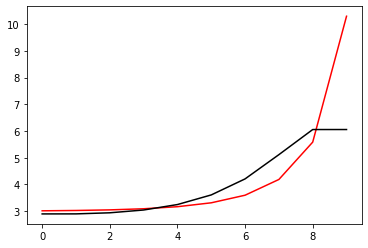

386100 0.010915503912946416
[2.90081222 2.90901944 2.9546733  3.06442166 3.27506151 3.643352
 4.25382442 5.17660774 6.14625887 6.14796893]


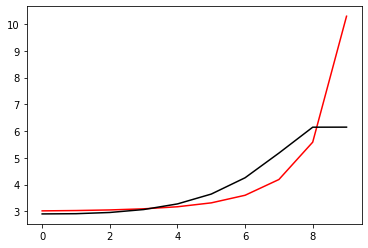

387200 0.021586048242344644
[2.83897185 2.85957566 2.91789205 3.04183641 3.27041217 3.66383868
 4.31198086 5.29309452 6.35221034 6.29674698]


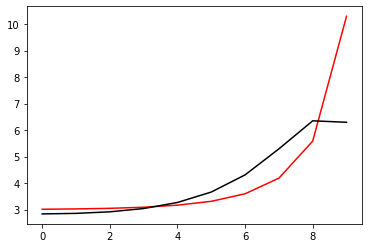

388300 0.012476447573940204
[2.90999286 2.92516982 2.98002965 3.10384976 3.33700406 3.74165766
 4.41021261 5.42703815 6.5583702  6.52969381]


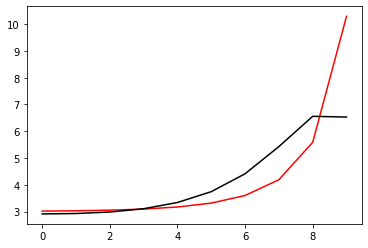

389400 0.3095730138206729
[2.64255351 2.64917635 2.69548897 2.80956656 3.03130469 3.42080181
 4.06605389 5.05534506 6.22730993 6.56242641]


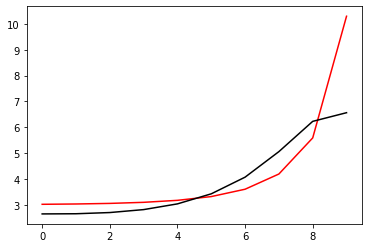

390500 0.020536394255784365
[2.93952638 2.95922261 3.01345963 3.12907826 3.34236058 3.7020399
 4.25197745 4.93415912 5.83573514 5.83563987]


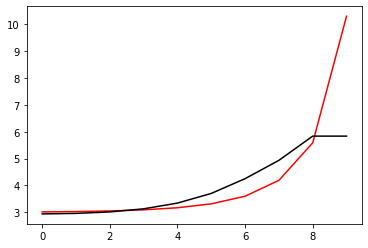

391600 0.010889843036524018
[2.84588279 2.86928935 2.92818102 3.04853021 3.26707574 3.63421781
 4.20608339 5.00923552 5.9699723  5.97821205]


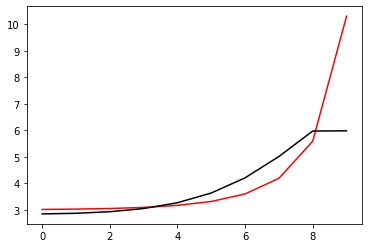

392700 0.011015102792393339
[2.88299334 2.90919417 2.97465601 3.10463183 3.33831638 3.73403591
 4.37514966 5.30695497 6.210941   6.14119166]


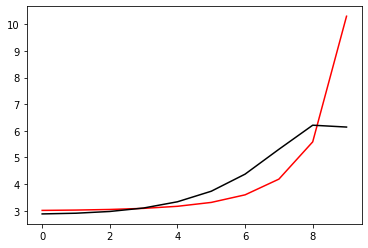

393800 0.0006965084892874764
[2.89687649 2.89700369 2.9369813  3.03962221 3.2397076  3.58787062
 4.15142867 4.92660917 5.5926772  5.60336723]


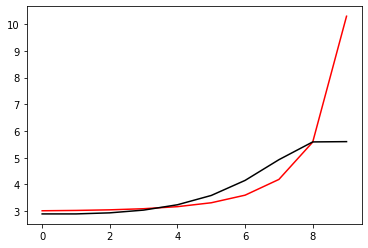

394900 0.010736485570793316
[2.89499767 2.90041723 2.94427495 3.05137567 3.25711377 3.61349044
 4.18963955 4.98670151 5.67870838 5.68216646]


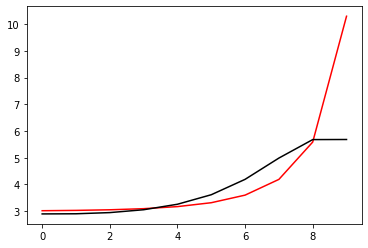

396000 0.010915482784383743
[2.88783464 2.89989073 2.94912266 3.06205793 3.27503129 3.64168403
 4.23332072 5.0594614  5.7935634  5.79283053]


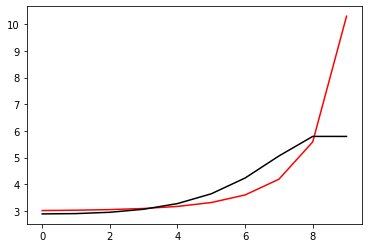

397100 0.01098710030012384
[2.87421721 2.89377034 2.95090029 3.07274453 3.29732668 3.6810726
 4.29964848 5.17624259 5.98441318 5.98963522]


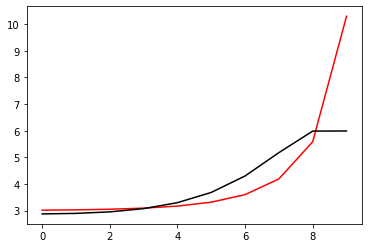

398200 0.26510879948442484
[3.05089979 3.06926984 3.12706717 3.25391479 3.49092091 3.89958455
 4.56361013 5.51740201 6.40341429 6.35373669]


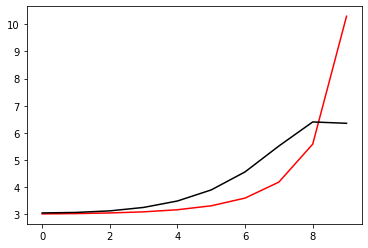

399300 0.0155327843466476
[2.91899016 2.91770379 2.95503107 3.05866162 3.26557752 3.62978314
 4.22192574 5.06285734 5.81161734 5.7859699 ]


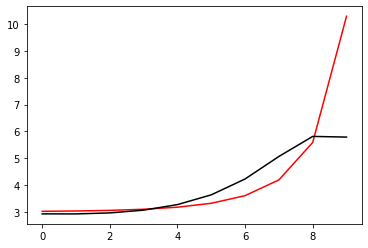

400400 0.03082479911521286
[2.89786862 2.90265881 2.94472633 3.05335441 3.26633011 3.63876794
 4.24311498 5.10442309 5.88765312 5.89328046]


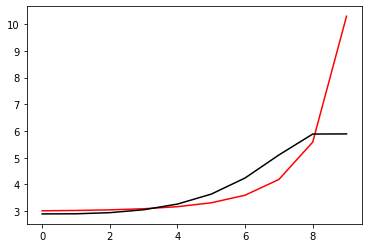

401500 0.011345047744662103
[2.85212489 2.86629273 2.91728478 3.03544537 3.26017997 3.64887455
 4.27777623 5.17962979 6.02740512 6.00700993]


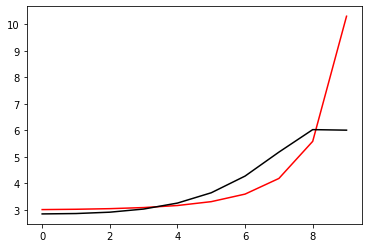

402600 0.010960208579856195
[2.98219817 2.9855172  3.02912347 3.14241769 3.36568894 3.7569728
 4.39249668 5.30870307 6.19848903 6.26099949]


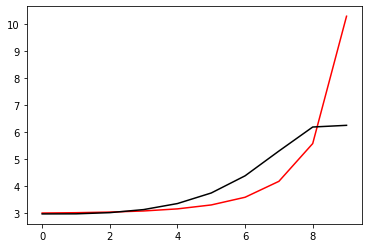

403700 0.01107804712477389
[2.91575189 2.93092663 2.98528491 3.1112288  3.35153084 3.7685349
 4.44714966 5.4418311  6.45908336 6.31503363]


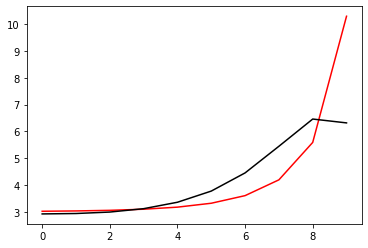

404800 0.0007645322097590886
[2.95345514 2.96342516 3.0100852  3.12376815 3.34331376 3.71936577
 4.29714676 5.02966297 5.81603855 5.82357903]


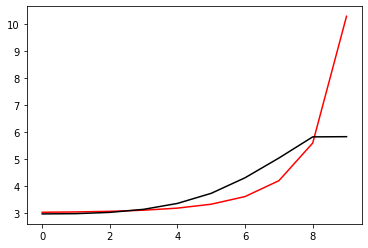

405900 0.010824763101324294
[2.89759272 2.91187465 2.96251977 3.07993688 3.30352994 3.68536381
 4.27866549 5.07397724 5.9030965  5.90538947]


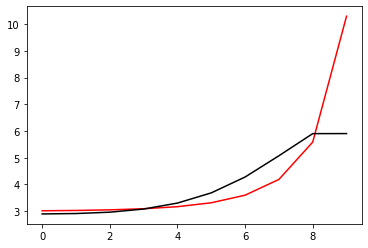

407000 0.011183291620736098
[2.8814168  2.90297109 2.96204158 3.08881168 3.32469601 3.7270176
 4.36641821 5.2550842  6.08837131 6.07623137]


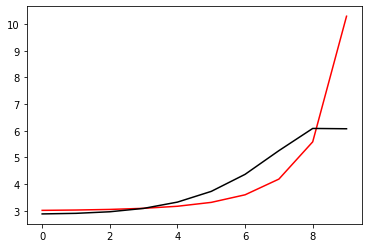

408100 0.011226969753044958
[2.85339479 2.86867374 2.92467899 3.05108058 3.2901451  3.70300501
 4.37328064 5.35835917 6.2884607  6.32033487]


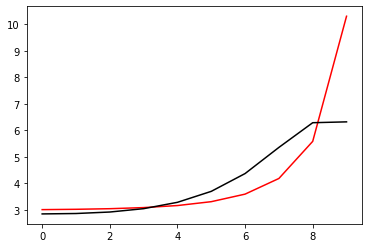

409200 0.025044112373808464
[2.80139723 2.82550013 2.89055503 3.02600297 3.27494242 3.70147703
 4.39798034 5.44920354 6.4919066  6.3796583 ]


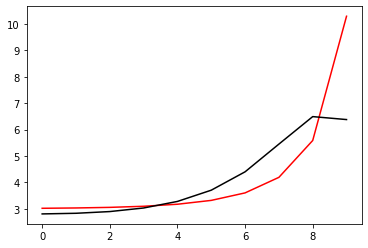

410300 0.018210109043593808
[2.87922257 2.88840736 2.9365815  3.05186202 3.27307078 3.65435751
 4.26001966 5.08876389 5.82829835 5.80321282]


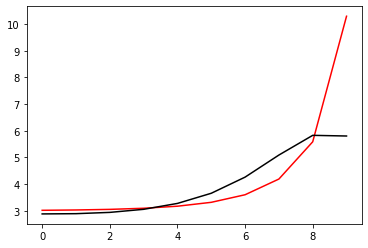

411400 0.030909731018052753
[2.87167325 2.888383   2.94364269 3.06666357 3.29746905 3.69271415
 4.3218924  5.19152065 5.96910621 5.97953362]


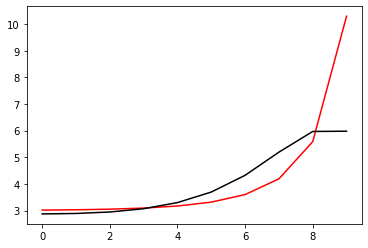

412500 0.014790672490746353
[2.81561118 2.8398901  2.90516935 3.04068008 3.28875929 3.71142262
 4.39041204 5.35339601 6.23125185 6.17656155]


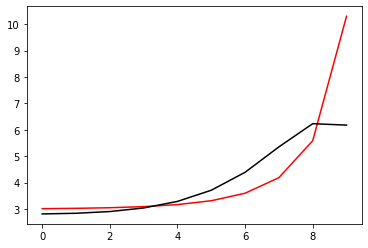

413600 0.011071243068086541
[2.89914264 2.91506093 2.97217497 3.10140624 3.34524299 3.76568047
 4.44470123 5.42457722 6.37300127 6.40651993]


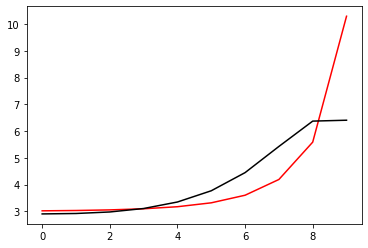

414700 0.012902222925455521
[2.91424618 2.90246859 2.92978643 3.02615795 3.23173702 3.60363223
 4.214861   5.09144078 5.93760426 5.96764669]


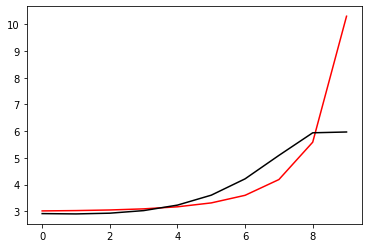

415800 0.0008528488081370575
[2.91709712 2.91482019 2.94836661 3.05081161 3.26290601 3.64221214
 4.26255804 5.15544699 6.03954285 6.04659617]


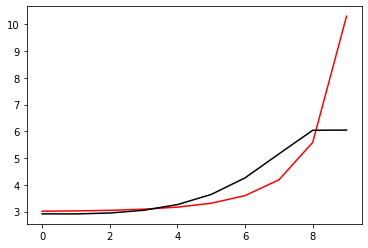

416900 0.010951854866915647
[2.93543047 2.94561653 2.98969185 3.10141607 3.32259749 3.71129094
 4.34227429 5.25504775 6.19107004 6.17022177]


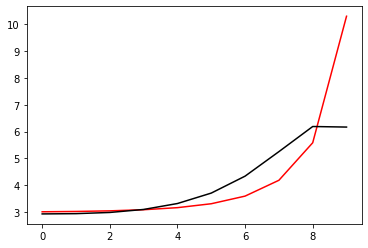

418000 0.012680471609422438
[2.83122846 2.84860517 2.90405091 3.03013443 3.27155811 3.6910755
 4.37165599 5.37104445 6.45610133 6.41478567]


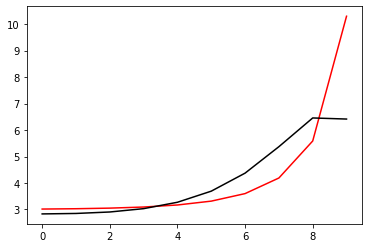

419100 0.010964877195285216
[2.89533757 2.90644971 2.95450144 3.07066163 3.29694305 3.69073555
 4.32404594 5.24792934 6.2852799  6.28678568]


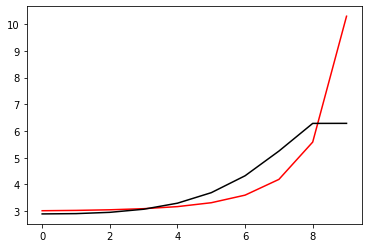

420200 0.021513912942665844
[2.85185608 2.85889038 2.9043869  3.02132928 3.25364425 3.66341444
 4.33514558 5.35045055 6.55932851 6.5334975 ]


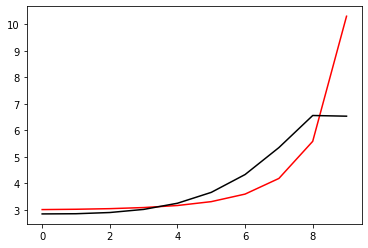

421300 0.0394016151432692
[3.00204261 3.01256767 3.06230186 3.18278619 3.41788884 3.82985411
 4.50381249 5.5224833  6.76348501 6.84126339]


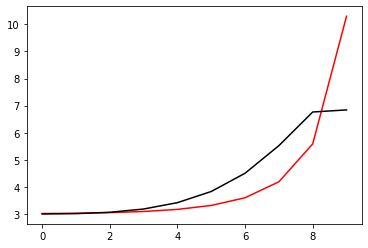

422400 0.03068709506330833
[2.89282006 2.90612864 2.95309277 3.06239994 3.27153867 3.62646644
 4.15745468 4.68969277 5.73119732 5.71974643]


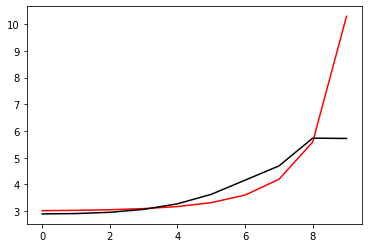

423500 0.01140546841169502
[2.85470771 2.87345483 2.92641641 3.04218527 3.25922649 3.62592314
 4.17884521 4.78873137 5.8580519  5.84375198]


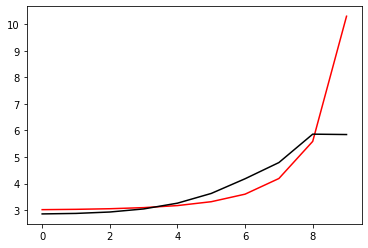

424600 0.010851553087950064
[2.84887421 2.87088573 2.92880383 3.04996402 3.27326863 3.64857884
 4.21725889 4.90210244 5.98435816 5.99342835]


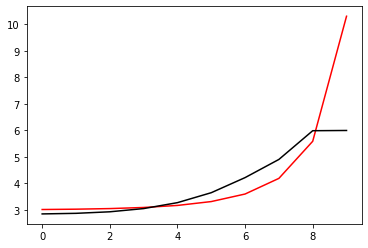

425700 0.010847831401459871
[2.96320039 2.97812946 3.0320475  3.15182477 3.37609496 3.75540436
 4.33488118 5.08093121 6.14614303 6.14998013]


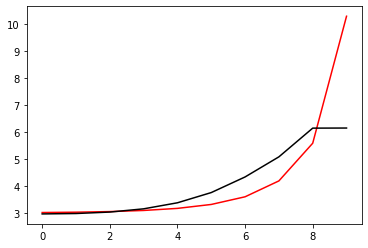

426800 0.000892850938039317
[2.96602248 2.9790977  3.03059412 3.14861572 3.37118126 3.74882718
 4.33533818 5.16094192 6.2937558  6.30215941]


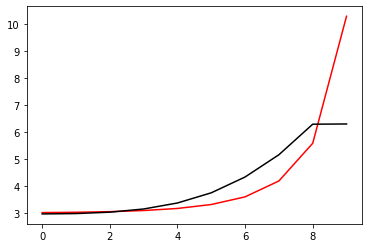

427900 0.010782024250151633
[2.92282499 2.9355854  2.98349016 3.09350389 3.30031738 3.64845004
 4.18762519 4.96709314 6.0941966  6.10532457]


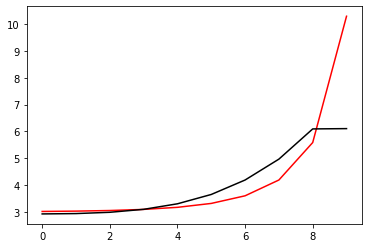

429000 0.010929834083584618
[2.89231722 2.90142274 2.94492201 3.05171981 3.25814888 3.61336115
 4.18564284 5.09040886 6.38680214 6.3935498 ]


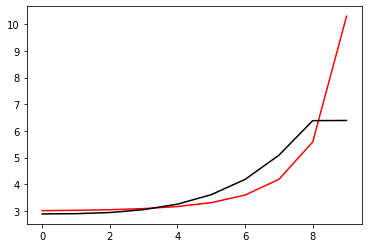

430100 0.010772695864868544
[2.92627192 2.93558253 2.97492848 3.07184981 3.26013215 3.58344618
 4.09530326 4.81061404 5.80477181 5.7847558 ]


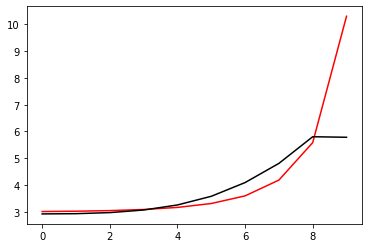

431200 0.02172988129939609
[2.84947916 2.86632846 2.91488384 3.02257649 3.22571259 3.57528386
 4.14853852 5.03631238 6.10216263 5.98453469]


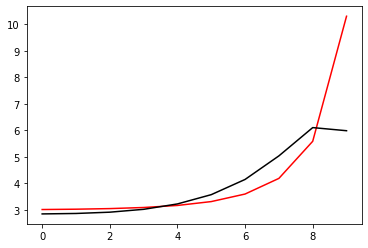

432300 0.02112096387625237
[2.97242571 2.98925507 3.04376455 3.1630698  3.38780457 3.78086516
 4.44666146 5.4882877  6.54663577 6.51622391]


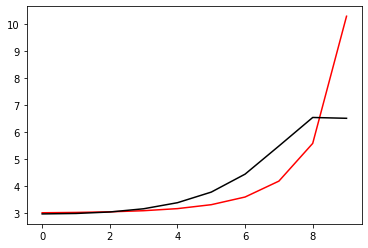

433400 0.03089567280883051
[2.9121283  2.90680444 2.9383564  3.03365492 3.2319713  3.59524929
 4.22549467 5.23290927 6.18831032 6.20269445]


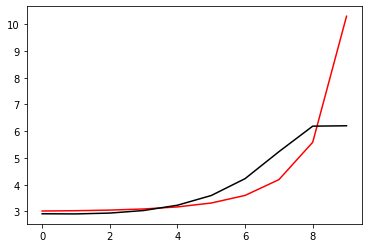

434500 0.011308198124757527
[2.86826127 2.87325451 2.91389364 3.01968845 3.23087356 3.61062266
 4.26117663 5.29162957 6.29502106 6.28127768]


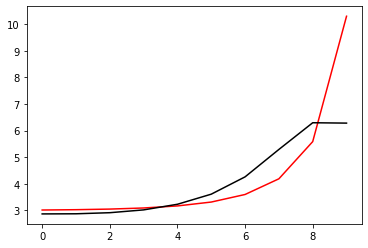

435600 0.011002045352795706
[2.93117136 2.93672971 2.97891185 3.08737847 3.30315437 3.68988824
 4.34861256 5.3866097  6.43434733 6.46081951]


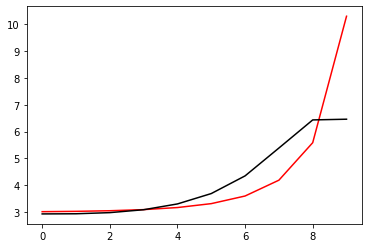

436700 0.011155769473593367
[2.88366872 2.89802973 2.94824966 3.06542985 3.29221809 3.6939065
 4.37167139 5.4327981  6.56206162 6.50620487]


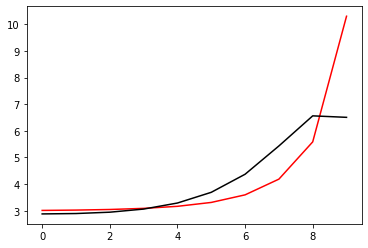

437800 0.0009022228859465321
[2.92334778 2.93323752 2.97602838 3.08009888 3.28495277 3.64955354
 4.26270617 5.22564984 6.33338905 6.33140104]


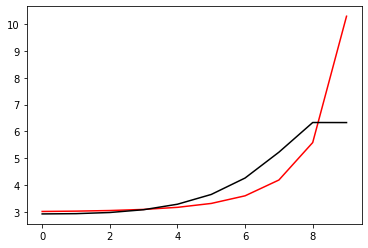

438900 0.010903481493091758
[2.92406961 2.93088833 2.96871999 3.06715338 3.26586924 3.62393395
 4.23064481 5.19737677 6.41082126 6.35575829]


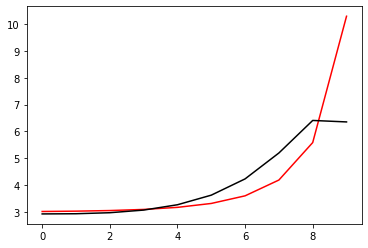

440000 0.011194499913011876
[2.90719145 2.89008979 2.90356557 2.97605503 3.14485676 3.46417265
 4.00901073 4.82684253 5.84410453 5.84484226]


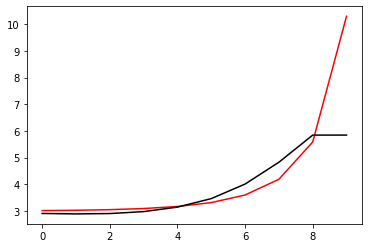

441100 0.013108644203065232
[2.92868742 2.91552565 2.9310926  3.00536569 3.17588611 3.49694664
 4.04337718 4.86451104 5.88676995 5.86548076]


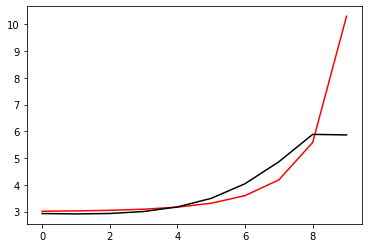

442200 0.024240833042332363
[2.90932616 2.9053916  2.92854287 3.01059037 3.19038394 3.52391655
 4.08867693 4.94073107 6.00469652 5.98997519]


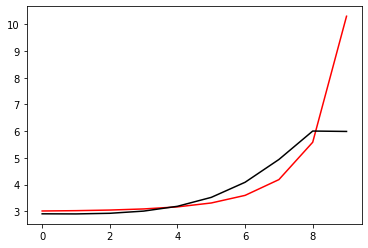

443300 0.020357783825782856
[2.87744464 2.88394892 2.91712915 3.00904029 3.200267   3.54895162
 4.13607768 5.0277678  6.14822594 6.15572576]


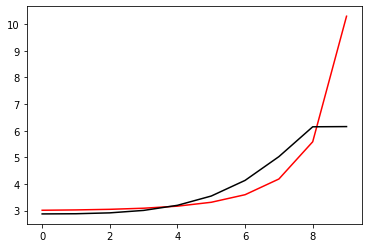

444400 0.03150575790759111
[3.02032027 3.01605233 3.04119552 3.12577692 3.31073137 3.65417886
 4.23617348 5.12908301 6.26608042 6.21385278]


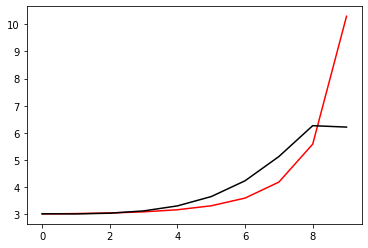

445500 0.011557970886670982
[2.87318473 2.8748544  2.90397541 2.98978475 3.17200796 3.50661908
 4.07005488 4.9475678  6.14119404 6.15360464]


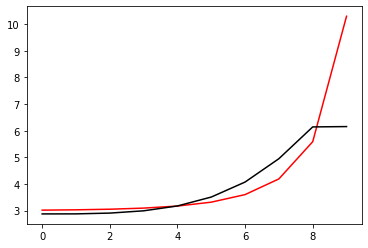

446600 0.010915227386657771
[2.95222153 2.95944812 2.99699941 3.09456272 3.29377444 3.65518723
 4.26545123 5.22527041 6.50498999 6.51427779]


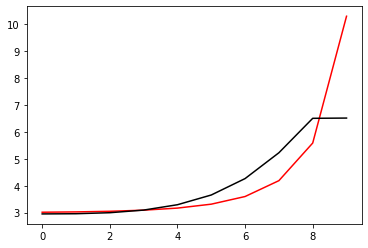

447700 0.01448634620403466
[2.88669512 2.89877238 2.93874475 3.03462427 3.22568682 3.56868146
 4.14462835 5.04556705 6.19906079 6.2343349 ]


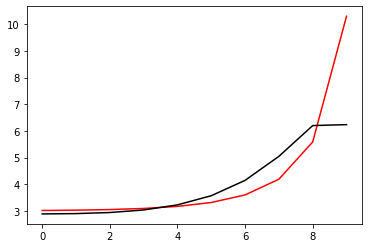

448800 0.0008340928905372054
[2.89641197 2.91097693 2.95376534 3.05257921 3.24697827 3.59429633
 4.17645919 5.08569183 6.24691455 6.2427961 ]


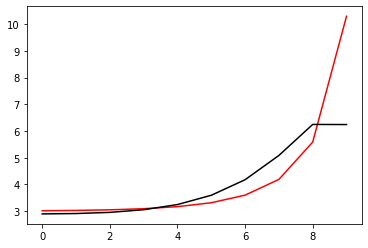

449900 0.010877692644769857
[2.89546029 2.91415493 2.96192879 3.06600422 3.2664309  3.62170744
 4.21586114 5.14306391 6.32486217 6.32747108]


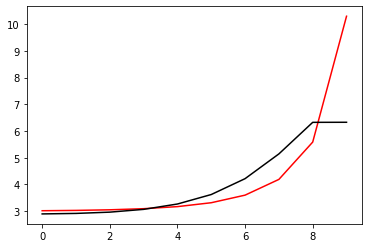

451000 0.011119645647614331
[2.88813715 2.91300943 2.969167   3.08239677 3.29344011 3.66282567
 4.27830638 5.23793052 6.45797879 6.47259111]


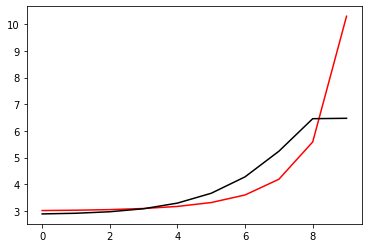

452100 0.011043372935038943
[2.87280547 2.8988523  2.96038241 3.08079645 3.30058114 3.68187597
 4.31619851 5.30911934 6.58362071 6.57641234]


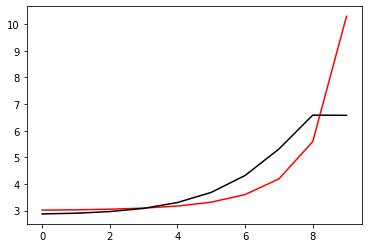

453200 0.09571034795036602
[2.69226332 2.69841529 2.74569504 2.85646763 3.0700649  3.44888922
 4.08516051 5.07965134 6.34529186 6.81486025]


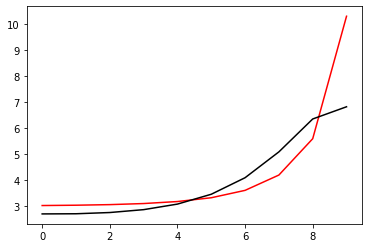

454300 0.017453495580567677
[2.89702035 2.89963837 2.93911562 3.03890659 3.23567875 3.58726886
 4.17860277 5.10319118 6.2816624  6.26215068]


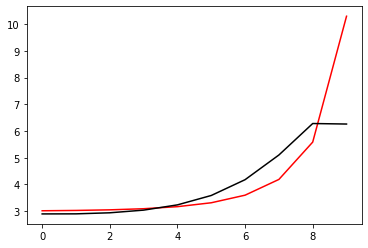

455400 0.03092232363443585
[2.88921949 2.90160224 2.94907628 3.05746136 3.26418582 3.62808596
 4.23606533 5.18495679 6.39908305 6.4118115 ]


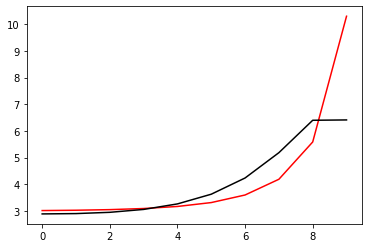

456500 0.016424438534362273
[2.82302849 2.84572738 2.90558145 3.02903936 3.25559629 3.6473256
 4.29728172 5.31131465 6.61576713 6.5702517 ]


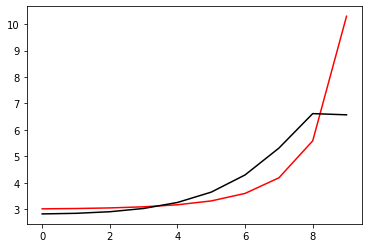

457600 0.011129070006622083
[2.85507603 2.86683933 2.9158138  3.03061723 3.25109522 3.63938913
 4.29062592 5.32106921 6.67856935 6.73643405]


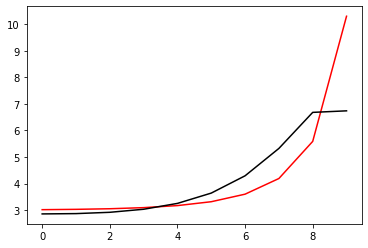

458700 0.011582338150015893
[2.90503431 2.90685016 2.94378823 3.04388513 3.24560968 3.60794201
 4.21870435 5.16218892 6.28985309 6.25673684]


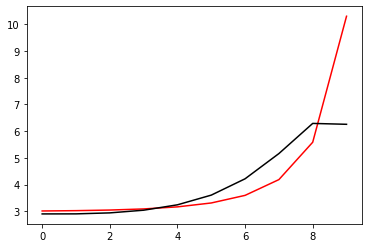

459800 0.0009510506105242991
[2.91563816 2.92849664 2.97589945 3.08699757 3.30088205 3.67689861
 4.30278202 5.2651286  6.42516978 6.4292276 ]


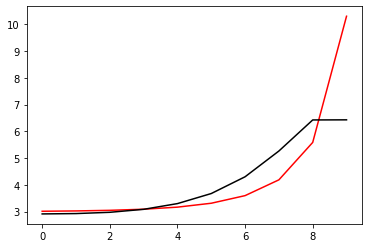

460900 0.011076010366058327
[2.9510862  2.95939151 3.00334852 3.1124814  3.3268439  3.70650711
 4.33990016 5.3196344  6.52637137 6.5195091 ]


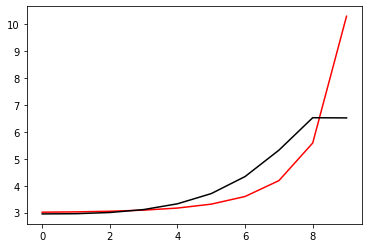

462000 0.011132716912123263
[2.8797704  2.89548528 2.94738277 3.06571702 3.29243574 3.69017987
 4.35167292 5.38109371 6.68200499 6.69629992]


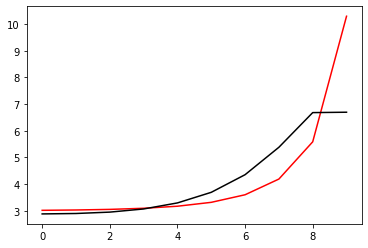

463100 0.01080483406088547
[2.92071684 2.92748842 2.96709248 3.06718796 3.26478509 3.61076691
 4.16867123 4.99185622 6.03815558 6.03784473]


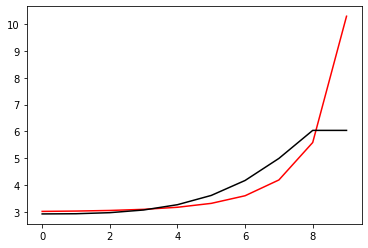

464200 0.02350401970752858
[2.88192695 2.89398226 2.93897352 3.04510176 3.25045233 3.60850055
 4.18969743 5.05787738 6.14230498 6.11296193]


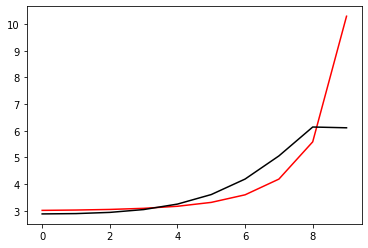

465300 0.013425331939391296
[2.8793887  2.90031397 2.95529306 3.07268226 3.29238566 3.67191813
 4.29030806 5.21565269 6.32763927 6.32518634]


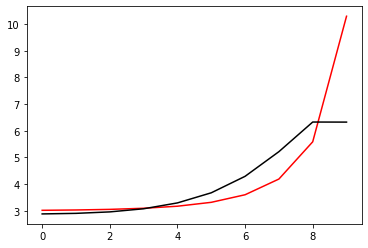

466400 0.031090090681516833
[2.89093349 2.91906247 2.98471113 3.11490476 3.35134643 3.7561371
 4.41730141 5.40870827 6.56445363 6.58949727]


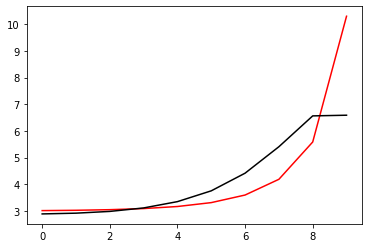

467500 0.19825931239982345
[2.64627678 2.6671735  2.72897902 2.85566297 3.08714923 3.48420972
 4.13255906 5.09879789 6.19508614 6.42887109]


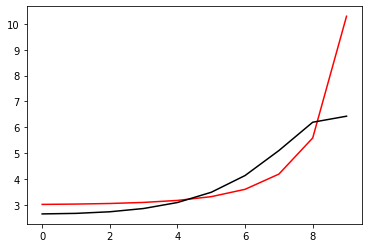

468600 0.010865829079709552
[2.87553769 2.89571215 2.95429322 3.07416332 3.2923393  3.66334879
 4.25887997 5.12267736 6.07895511 6.077228  ]


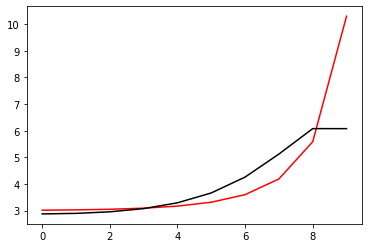

469700 0.011408161019661923
[2.86957249 2.89327961 2.95558075 3.07981407 3.30342528 3.68215066
 4.29026833 5.17552098 6.15488448 6.14162832]


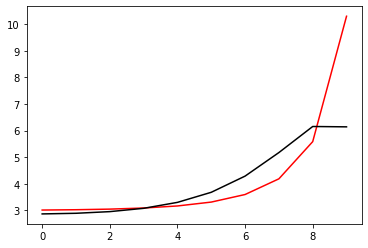

470800 0.000977984273746365
[2.8639126  2.89254468 2.96054014 3.09139164 3.32313198 3.71315205
 4.33925558 5.25492565 6.26887489 6.3063088 ]


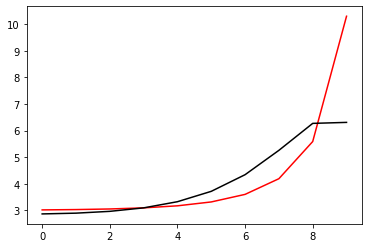

471900 0.01107543719516443
[2.86065147 2.8944403  2.96994521 3.10989045 3.35291175 3.75847402
 4.40888013 5.36595087 6.43252853 6.42046396]


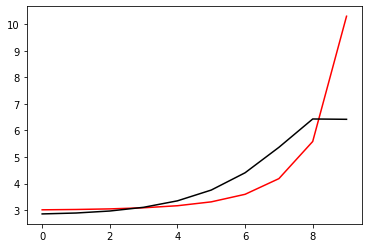

473000 0.011201642787443365
[2.82672497 2.86340394 2.94546398 3.09419117 3.3480356  3.7679878
 4.44116566 5.44487642 6.59574856 6.56447096]


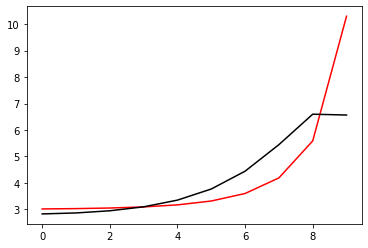

474100 0.7565031248315953
[3.17554002 3.20492259 3.28291624 3.43057649 3.68521421 4.10675583
 4.77858868 5.74450322 6.67911245 6.81916766]


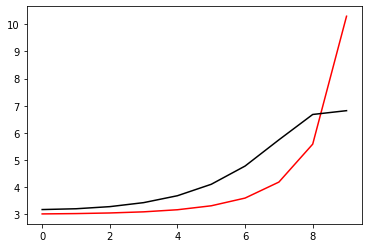

475200 0.024433455304367593
[2.89848948 2.89514484 2.93591785 3.04392122 3.25378173 3.62133745
 4.22679655 5.12537399 6.05181508 6.01277617]


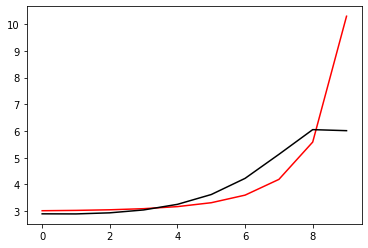

476300 0.01580663999576368
[2.87390618 2.88255094 2.9331718  3.05335658 3.27955284 3.66934453
 4.30525524 5.24760316 6.24454688 6.23409013]


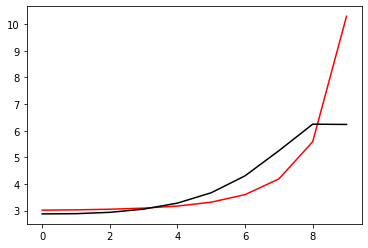

477400 0.031088321724031705
[2.91433155 2.93517458 2.9974015  3.13016486 3.37203752 3.78170503
 4.44263349 5.42068639 6.48675596 6.53074625]


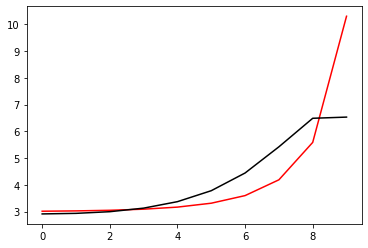

478500 0.011495448459713465
[2.85431748 2.86353744 2.91112583 3.0228983  3.23341022 3.59112527
 4.15758446 4.97422286 5.88117356 6.1156058 ]


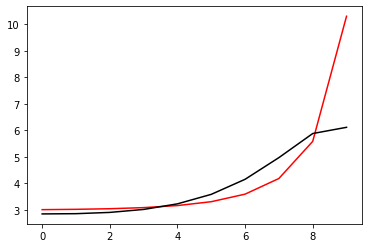

479600 0.010798752818012325
[2.8726465  2.88496961 2.93509972 3.04937874 3.2626225  3.62363663
 4.1943734  5.0152588  5.92287273 5.92254546]


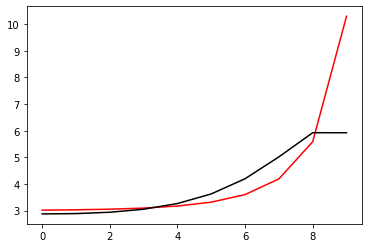

480700 0.011163004790322716
[2.88527145 2.90457787 2.9618404  3.08413394 3.30761875 3.68355892
 4.27824527 5.13265942 6.06148951 6.01760928]


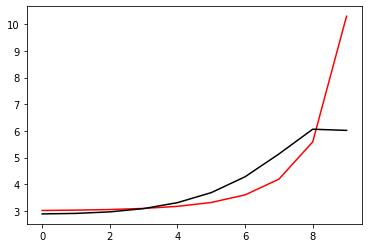

481800 0.000967983184637359
[2.89116304 2.91776882 2.98367359 3.11567946 3.35151479 3.74546074
 4.36936846 5.26824847 6.23680084 6.32016265]


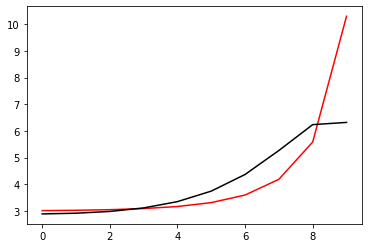

482900 0.011085154419335512
[2.87204138 2.90291096 2.97637831 3.1177026  3.36578402 3.77808511
 4.43307046 5.38753828 6.42999587 6.40418139]


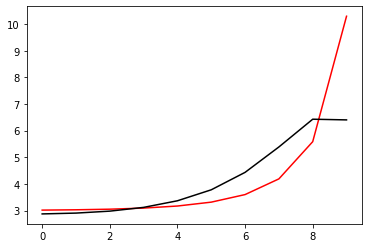

484000 0.011013517829000407
[2.88664803 2.90246235 2.95975959 3.08150737 3.30236078 3.67110561
 4.24612741 5.0472087  5.88303595 5.88261619]


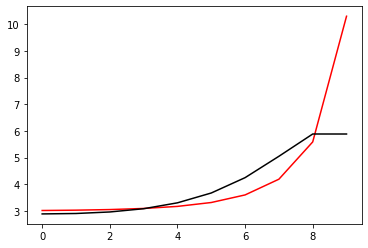

485100 0.01092905418653915
[2.87780545 2.89730685 2.95797678 3.08361105 3.30933947 3.68517027
 4.27235152 5.09517617 5.95390265 5.95325901]


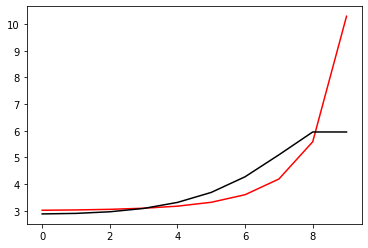

486200 0.02218951831228153
[2.83996768 2.86651019 2.93470373 3.06911887 3.30618841 3.69899783
 4.315871   5.19143854 6.10549568 6.06464973]


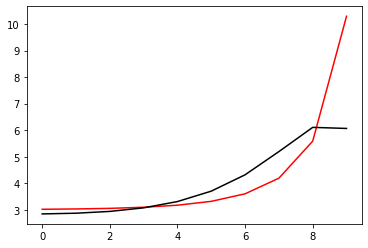

487300 0.012384798260502932
[2.87758228 2.91158401 2.99021868 3.13800647 3.39330427 3.81347369
 4.47448269 5.41439078 6.37728072 6.35699147]


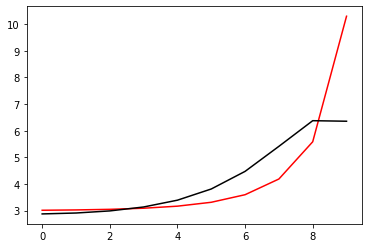

488400 0.23884584710320472
[2.63103167 2.65017093 2.71751673 2.85599706 3.10297988 3.51473985
 4.16516876 5.09183968 6.05354856 6.49899303]


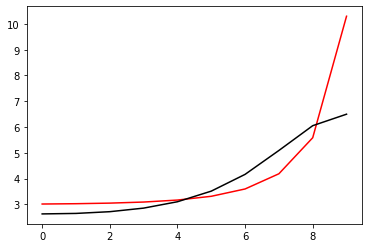

489500 0.012460467571000073
[2.85780731 2.87990801 2.94611306 3.07825026 3.31005641 3.69018486
 4.27651181 5.08393486 5.89282071 5.883213  ]


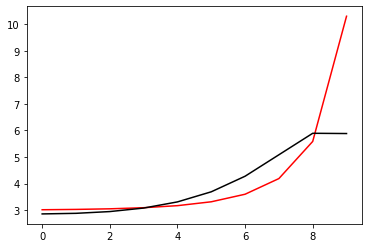

490600 0.01092830699878209
[2.84097224 2.86758059 2.93821601 3.07558971 3.314137   3.70417928
 4.30762138 5.1455358  5.98708759 5.9930723 ]


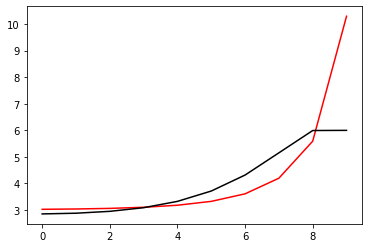

491700 0.011069240419963143
[2.8589538  2.89260586 2.97166286 3.11940923 3.37177982 3.78223113
 4.41865219 5.3057009  6.18606629 6.10090389]


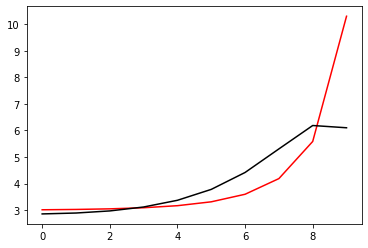

492800 0.0011057268038594768
[2.85257274 2.88903517 2.9730031  3.12691238 3.38704194 3.8081122
 4.46168567 5.38452075 6.32597418 6.3502533 ]


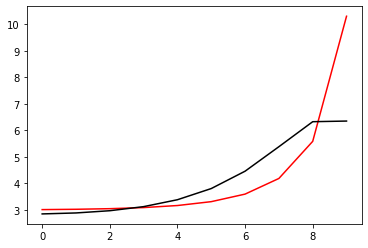

493900 0.010822529765919575
[2.88791218 2.90317827 2.9652206  3.09456874 3.32327945 3.69821188
 4.27560678 5.067343   5.83305043 5.83300223]


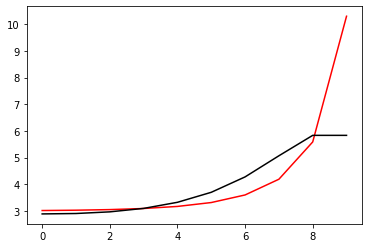

495000 0.011027401388255491
[2.87148684 2.89198202 2.95841962 3.09311637 3.32881625 3.7137452
 4.30713873 5.12664684 5.9321655  5.93069577]


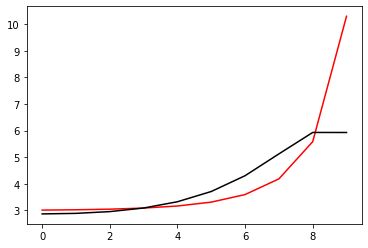

496100 0.010972650859887526
[2.86621539 2.89363826 2.96688613 3.10953887 3.35542206 3.75450039
 4.36971278 5.22621104 6.08570337 6.08954008]


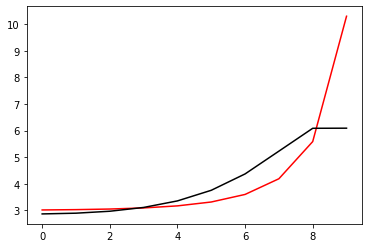

497200 0.021753438168729603
[2.80443448 2.83352623 2.9103813  3.05974457 3.31727523 3.73648246
 4.38884741 5.31801993 6.29208513 6.22752078]


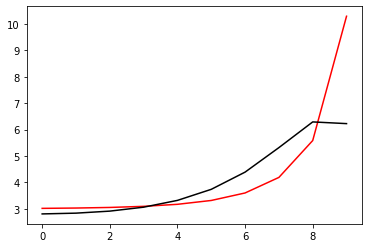

498300 0.016846361162472796
[2.85686069 2.88009252 2.94801341 3.0844955  3.32171955 3.70528148
 4.28936286 5.08819489 5.88531568 5.85183106]


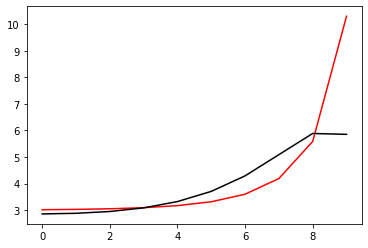

499400 0.03099772111991972
[2.86839192 2.89685071 2.97125352 3.11623848 3.3660013  3.77013772
 4.3926752  5.26507106 6.14090086 6.15840556]


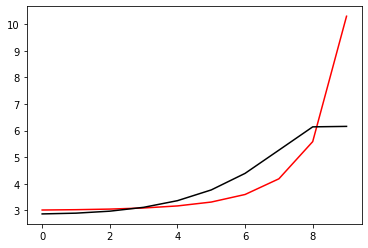

In [26]:
optimizer=tf.optimizers.Adam(learning_rate=0.001)
for j in range (5000):    
    with tf.GradientTape() as g:
        loss=Error_func(h, Positive[j%10], Negative[j%10])
        gradients=g.gradient(loss, [h])
    for i in range (100):
        optimizer.apply_gradients(zip(gradients, [h]))
    if j%11==0: 
        print(j*100, Error_func(h, Positive[j%10], Negative[j%10]).numpy()), print(h.numpy())
        plt.plot(h_real, 'r-'), plt.plot(h.numpy(), 'k-'), plt.show()

0 0.012649972812392607
[2.82718336 2.84564613 2.91044676 3.04681483 3.2887427  3.68518507
 4.29918716 5.16591144 6.26143268 6.17667382]


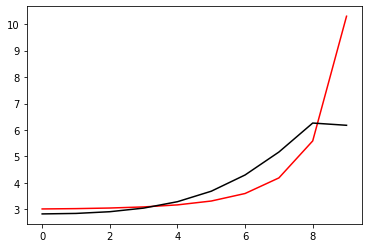

1100 0.6459992741837478
[3.08957637 3.11332588 3.18517037 3.33197629 3.59189762 4.02127876
 4.69307166 5.53492394 6.45482546 6.76304606]


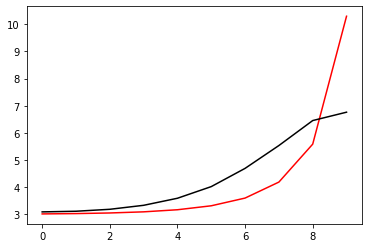

2200 0.022542430945776657
[2.85901937 2.86958645 2.92600608 3.0558689  3.29607605 3.7010116
 4.34101113 5.16019145 6.08992966 6.07071382]


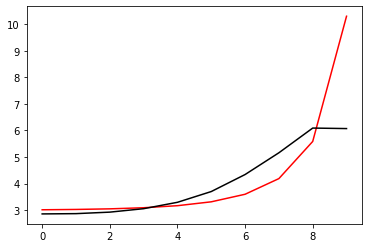

3300 0.011845539648157346
[2.8714402  2.89394055 2.96135044 3.10261024 3.35548639 3.77488783
 4.42972183 5.28089953 6.24960497 6.20916964]


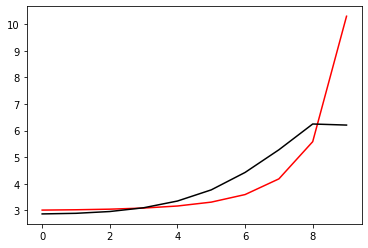

4400 0.031242107221140056
[2.93885352 2.96261262 3.03218943 3.17610872 3.43280118 3.85709373
 4.51598913 5.39394995 6.401903   6.42332352]


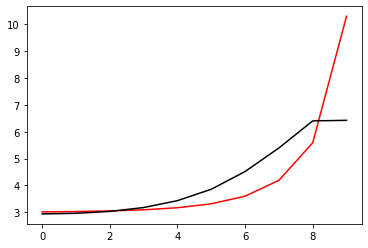

5500 0.012144496626498294
[2.84657059 2.87128031 2.94261492 3.08862095 3.34831225 3.7768101
 4.44151188 5.35625425 6.4269376  6.38340398]


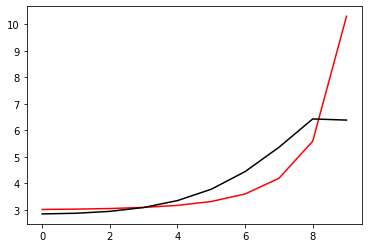

6600 0.01077032876435013
[2.88774269 2.90069556 2.95600609 3.0789408  3.30293425 3.67114382
 4.22624744 4.96007937 5.80904038 5.91972883]


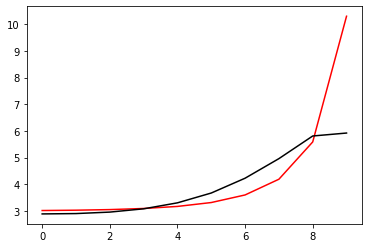

7700 0.011521172833620873
[2.88083018 2.89799373 2.95722302 3.08462539 3.31440496 3.69137209
 4.26205156 5.02358572 5.89188138 5.87103711]


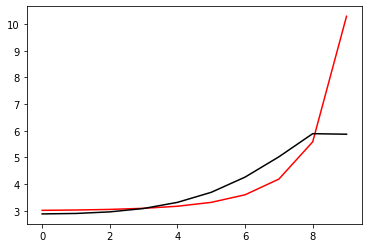

8800 0.0008879651928272158
[2.87688793 2.90005298 2.96529218 3.0993648  3.33759404 3.72708234
 4.31955504 5.11945082 6.01470301 6.030333  ]


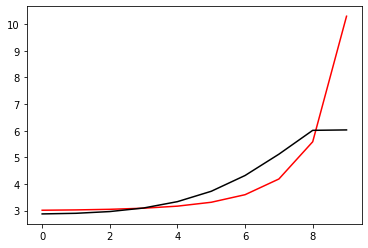

9900 0.010991847917459625
[2.87854135 2.90811917 2.98113057 3.12402482 3.37355021 3.77987254
 4.40154435 5.25360604 6.19060603 6.16207506]


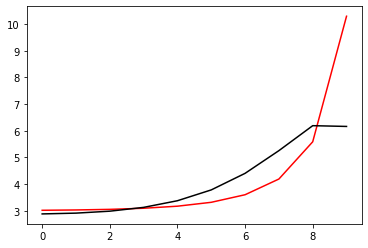

11000 0.011164391737242662
[2.85426546 2.88577862 2.96287389 3.11049845 3.3656897  3.78034998
 4.41878102 5.31640278 6.32208621 6.34075184]


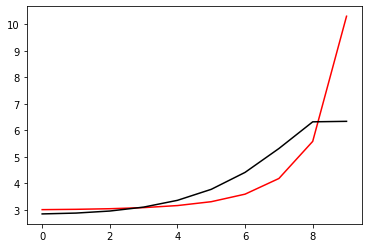

12100 0.01183318292425724
[2.87509745 2.8829663  2.93598149 3.05728498 3.2798439  3.64784148
 4.20948867 4.9693584  5.77391088 5.75810548]


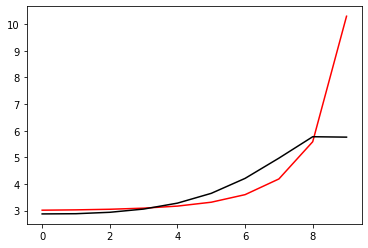

13200 0.0234584636757641
[2.86485576 2.87760777 2.93434497 3.05981321 3.28753016 3.66284936
 4.23650086 5.01734256 5.84681501 5.82680931]


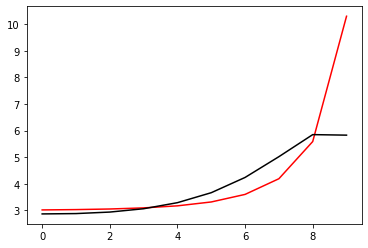

14300 0.015650518292284848
[2.86324362 2.88418702 2.94830629 3.08188367 3.31957078 3.70871649
 4.30394137 5.11952323 5.98651439 5.99401019]


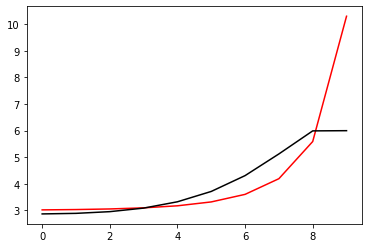

15400 0.0309900822642899
[2.87205029 2.89869444 2.96961903 3.11128279 3.35974084 3.76484297
 4.3864129  5.24773179 6.17044647 6.17476536]


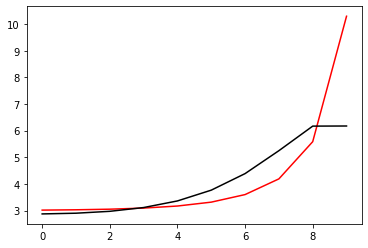

16500 0.01969885707352163
[2.90660056 2.92317754 2.98473345 3.11997992 3.36596269 3.77462333
 4.41219203 5.31987928 6.32329888 6.31542836]


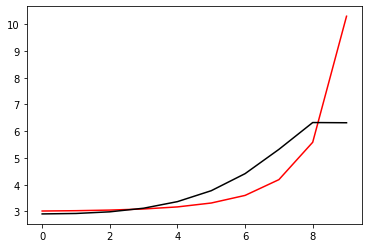

17600 0.01110856059979215
[2.8558187  2.85965855 2.90476376 3.0189433  3.23699146 3.60582109
 4.18322515 4.99889755 5.88313458 5.89823121]


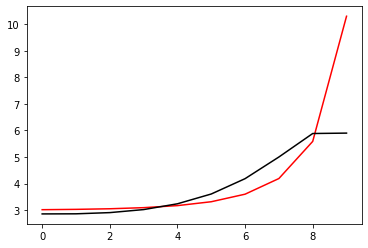

18700 0.011259080653676467
[2.89249653 2.90360684 2.95481627 3.07529652 3.30057612 3.67856311
 4.26857843 5.10294722 6.01241846 5.96861119]


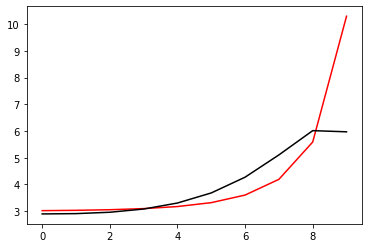

19800 0.000933684474643817
[2.90280123 2.92320296 2.98357178 3.11346168 3.34974532 3.74230954
 4.35400265 5.22384157 6.18585783 6.24356754]


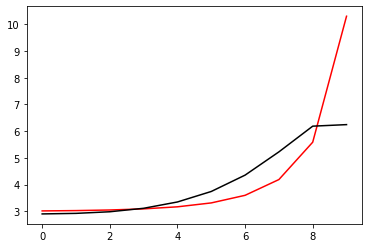

20900 0.011038155771010085
[2.88575203 2.90980711 2.97604107 3.11309301 3.35938205 3.76781185
 4.40728142 5.32989499 6.38016986 6.35322422]


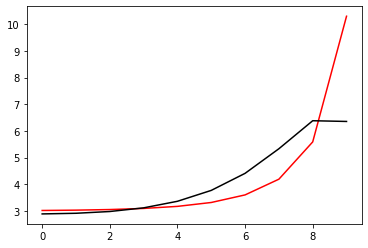

22000 0.010822699028451104
[2.87856727 2.87965984 2.92199867 3.03175992 3.24308844 3.60057299
 4.15649729 4.93975221 5.81275552 5.81284531]


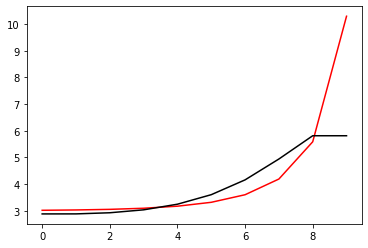

23100 0.011057312889992637
[2.89504314 2.90074981 2.9464419  3.05962597 3.27488846 3.63759123
 4.2012913  4.99573691 5.87943549 5.87464263]


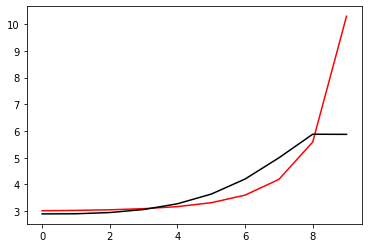

24200 0.02259620097072945
[2.86041903 2.87422469 2.92720359 3.04821514 3.2731865  3.65000956
 4.23735385 5.07176854 6.00414792 5.96730088]


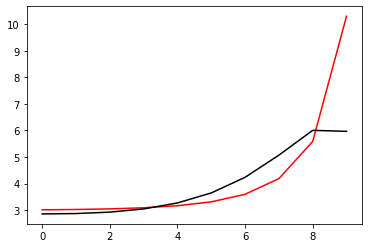

25300 0.013569648614816956
[2.86752322 2.88931892 2.95124718 3.08215968 3.31968391 3.7147784
 4.33170375 5.21317655 6.19928102 6.21959945]


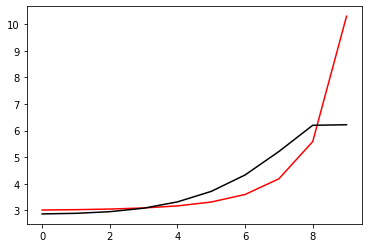

26400 0.031016048211075016
[2.91500015 2.92928278 2.98510412 3.11253771 3.35042504 3.75258358
 4.38993328 5.31771822 6.37459741 6.37566879]


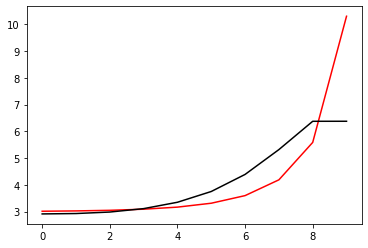

27500 0.027552984032318595
[3.02176959 3.03217226 3.07999478 3.19337818 3.40788455 3.76798093
 4.31028464 4.9019362  5.66912279 6.04315687]


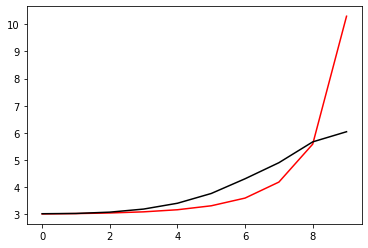

28600 0.010687135021339847
[2.89848323 2.92092202 2.97868359 3.09885398 3.31604964 3.67177912
 4.19282458 4.78824876 5.66291126 5.66401123]


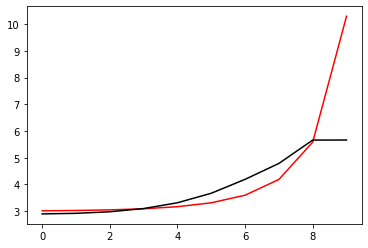

29700 0.011551924277928555
[2.87436745 2.90079795 2.96439053 3.09136087 3.31767617 3.68924967
 4.2532572  5.00911118 5.849752   5.79556376]


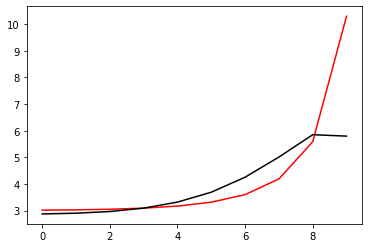

30800 0.0008122779233379373
[2.95896495 2.97173622 3.02514832 3.14446519 3.36547468 3.73591641
 4.31285399 5.12211252 5.96318358 5.97462703]


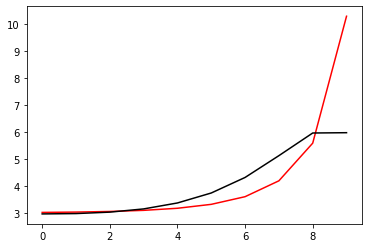

31900 0.01063750774599879
[2.94109202 2.9259212  2.9480528  3.03439296 3.21812193 3.54351446
 4.06959603 4.84286006 5.60967334 5.61017611]


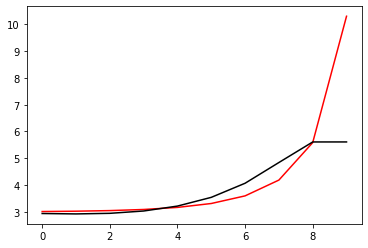

33000 0.010783129962969614
[2.90658125 2.90130422 2.92857075 3.01992014 3.21034942 3.54707157
 4.09482519 4.91061046 5.77331778 5.7713321 ]


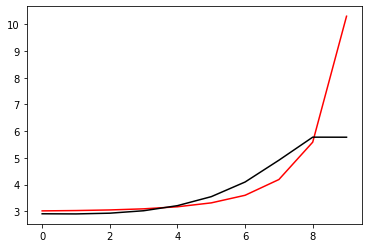

34100 0.001097534223835092
[2.98508767 2.99750315 3.04457177 3.15753147 3.37565758 3.75312439
 4.36562334 5.27978257 6.27191641 6.1839757 ]


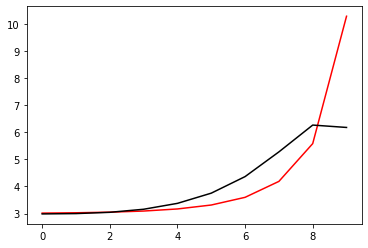

35200 0.024229419355291257
[2.88946319 2.89492621 2.93301781 3.03310572 3.23158121 3.57703473
 4.13425295 4.95435301 5.81756165 5.79672984]


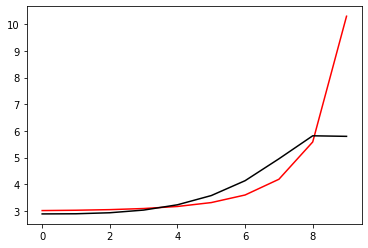

36300 0.01912144614054961
[2.88585842 2.89655452 2.93961763 3.04470033 3.24891589 3.60212753
 4.17093875 5.00785559 5.89442586 5.88435099]


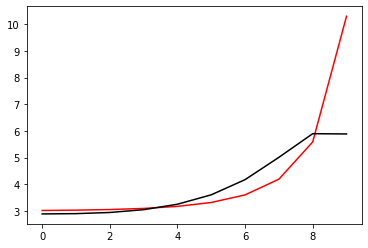

37400 0.030830553261564902
[2.86916048 2.88630164 2.93622098 3.04802437 3.25974682 3.62304725
 4.20732799 5.06853792 5.99361459 5.99292513]


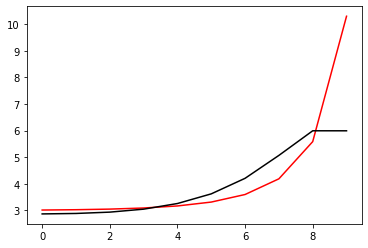

38500 0.013912263981384142
[2.88602956 2.90163498 2.95334893 3.06864129 3.28627935 3.66028959
 4.26408505 5.15942639 6.14290126 6.15387765]


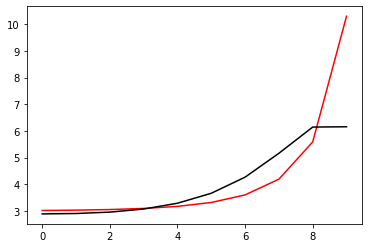

39600 0.010857074165184348
[2.96101841 2.97031763 3.01593794 3.12532202 3.33640387 3.70290698
 4.29798743 5.1894488  6.21251935 6.20300919]


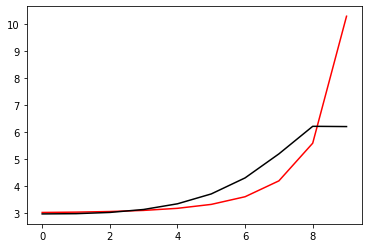

40700 0.0110809309989816
[2.96479044 2.95128752 2.97105277 3.05297752 3.23401243 3.566321
 4.11774627 4.90412717 5.69845764 5.67322012]


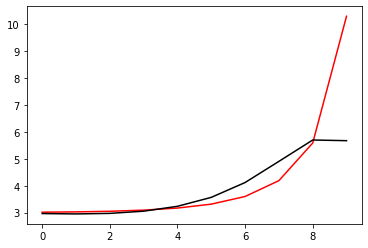

41800 0.0007111411446299468
[2.90402802 2.89776278 2.92259447 3.01065384 3.20024315 3.5449089
 4.11389368 4.92958189 5.77074909 5.77357266]


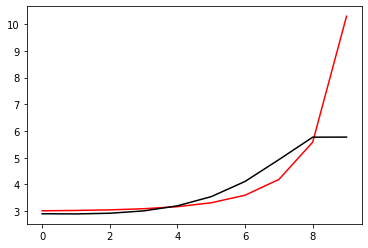

42900 0.010801246728288392
[2.95459744 2.95351983 2.9822958  3.07365465 3.26699827 3.61632423
 4.19116411 5.02289968 5.90346428 5.89290865]


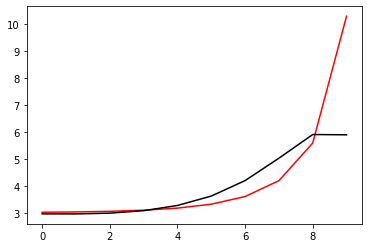

44000 0.0703134363817762
[2.8184747  2.80766346 2.82705017 2.90764336 3.08723438 3.41470587
 3.94681071 4.70173959 5.49265815 5.4980943 ]


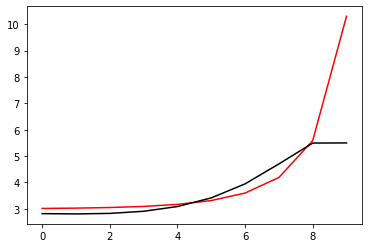

45100 0.01870328341312076
[2.92186324 2.90287845 2.91372981 2.9860551  3.15696386 3.47399115
 3.99146103 4.72524433 5.49112057 5.48513666]


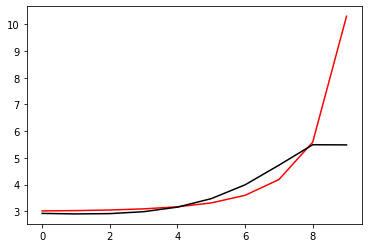

46200 0.024723458331944056
[2.91237769 2.89924349 2.91411335 2.9903091  3.16568309 3.48880828
 4.01593797 4.7667505  5.5582705  5.54528801]


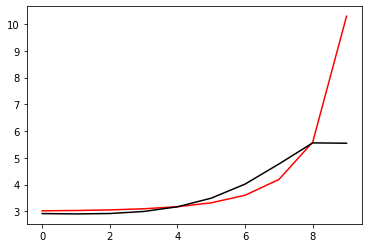

47300 0.020522693589141043
[2.90061365 2.89621076 2.91797586 3.00050304 3.18291512 3.51537786
 4.05707052 4.83358868 5.66431168 5.61526271]


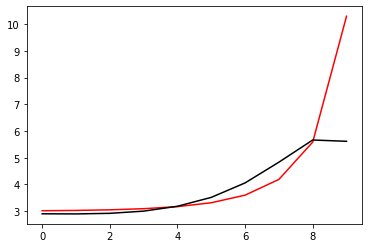

48400 0.030773159936439514
[2.94075192 2.94940824 2.98394538 3.07821422 3.27305395 3.62077092
 4.18380202 4.99355197 5.87009354 5.91816601]


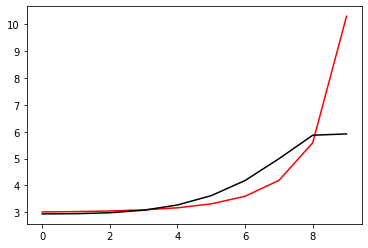

49500 0.015404898239765121
[2.88420205 2.91001378 2.96715443 3.08504509 3.30693675 3.69079093
 4.30897984 5.20835603 6.20635787 6.16518357]


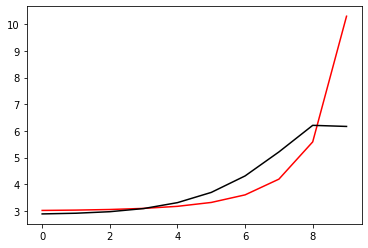

50600 0.010596844629112374
[2.90383471 2.90677916 2.94283816 3.03417062 3.21624542 3.53407115
 4.0311375  4.7158723  5.49693208 5.62902304]


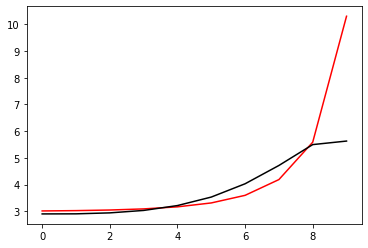

51700 0.018280919742909074
[2.89367222 2.90122488 2.94136545 3.0377488  3.22632294 3.55407237
 4.06992777 4.78859647 5.5927386  5.58121826]


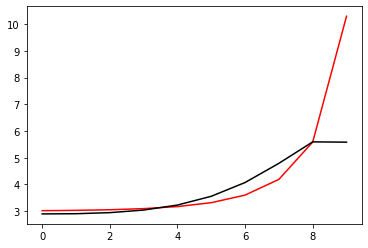

52800 0.0007006431961308873
[2.88156497 2.89558854 2.94217831 3.04616201 3.24425673 3.58614223
 4.12803587 4.89329688 5.73178627 5.73840548]


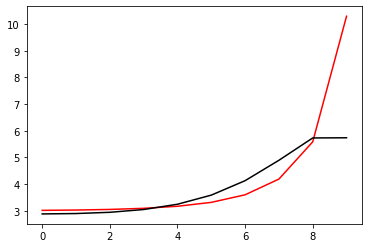

53900 0.010810085662761742
[2.90919692 2.93099166 2.98704554 3.10218977 3.31423071 3.67624312
 4.2522668  5.07078349 5.94099613 5.90408158]


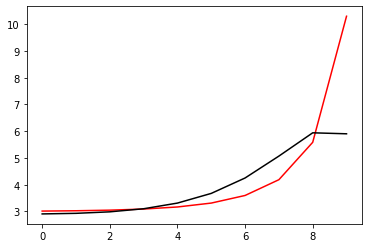

55000 0.011336256147486692
[2.92199037 2.92891878 2.96974219 3.06929805 3.26231604 3.59635496
 4.1260058  4.88550944 5.78560026 5.76190008]


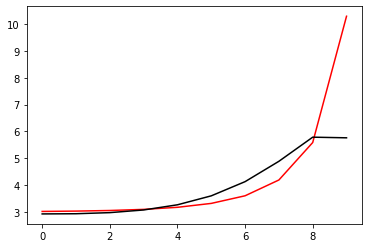

56100 0.010206413014558224
[2.95692398 2.96537812 3.00727777 3.11197497 3.31762053 3.67936994
 4.27391837 5.17362821 6.19807558 6.0621314 ]


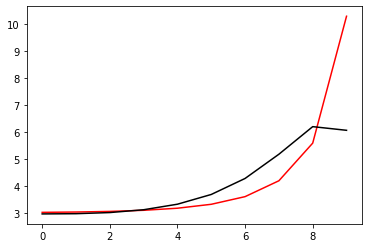

57200 0.026796348576291703
[2.93765118 2.91496303 2.92664503 3.0009615  3.17388451 3.49616879
 4.03395707 4.81870908 5.6876625  5.69137075]


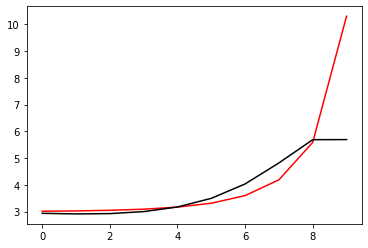

58300 0.020146171434980563
[2.9321434  2.91471322 2.92985169 3.00779003 3.18510051 3.51336525
 4.06000888 4.85905078 5.74670385 5.74211672]


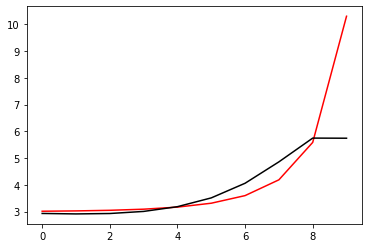

59400 0.030707617428479488
[2.92020665 2.91051933 2.93120861 3.01467521 3.19855986 3.535701
 4.09552093 4.91643536 5.83419275 5.83548802]


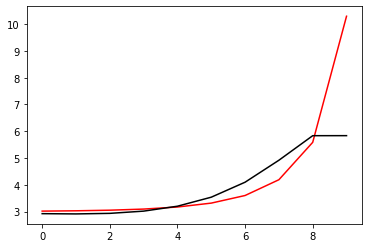

60500 0.01123632440895963
[2.87784209 2.87899845 2.90914187 3.00202795 3.19730341 3.5502705
 4.13455162 4.99727488 5.97379306 5.93772665]


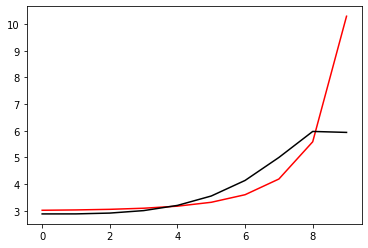

61600 0.010808782588454647
[2.903184   2.9042753  2.93502663 3.02838748 3.22529083 3.58234277
 4.17550827 5.06209154 6.08814514 6.09849101]


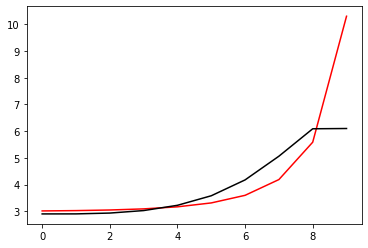

62700 0.011065376425068383
[2.90482632 2.92910129 2.98772503 3.11096794 3.34333675 3.74806372
 4.411067   5.40035343 6.53773881 6.53976536]


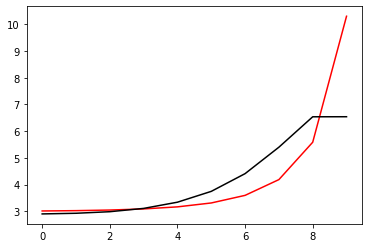

63800 0.0007707737032349443
[2.90454559 2.91835414 2.96650805 3.07381201 3.27866429 3.63377019
 4.20291994 5.02213358 5.93825995 5.98296881]


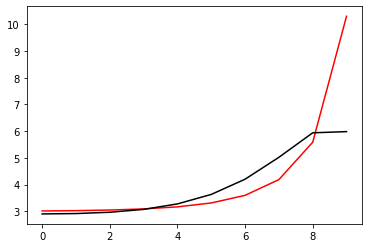

64900 0.010801672342154523
[2.89354909 2.90991819 2.9606773  3.07094514 3.2793694  3.63957021
 4.2175813  5.05313985 5.9877029  5.98902898]


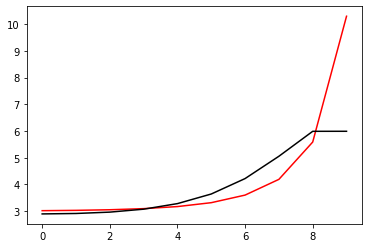

66000 0.010987854797628349
[2.88434387 2.90470563 2.95984216 3.07506602 3.28943079 3.65796233
 4.24997861 5.11010456 6.07107764 6.06935583]


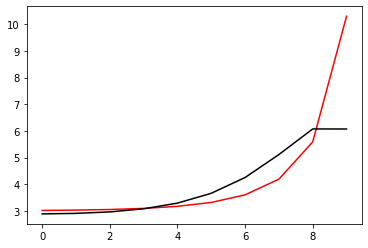

67100 0.010941386773998182
[2.87857366 2.90452437 2.96658441 3.0896539  3.31333063 3.6946389
 4.30742009 5.20282141 6.20234211 6.19652346]


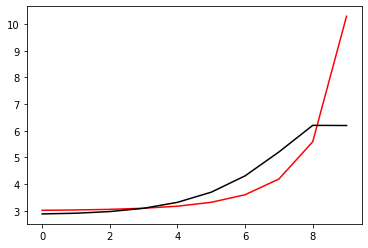

68200 0.021512302736045496
[2.81463144 2.84833998 2.92184634 3.05900695 3.30056612 3.70793999
 4.36549756 5.34163318 6.43829124 6.37174959]


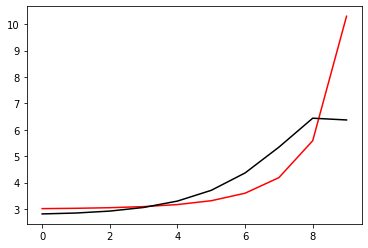

69300 0.07227536572157504
[3.00159232 3.01606374 3.07727155 3.20944926 3.45375307 3.87476347
 4.5629734  5.58320059 6.71701582 6.85151219]


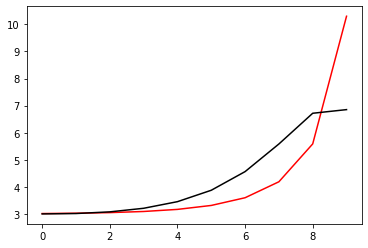

70400 0.03088188691374798
[2.88245005 2.89972806 2.95887594 3.08314829 3.30915058 3.69107429
 4.29309789 5.12810182 6.05042488 6.03695334]


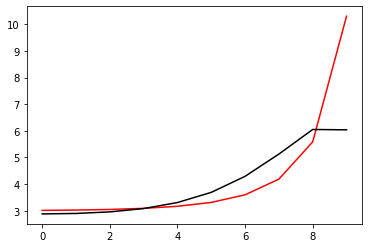

71500 0.011435319087262417
[2.84028895 2.86449786 2.93060003 3.06325677 3.30045762 3.69999795
 4.33716597 5.24454414 6.20941505 6.18638074]


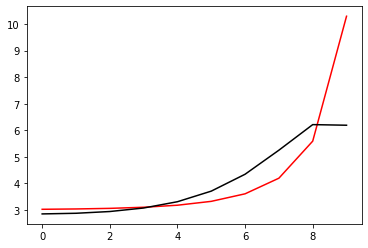

72600 0.0112134064572309
[2.82118472 2.85344449 2.92931683 3.07384382 3.32690714 3.75077221
 4.43195737 5.41724657 6.42713242 6.45124136]


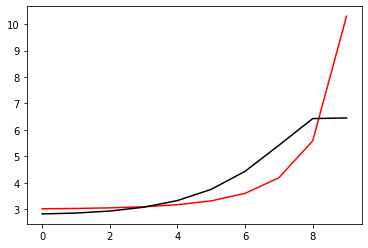

73700 0.01124387274640218
[2.90998694 2.94468652 3.02584157 3.17731813 3.43920331 3.87429333
 4.56822591 5.56706539 6.59490734 6.58908404]


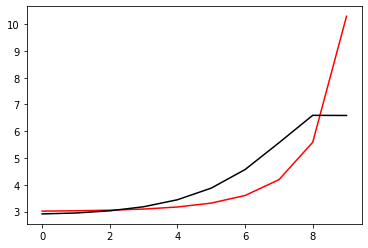

74800 0.00091932957660125
[2.89139508 2.90339724 2.96238901 3.09080136 3.32470453 3.72000524
 4.34892638 5.21486698 6.0339263  6.10259297]


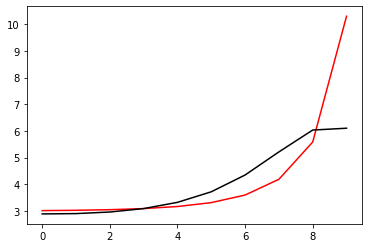

75900 0.010943380483630182
[2.87485019 2.88922074 2.94979206 3.08002773 3.3162559  3.71493098
 4.34969903 5.22960994 6.06975251 6.07071686]


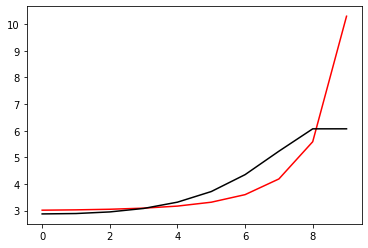

77000 0.011031707705201356
[2.8634805  2.88157372 2.94491754 3.07826055 3.31840443 3.72255825
 4.3660336  5.26453352 6.13119216 6.13132626]


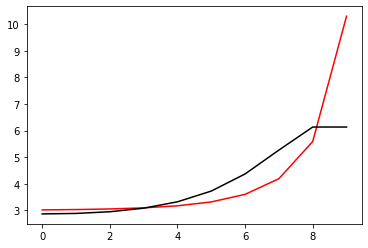

78100 0.011066889776866349
[2.85489    2.87827078 2.94620611 3.08452336 3.33083041 3.74336103
 4.39951024 5.3238764  6.2290647  6.22553032]


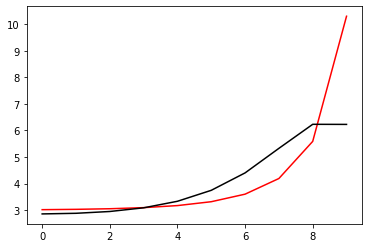

79200 0.021632099627421558
[2.81971109 2.85078929 2.92717758 3.07488648 3.33303438 3.76221171
 4.44509657 5.42285956 6.40640916 6.36885926]


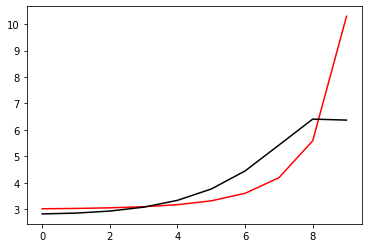

80300 0.6083575793116206
[3.07865238 3.10271162 3.17617163 3.32382505 3.5854482  4.02207785
 4.71477463 5.69808578 6.6713398  6.66184878]


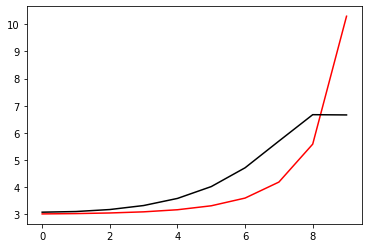

81400 0.030983758030793382
[2.89223853 2.89889013 2.95176742 3.07709572 3.31237607 3.71508701
 4.36230854 5.29132191 6.22230266 6.21744675]


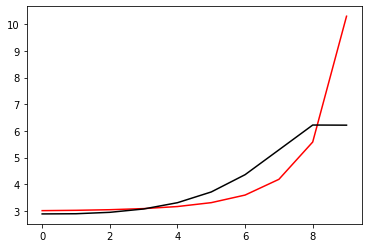

82500 0.01144819745053145
[2.83482975 2.85329327 2.91678318 3.05456716 3.30576141 3.72955529
 4.40592514 5.38038067 6.38929824 6.3591009 ]


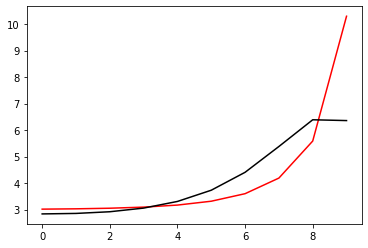

83600 0.01116277968650091
[2.93739921 2.96023437 3.02733539 3.16763942 3.42059177 3.84445094
 4.51817453 5.49455405 6.53934092 6.5591371 ]


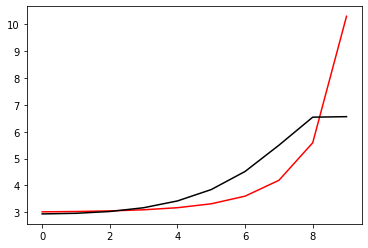

84700 0.011240740398296943
[2.95045289 2.96333195 3.02309773 3.15827734 3.40901957 3.83420249
 4.51479088 5.51768709 6.65325246 6.68284112]


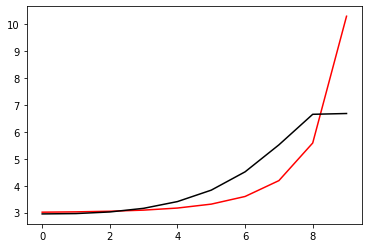

85800 0.0009121568981962253
[2.93178314 2.90954108 2.93150976 3.02972378 3.24334351 3.62908865
 4.2635944  5.19966132 6.23097419 6.22657743]


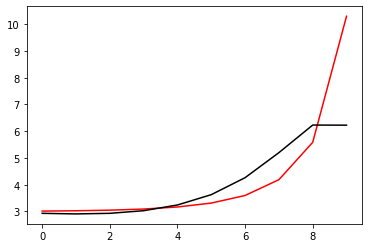

86900 0.01096226069913686
[2.92730431 2.91961488 2.95063568 3.05697964 3.27911398 3.67435037
 4.32018517 5.27330519 6.33692715 6.34287951]


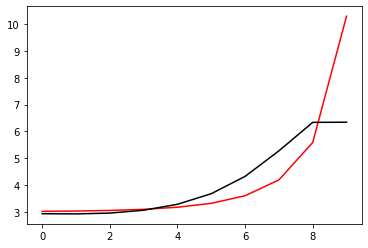

88000 0.011133596526569003
[2.8925706  2.89869291 2.94142671 3.058542   3.29324433 3.70471029
 4.37281896 5.36094485 6.48606935 6.47963207]


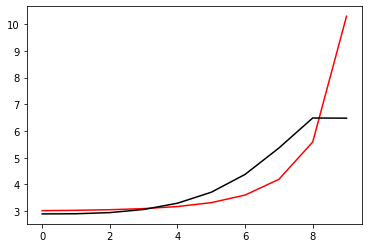

89100 0.7217294128415151
[3.19562472 3.19739726 3.23609383 3.34735549 3.57546947 3.97901524
 4.63196493 5.57941922 6.62720181 6.65797242]


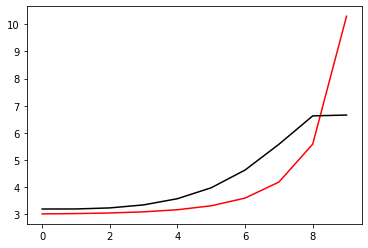

90200 0.022406404269574298
[2.88788641 2.8822724  2.91115372 3.01130245 3.22655161 3.61501544
 4.25121721 5.1867131  6.24409022 6.21707192]


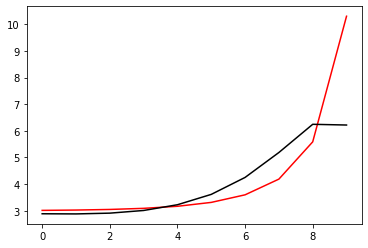

91300 0.013480941318896747
[2.8862665  2.89443612 2.93656348 3.04936846 3.27775966 3.68122515
 4.33616578 5.29899717 6.40037202 6.4031223 ]


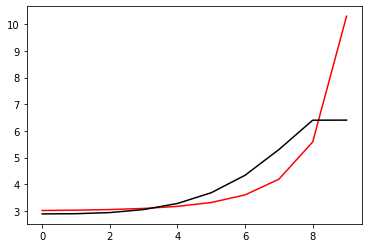

92400 0.3153172162510368
[2.66605896 2.655462   2.67979467 2.77376345 2.98153396 3.36151098
 3.98926481 4.92895273 6.0387659  6.37324994]


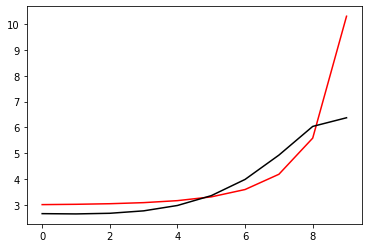

93500 0.011921590302632883
[2.89888103 2.89452664 2.92047221 3.010518   3.20541572 3.55567106
 4.11740876 4.91686661 5.83561194 5.82330123]


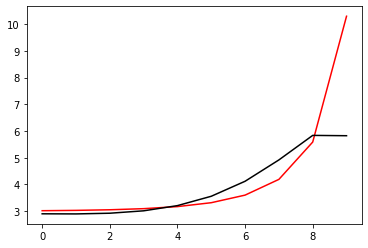

94600 0.010806950569126395
[2.87912165 2.88161864 2.91362808 3.00947653 3.21095297 3.57097169
 4.15194484 4.99008146 5.93868096 5.95104724]


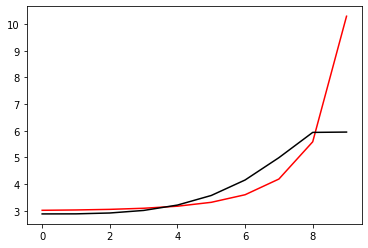

95700 0.010931315082807357
[2.91716734 2.92900471 2.97116608 3.07735732 3.29112548 3.66937431
 4.28235062 5.16744866 6.12870588 6.07055236]


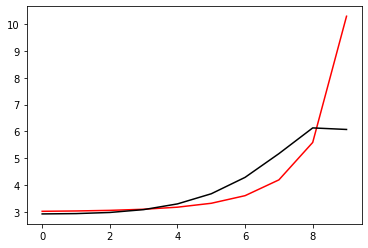

96800 0.0008578359274016482
[2.98744052 2.99138607 3.02686109 3.12626375 3.33231817 3.70153183
 4.30357715 5.18658721 6.18663566 6.18724488]


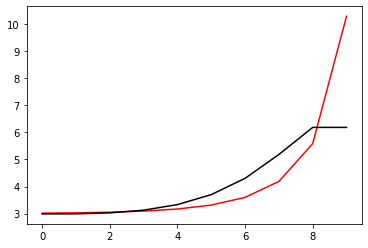

97900 0.010908657898466704
[2.90704959 2.91810121 2.96031374 3.06506483 3.27455799 3.64678767
 4.25970323 5.19856449 6.32995056 6.26996184]


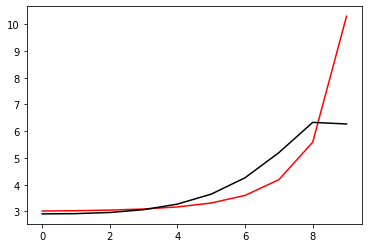

99000 0.010918288191945263
[2.91382206 2.89706709 2.91213669 2.98783627 3.16280358 3.48929468
 4.03229303 4.80788668 5.72068861 5.72259035]


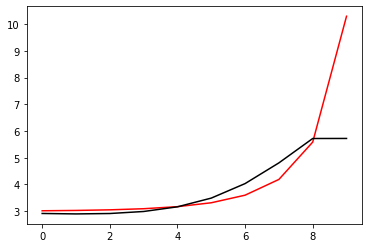

100100 0.011602237923814677
[2.9345103  2.92326705 2.94191314 3.02105507 3.19965022 3.53046239
 4.07897906 4.86455701 5.78925404 5.7604533 ]


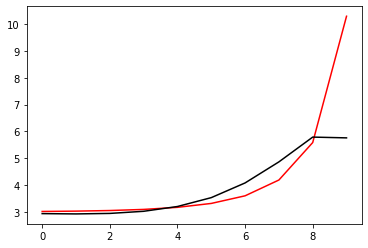

101200 0.023899181122009932
[2.89934933 2.89839592 2.92592019 3.01440248 3.2042026  3.5504434
 4.1227157  4.95049536 5.9313317  5.91363711]


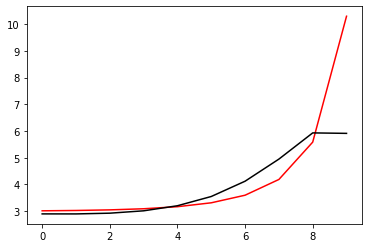

102300 0.019896429079054177
[2.88116639 2.88814393 2.923774   3.02034283 3.21954098 3.57857584
 4.17088682 5.03876627 6.07786574 6.09848579]


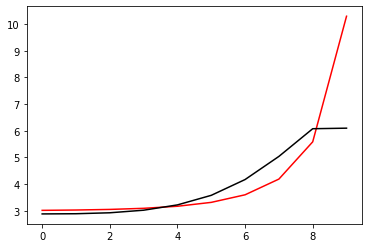

103400 0.04803552926861415
[2.82345745 2.82600642 2.85995554 2.95536427 3.15391685 3.51327273
 4.10883393 5.00163916 6.11401453 6.2082481 ]


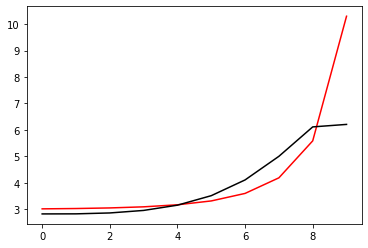

104500 0.012751405091897695
[2.91358378 2.90757528 2.93200939 3.01968222 3.21342113 3.57375762
 4.18448824 5.13086707 6.32061559 6.29257343]


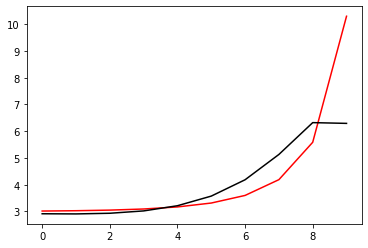

105600 0.041423286005781546
[2.80351668 2.79737332 2.82285533 2.91300597 3.11147859 3.48087748
 4.10892738 5.06751705 6.17781917 6.29864141]


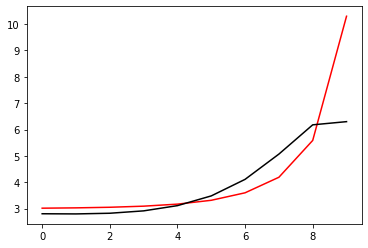

106700 0.011334571711614219
[2.94843153 2.92863286 2.94085823 3.01964154 3.20820064 3.56804926
 4.18406149 5.12362704 6.21024993 6.19888564]


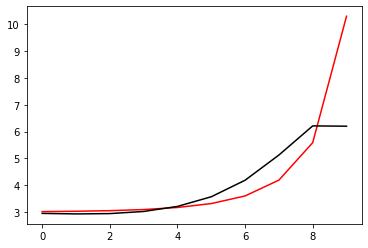

107800 0.0009069571529160171
[2.93635645 2.92682164 2.94704791 3.033926   3.23205936 3.60497711
 4.24099669 5.21300601 6.34194694 6.35584188]


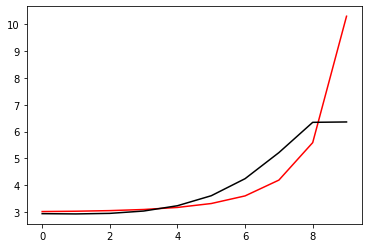

108900 0.011003632516332145
[2.935001   2.93836409 2.97044115 3.06857962 3.27929197 3.66850068
 4.32819175 5.33782396 6.51973638 6.49656917]


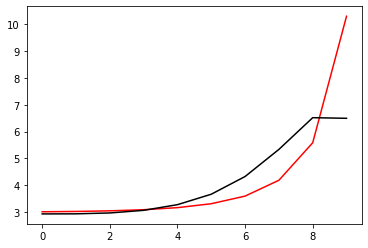

110000 0.02057506811175596
[3.00563997 3.00873647 3.03864839 3.12971226 3.32541595 3.68214168
 4.25522182 4.97823315 5.88919914 5.91255754]


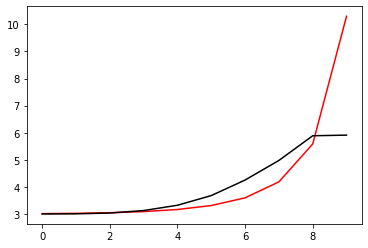

111100 0.002549699711149237
[2.99290064 2.99816191 3.03025677 3.12320545 3.32084605 3.68033869
 4.26037078 5.02546742 5.94295853 5.92946903]


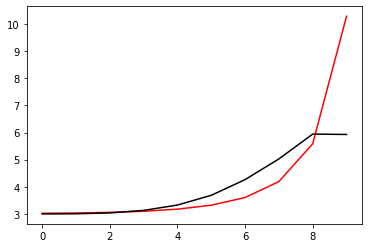

112200 0.02321716502763439
[2.88108266 2.89328449 2.93235448 3.03137816 3.2345491  3.6003793
 4.19629918 5.06785656 6.07108431 6.00769092]


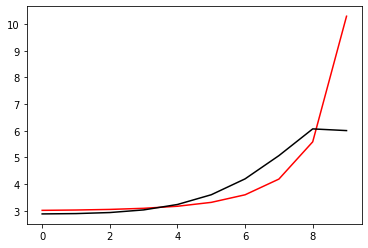

113300 0.01339319444708916
[2.87374059 2.89456847 2.94576468 3.05880898 3.28041191 3.67738487
 4.34657743 5.37439698 6.34178555 6.35489541]


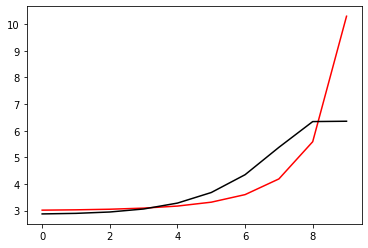

114400 0.423318730945756
[2.61051622 2.61625713 2.65848507 2.76632172 2.98684916 3.39124289
 4.08689474 5.13858457 6.06284887 6.49592519]


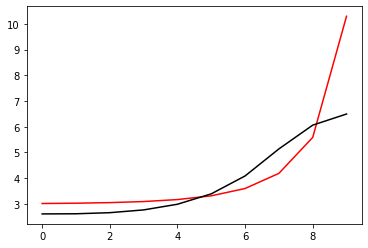

115500 0.013774451147874626
[2.91910327 2.90886879 2.93324197 3.02032793 3.21303408 3.57508578
 4.19946212 5.13217209 5.90065813 5.8921521 ]


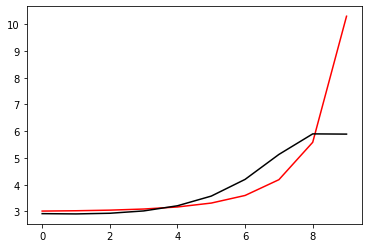

116600 0.010860289128162627
[2.89346519 2.8897143  2.91899815 3.01155202 3.21079817 3.58172062
 4.21878524 5.172473   5.9862964  5.99295351]


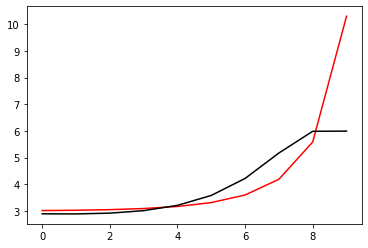

117700 0.011026414416396537
[2.91172993 2.91940529 2.95909645 3.0626905  3.2747005  3.66190736
 4.32027217 5.30402687 6.17648693 6.08983372]


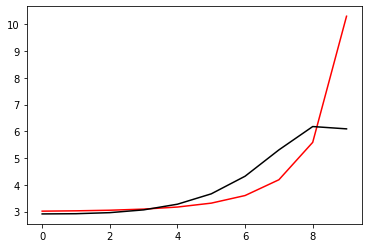

118800 0.0010312168267496832
[2.91589052 2.93250138 2.9823359  3.09671375 3.32121485 3.72433402
 4.40344327 5.41986128 6.37445223 6.45348263]


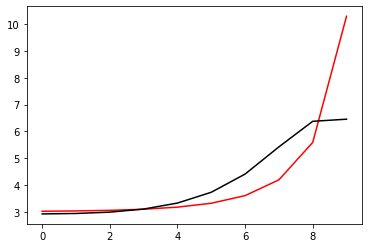

119900 0.011093700470674378
[2.92488366 2.94492853 3.00042331 3.12014555 3.34895648 3.75470128
 4.43280167 5.45365519 6.49065427 6.48369563]


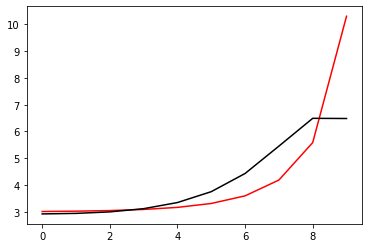

121000 0.011005314979682634
[2.96864588 2.93249511 2.93068303 2.99097202 3.15349254 3.47803287
 4.04549618 4.88774373 5.58436436 5.5842365 ]


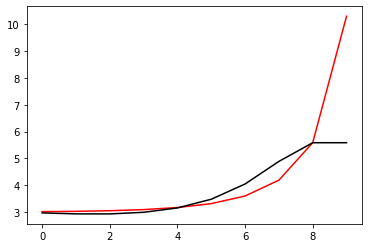

122100 0.010975620190264537
[2.96866289 2.94199428 2.94573104 3.01178675 3.18083193 3.51323967
 4.09066453 4.94826372 5.68054718 5.64671603]


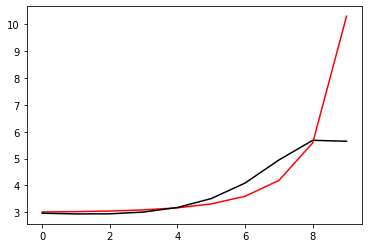

123200 0.02402917696247062
[2.91350755 2.90107355 2.9160885  2.99446856 3.17892662 3.53207395
 4.13899463 5.04284985 5.86120766 5.85243794]


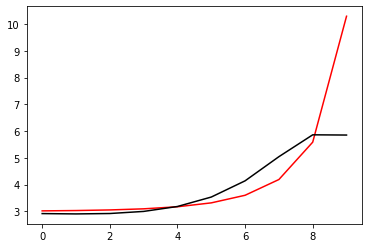

124300 0.019498641478125616
[2.99949239 2.98690617 3.00131962 3.078871   3.26378043 3.61894995
 4.22922848 5.14364467 6.01676128 6.0667381 ]


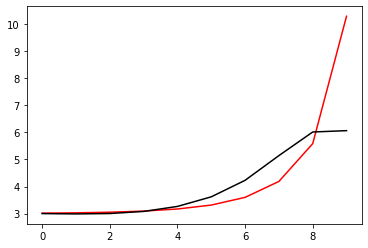

125400 0.031147008322107254
[3.01200012 3.00295964 3.01968331 3.09835095 3.28468866 3.64243205
 4.25672315 5.18633515 6.1445198  6.06572383]


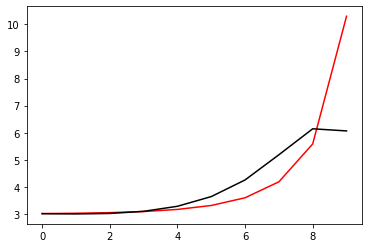

126500 0.011902595824997237
[2.90201585 2.90071338 2.92313856 3.00237868 3.18192602 3.52006869
 4.08558256 4.89973709 5.77487355 6.02555527]


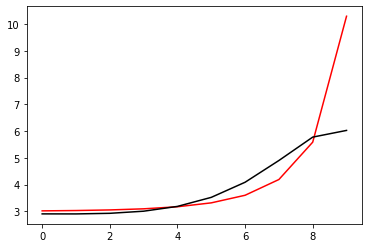

127600 0.010822407679592751
[2.87874278 2.8837411  2.91374995 3.00116393 3.19033843 3.54209272
 4.13252397 5.00490653 5.95530093 5.95675141]


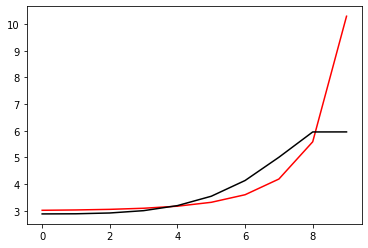

128700 0.010874535348299883
[2.94200915 2.94623817 2.9774729  3.06681551 3.25838957 3.61373906
 4.21158932 5.10740962 6.10769596 6.105161  ]


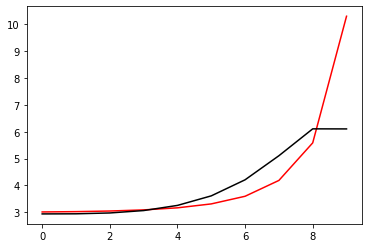

129800 0.06482888864101169
[2.81616567 2.80847489 2.82633542 2.89967642 3.06891201 3.38950148
 3.93064495 4.74418869 5.76044829 5.91935918]


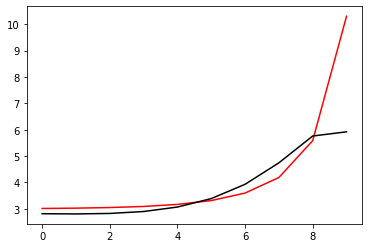

130900 0.010779217757673498
[2.97026935 2.97039042 2.99360211 3.06888974 3.23394668 3.53870358
 4.04136504 4.77817534 5.6809354  5.67483373]


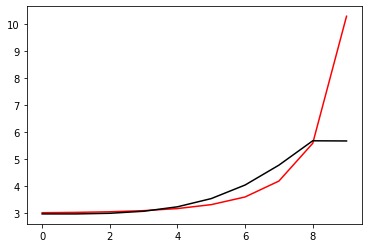

132000 0.010904311851962436
[2.88300369 2.88775627 2.92088939 3.01314244 3.20695522 3.56298444
 4.16575413 5.1048131  6.28483733 6.2129287 ]


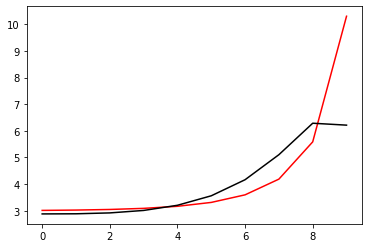

133100 0.01094493931985091
[2.92422153 2.92189336 2.94753641 3.03212252 3.21748265 3.56315894
 4.15191688 5.07632885 6.27794409 6.2350516 ]


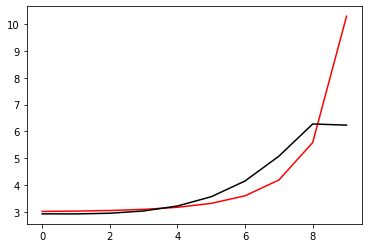

134200 0.021986629122125758
[2.83792329 2.84716825 2.88907932 2.99701164 3.21815652 3.62460266
 4.32979789 5.47666274 6.91360147 6.79358841]


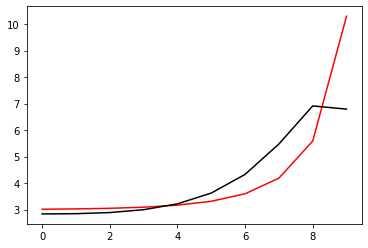

135300 0.01851561188398508
[2.92089635 2.90511108 2.92101215 3.00024624 3.18584527 3.5415357
 4.16181674 5.14419599 6.31799412 6.3049171 ]


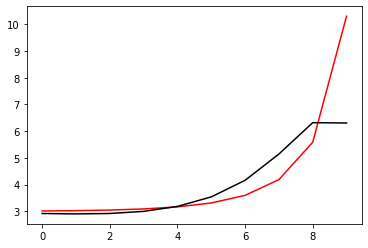

136400 0.030906262401282532
[2.92570627 2.91632309 2.9368051  3.02048369 3.2108779  3.5723569
 4.20015113 5.19302719 6.38530015 6.38953492]


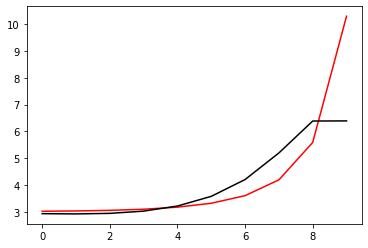

137500 0.011332255812626575
[2.88260043 2.88381872 2.9139195  3.00761542 3.20991056 3.58741893
 4.2390065  5.26910045 6.51894854 6.48589039]


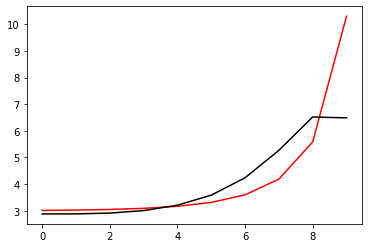

138600 0.011082565286940432
[2.89051691 2.8984415  2.93726289 3.04053405 3.25474141 3.64872616
 4.32456277 5.39214151 6.70421692 6.76359788]


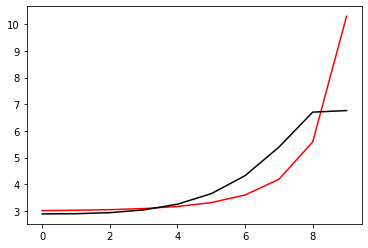

139700 0.011088066588976516
[2.94683436 2.9582107  3.00104514 3.10702662 3.32210501 3.71446958
 4.38448588 5.44506236 6.78348521 6.76130651]


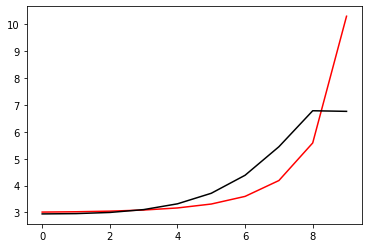

140800 0.0008731579055659483
[2.92014263 2.9177585  2.94470093 3.03163256 3.22212896 3.58082478
 4.20112326 5.16962424 6.29640491 6.29253342]


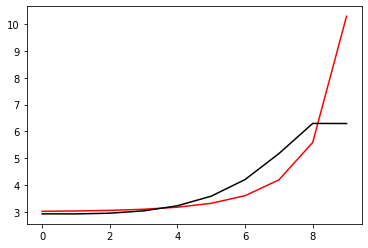

141900 0.01093769590636759
[2.92700212 2.93538199 2.97290324 3.07072643 3.27248209 3.64293865
 4.27540343 5.25918674 6.41878877 6.42000679]


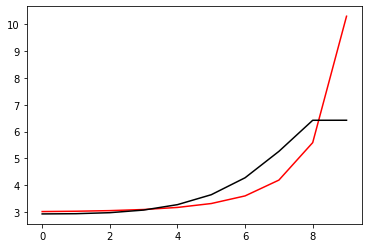

143000 0.011083624561842451
[2.87931583 2.89354039 2.94056899 3.05086048 3.26922099 3.66258577
 4.3273817  5.35969094 6.60150494 6.5904248 ]


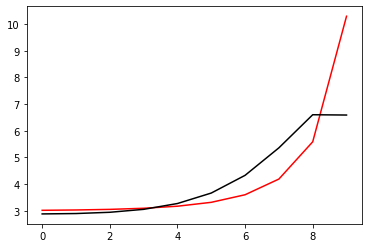

144100 0.7608834723879294
[3.23333898 3.2452389  3.29375585 3.40675866 3.62795939 4.02270901
 4.67962007 5.64476043 6.62212069 6.79625708]


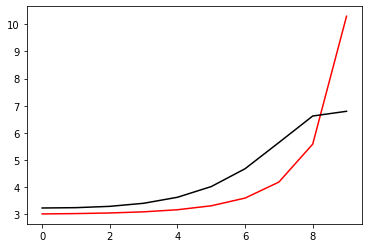

145200 0.027990953750871808
[2.95762889 2.92693293 2.92915027 2.9915295  3.15282208 3.47012539
 4.02069573 4.8511583  5.73954768 5.7207316 ]


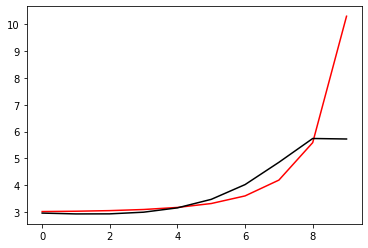

146300 0.020142111683858904
[2.93933657 2.91773815 2.92597736 2.99502077 3.16427275 3.49166127
 4.05576515 4.90702367 5.83061901 5.82884329]


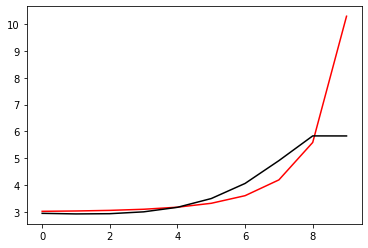

147400 0.03074991179691411
[2.91747934 2.90830246 2.92601195 3.00459835 3.18477819 3.52557049
 4.10734775 4.98639508 5.95950448 5.96077894]


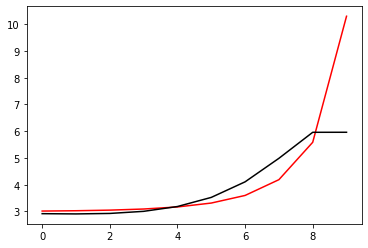

148500 0.011676079758628876
[2.87131517 2.87077537 2.89725632 2.98527817 3.17782393 3.53618015
 4.14449741 5.06923469 6.12386759 6.10724313]


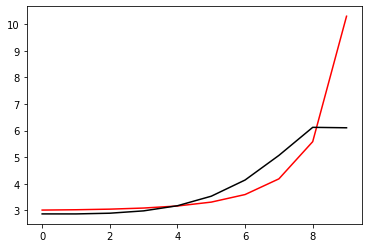

149600 0.010817891482054677
[2.98522879 2.98271967 3.00968816 3.09816295 3.29102438 3.64802556
 4.24859177 5.15522131 6.19902898 6.21420437]


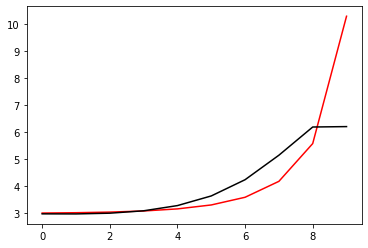

150700 0.01098327137543223
[2.93818799 2.94723343 2.98636453 3.08917799 3.30045116 3.68421006
 4.32951081 5.32115733 6.51269866 6.37695309]


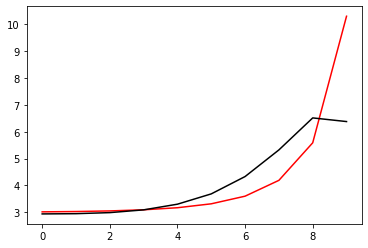

151800 0.001156328956319129
[2.9034544  2.92212136 2.97449837 3.09246229 3.32227298 3.73181931
 4.41899504 5.49001835 6.82610447 6.86530139]


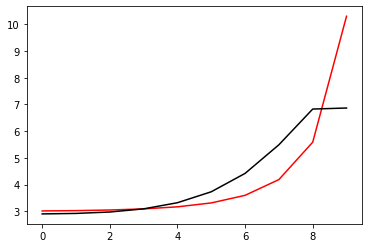

152900 0.010927559525413221
[2.95796533 2.9386546  2.9547342  3.03658938 3.2277125  3.59236914
 4.22312725 5.21817808 6.45312065 6.45966876]


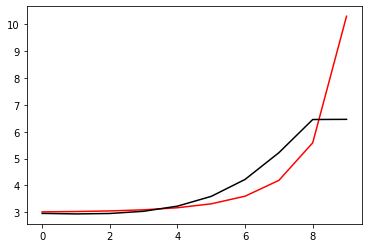

154000 0.01117862782056252
[2.92678265 2.92132723 2.9480066  3.04114341 3.24519579 3.62576309
 4.27761059 5.30305627 6.58744133 6.58648447]


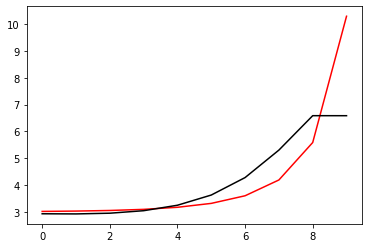

155100 0.01107717759148871
[2.90745657 2.91362569 2.95106627 3.0545012  3.26963355 3.66319681
 4.33205668 5.38443827 6.72276242 6.72955301]


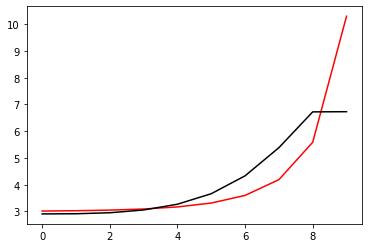

156200 0.0604231006330084
[2.79727498 2.78537904 2.80679114 2.89522293 3.09633982 3.47626692
 4.12974433 5.15912558 6.47100309 6.9269745 ]


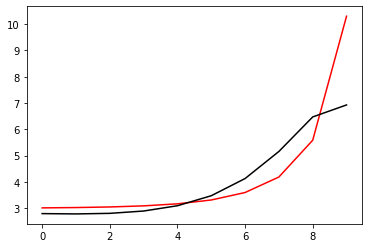

157300 0.015074376267847774
[2.92815987 2.91464011 2.93089085 3.01261633 3.20470751 3.57188113
 4.20713219 5.21304794 6.50400985 6.47759887]


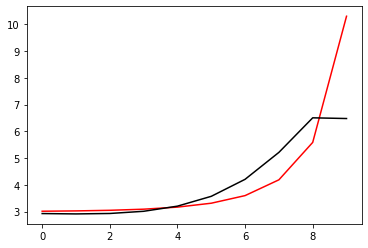

158400 0.031014799708261827
[2.90653239 2.90706317 2.93564103 3.02909348 3.23353963 3.61495165
 4.26829118 5.30037592 6.63460751 6.64838972]


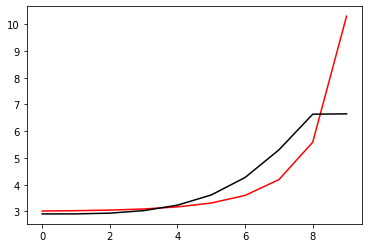

159500 0.013609511215608418
[2.89134015 2.90692339 2.95288685 3.06337575 3.2858516  3.68833303
 4.36893696 5.44093837 6.84028259 6.79611653]


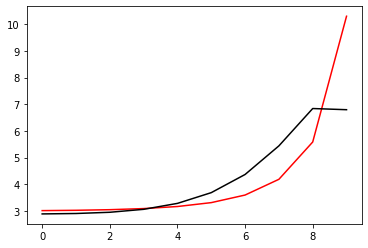

160600 0.01081565123857244
[2.89954993 2.90373979 2.93665654 3.02627254 3.2140888  3.55796444
 4.13643648 5.03950278 6.24133631 6.27287272]


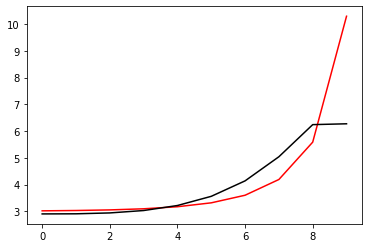

161700 0.011234375865650296
[2.90660499 2.91732491 2.95717753 3.05467408 3.25196797 3.60882061
 4.20744229 5.13985926 6.36537949 6.33048669]


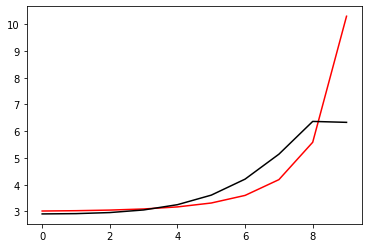

162800 0.0009721161715993764
[2.904525   2.9233286  2.97273097 3.08100878 3.29110108 3.66529032
 4.2909336  5.26458928 6.52990232 6.57415566]


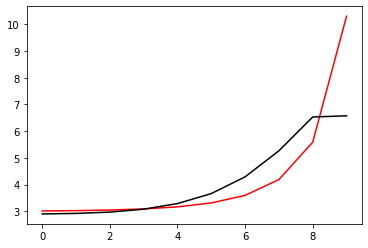

163900 0.011043962863056955
[2.89625893 2.91408443 2.96618578 3.07932717 3.29637023 3.68141423
 4.32674971 5.33878777 6.66254516 6.64841316]


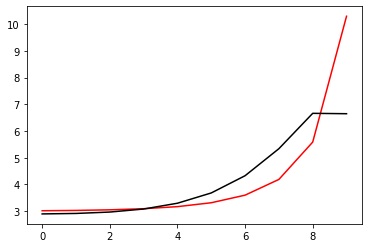

165000 0.02149123701906314
[2.82709229 2.84145553 2.89247778 3.00761376 3.22959068 3.62477025
 4.29417266 5.36859347 6.80473343 6.71722133]


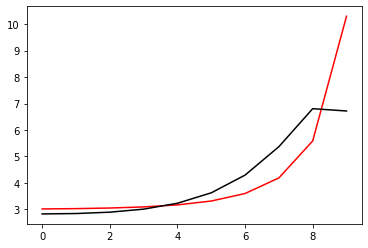

166100 0.010893445154216145
[2.95026918 2.93163317 2.94724524 3.02572032 3.20711673 3.55305962
 4.15537443 5.1193211  6.36139174 6.36201573]


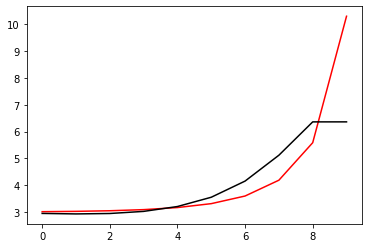

167200 0.022002214667353803
[2.88995616 2.88465596 2.91132017 3.00238783 3.19945974 3.5659944
 4.19666537 5.20089179 6.50119439 6.46265579]


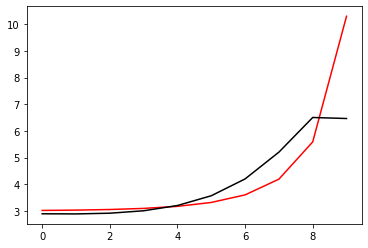

168300 0.011915144878268245
[2.9029649  2.91240766 2.95328137 3.05854677 3.27138872 3.65645293
 4.31018491 5.34595675 6.69645164 6.70550925]


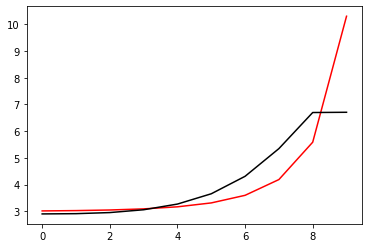

169400 0.03173343875382968
[3.01121993 3.01660171 3.04946296 3.14076226 3.33002934 3.67122989
 4.22450204 4.96534943 5.98559934 5.9818859 ]


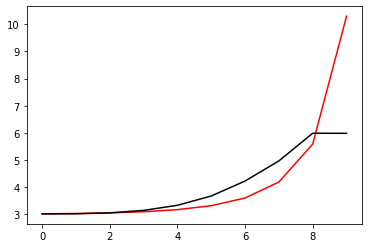

170500 0.020711398716955997
[2.99375841 3.00133807 3.03635189 3.12935933 3.32019293 3.66327017
 4.22128035 5.00088145 6.03361347 6.03625211]


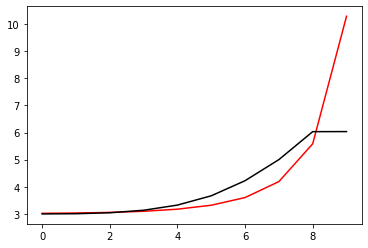

171600 0.01088740189128081
[2.86380771 2.87973935 2.92369404 3.02503792 3.22438405 3.57866348
 4.16434419 5.07514848 6.19736928 6.22243478]


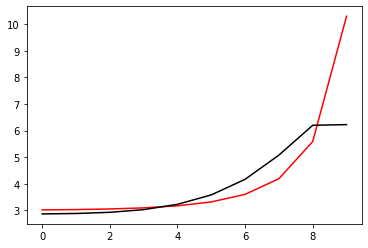

172700 0.011061374338564165
[2.9084256  2.93187785 2.98781114 3.10418188 3.32474976 3.7164292
 4.38720294 5.45023496 6.50476452 6.3875998 ]


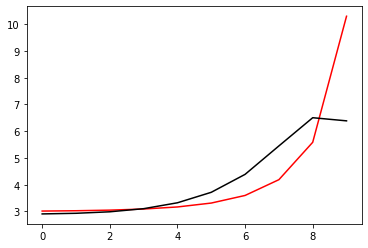

173800 0.0011476697981556174
[2.92106587 2.94808886 3.01190104 3.13749854 3.36843244 3.77446341
 4.46558527 5.5493486  6.67421065 6.6777129 ]


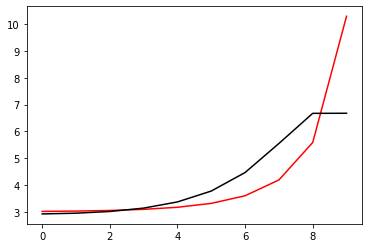

174900 0.010693341825897516
[2.96783243 2.94077148 2.94976732 3.01697645 3.17975765 3.49837603
 4.06960505 4.97685798 5.64153752 5.66091326]


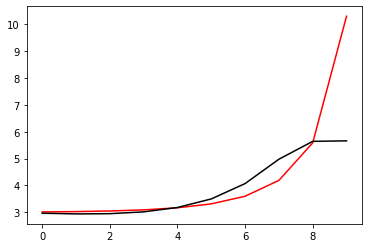

176000 0.01095208736745635
[2.94786127 2.92667789 2.93894306 3.01011764 3.1779393  3.50342393
 4.08400671 5.00362622 5.70113557 5.70066997]


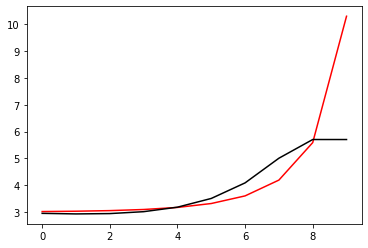

177100 0.01088758841148019
[2.94645097 2.93464736 2.95292005 3.03037055 3.20550555 3.54008977
 4.13173897 5.06411881 5.80429861 5.77195261]


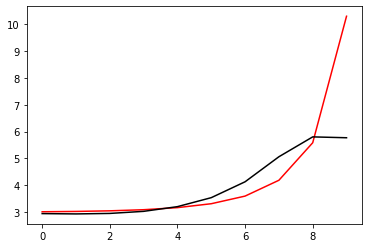

178200 0.021860611006907376
[2.87147479 2.87298957 2.90307364 2.99358005 3.18539493 3.54298652
 4.16704576 5.14493798 5.98625081 5.95911005]


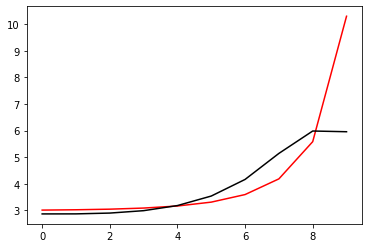

179300 0.020837888743686042
[3.01875969 3.01373822 3.03846696 3.12375922 3.31147516 3.66544547
 4.2821971  5.24476088 6.13214354 6.21823076]


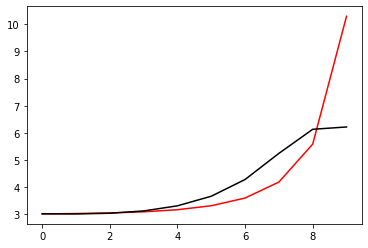

180400 0.06299613714760813
[2.81015378 2.80953477 2.83721265 2.92414124 3.11267164 3.46603156
 4.07708657 5.03954722 6.08417816 6.23812341]


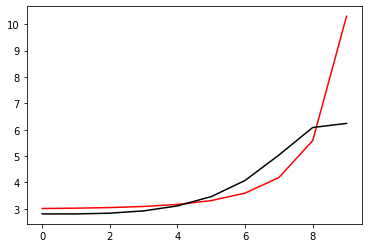

181500 0.016310893742160857
[2.91975168 2.92417143 2.95905022 3.05591098 3.25892609 3.63445127
 4.28017073 5.29300719 6.42488843 6.40431969]


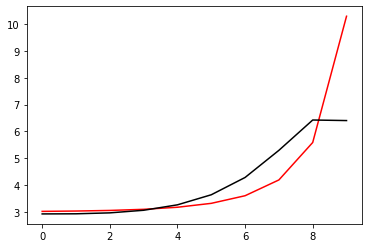

182600 0.01085362072659624
[2.91016961 2.9192538  2.95662924 3.05227032 3.24770963 3.60350404
 4.20394649 5.13137928 6.26654398 6.24066374]


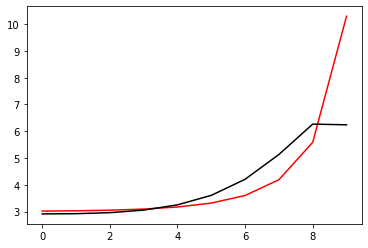

183700 0.010954446809523018
[2.93464883 2.94352829 2.98253313 3.08169999 3.28342466 3.65056722
 4.2743433  5.25915211 6.52102629 6.37320492]


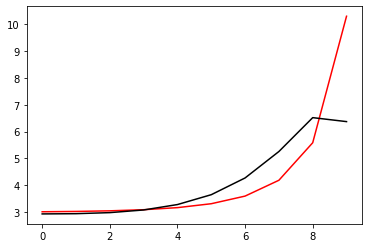

184800 0.00118240462552618
[2.94088417 2.95978022 3.01180897 3.12728595 3.35083757 3.75105262
 4.433944   5.5347248  6.96486733 6.98879605]


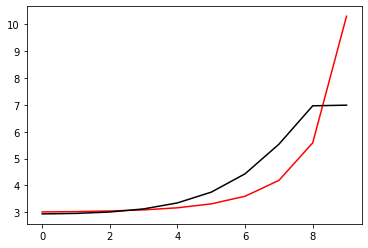

185900 0.010755310718243082
[2.94100123 2.90833709 2.90792241 2.96866342 3.13124782 3.45766634
 4.0442105  5.00140997 5.97263112 5.99626704]


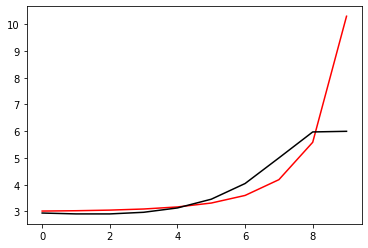

187000 0.010853100308743681
[2.94301296 2.9186649  2.92307071 2.98840763 3.15570855 3.48730179
 4.07969624 5.04295849 6.03524329 6.036272  ]


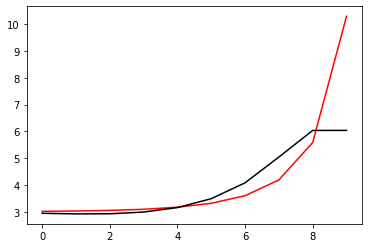

188100 0.010966027882724166
[2.94336741 2.93041739 2.94264602 3.01489852 3.18914155 3.52824171
 4.12901467 5.10105527 6.12667754 6.11318827]


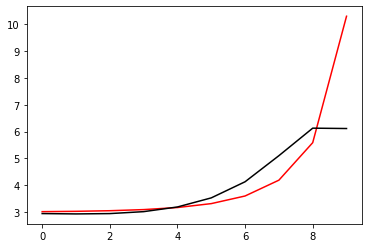

189200 0.021779859379825153
[2.85933963 2.86059445 2.8867901  2.97324106 3.16437866 3.52567163
 4.15692103 5.16984365 6.28146958 6.21651018]


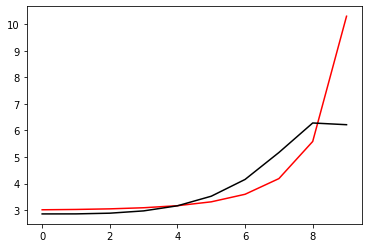

190300 0.01697488179515676
[2.97910431 2.97366398 2.99318867 3.0722656  3.2561666  3.61066756
 4.23425451 5.23713591 6.39146172 6.47693251]


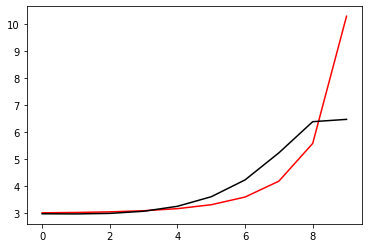

191400 0.08149343436116604
[2.77334603 2.77963883 2.80807909 2.89137576 3.07365773 3.41862132
 4.019123   4.97221342 6.07721282 6.35287676]


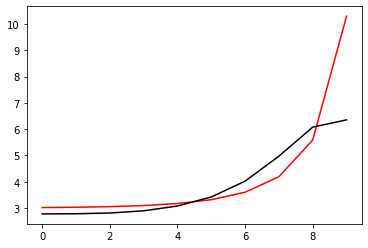

192500 0.012469570336990539
[2.92113708 2.91281307 2.92856858 3.00059197 3.17199228 3.50466486
 4.08772787 5.0127827  6.08584351 6.07676981]


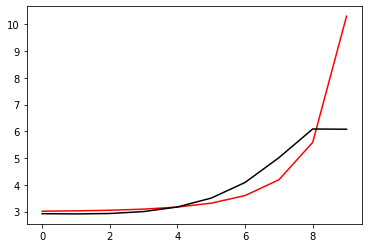

193600 0.0108145773213103
[2.89959112 2.8977037  2.91940497 2.99743945 3.17561106 3.51711082
 4.11316141 5.05787145 6.16196438 6.16549685]


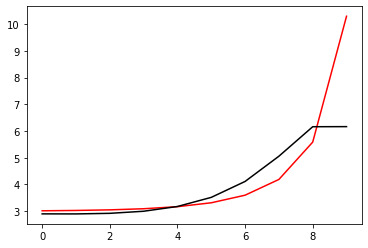

194700 0.011084853846819882
[2.92230788 2.93016527 2.96199202 3.05000282 3.23885933 3.59319072
 4.20577773 5.17094059 6.30532549 6.24406445]


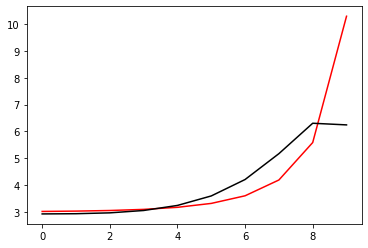

195800 0.0009431440787006966
[2.95662274 2.97035866 3.01112232 3.10897694 3.30908956 3.67785479
 4.31042084 5.30356407 6.48684738 6.58050699]


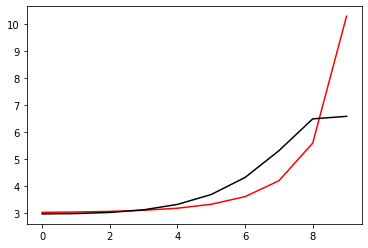

196900 0.011059889318149406
[2.90413631 2.92488807 2.97775437 3.08935994 3.30448358 3.69156003
 4.35022446 5.3881038  6.66399392 6.65923451]


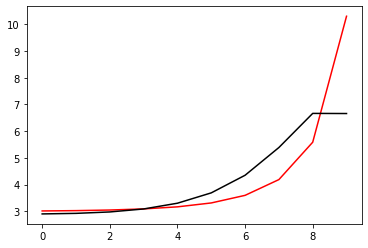

198000 0.01515419577546369
[2.94269291 2.95905617 3.00580289 3.10613298 3.2978497  3.6330833
 4.1537422  4.72945408 5.83564286 5.81920287]


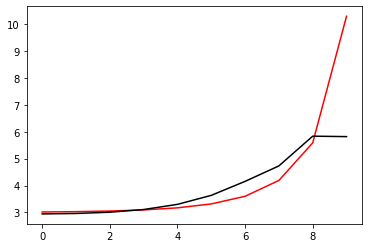

199100 0.010826834603122757
[2.90300454 2.92283066 2.97392969 3.07948291 3.27756139 3.62178277
 4.16154323 4.83505186 5.95433462 5.95259248]


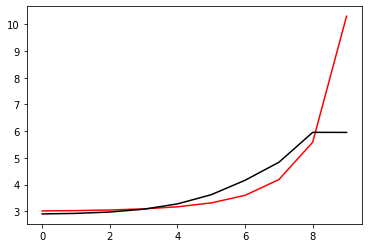

200200 0.021610659635404636
[2.83126674 2.85789772 2.91818738 3.03503383 3.24755141 3.61376214
 4.20292962 5.04269187 6.19508269 6.10613907]


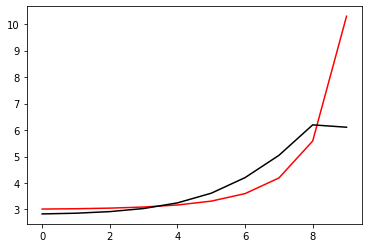

201300 0.015331862275451549
[2.91113248 2.93982277 3.00779722 3.13920227 3.3759549  3.78517493
 4.46373259 5.4753827  6.6132731  6.51889291]


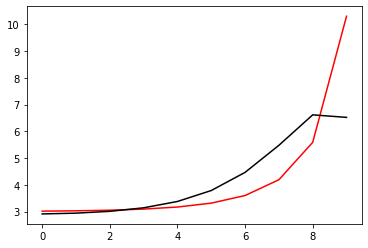

202400 0.08829006683884782
[2.75218915 2.74513141 2.77701688 2.86930779 3.05887888 3.40436657
 3.9897389  4.87188323 5.64162643 5.88714431]


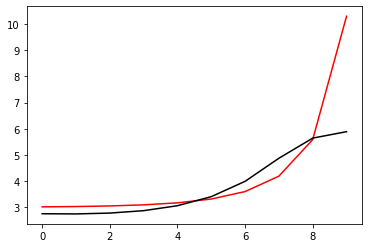

203500 0.01218007151305055
[2.91616158 2.89889223 2.91819828 2.99777237 3.17346237 3.50221049
 4.06557506 4.9189302  5.66374226 5.65360589]


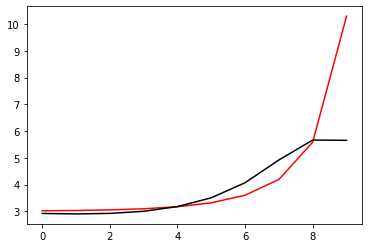

204600 0.010753267618833981
[2.89446505 2.88569746 2.91064313 2.99665196 3.1802898  3.51913638
 4.09571814 4.96772215 5.75315318 5.75416946]


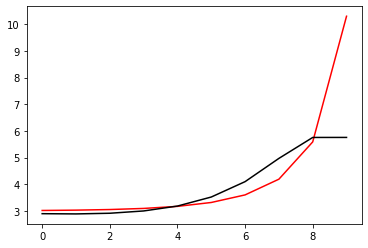

205700 0.013179447656196136
[2.90467433 2.90803689 2.94270155 3.03840942 3.23292384 3.58428091
 4.17557131 5.06727748 5.9033617  5.86906952]


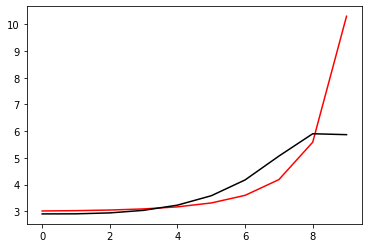

206800 0.0007387500640589012
[2.99156699 2.99033448 3.01831244 3.10607326 3.29187966 3.63254211
 4.20911197 5.08550991 5.95279496 5.94295696]


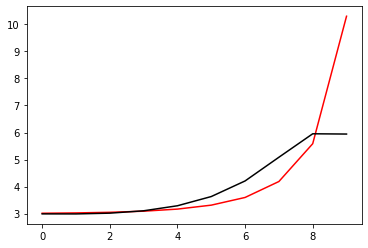

207900 0.010850451216352763
[2.89259797 2.89750098 2.93159209 3.02700225 3.2248232  3.58528329
 4.19547889 5.13476637 6.14521448 6.07075838]


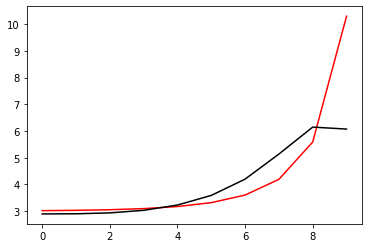

209000 0.010957181864053667
[2.88053204 2.89293783 2.93722611 3.04372651 3.25440437 3.63019868
 4.25688328 5.21353909 6.3007643  6.24278487]


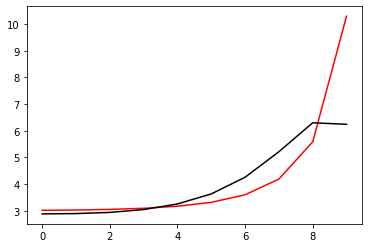

210100 0.0008641597890318432
[3.00291494 3.01749963 3.06052688 3.16035648 3.35558023 3.69734753
 4.23244802 4.8512561  5.6211066  5.65941068]


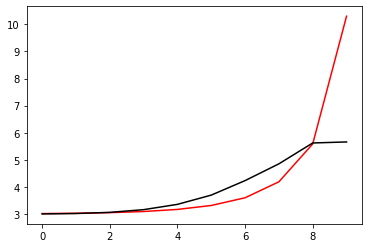

211200 0.03668291237492782
[3.02541661 3.04017864 3.08451171 3.18657295 3.38601006 3.73689328
 4.29720037 5.00674681 5.72394701 5.6792018 ]


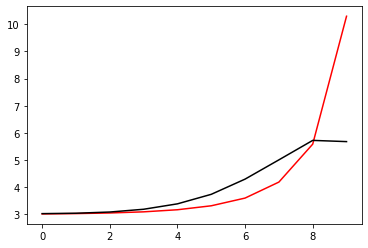

212300 0.01998167275999119
[2.86457515 2.8901189  2.94497478 3.05483526 3.2580913  3.60615526
 4.15224563 4.89803163 5.75107223 5.74823201]


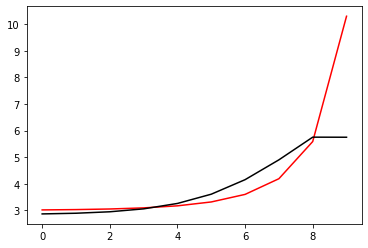

213400 0.03081873886360699
[2.86581761 2.89140466 2.95018764 3.06571631 3.27674496 3.6380715
 4.21858843 5.0624142  5.91791791 5.895802  ]


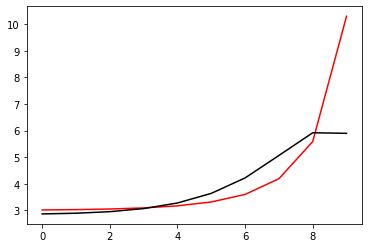

214500 0.016183813146030436
[2.88975547 2.90943569 2.96815146 3.08975918 3.31478511 3.70685361
 4.36281495 5.35978407 6.25473848 6.21772313]


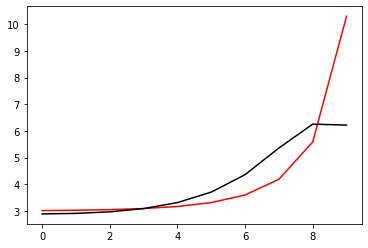

215600 0.0109523192030176
[2.96889635 2.98160659 3.03233165 3.14684279 3.36411068 3.74486043
 4.37460406 5.31384939 6.30656374 6.32245501]


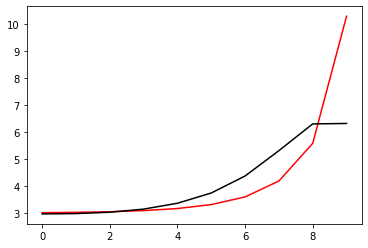

216700 0.012264648963449823
[2.90808799 2.91941658 2.96452519 3.06860736 3.26688486 3.61004453
 4.15778588 4.89550613 5.68296377 5.73865884]


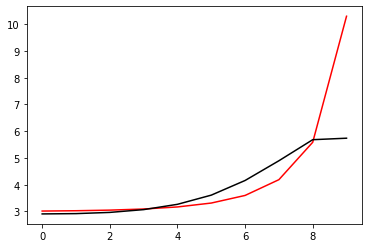

217800 0.000749525296216118
[2.88627401 2.90249305 2.95259429 3.06231212 3.26796227 3.62279703
 4.19395487 4.98263564 5.79007668 5.78229871]


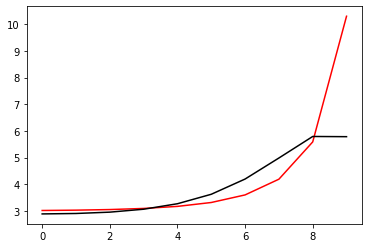

218900 0.010834805429873647
[2.89586347 2.91767819 2.97448264 3.09186596 3.30758793 3.67809039
 4.27762101 5.11642749 5.93478916 5.94222525]


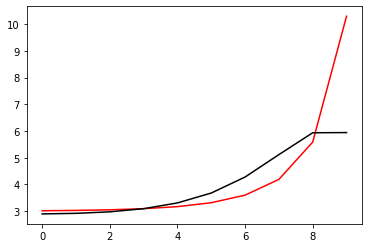

220000 0.010992328246727428
[2.88171414 2.90056316 2.95615808 3.07381648 3.29148251 3.66652274
 4.27640011 5.16218767 6.05964262 6.04976818]


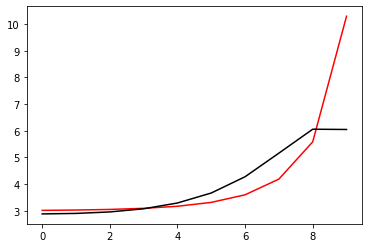

221100 0.7226369824450567
[3.23083446 3.23495078 3.27555281 3.37975473 3.58553763 3.94948421
 4.54808117 5.36621883 5.95909858 6.26734886]


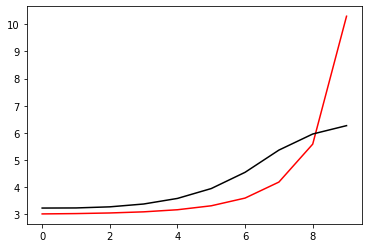

222200 0.025119342096140772
[2.91334986 2.89970585 2.91897815 3.00112379 3.18382206 3.52291582
 4.09452559 4.89880224 5.54817413 5.51506759]


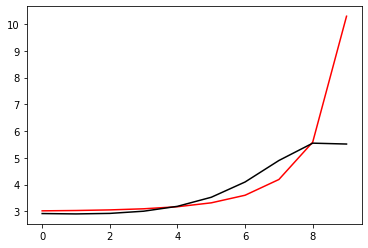

223300 0.018032283420630246
[2.91627628 2.91730385 2.94861488 3.04282205 3.2388995  3.59314304
 4.18033417 5.00781096 5.70443464 5.68913559]


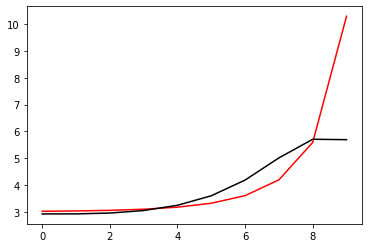

224400 0.030928780548804866
[2.9435001  2.95104359 2.99274289 3.10123482 3.31861554 3.70425533
 4.33445427 5.22547333 6.0199769  6.00934556]


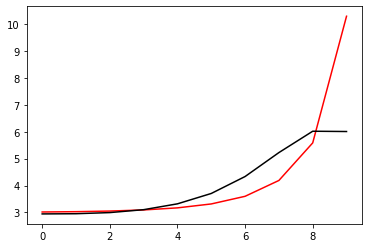

225500 0.36729508603174216
[2.63219393 2.62994035 2.66564179 2.77115202 2.99022824 3.38388299
 4.02773138 4.94431768 5.80832951 6.18686623]


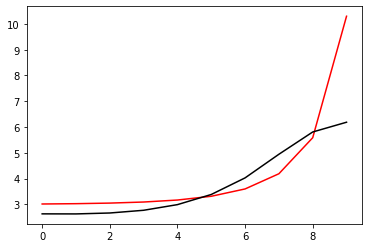

226600 0.010709966591316459
[2.90569052 2.89314629 2.91572673 3.00412895 3.19794107 3.55012585
 4.12111548 4.91515119 5.62483345 5.62451243]


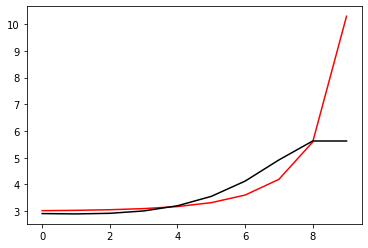

227700 0.015526864427225073
[2.90778249 2.90206583 2.92979018 3.02350023 3.22356256 3.58415269
 4.1677809  4.98151    5.71606043 5.69457782]


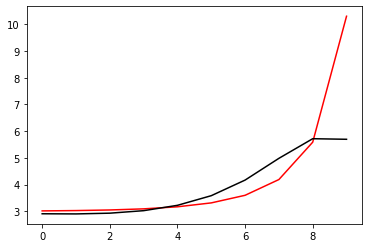

228800 0.0007801987742200979
[2.90069311 2.90314705 2.93745796 3.03739357 3.24436273 3.61390743
 4.21119666 5.04915812 5.82238893 5.8871616 ]


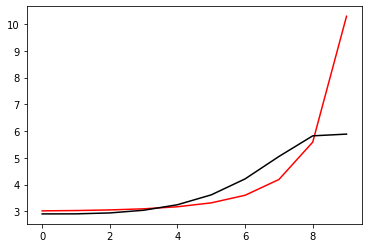

229900 0.010845651369976015
[2.92114527 2.93202546 2.97453315 3.08178854 3.29629879 3.67490703
 4.28515658 5.14708413 5.96646938 5.9152566 ]


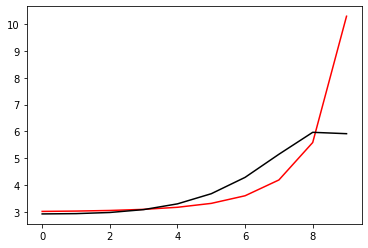

231000 0.010878917395952708
[2.88829553 2.88402831 2.91255699 3.00706747 3.21012818 3.57933922
 4.1873334  5.08145019 6.01658489 5.97479737]


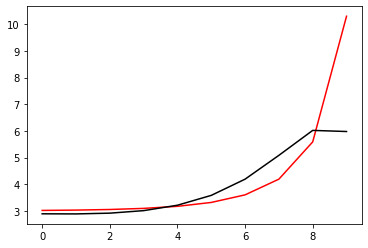

232100 0.0109908652059527
[2.91028512 2.9079039  2.93675669 3.03233543 3.23869367 3.61603148
 4.24360277 5.18941198 6.2444954  6.26664282]


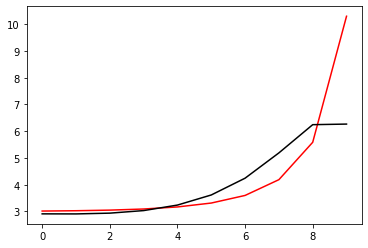

233200 0.02242169973846769
[2.90191173 2.8857528  2.8974631  2.97380454 3.15819177 3.50877837
 4.10057871 4.99059423 6.01078463 5.91487555]


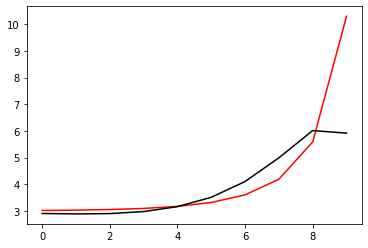

234300 0.020750252644528084
[3.02977107 3.0164415  3.02959815 3.10667012 3.29233406 3.64604843
 4.24464048 5.14760592 6.20115204 6.29209242]


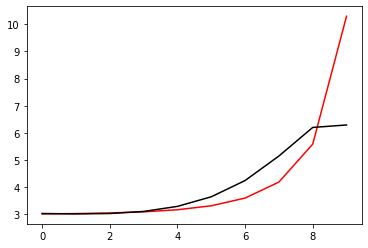

235400 0.031225600121450835
[3.01694092 3.0075777  3.02412005 3.10413607 3.29434135 3.65856133
 4.28437799 5.24967475 6.4179337  6.43347044]


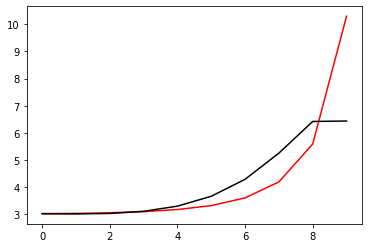

236500 0.01945721541822751
[2.96501331 2.95677492 2.9722817  3.04682998 3.22515894 3.56744718
 4.15417379 5.06797391 6.3455613  6.38591093]


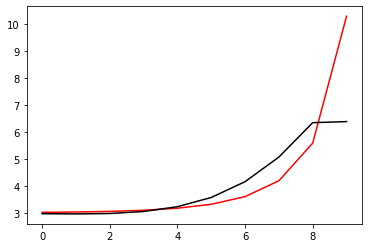

237600 0.01105035437565994
[2.92556664 2.93008697 2.96116257 3.05325279 3.25386989 3.63133569
 4.28813969 5.35843816 6.7848617  6.79599681]


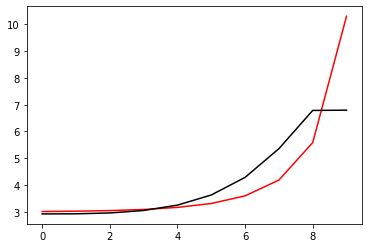

238700 0.011335256316227948
[2.951043   2.94787425 2.96878203 3.04372093 3.21438757 3.53774492
 4.08432545 4.89664323 6.0381849  6.11458663]


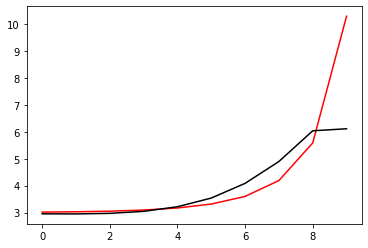

239800 0.0007405620346127654
[2.93541342 2.93692591 2.96258614 3.04283989 3.22009193 3.55314754
 4.11691111 4.96147522 6.12351441 6.11527566]


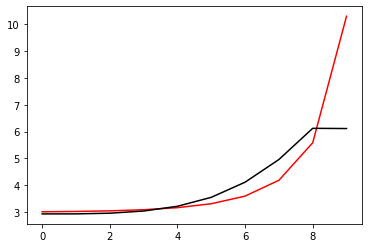

240900 0.010807023792120507
[2.91737231 2.92516721 2.95766888 3.04528393 3.23123741 3.57653506
 4.16126212 5.04561493 6.23437421 6.24036295]


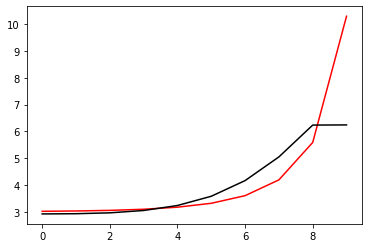

242000 0.011080674131630285
[2.90587768 2.9212021  2.96327745 3.0612056  3.25903563 3.62042185
 4.23144796 5.16432999 6.38723475 6.38290152]


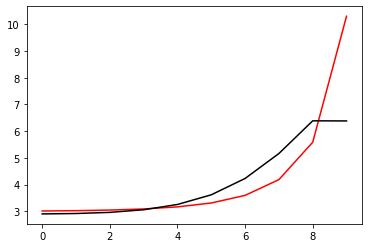

243100 0.011060374920093987
[2.89977239 2.9039433  2.93835045 3.03199339 3.22842015 3.59261219
 4.21684042 5.20100733 6.50577962 6.50794805]


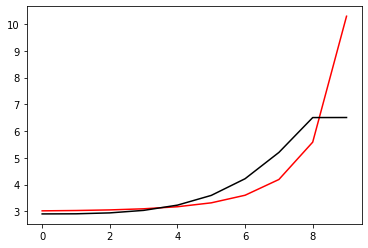

244200 0.03175047129863331
[2.9354209  2.9417821  2.9721866  3.05519435 3.22975015 3.54793035
 4.05438414 4.67631654 5.72759469 5.72048977]


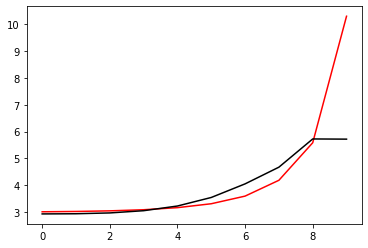

245300 0.01926678866097634
[2.90839451 2.91912747 2.95479343 3.04390433 3.22653317 3.55792013
 4.09589994 4.82237182 5.85826865 5.83957888]


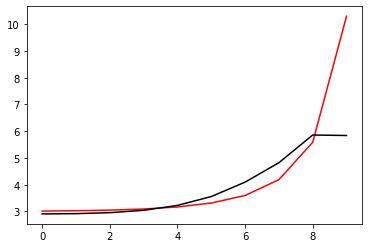

246400 0.03076795022921234
[2.88147763 2.89739869 2.93968685 3.03611637 3.22777149 3.57305666
 4.1434209  4.97234043 6.00056893 6.00222208]


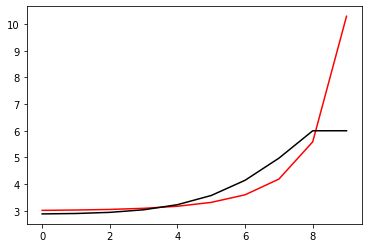

247500 0.01138155156294203
[2.85206827 2.87093301 2.91929942 3.02318126 3.2242695  3.58439188
 4.18950161 5.12079372 6.17377738 6.1729362 ]


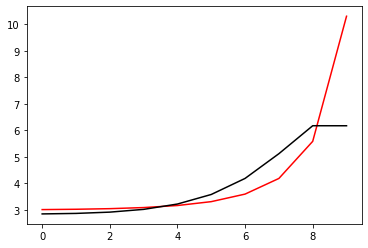

248600 0.011105216171707994
[2.89217906 2.91861005 2.9804237  3.10256951 3.32927873 3.73190512
 4.42082451 5.48814002 6.54287698 6.55711512]


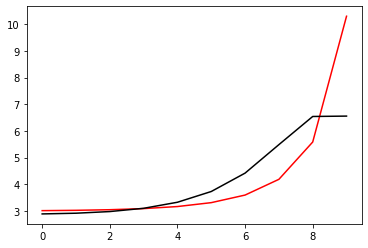

249700 0.010849691555252193
[2.92735187 2.93993646 2.98716458 3.09109359 3.29034099 3.64527733
 4.23717136 5.09311846 5.910824   5.93878513]


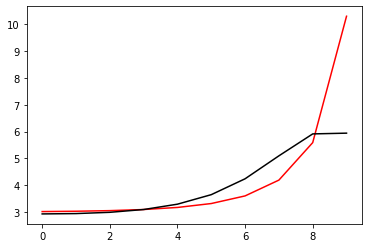

250800 0.0008377404510850955
[2.89613395 2.91244051 2.96348738 3.07226934 3.27798034 3.64271647
 4.25220487 5.14383966 6.00273862 6.00245135]


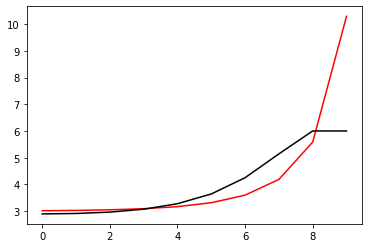

251900 0.010927543503467588
[2.88949707 2.91210426 2.97020138 3.0875949  3.30446241 3.6853038
 4.32080271 5.25529502 6.15387575 6.15299094]


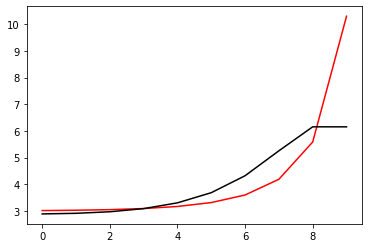

253000 0.011202294314801013
[2.87330769 2.9012436  2.96733728 3.0952398  3.32622055 3.72755901
 4.39568483 5.38689582 6.35639142 6.36001146]


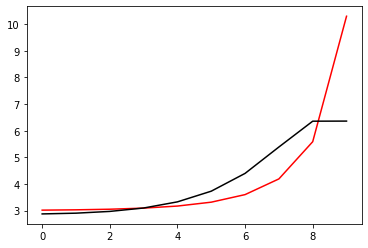

254100 0.011117069218045877
[2.90068803 2.92315503 2.98842965 3.12017532 3.36007021 3.77709373
 4.47202102 5.51766512 6.58426226 6.61625709]


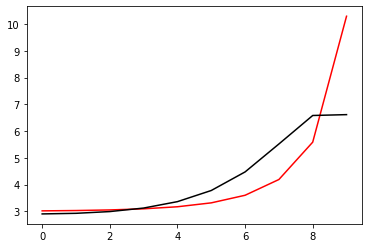

255200 0.024642347272838
[2.89409572 2.89658131 2.94114457 3.05151014 3.26581761 3.64542976
 4.27247953 5.17388007 6.04176096 6.01304645]


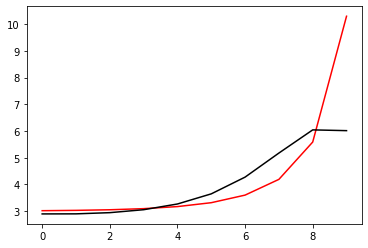

256300 0.012968673046188582
[2.88758127 2.89861496 2.95028777 3.06911468 3.29461002 3.69050426
 4.34385179 5.28750619 6.19186888 6.14652999]


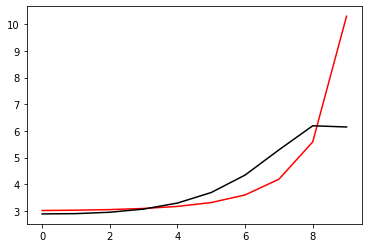

257400 0.031095387938249924
[2.88618596 2.90796572 2.97011043 3.10097014 3.34215169 3.76034633
 4.44822111 5.44631243 6.40521287 6.43606593]


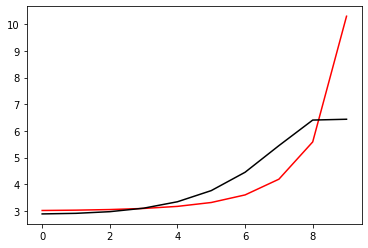

258500 0.02110973080233763
[2.92201666 2.95006192 3.02064307 3.16174406 3.41658341 3.85351066
 4.56752084 5.60815872 6.63525852 6.60110163]


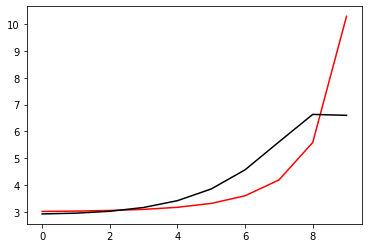

259600 0.010832551204928837
[2.88450616 2.90413879 2.9640986  3.08912947 3.31653755 3.69946711
 4.28946022 5.05911494 5.89827924 5.89938731]


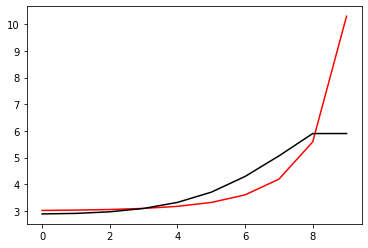

260700 0.011185118165109186
[2.86880458 2.89356559 2.95911534 3.09094464 3.32765361 3.72580962
 4.34946727 5.18547994 6.02416347 5.99350682]


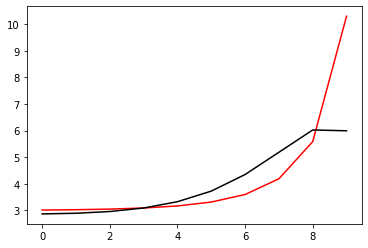

261800 0.0010573640756849252
[2.86795812 2.89882689 2.97221096 3.11383616 3.36415004 3.78454847
 4.45344236 5.36781297 6.20735302 6.23411937]


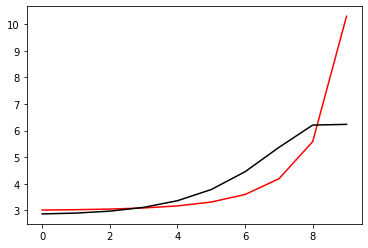

262900 0.011155470723666372
[2.84729246 2.88200956 2.96190719 3.11140948 3.37142929 3.80519251
 4.49568694 5.46437324 6.36233598 6.35374628]


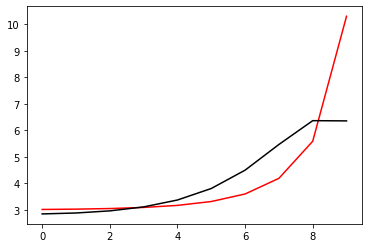

264000 0.011091157473727072
[2.8663464  2.89154651 2.96134435 3.09772082 3.337557   3.73669528
 4.36233511 5.19139838 5.83581405 5.83808101]


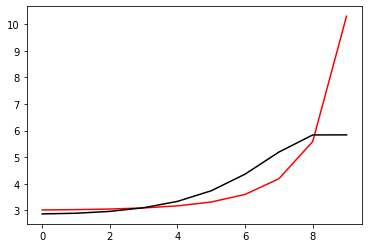

265100 0.011007445471141495
[2.85473485 2.88244241 2.95475016 3.09412732 3.3376474  3.74167419
 4.37458977 5.21986027 5.89528075 5.89499277]


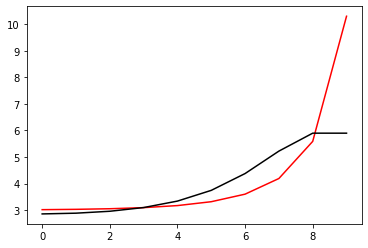

266200 0.022146411918857682
[2.82682641 2.85934323 2.93708938 3.08298836 3.33473035 3.75009063
 4.40065077 5.28173075 6.01816111 5.98975257]


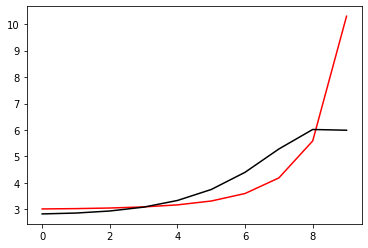

267300 0.012274032263413327
[2.86335322 2.90337973 2.99088469 3.14879298 3.41581221 3.85179587
 4.53205346 5.46252596 6.26870083 6.22364378]


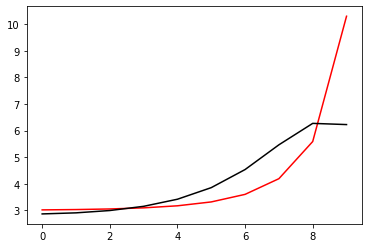

268400 0.320267926378645
[2.58460462 2.62021899 2.70678114 2.86554183 3.13406862 3.57097786
 4.25117503 5.19487764 6.0685451  6.52116368]


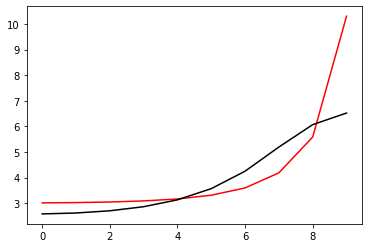

269500 0.013592150751821365
[2.83573791 2.87639073 2.96477079 3.12029999 3.37634226 3.78056187
 4.37551905 5.11644459 5.78168257 5.76338863]


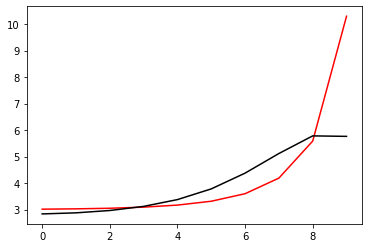

270600 0.011114552212367332
[2.80477522 2.8483351  2.94111187 3.10239303 3.36619911 3.7827951
 4.40703607 5.22683419 5.92026686 5.92227116]


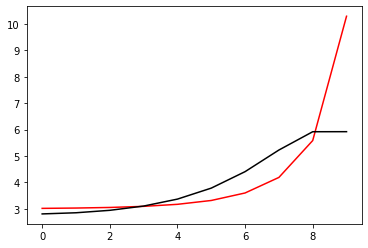

271700 0.011209093359917762
[2.82131916 2.86800322 2.96706307 3.13757452 3.41483626 3.85378534
 4.52392588 5.42707513 6.13534009 6.13292628]


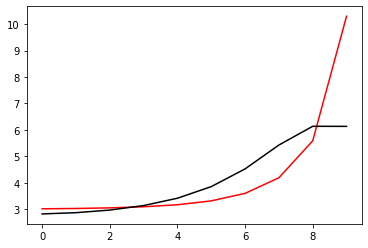

272800 0.0009527657290856924
[2.82484336 2.85825003 2.94434826 3.09980782 3.35521985 3.75662989
 4.35383959 5.10538037 5.60016034 5.62980016]


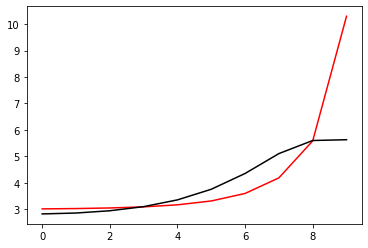

273900 0.010960719414904988
[2.84122396 2.8779036  2.96710998 3.12679787 3.38802825 3.79797791
 4.40866747 5.18271079 5.70097344 5.70382306]


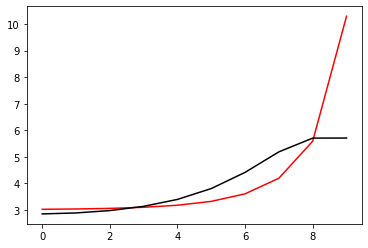

275000 0.011214134128407454
[2.83484007 2.87565496 2.96983685 3.13645003 3.40755566 3.83256083
 4.46874829 5.29080238 5.86965076 5.86439061]


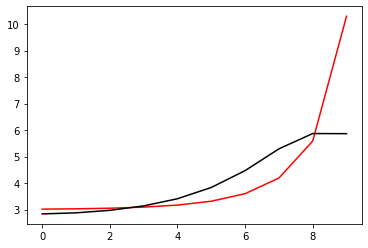

276100 0.01111738036880021
[2.8288769  2.87112888 2.96791317 3.13860748 3.41547592 3.84828239
 4.49659491 5.35295176 6.01388984 6.02002315]


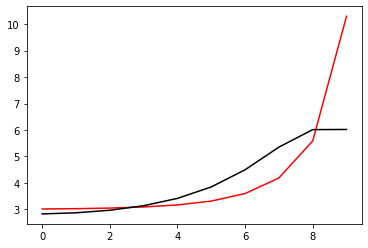

277200 0.024498798203153094
[2.84498528 2.87006987 2.94857081 3.09884687 3.34965079 3.74337385
 4.32331393 5.04819311 5.51266385 5.49714931]


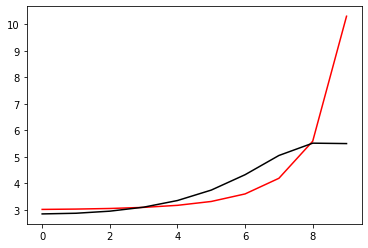

278300 0.015070794808496817
[2.8454016  2.87554788 2.95850849 3.11422926 3.37234379 3.77673975
 4.37362959 5.12539284 5.61964803 5.59788497]


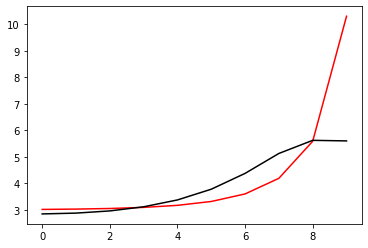

279400 0.031001149824763673
[2.8414049  2.87763155 2.96643264 3.12914123 3.39662239 3.81462099
 4.43321986 5.22173317 5.76380189 5.7764821 ]


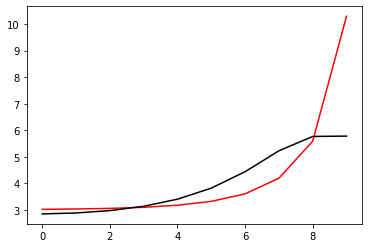

280500 0.020060770370338165
[2.87123234 2.90787981 2.99893279 3.16641068 3.44259355 3.87531807
 4.51918001 5.35363998 5.96406354 5.94967973]


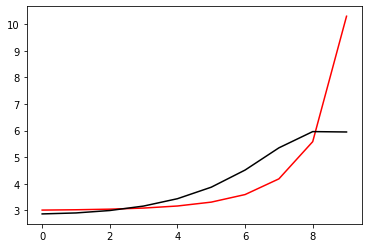

281600 0.011005638890790398
[2.92799226 2.95067888 3.02787165 3.18237918 3.44591225 3.86425532
 4.48997533 5.31521258 5.97911637 6.0252622 ]


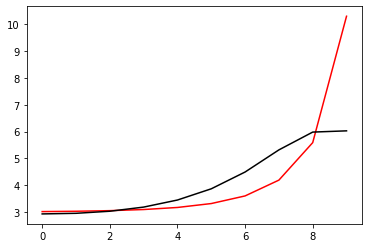

282700 0.3200820499096998
[2.62486697 2.62969138 2.68575577 2.81907974 3.06139488 3.45674021
 4.05599749 4.85990288 5.56916874 6.00112828]


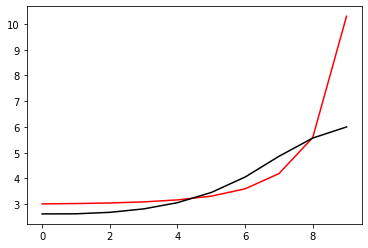

283800 0.0007042382417912245
[2.87114682 2.88560295 2.94600065 3.07762274 3.3087912  3.67476462
 4.2040161  4.85266953 5.35978566 5.35356086]


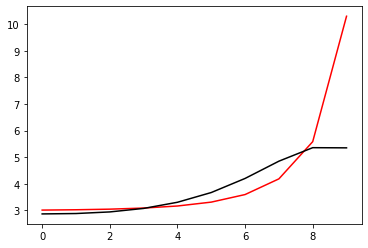

284900 0.010766076955410396
[2.86470608 2.8844939  2.94944539 3.08593071 3.32381286 3.70102644
 4.25319685 4.94566136 5.47907711 5.48284501]


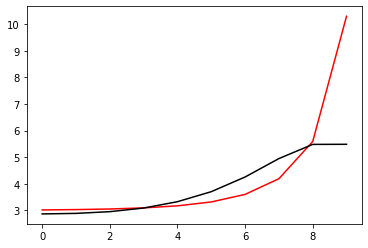

286000 0.011013352876579558
[2.85886066 2.88452016 2.95573113 3.09932028 3.3476021  3.74301486
 4.33206258 5.09375931 5.67572858 5.65779475]


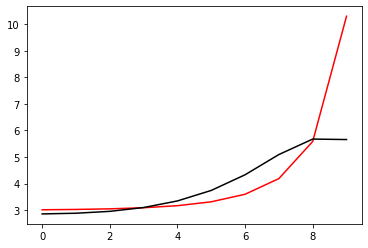

287100 0.010947341942461773
[2.89960972 2.92342815 2.99329576 3.13766146 3.39148445 3.80234055
 4.4292864  5.27397674 5.93462385 5.86931276]


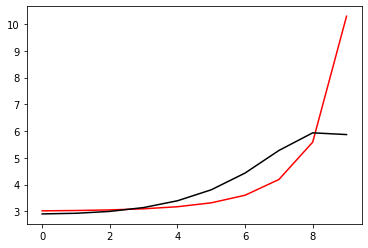

288200 0.02189800014471268
[2.82579164 2.83824193 2.8957263  3.02751899 3.26885702 3.6676666
 4.28540968 5.1454652  5.92067763 5.79540743]


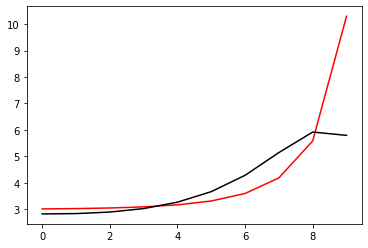

289300 0.01984057116933427
[2.95873019 2.96597251 3.01529222 3.13795098 3.37075253 3.7633057
 4.38021041 5.254734   6.09866077 6.20478682]


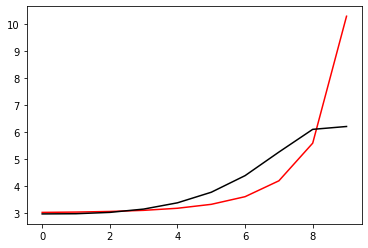

290400 0.3778239262535439
[2.62274849 2.62470097 2.66704415 2.78140671 3.00628795 3.39440392
 4.01774943 4.88951162 5.782383   6.25095834]


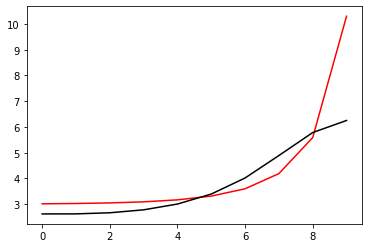

291500 0.012047740120749896
[2.90345922 2.88982615 2.91456996 3.00840557 3.20641992 3.55505286
 4.11477486 4.88606533 5.64418647 5.63733493]


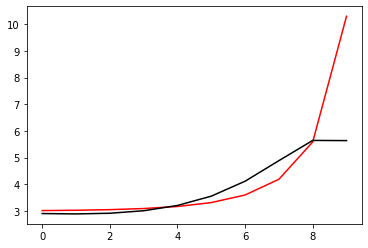

292600 0.010746320046038113
[2.89000211 2.8833362  2.9127991  3.01118119 3.21458212 3.57077538
 4.1417216  4.93352201 5.72405006 5.72605538]


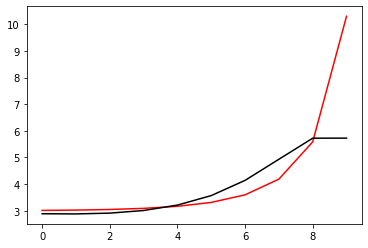

293700 0.013309986566707694
[2.89753273 2.90052594 2.93759282 3.04285616 3.25398847 3.62048849
 4.20591975 5.02369606 5.85559628 5.81631379]


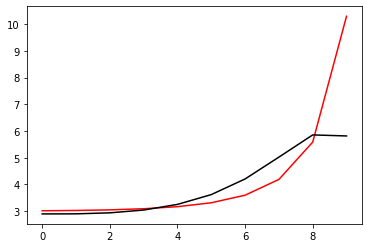

294800 0.0008326153676377936
[2.93290214 2.94387318 2.98843004 3.09997588 3.31792664 3.69371097
 4.29252249 5.13766921 6.01995242 6.09943127]


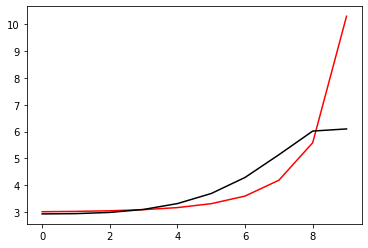

295900 0.010775065330718491
[2.94855465 2.94392431 2.9727049  3.06744045 3.26691445 3.62107609
 4.19153965 5.00934868 5.90378578 5.85114493]


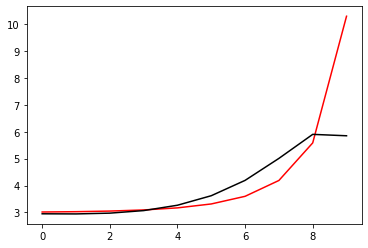

297000 0.010989436770429399
[2.87321428 2.87521176 2.91102288 3.0156113  3.23151084 3.61631392
 4.24831677 5.19549837 6.2895897  6.21837611]


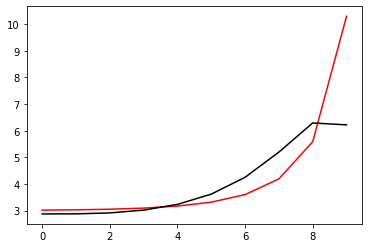

298100 0.011099320608684423
[2.92901563 2.92111491 2.94498718 3.03420335 3.22814376 3.57636856
 4.13434458 4.91621728 5.77108455 5.76401017]


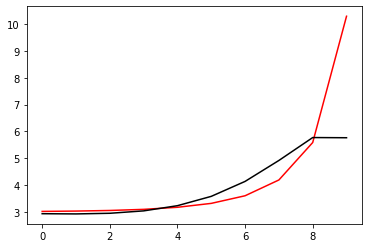

299200 0.023546679556915185
[2.89155909 2.89124843 2.92179832 3.017856   3.22024341 3.58155705
 4.16476873 4.99642778 5.89511878 5.85840779]


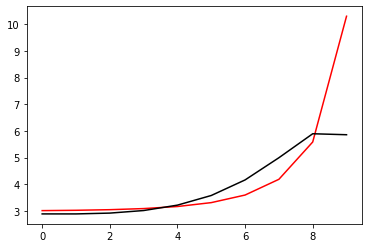

300300 0.019805138299275937
[2.87218943 2.88051949 2.91944178 3.02349738 3.23510055 3.60997772
 4.21810271 5.09729448 6.03909392 6.05890671]


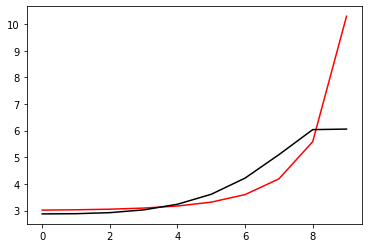

301400 0.03107925693034988
[2.97848376 2.98171774 3.01885375 3.12248556 3.33605287 3.71777206
 4.34123567 5.24647314 6.21153853 6.17998639]


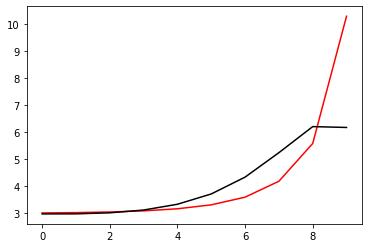

302500 0.04931457629935434
[2.81098791 2.81433925 2.85088754 2.95228127 3.16130331 3.53653088
 4.15442944 5.07072957 6.12394697 6.08791071]


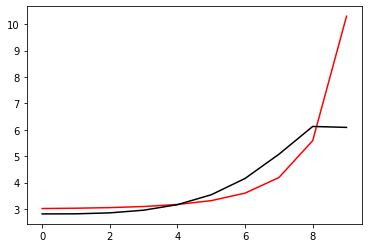

303600 0.010981439735860323
[2.86833293 2.87499186 2.91537909 3.0217904  3.23775375 3.62404178
 4.26225147 5.22345283 6.36203069 6.37733615]


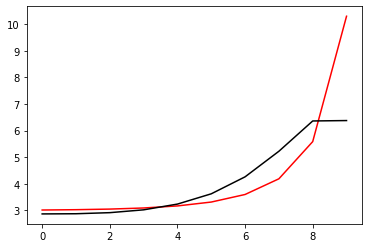

304700 0.011162977284043724
[2.92388749 2.94732549 3.00790802 3.13580967 3.37580764 3.79249516
 4.47560316 5.51289907 6.7647071  6.77374319]


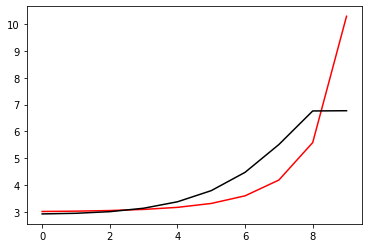

305800 0.000762137166557416
[2.91786986 2.88995787 2.89865452 2.97220738 3.15091461 3.49273899
 4.07742304 4.96021518 5.84375654 5.86575981]


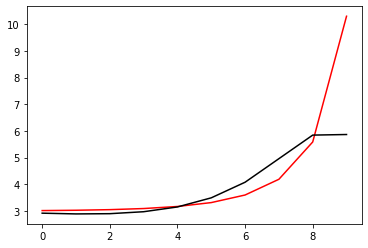

306900 0.010757328021648083
[2.92477355 2.90580353 2.91946397 2.99774172 3.18120714 3.52821235
 4.11902641 5.01143031 5.9217085  5.92419479]


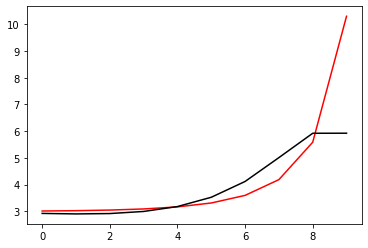

308000 0.010889768352218714
[2.91844933 2.91140495 2.93355377 3.01963876 3.21132267 3.56788461
 4.17099221 5.08333474 6.043122   6.041517  ]


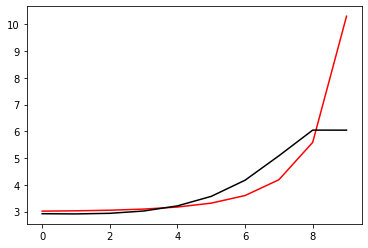

309100 0.011006526234180997
[2.90280538 2.90746177 2.94063404 3.03692477 3.23987842 3.61064614
 4.23373294 5.18027437 6.22052421 6.22749151]


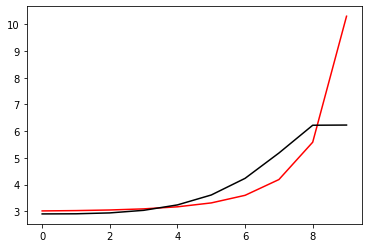

310200 0.021600136864241934
[2.86739822 2.86842278 2.89870894 2.99236182 3.19316612 3.56255323
 4.186253   5.14590484 6.26013216 6.1684503 ]


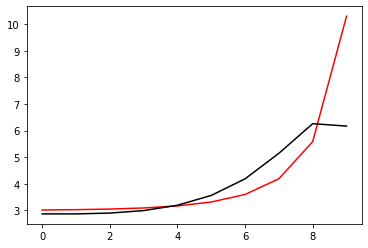

311300 0.014293723414908468
[2.93063787 2.94484173 2.9916215  3.1042664  3.32890222 3.73198589
 4.40884732 5.45799857 6.71480423 6.66261222]


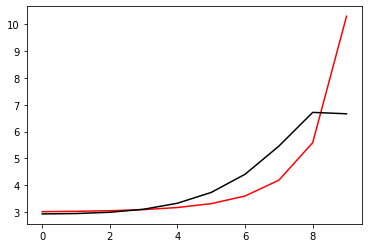

312400 0.07408923884273358
[2.78691584 2.78160832 2.81368848 2.91370328 3.1270379  3.52079963
 4.19191973 5.23895414 6.50173297 6.95889994]


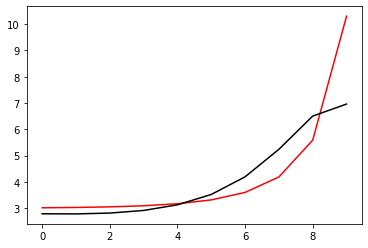

313500 0.011297650957012396
[2.89906239 2.88308925 2.90055377 2.98626142 3.18490977 3.56249594
 4.21467536 5.24118446 6.49410574 6.48189607]


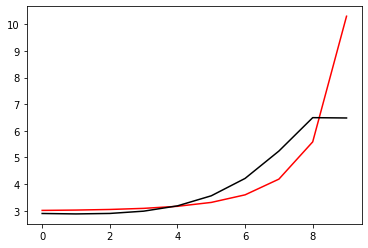

314600 0.011093653636070452
[2.87494398 2.87417136 2.9036817  3.0005117  3.21090277 3.60207668
 4.27157977 5.3241398  6.62843774 6.637912  ]


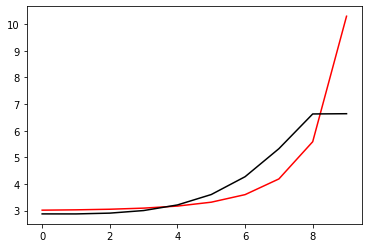

315700 0.0111169183284416
[2.92509823 2.93893489 2.98365524 3.09290877 3.31377891 3.71417327
 4.39249389 5.4590377  6.80812401 6.80377549]


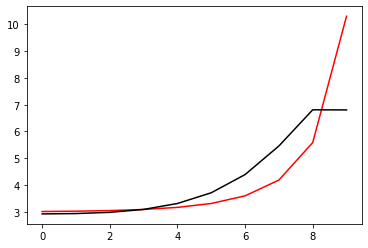

316800 0.0008736312458139259
[2.9575388  2.98632604 3.04516593 3.16278409 3.38177006 3.75865647
 4.34574684 5.09091194 6.2152825  6.25258591]


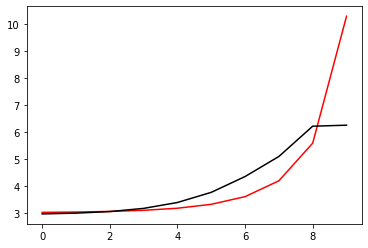

317900 0.010913706587746522
[2.8734222  2.90425961 2.96730819 3.08881984 3.31083606 3.68989959
 4.28465574 5.12083372 6.29835593 6.30213709]


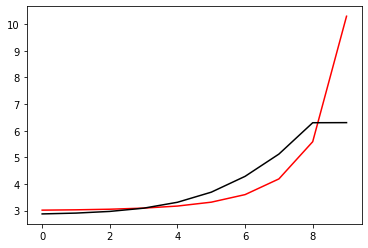

319000 0.011223669235080783
[2.86698285 2.9014048  2.97271329 3.10488352 3.34091156 3.74353785
 4.39712666 5.36077893 6.48807363 6.48253646]


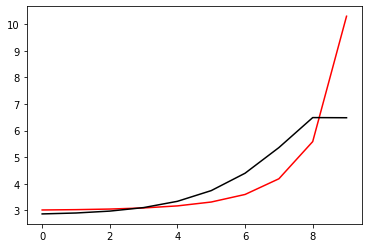

320100 0.01119104917570079
[2.84365722 2.87941213 2.9573214  3.09881196 3.3458621  3.76436746
 4.44873176 5.48514811 6.65196815 6.67717826]


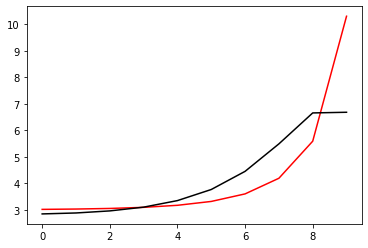

321200 0.037023812988811355
[2.94101554 2.95337211 3.0111853  3.13445921 3.36224263 3.75966474
 4.42474496 5.4236665  6.32670339 6.71988663]


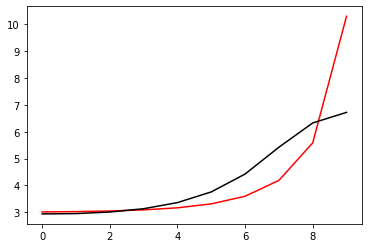

322300 0.0116837049712697
[2.88539211 2.90401521 2.96665928 3.09691279 3.33401483 3.74341847
 4.42297446 5.44144508 6.3913175  6.34348267]


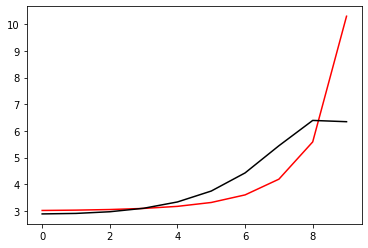

323400 0.031168764797316544
[2.89847416 2.92770869 3.00043363 3.14192727 3.39163349 3.81424932
 4.50565411 5.5373129  6.53830468 6.57425856]


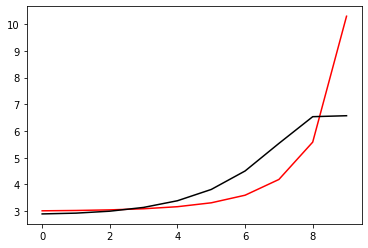

324500 0.06919881421819123
[2.73056306 2.74663519 2.80736418 2.93677172 3.17269941 3.57585059
 4.23474489 5.21828797 6.20695612 6.24838156]


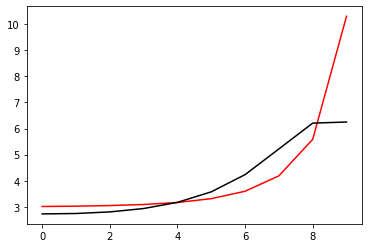

325600 0.010982697751797572
[2.85989408 2.86929828 2.92096681 3.04076598 3.26582445 3.65524083
 4.29527645 5.25499469 6.2331267  6.23419178]


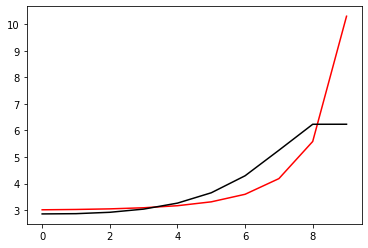

326700 0.011111818914527753
[2.87484371 2.89490468 2.95696444 3.08847201 3.32771574 3.73466804
 4.39676833 5.38717722 6.42913353 6.38772622]


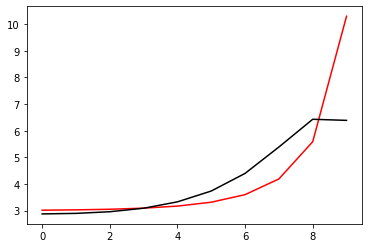

327800 0.0010860248577508212
[2.92535739 2.94920447 3.01481781 3.1489252  3.38994571 3.79689558
 4.45578139 5.44435637 6.528486   6.55243039]


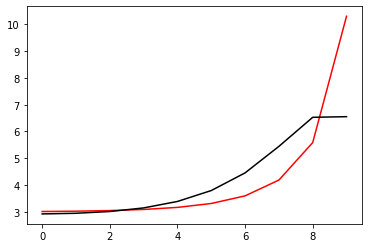

328900 0.010894073743059647
[2.87334919 2.88282004 2.93446141 3.05425467 3.27818216 3.65882247
 4.26598804 5.15151657 6.11663752 6.13559739]


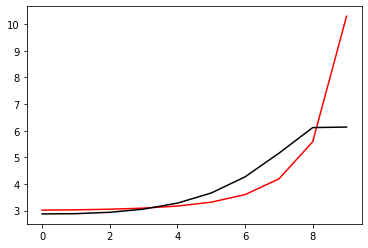

330000 0.011040946516715602
[2.88046173 2.89582631 2.95223675 3.07698718 3.30682933 3.69549118
 4.31495943 5.21904515 6.20714837 6.20901512]


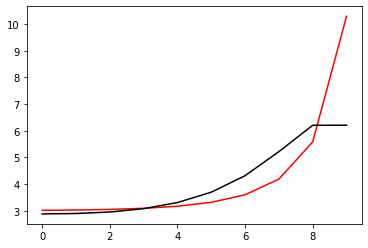

331100 0.011037726552962902
[2.87378032 2.89712406 2.96185549 3.09558454 3.33653998 3.74087245
 4.38528683 5.32944433 6.36892163 6.37216109]


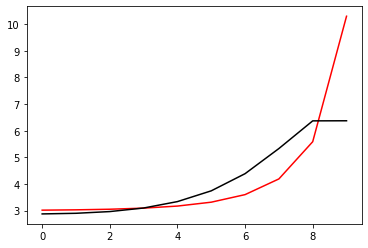

332200 0.02151067452671896
[2.81433967 2.84584688 2.92115007 3.06626937 3.32067548 3.74341277
 4.41780062 5.41795509 6.55016603 6.50734606]


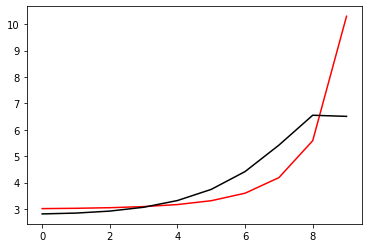

333300 0.015427418960234024
[2.88874268 2.89008366 2.93687692 3.05333172 3.27697364 3.66386403
 4.28929449 5.1919815  6.15101938 6.18677982]


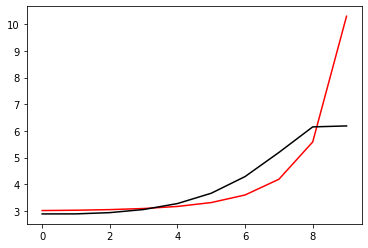

334400 0.030973003262789133
[2.88549638 2.8976572  2.95251861 3.07757703 3.31056788 3.70769853
 4.34447238 5.2638898  6.25321816 6.25944399]


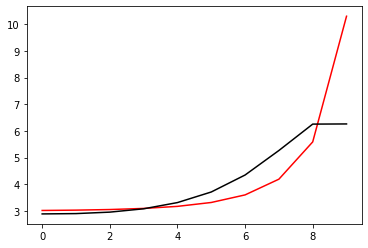

335500 0.014791791056281993
[2.87591222 2.89600048 2.95934668 3.09488858 3.3416727  3.75699676
 4.41779758 5.37369183 6.42262594 6.40202864]


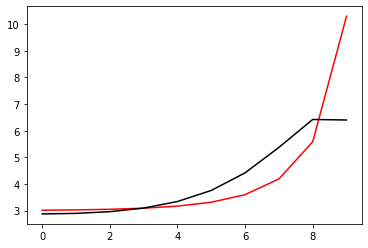

336600 0.04215929312430054
[2.77593063 2.78090872 2.82628871 2.93832456 3.15207954 3.51682631
 4.09629815 4.93223108 5.84894976 5.8857844 ]


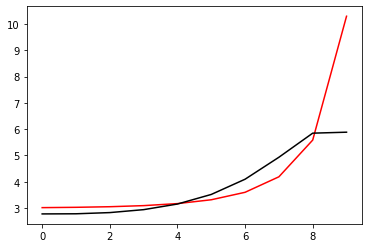

337700 0.016389685465259953
[2.8929998  2.8893492  2.92585342 3.02963921 3.23506493 3.59004691
 4.15583685 4.9711467  5.86227807 5.8490729 ]


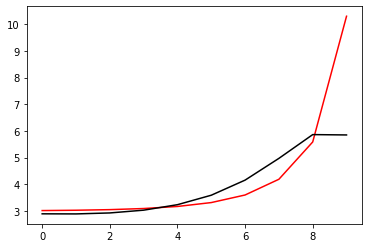

338800 0.0007893103073336003
[2.90282084 2.90600802 2.9473572  3.05591994 3.26682465 3.62891819
 4.20509825 5.03715521 5.95431256 5.98458038]


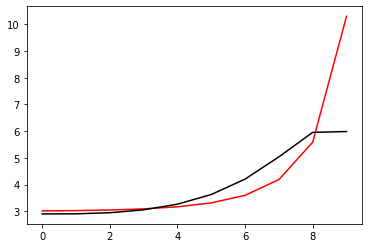

339900 0.010845829966982749
[2.90514368 2.91677495 2.96499076 3.07990932 3.29788727 3.66909581
 4.25890031 5.11450933 6.07218434 5.98564365]


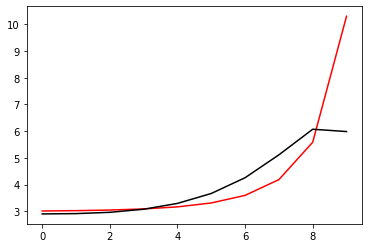

341000 0.011041475723804301
[2.84671795 2.86724538 2.92591276 3.05249691 3.2858605  3.68018121
 4.30838893 5.2312411  6.29293447 6.25943598]


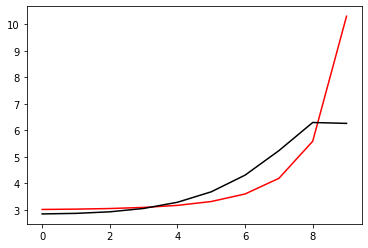

342100 0.011023859659379565
[2.86866907 2.89197146 2.95467905 3.0839106  3.31842915 3.71297937
 4.34234439 5.27783219 6.39383637 6.40036908]


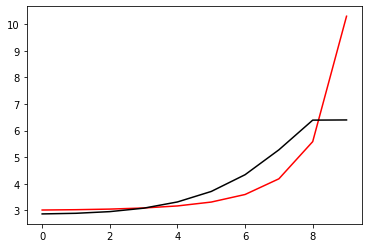

343200 0.022445206425467996
[2.88613081 2.87104386 2.89491904 2.98351288 3.1706325  3.50197448
 4.03350447 4.80373189 5.73044228 5.74321424]


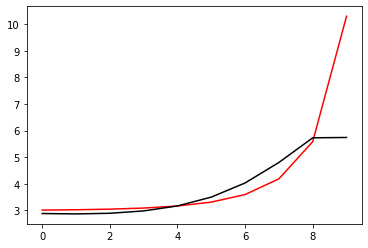

344300 0.020485933396079906
[2.90324738 2.8909683  2.91555101 3.00486721 3.19292584 3.52567684
 4.05968513 4.8348692  5.76850797 5.76865569]


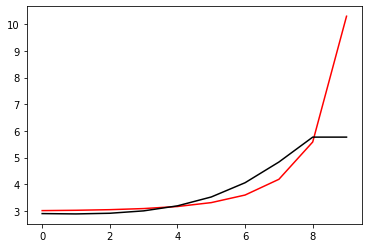

345400 0.0307145215544949
[2.90631604 2.90198383 2.93179107 3.02615503 3.22004031 3.56055561
 4.10648416 4.9012773  5.85948951 5.8604521 ]


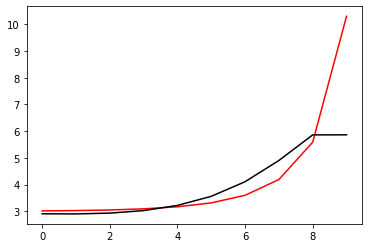

346500 0.011264857932816506
[2.86686985 2.87316704 2.9118993  3.01493696 3.21923098 3.57446942
 4.14456348 4.98164165 5.99706958 5.96952583]


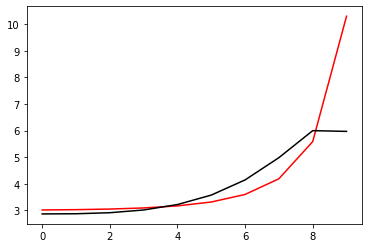

347600 0.010770523577057144
[3.00525774 3.00197479 3.03119863 3.12452667 3.31955383 3.66600764
 4.22789962 5.06176958 6.0879483  6.08775848]


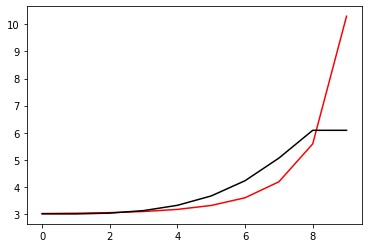

348700 0.010823390000231692
[2.95705664 2.96083058 2.99576939 3.09360958 3.29341895 3.64773432
 4.22742228 5.10727031 6.22057292 6.22130316]


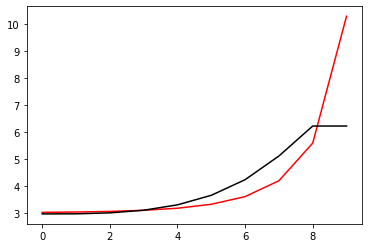

349800 0.0006160516908622986
[2.97346778 2.93817584 2.9331041  2.99040563 3.14773955 3.45550584
 3.98063424 4.77292397 5.73335516 5.73143924]


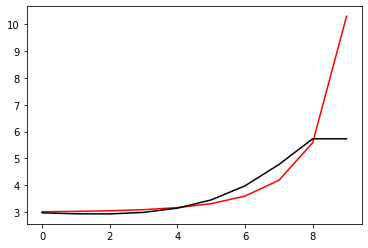

350900 0.010656233043014959
[2.92978958 2.90543774 2.90682809 2.97022905 3.13463065 3.45188306
 3.99099105 4.80692996 5.80568752 5.80720787]


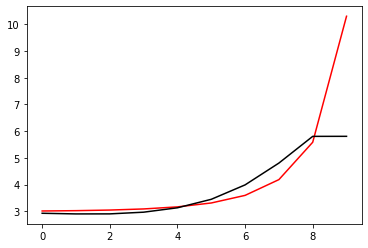

352000 0.01080215491306427
[2.91920722 2.90840986 2.91977048 2.99079754 3.16239972 3.48796674
 4.03863593 4.87629181 5.91513544 5.92186624]


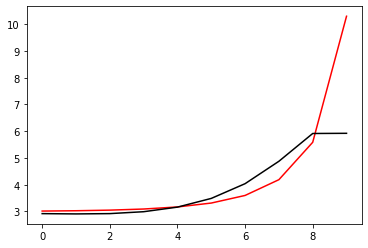

353100 0.006960772560519836
[2.96867525 2.98105301 3.01917    3.11644557 3.31671001 3.67768709
 4.27593094 5.18224281 6.31305328 6.24680176]


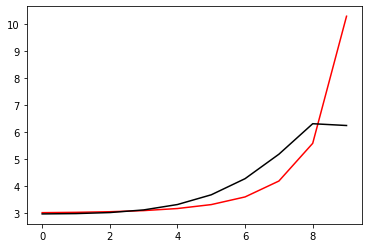

354200 0.04007051310751662
[2.79175049 2.81701086 2.87521617 2.99388268 3.21705857 3.60752789
 4.25143696 5.23876601 6.49997695 6.42860293]


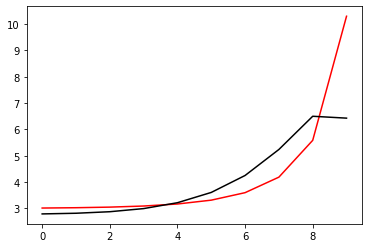

355300 0.02029391916971875
[2.91374666 2.91156016 2.93853591 3.01944512 3.1918099  3.50550343
 4.02081169 4.7936605  5.78948336 5.78413317]


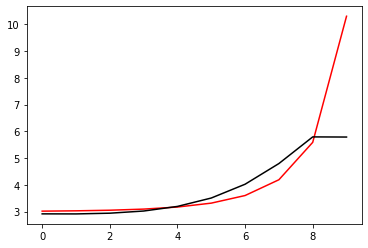

356400 0.030676339483149944
[2.91045375 2.91331522 2.94467229 3.03047255 3.20853874 3.52991847
 4.05750839 4.84994128 5.86562365 5.86840046]


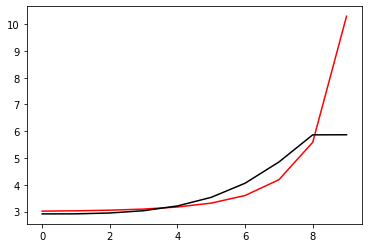

357500 0.011261066222878126
[2.87308673 2.88344101 2.92242135 3.01685926 3.20539755 3.54151529
 4.09372783 4.92802723 5.99196302 5.97771638]


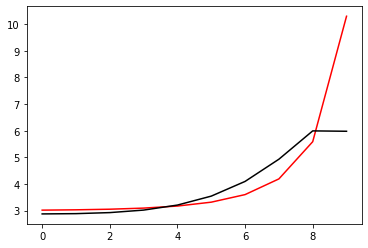

358600 0.010834919597629892
[2.86669988 2.88114111 2.92559687 3.02618003 3.22171563 3.56720294
 4.13561145 5.00079492 6.10612074 6.1128051 ]


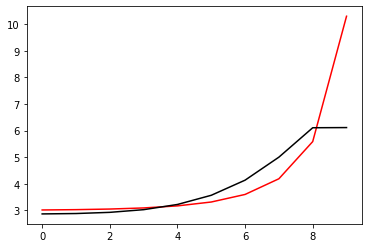

359700 0.010817034697806432
[2.94879588 2.95259313 2.98763811 3.0791737  3.26410492 3.59469655
 4.13939104 4.96896069 6.05077718 6.00186304]


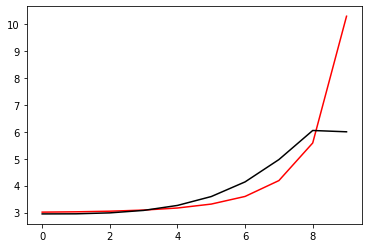

360800 0.0008022253285218788
[2.93970586 2.94293411 2.97654626 3.06883236 3.25786437 3.59897045
 4.17022954 5.06458109 6.25324712 6.27397493]


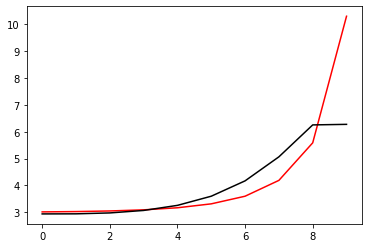

361900 0.010877540262561356
[2.90200513 2.90637606 2.93932307 3.0312535  3.22161515 3.56826354
 4.15875813 5.11675982 6.42742412 6.33694991]


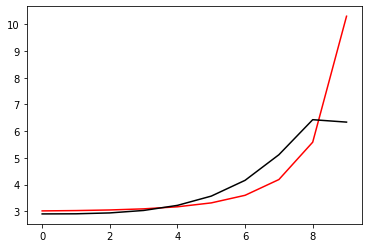

363000 0.010962164358453999
[2.90577364 2.91085436 2.94441398 3.03656953 3.22745903 3.57501112
 4.16389707 5.14214804 6.56396623 6.56066964]


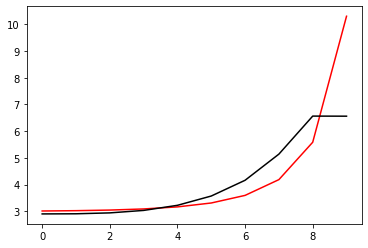

364100 0.01596972428013006
[2.92722642 2.90752387 2.91664228 2.98346909 3.14611223 3.46062125
 4.01559865 4.85289319 5.96800783 5.95753836]


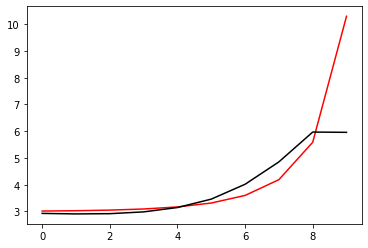

365200 0.02448475702606623
[2.92426825 2.9106459  2.92397846 2.9950443  3.16259862 3.48370506
 4.04731759 4.90088067 6.03675321 6.01256642]


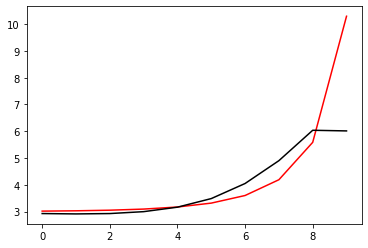

366300 0.019774362723217177
[2.91206123 2.90790471 2.92892402 3.00754598 3.1837814  3.51639371
 4.09528881 4.97706422 6.14925907 6.15520645]


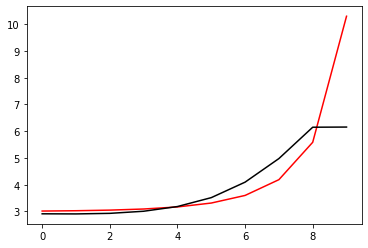

367400 0.030843843177934645
[2.88776776 2.89206873 2.92124841 3.00737122 3.19190127 3.53541535
 4.12868859 5.04192609 6.26047649 6.23235716]


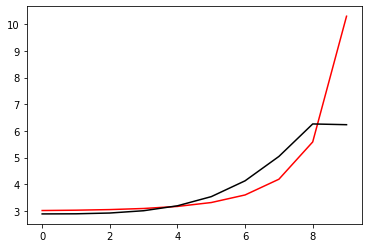

368500 0.020050580295702475
[2.96980705 2.96544449 2.98676511 3.06291873 3.23395158 3.5571274
 4.11379894 4.97687622 6.15461433 6.17483712]


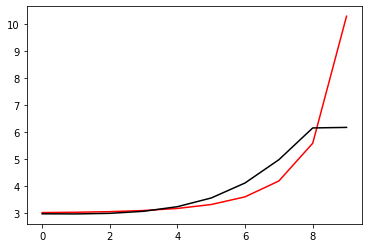

369600 0.01210818597948159
[3.04369496 3.02972783 3.04275246 3.11473332 3.28834445 3.62627502
 4.22010498 5.16397633 6.4393405  6.53772807]


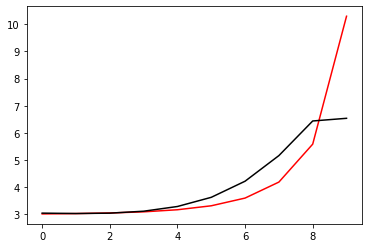

370700 0.010941653298100535
[2.9671497  2.95745957 2.97196744 3.0460298  3.22411594 3.57218755
 4.19106777 5.20745013 6.60437176 6.52853116]


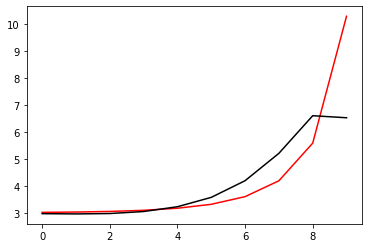

371800 0.0007281553720843857
[2.9791832  2.94195868 2.92916214 2.9749981  3.12200238 3.43198502
 3.99753337 4.91056553 6.10131453 6.13567302]


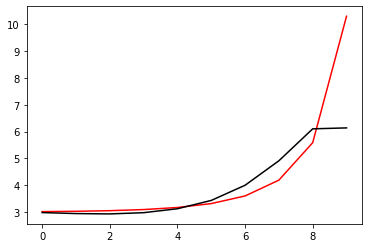

372900 0.0107547096959143
[2.96756862 2.93630669 2.92705676 2.97636963 3.12754576 3.44343789
 4.01816824 4.94732086 6.16049011 6.16354214]


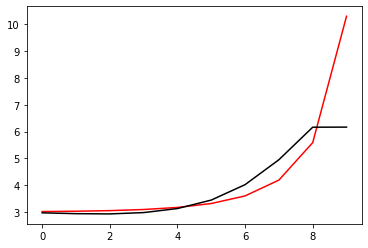

374000 0.010849577828085284
[2.94601559 2.92420821 2.92155693 2.97661524 3.13399327 3.45793666
 4.04446633 4.99460124 6.23968072 6.23933191]


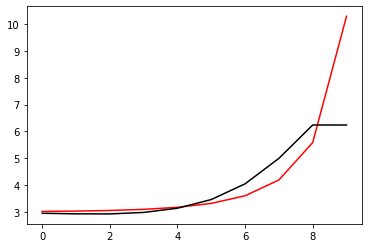

375100 0.010950369635356061
[2.94558101 2.93666612 2.94536124 3.01001035 3.17713532 3.51286299
 4.1151218  5.09038338 6.3722422  6.33654159]


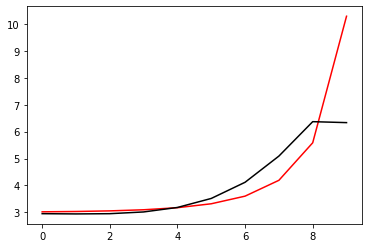

376200 0.0226559591848852
[2.85283633 2.85776447 2.88320247 2.96486331 3.15207834 3.51644059
 4.16545671 5.22392547 6.62118642 6.54585622]


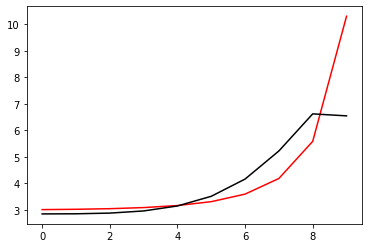

377300 0.017092827128784873
[2.97093226 2.96229034 2.97116985 3.03137286 3.18777705 3.50142036
 4.05121408 4.89470324 5.98824039 5.92439725]


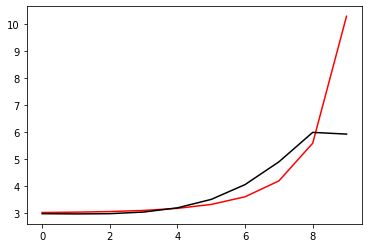

378400 0.03077155822931199
[2.90661259 2.90495463 2.92125245 2.98896718 3.15391702 3.48026649
 4.05764252 4.98008844 6.13701107 6.14552266]


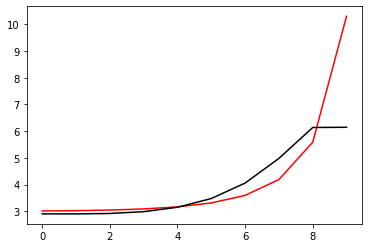

379500 0.012546391525888607
[2.87037339 2.87311739 2.89693914 2.97369763 3.15046429 3.49648227
 4.11694335 5.13999145 6.36267844 6.32886354]


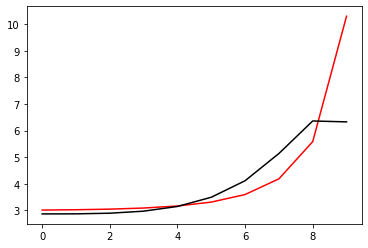

380600 0.010810990849594514
[2.91174295 2.90251295 2.91536796 2.98144634 3.14578659 3.4752975
 4.06890493 5.03068677 6.23509068 6.22549367]


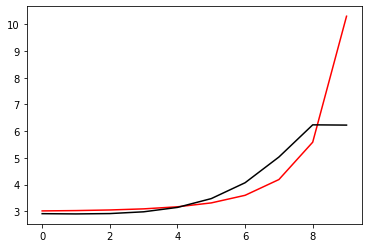

381700 0.010840332102700691
[3.01628963 3.00960942 3.02477576 3.09398767 3.26233705 3.59709166
 4.19604194 5.16314037 6.4026584  6.41106178]


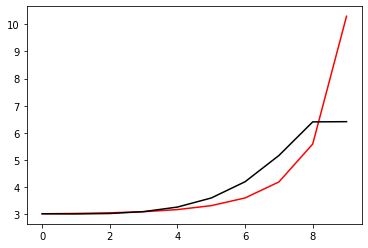

382800 0.0008699494667184239
[2.99797135 2.99576008 3.01544817 3.08912647 3.26171731 3.6002062
 4.20190193 5.18304603 6.53082118 6.54175022]


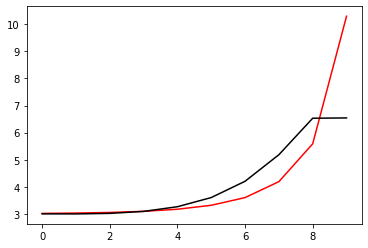

383900 0.010687570353602183
[2.94376992 2.91970469 2.91856078 2.97087623 3.1192019  3.42693903
 3.98589086 4.84875263 5.99878679 6.02140042]


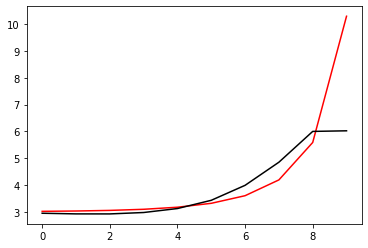

385000 0.010805363251074002
[2.94021071 2.92277845 2.92642272 2.9835682  3.13738956 3.45226098
 4.02096325 4.90223881 6.07078587 6.0720398 ]


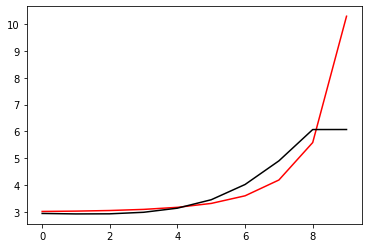

386100 0.010870526795115581
[2.94982704 2.94280906 2.95562594 3.02198007 3.18636961 3.51494657
 4.10234638 5.01526669 6.21200595 6.18080291]


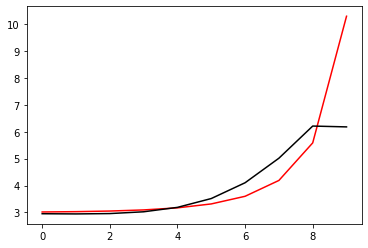

387200 0.02165620772808962
[2.86043711 2.86678814 2.89415847 2.97536792 3.15690955 3.50851607
 4.13161535 5.11473828 6.39913249 6.32658188]


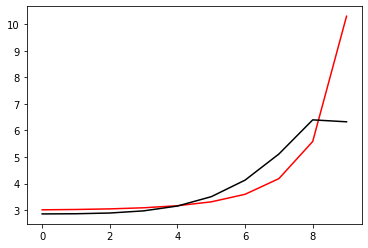

388300 0.01852283912649098
[2.99374822 2.98707575 3.00372727 3.07578905 3.24941199 3.59344637
 4.20673885 5.18709705 6.48821789 6.61524234]


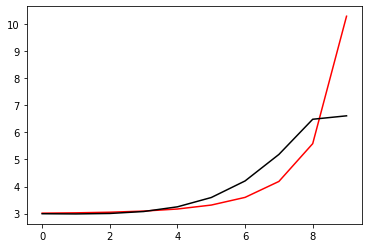

389400 0.26988079645581226
[2.69900709 2.68591151 2.69662249 2.76213737 2.92756571 3.25993102
 3.85182432 4.77689905 6.08115277 6.51430626]


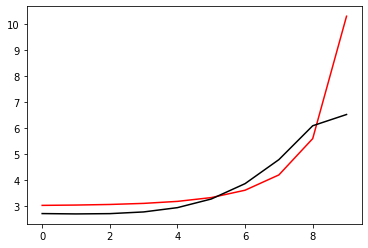

390500 0.018263392478695507
[2.95733859 2.95197685 2.96643844 3.03073527 3.18655671 3.49191399
 4.01214807 4.75326628 5.81242086 5.8010949 ]


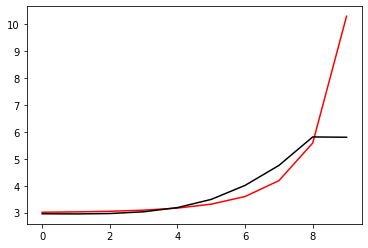

391600 0.010724407711716061
[2.89579345 2.89667566 2.91749406 2.98847402 3.15223381 3.46945518
 4.01642967 4.84044102 5.93710967 5.9374132 ]


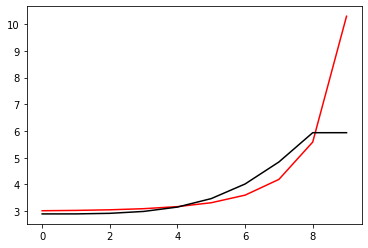

392700 0.011561235960027533
[2.91207716 2.92299117 2.9565634  3.04258691 3.2263405  3.5756753
 4.18679266 5.12147269 6.19196908 6.13991706]


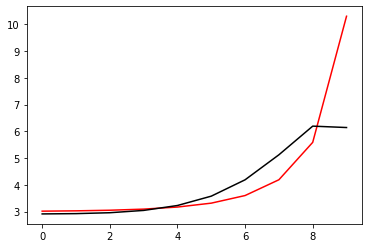

393800 0.000801375561875612
[3.0037383  3.00399112 3.02906461 3.10800775 3.28477274 3.6251773
 4.21794767 5.12734677 6.22205089 6.22842687]


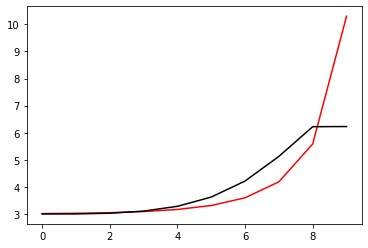

394900 0.010876773562650465
[2.94746079 2.95308158 2.98403621 3.06949342 3.25274603 3.59937572
 4.20130979 5.15921051 6.36859427 6.33902834]


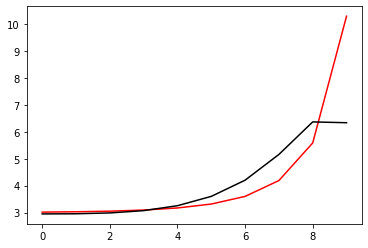

396000 0.011193803744583083
[2.93304786 2.93363114 2.96115946 3.04371594 3.2244463  3.57022772
 4.17958893 5.13741049 6.15608291 6.15826214]


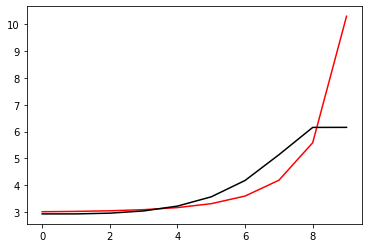

397100 0.010922945751624436
[2.91686766 2.92177606 2.95353706 3.04072586 3.22683199 3.57945232
 4.19817337 5.16990257 6.21402665 6.21395982]


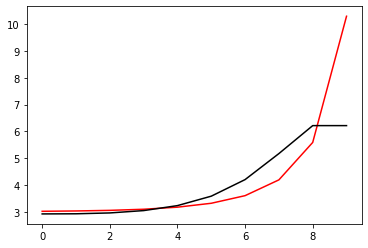

398200 0.022198631558581674
[2.87325274 2.88669733 2.92804123 3.02603204 3.22517948 3.59514335
 4.2388377  5.24770472 6.34825267 6.31119046]


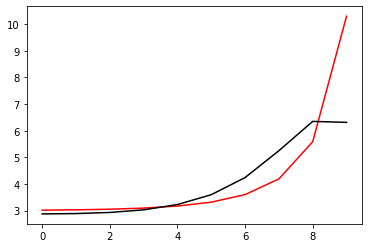

399300 0.011667503298004625
[2.88830578 2.9120259  2.96703828 3.08080935 3.29884714 3.69295434
 4.36856457 5.41894786 6.57966493 6.57981275]


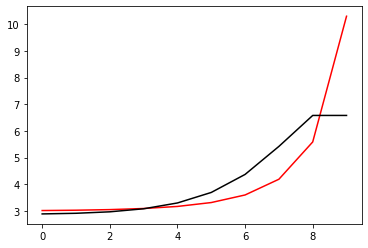

400400 0.03116187409553351
[2.93036551 2.94947258 3.00350499 3.12072088 3.34673216 3.75455801
 4.45207064 5.53955565 6.77791478 6.85503294]


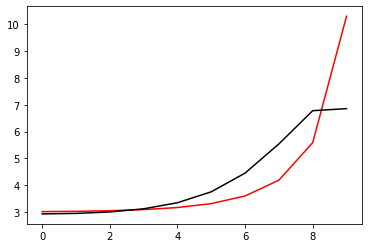

401500 0.020915013390948724
[2.94210704 2.97890927 3.04896964 3.17822098 3.40813807 3.80064358
 4.42015447 5.17206019 6.22090187 6.69684954]


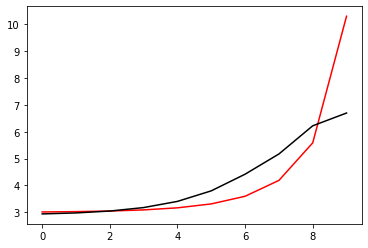

402600 0.010950226320270852
[2.94003639 2.97747031 3.0498907  3.1811549  3.4122532  3.80366332
 4.41536549 5.18805122 6.23526731 6.23868174]


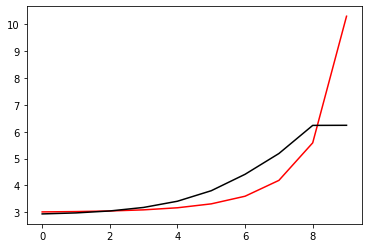

403700 0.011182241206841493
[2.84040684 2.88282243 2.9639579  3.10539284 3.34863524 3.75758223
 4.41504255 5.37609766 6.43251958 6.40667538]


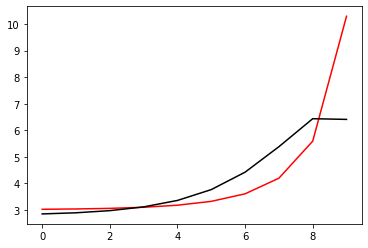

404800 0.0012059635600010965
[2.84739682 2.89106704 2.97868299 3.12925119 3.38371146 3.80851103
 4.49800777 5.51943713 6.57343355 6.57591618]


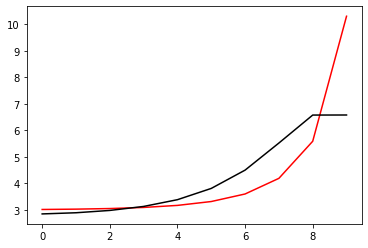

405900 0.01095285106099837
[2.88287656 2.90151465 2.96728481 3.09689734 3.32703213 3.71862218
 4.35838641 5.27564003 6.09099705 6.10638217]


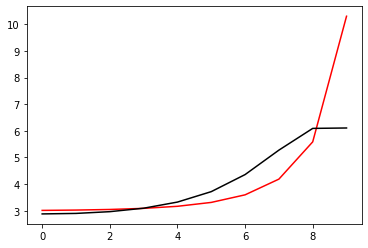

407000 0.01104178241214463
[2.86103265 2.88277061 2.95077669 3.08355893 3.31783459 3.71509456
 4.36306148 5.29608431 6.14301772 6.14387683]


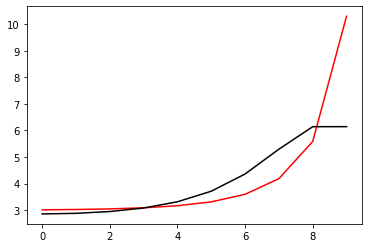

408100 0.01106990628288361
[2.85186979 2.87824605 2.95013175 3.08792459 3.32847947 3.73366343
 4.39156013 5.34200268 6.22824116 6.22900543]


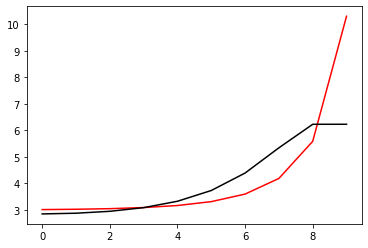

409200 0.02164358219938221
[2.81844177 2.85163392 2.93105866 3.07846566 3.33154312 3.75346547
 4.43476578 5.42590193 6.38969726 6.35980571]


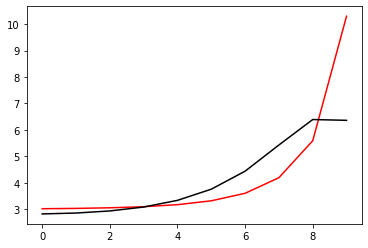

410300 0.586444864460027
[3.07155578 3.09791849 3.17386045 3.32091484 3.57667707 4.00278214
 4.68453486 5.66568834 6.62994888 6.62187629]


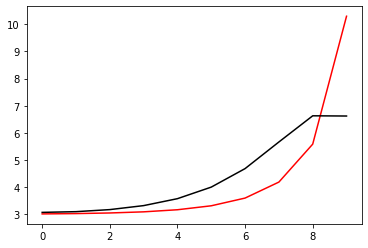

411400 0.03097317015114835
[2.87954613 2.89435854 2.9555446  3.08539893 3.31913271 3.71436897
 4.35145773 5.27481911 6.18878841 6.18476781]


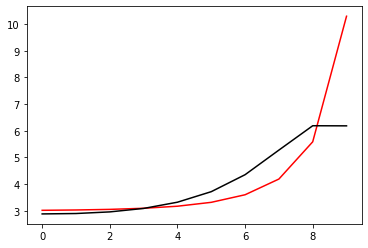

412500 0.011434517933245406
[2.83097193 2.85479153 2.92477598 3.06586813 3.31467388 3.73021652
 4.39542484 5.36252859 6.35514714 6.32311689]


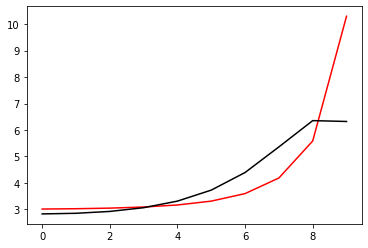

413600 0.011140276974094974
[2.90199644 2.93272324 3.00951849 3.15727648 3.41293367 3.83457592
 4.50416686 5.48066652 6.51937155 6.54504268]


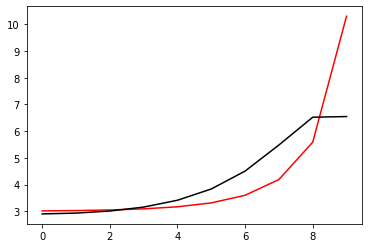

414700 0.013839185692700783
[2.88778566 2.88741584 2.93330974 3.04822428 3.26456332 3.63062522
 4.20910303 5.03692774 5.90988597 5.89640127]


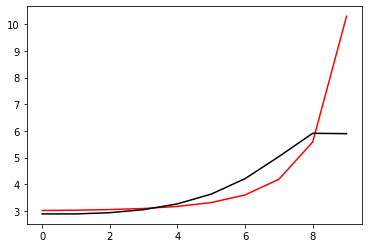

415800 0.0008369865374024194
[2.89539865 2.90099659 2.95077345 3.0699396  3.29160862 3.66501811
 4.25446545 5.09795411 5.98805459 5.99263427]


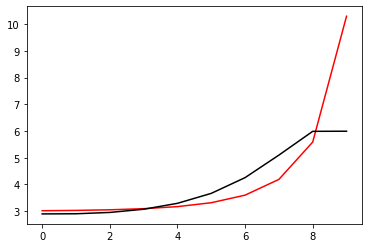

416900 0.010906887281682088
[2.89422622 2.90844077 2.96495906 3.0912511  3.3218689  3.70777689
 4.31638648 5.18905353 6.11425992 6.09329083]


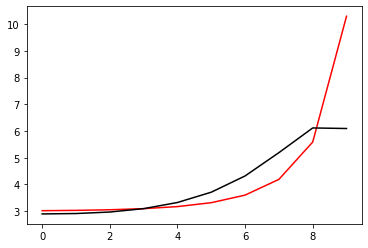

418000 0.011163942977819705
[2.87484149 2.89669325 2.96087093 3.09550134 3.33724706 3.73972542
 4.37546192 5.29423691 6.28422837 6.29779875]


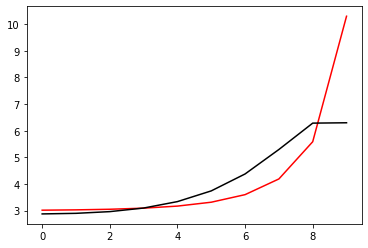

419100 0.0015230631218664788
[2.95388975 2.96944145 3.02896864 3.16174102 3.40646397 3.81970782
 4.47994357 5.44755816 6.51077929 6.49117189]


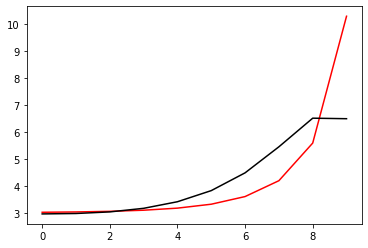

420200 0.026467732543934832
[2.91071455 2.90625638 2.94470908 3.05398901 3.26937726 3.64107207
 4.23587864 5.09551767 5.99884368 5.98354375]


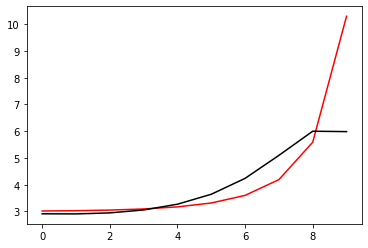

421300 0.014538944532866244
[2.89983219 2.90193292 2.94531795 3.05981145 3.28158488 3.66208343
 4.2701483  5.15059022 6.08408804 6.05675185]


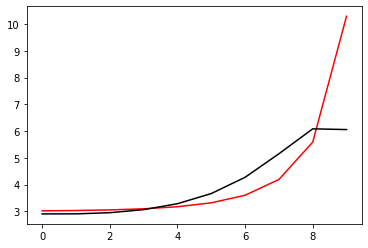

422400 0.030941150872000663
[2.88836296 2.89929831 2.94991095 3.0715531  3.3017583  3.69358908
 4.31847378 5.2257827  6.20114819 6.21722217]


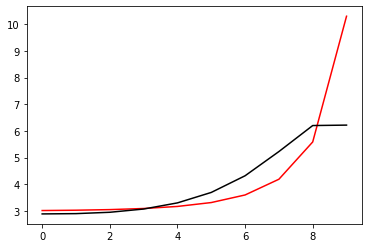

423500 0.013968864773130089
[2.81887673 2.84192994 2.9058008  3.04193652 3.29062281 3.70910901
 4.37605604 5.35194237 6.42556252 6.37633072]


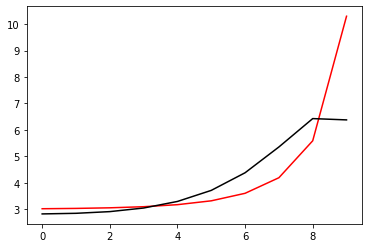

424600 0.011096801231884607
[2.90261333 2.92110629 2.98056575 3.11247362 3.35780893 3.77441225
 4.44186973 5.42815909 6.54794328 6.59460843]


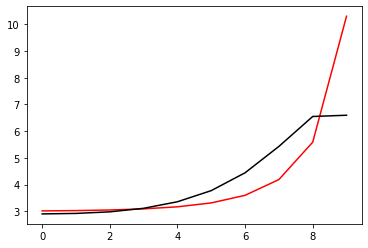

425700 0.012739577767540406
[2.88047352 2.89109143 2.94056956 3.05658397 3.27567345 3.64666864
 4.23052345 5.06974623 6.00553946 6.10206708]


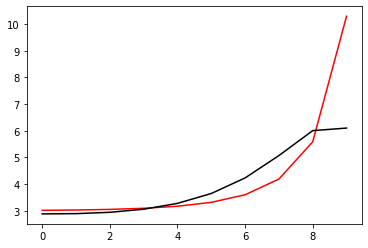

426800 0.0008641046889023606
[2.88549932 2.89954702 2.95215733 3.0715563  3.29475952 3.67163536
 4.26520181 5.12077014 6.07730464 6.07147745]


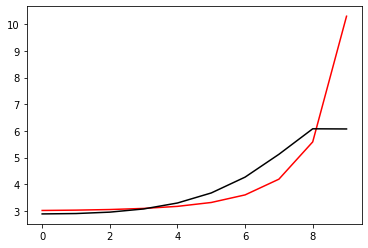

427900 0.010929760884304852
[2.88072397 2.90092293 2.95977929 3.08572839 3.31665913 3.70429804
 4.31540239 5.20076569 6.19659121 6.20125757]


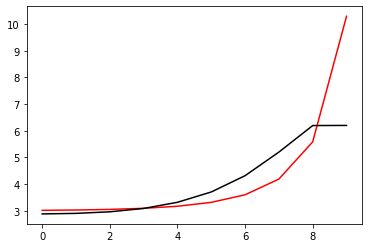

429000 0.011208454757138355
[2.87170464 2.89876501 2.96634794 3.10194933 3.34467476 3.74919474
 4.38820851 5.32164227 6.38325768 6.38408853]


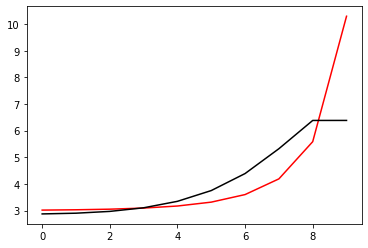

430100 0.011110915140775607
[2.85755533 2.88756298 2.96078569 3.10252137 3.3517737  3.76480096
 4.41854506 5.38497509 6.51781495 6.52101395]


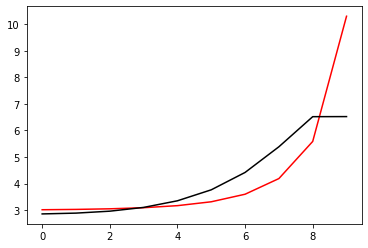

431200 0.025509965979257403
[2.87886113 2.89796058 2.95867782 3.08452009 3.31042931 3.68432081
 4.26384371 5.08526778 6.01562643 5.99321498]


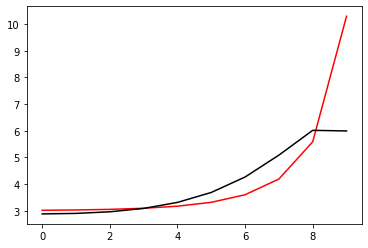

432300 0.013130264676828905
[2.87137184 2.89579848 2.96196701 3.09421905 3.32838848 3.71476114
 4.31648083 5.1745161  6.13088584 6.09776875]


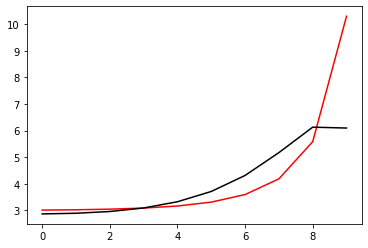

433400 0.031022784528423247
[2.8694174  2.90056201 2.97434721 3.1153746  3.36059259 3.76322124
 4.39290909 5.29621412 6.28810769 6.31709437]


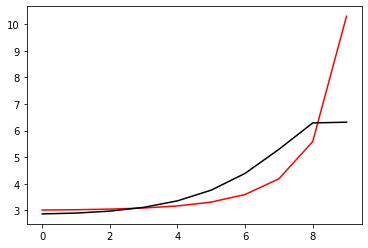

434500 0.01982246420305549
[2.88155657 2.91750645 2.99938422 3.15103498 3.41069635 3.83548489
 4.5033175  5.46916542 6.51971151 6.48628043]


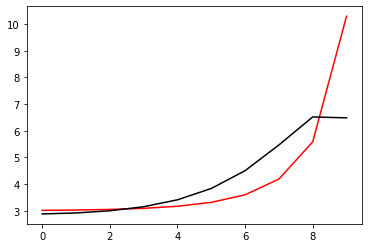

435600 0.011214285087623755
[2.88093612 2.91689441 3.00154273 3.15749166 3.42226204 3.85349317
 4.53195392 5.52692697 6.6518755  6.67797155]


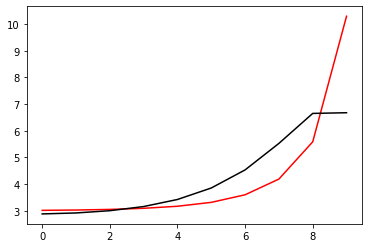

436700 0.011291630432438984
[2.90102819 2.89877211 2.94428193 3.06086572 3.28334011 3.66499307
 4.27792591 5.16630859 6.14901884 6.12433317]


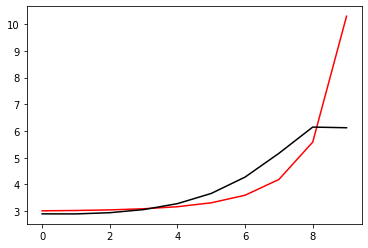

437800 0.0009489331122747432
[2.90348839 2.91315645 2.96668313 3.09154621 3.3231777  3.71510263
 4.34002072 5.24611286 6.2591388  6.26763634]


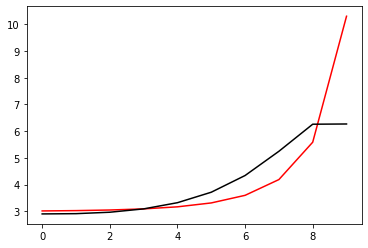

438900 0.011042004407070092
[2.94325919 2.94966404 2.99836717 3.11930286 3.34910641 3.74151021
 4.37006374 5.28984523 6.33969947 6.33157154]


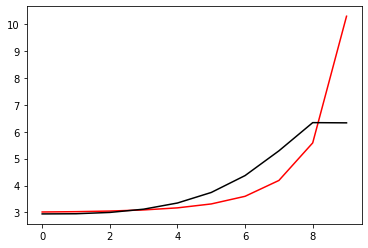

440000 0.011106387672298544
[2.8754082  2.89111675 2.94696528 3.07468727 3.31364232 3.71959892
 4.36949625 5.32990732 6.45767539 6.49780967]


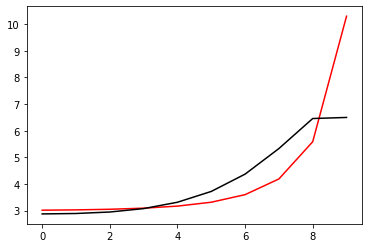

441100 0.011240560205560897
[2.94374886 2.92191216 2.93865305 3.02346405 3.21120087 3.5474786
 4.08836242 4.87654114 5.81407824 5.80486987]


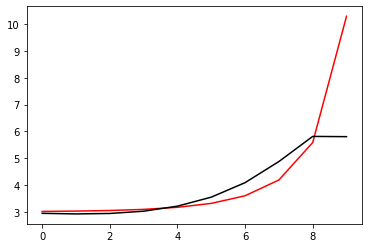

442200 0.025398450121810412
[2.92046835 2.90477929 2.92571199 3.01497934 3.20832995 3.55284591
 4.10738759 4.91805906 5.88276923 5.8648795 ]


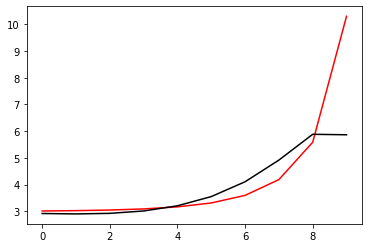

443300 0.019631609391093156
[2.90394211 2.89691477 2.92401753 3.01925188 3.21968169 3.57412204
 4.14459481 4.98109041 5.97697246 5.98777164]


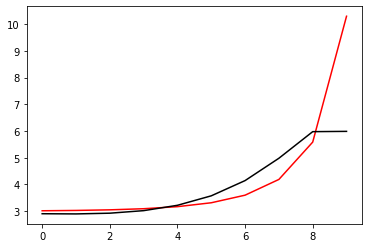

444400 0.030837392231370667
[2.88101232 2.88358211 2.91815393 3.01971523 3.22710233 3.59115977
 4.17774949 5.0432408  6.07998261 6.08289825]


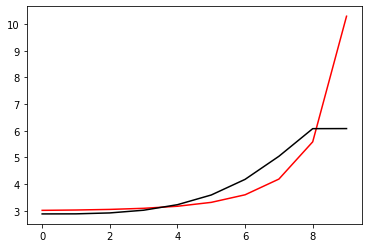

445500 0.020818613147784455
[3.00560203 3.00069925 3.02850171 3.12306959 3.32443836 3.68446311
 4.27009227 5.14105436 6.19668629 6.22362218]


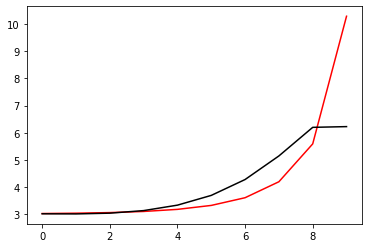

446600 0.010847807419670286
[2.99358215 2.9936919  3.02454186 3.11988717 3.32068938 3.68073734
 4.2713768  5.16621028 6.28762747 6.29111117]


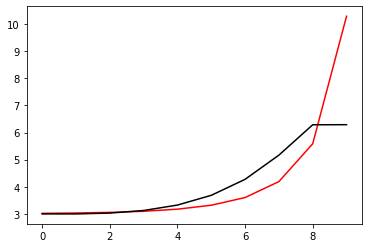

447700 0.015177928676669939
[2.94027552 2.93045091 2.94981513 3.02876748 3.20466103 3.52376795
 4.03539833 4.75120435 5.66383879 5.71043124]


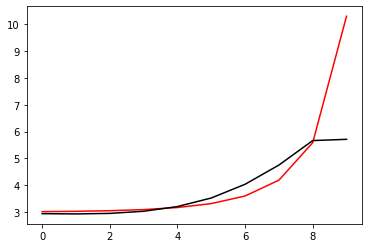

448800 0.0006390972066341471
[2.91475287 2.91031252 2.93396131 3.0172273  3.19824658 3.52513877
 4.05210731 4.80087776 5.74052858 5.73898461]


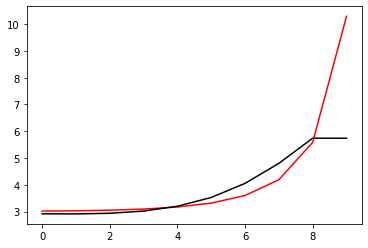

449900 0.010706155666224607
[2.89798949 2.90136935 2.93233382 3.02292796 3.21263503 3.55244961
 4.10328056 4.897958   5.86940017 5.87202442]


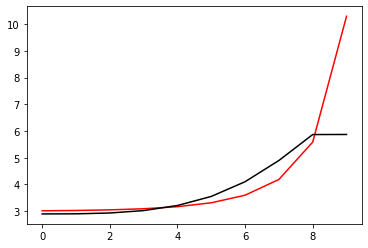

451000 0.010979657686203115
[2.90083669 2.91402014 2.95638299 3.05873243 3.26239954 3.62263601
 4.20905187 5.06551546 6.07606188 6.08223617]


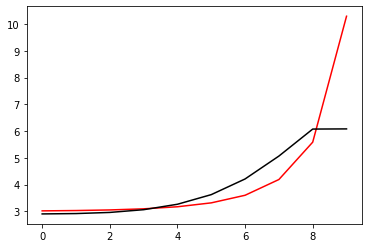

452100 0.00986188784893872
[2.95608839 2.96582929 3.00659061 3.10998465 3.31862472 3.69205757
 4.3110639  5.24283918 6.32243284 6.2247322 ]


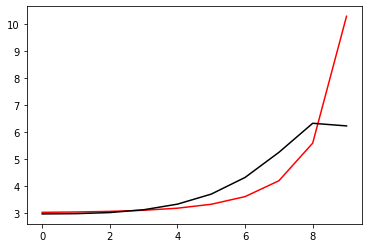

453200 0.026627915017679138
[2.92885281 2.91663344 2.93514712 3.01351642 3.19102487 3.5214707
 4.07341344 4.88521981 5.79325583 5.78046365]


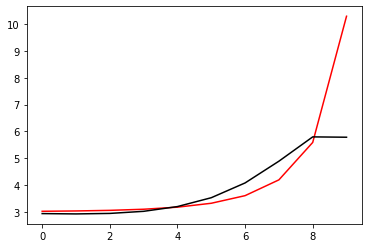

454300 0.019634058936720145
[2.92324763 2.91497816 2.93658564 3.01824279 3.19961511 3.53524969
 4.09502277 4.91980308 5.84569242 5.84108001]


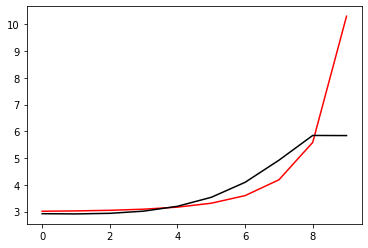

455400 0.03073756821835827
[2.91156702 2.90890604 2.93507477 3.02135429 3.20798956 3.55054855
 4.12078553 4.96372077 5.91668997 5.91532993]


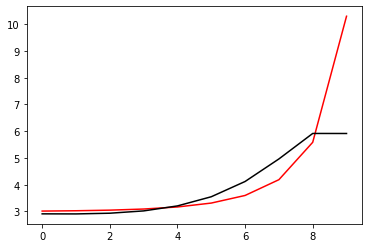

456500 0.011267453787172548
[2.87658516 2.88185903 2.91544526 3.0092015  3.20441919 3.55847043
 4.14662728 5.0217603  6.02449281 5.9937392 ]


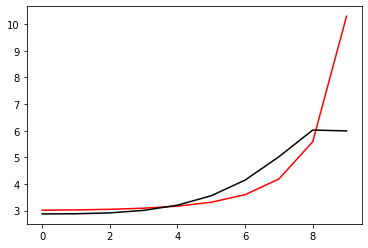

457600 0.010879957598481517
[2.86908307 2.87925882 2.91874353 3.01812807 3.21932957 3.58101177
 4.18128618 5.08238886 6.13570059 6.14070674]


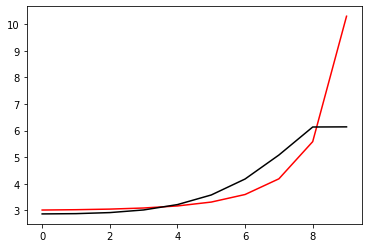

458700 0.01088665468385983
[2.98157455 2.98765734 3.02557141 3.12503095 3.32794975 3.69384971
 4.30245506 5.22365708 6.324842   6.33649889]


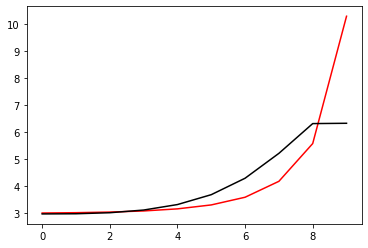

459800 0.0005645151059743476
[2.99233613 2.99934224 3.03442432 3.12550111 3.31019871 3.6362285
 4.13768244 4.70189209 5.56986692 5.59266756]


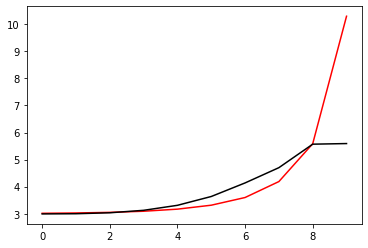

460900 0.010718957188824835
[2.94499962 2.95643335 2.99581146 3.09080028 3.27921289 3.60943565
 4.12083007 4.7589876  5.644432   5.64502281]


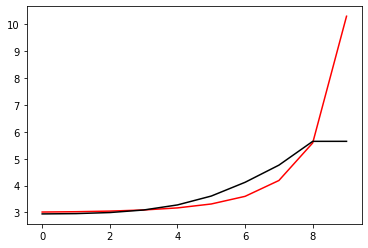

462000 0.010768499979937753
[2.88267536 2.89766143 2.94149919 3.0410284  3.23433192 3.57142197
 4.1036166  4.85189803 5.77130421 5.77036571]


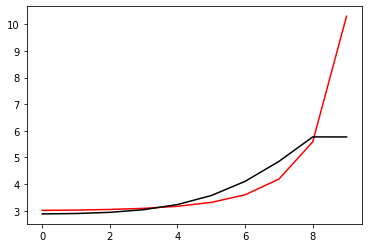

463100 0.011004275597414457
[2.87336275 2.89682799 2.95313988 3.06815524 3.28285895 3.6574855
 4.2794171  5.2216819  6.09536255 6.11215478]


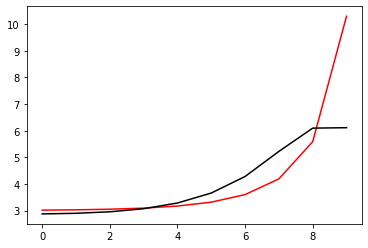

464200 0.12166594068706572
[2.66026931 2.68029154 2.73613914 2.85356236 3.07314941 3.45841893
 4.10841327 5.12049325 6.0372741  6.48351793]


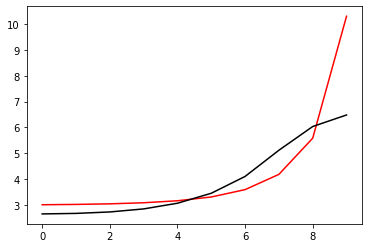

465300 0.014207309103495823
[2.88667498 2.92175731 2.98931884 3.11236813 3.3279598  3.68955502
 4.25819437 5.01131475 5.70566399 5.65410563]


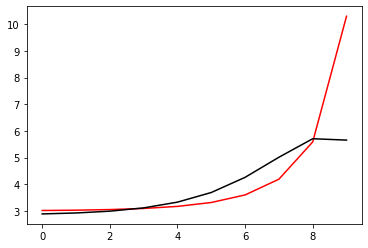

466400 0.03088890673625893
[2.84656589 2.88385265 2.95689262 3.08680715 3.31124197 3.68681397
 4.28855646 5.1546856  5.87709    5.88523901]


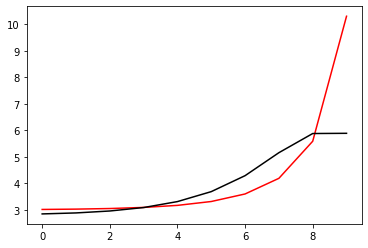

467500 0.012246803990340017
[2.83701747 2.87547398 2.95576324 3.09761403 3.3403789  3.74867623
 4.42371855 5.44493753 6.20169864 6.16430897]


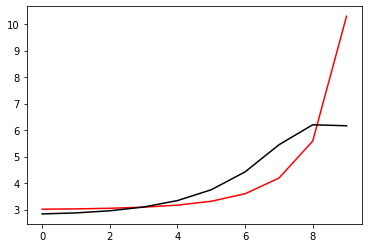

468600 0.010812620468482751
[2.87108002 2.89223248 2.9555684  3.0783983  3.29515004 3.6621601
 4.26015546 5.10642806 5.64373445 5.73881262]


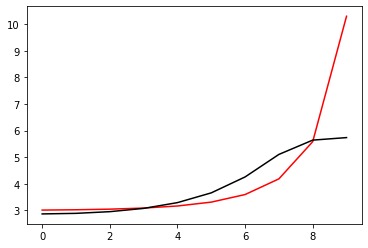

469700 0.011595501415126896
[2.86984785 2.89468082 2.96164918 3.08917953 3.31221659 3.68843192
 4.30044651 5.16648258 5.72876175 5.70775998]


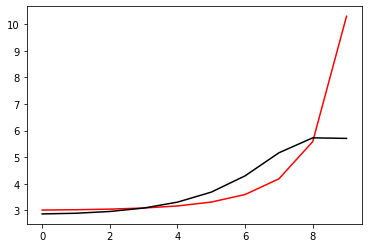

470800 0.0009248328694246078
[2.86721232 2.89702639 2.96928443 3.10356568 3.33554436 3.72458395
 4.35555682 5.24861728 5.85071853 5.86735676]


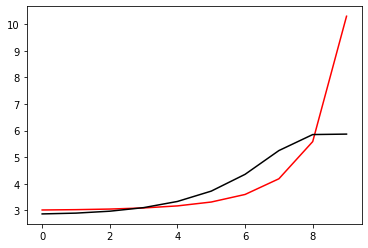

471900 0.01102265548267139
[2.86872486 2.90355489 2.98249679 3.12574658 3.36996124 3.77654357
 4.43287645 5.36279868 6.02741628 5.99516769]


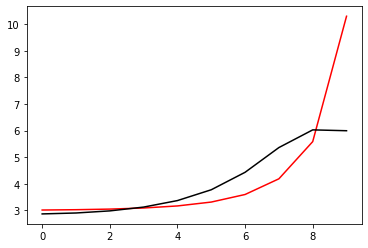

473000 0.011204723072629973
[2.85025623 2.88540668 2.96700189 3.11527301 3.36691082 3.78343358
 4.45200356 5.40790375 6.16872904 6.18251945]


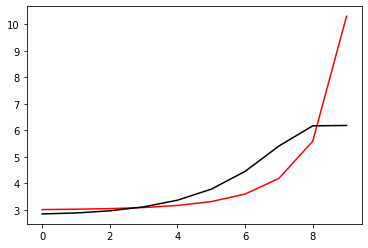

474100 0.011569282699984355
[2.88540299 2.88835727 2.93858998 3.05503222 3.27022762 3.63756501
 4.2273471  5.04495113 5.62538612 5.61502285]


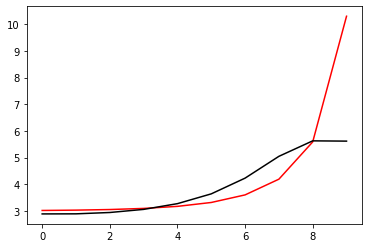

475200 0.023753558131361922
[2.87040493 2.87880673 2.93274188 3.05365072 3.27466377 3.64997045
 4.25131636 5.08756954 5.70173565 5.68199336]


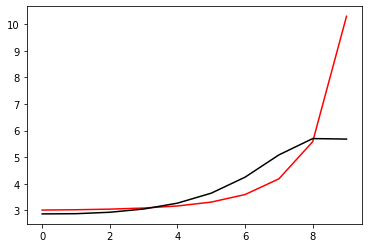

476300 0.016945208551427844
[2.86506555 2.88189023 2.94250007 3.07100653 3.30165739 3.68972181
 4.30866063 5.17170142 5.83413901 5.84340835]


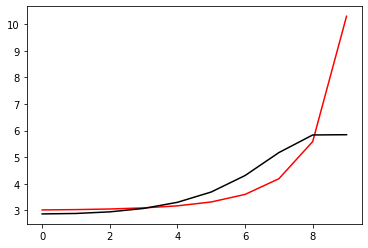

477400 0.030969093271121174
[2.86919358 2.8920886  2.95867055 3.0944838  3.33534563 3.73769934
 4.37697929 5.27363164 6.00596372 6.00281217]


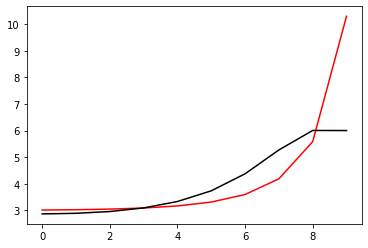

478500 0.013234088870454823
[2.86963475 2.88541959 2.94552262 3.07887811 3.32365189 3.73873696
 4.40502967 5.35996964 6.21630967 6.17935138]


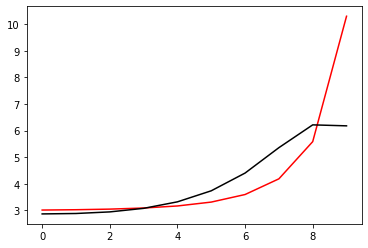

479600 0.0109582357084513
[2.94310203 2.95332854 3.00466286 3.1269882  3.35869781 3.75560957
 4.39249664 5.31797837 6.24894703 6.25644738]


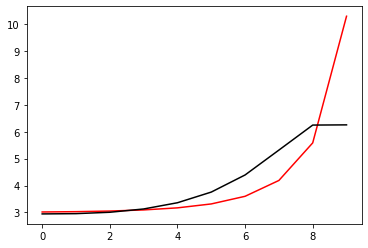

480700 0.019374202091689597
[2.90970136 2.8902311  2.90809153 2.99471185 3.18766543 3.54002515
 4.11842484 4.88760782 5.61598705 5.61164929]


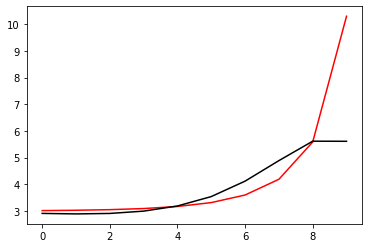

481800 0.0007330349785771643
[2.90237265 2.89457036 2.92017566 3.01387673 3.21446195 3.57556089
 4.1633473  4.95313625 5.71623262 5.71611922]


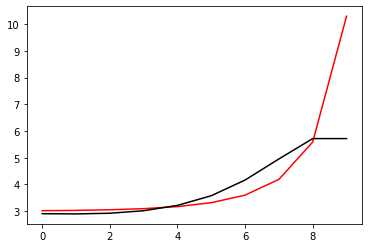

482900 0.010799791971638517
[2.92825851 2.9349941  2.9730452  3.07700568 3.28727727 3.65797331
 4.2545312  5.06721495 5.87377924 5.8735686 ]


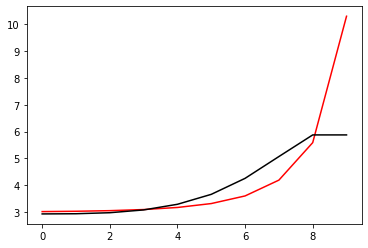

484000 0.020824969826414026
[2.84413947 2.84601636 2.88097359 2.9835586  3.19695947 3.57925932
 4.20192435 5.08190539 6.00383051 5.95770173]


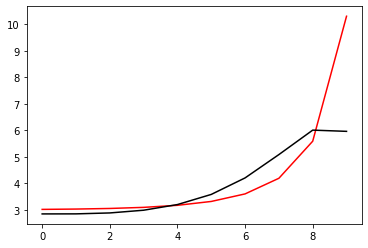

485100 0.010806916521472143
[2.97118558 2.95682309 2.97115057 3.04677116 3.22096282 3.53802527
 4.03634235 4.67980652 5.31675335 5.3108319 ]


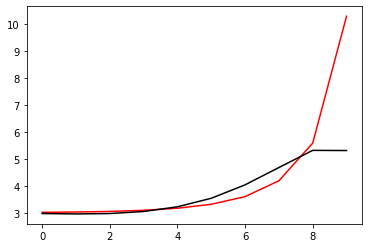

486200 0.02777828673677616
[2.92207038 2.91603041 2.93740739 3.0203226  3.20370038 3.53540525
 4.06383619 4.77216621 5.45526057 5.42890351]


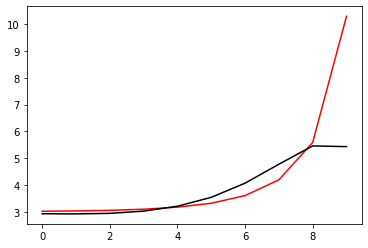

487300 0.02033908724574314
[2.89024178 2.89461203 2.92587144 3.01867949 3.21418273 3.56472352
 4.12985925 4.91011115 5.63910917 5.63810138]


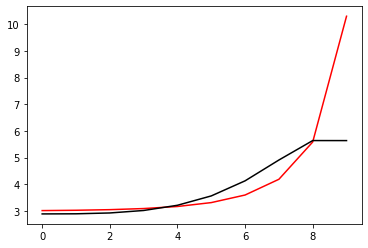

488400 0.030810835519113417
[2.87172123 2.88469399 2.92616926 3.02884813 3.23572032 3.60335835
 4.20092322 5.04765444 5.83772779 5.83474011]


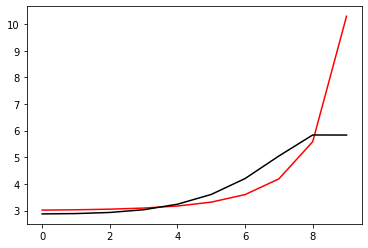

489500 0.020834237010268698
[2.96403189 2.97674739 3.02358985 3.13355208 3.35034678 3.73430846
 4.35968746 5.25156802 6.09501645 6.097035  ]


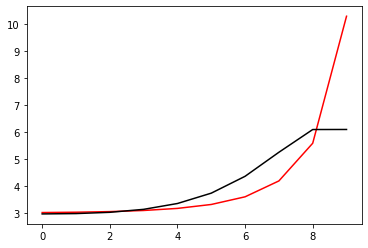

490600 0.010894821356626377
[2.86564872 2.88538872 2.94027574 3.05729666 3.27764016 3.65939199
 4.27262452 5.15191748 6.10639664 6.08598005]


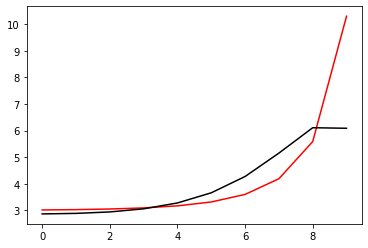

491700 0.010959123119596952
[2.95760041 2.97662572 3.03293136 3.15279695 3.3766095  3.76231754
 4.38255001 5.28650867 6.30800913 6.31663263]


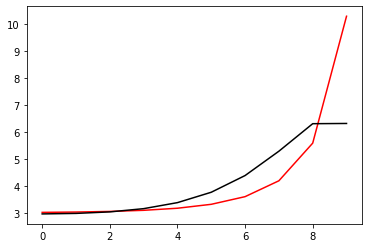

492800 0.0012182070171563144
[2.89780859 2.91158242 2.96745714 3.09479858 3.33759173 3.76319137
 4.46942248 5.56073632 6.85759754 6.86015031]


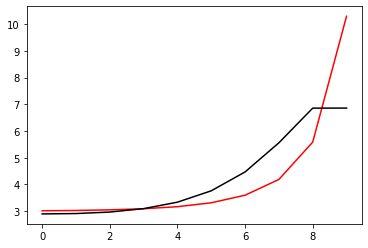

493900 0.01119204783789593
[2.98690985 2.96786786 2.98770657 3.07828452 3.28182752 3.66271103
 4.31593231 5.33426129 6.50615939 6.50805479]


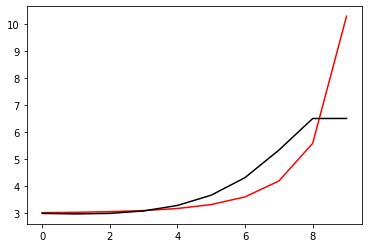

495000 0.011242843247410428
[2.91744454 2.91215767 2.94297297 3.04688798 3.26868285 3.67543958
 4.36570413 5.43739835 6.69374327 6.69441615]


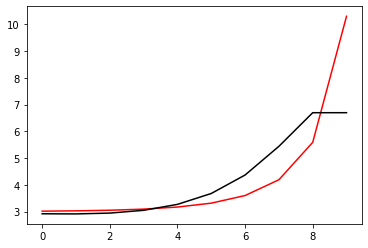

496100 0.011201124037968302
[2.87976667 2.88879782 2.93287971 3.04868295 3.28294915 3.70385407
 4.41122814 5.50982231 6.83420443 6.83866836]


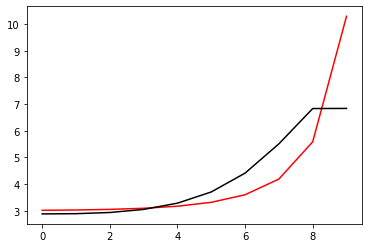

497200 0.03372442934308231
[2.95172816 2.9459639  2.97798901 3.07875512 3.29331748 3.6867393
 4.3495282  5.3507401  6.49275737 6.87788511]


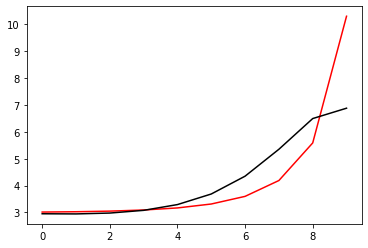

498300 0.011777233786528188
[2.90987907 2.91316029 2.95230764 3.06076889 3.28385961 3.68726002
 4.36217583 5.38160729 6.55666013 6.51509251]


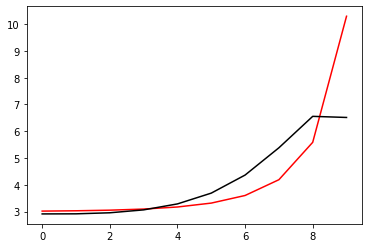

499400 0.031142167352429043
[2.91271872 2.92980368 2.98249506 3.10428192 3.34090868 3.75850105
 4.44870982 5.48981212 6.70712898 6.74020722]


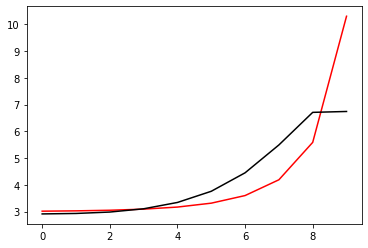

In [27]:
optimizer=tf.optimizers.Adam(learning_rate=0.001)
for j in range (5000):    
    with tf.GradientTape() as g:
        loss=Error_func(h, Positive[j%10], Negative[j%10])
        gradients=g.gradient(loss, [h])
    for i in range (100):
        optimizer.apply_gradients(zip(gradients, [h]))
    if j%11==0: 
        print(j*100, Error_func(h, Positive[j%10], Negative[j%10]).numpy()), print(h.numpy())
        plt.plot(h_real, 'r-'), plt.plot(h.numpy(), 'k-'), plt.show()

0 0.06257590063199844
[2.77108607 2.78948889 2.84443884 2.96803318 3.20601616 3.62482077
 4.31695748 5.36567438 6.60793673 6.71784906]


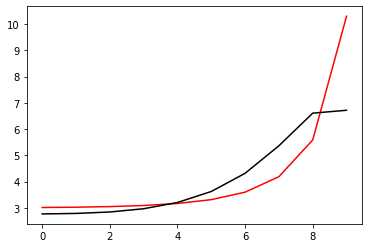

1100 0.011079438929193533
[2.90390538 2.91864306 2.97022671 3.08983607 3.3224562  3.73290176
 4.4093192  5.44660955 6.51882043 6.55275367]


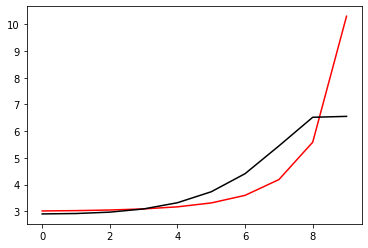

2200 0.02160727795983803
[2.84164144 2.85992398 2.91749426 3.04585707 3.29204092 3.72919436
 4.4774659  5.69399104 6.86128852 6.83504513]


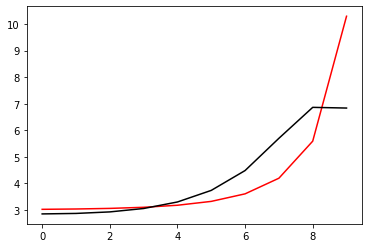

3300 0.012204163617513213
[2.89277518 2.90041279 2.94692372 3.06194648 3.28957816 3.69713219
 4.38509618 5.41100113 6.31290831 6.29620558]


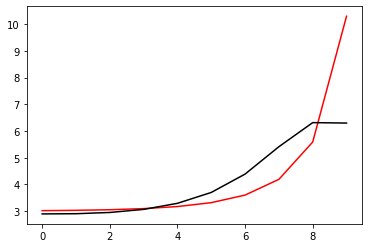

4400 0.031072768169873127
[2.88702978 2.89847371 2.94811643 3.06641901 3.29788786 3.71073478
 4.40621778 5.44320338 6.36707834 6.36796612]


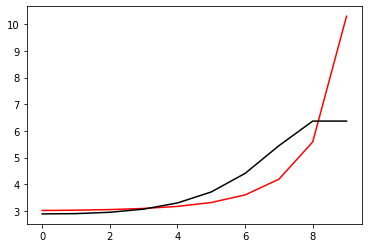

5500 0.011485629537605221
[2.84878576 2.86692132 2.9230752  3.04837092 3.28836394 3.71354783
 4.42900585 5.50097418 6.47986046 6.44172451]


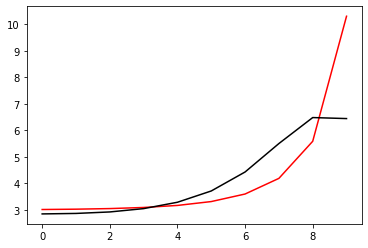

6600 0.011273454838500799
[2.83294288 2.8585829  2.92331078 3.05754289 3.30778814 3.7463378
 4.47958146 5.57823343 6.61857556 6.68583453]


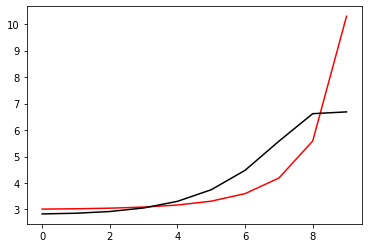

7700 0.011270292803484653
[2.88431074 2.91479192 2.9869745  3.12847999 3.38511327 3.82792936
 4.55741839 5.64343538 6.73396249 6.72625662]


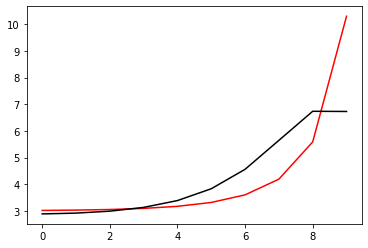

8800 0.0012554415025344892
[2.84460731 2.87321296 2.94643952 3.08943962 3.34494989 3.7804323
 4.49179033 5.56326447 6.74965887 6.75770293]


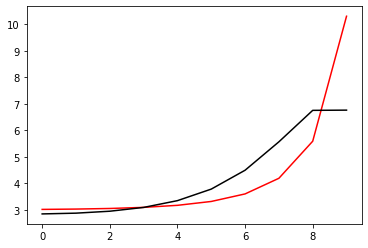

9900 0.011020474348481222
[2.9083452  2.91757202 2.96873801 3.08810977 3.315124   3.7117108
 4.36570594 5.35249441 6.44788789 6.45234464]


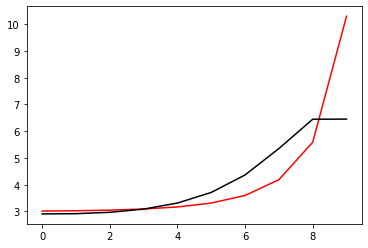

11000 0.011108007426063975
[2.85955399 2.87269202 2.9263437  3.05002933 3.28449918 3.69243515
 4.36393922 5.38276649 6.55477572 6.5263304 ]


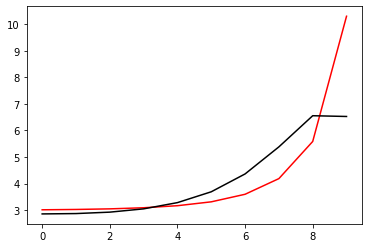

12100 0.7130872511858777
[3.17409697 3.18501587 3.2364163  3.35681779 3.58660965 3.98427445
 4.6220823  5.50481619 6.49911664 6.74469452]


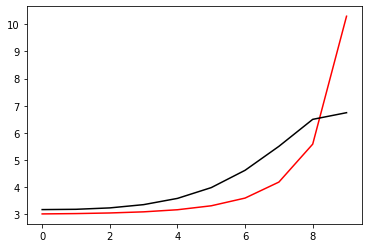

13200 0.02261300661945205
[2.88103761 2.88060582 2.91730645 3.02114048 3.23138982 3.60496417
 4.2140324  5.07636706 6.08143246 6.05673979]


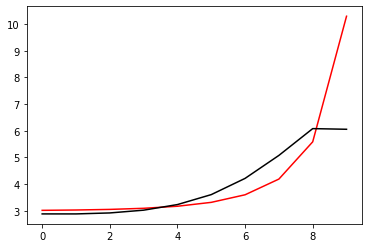

14300 0.017635600936789095
[2.87337261 2.88333962 2.92937258 3.04271142 3.2635027  3.64910767
 4.27246433 5.16049971 6.2027725  6.2028861 ]


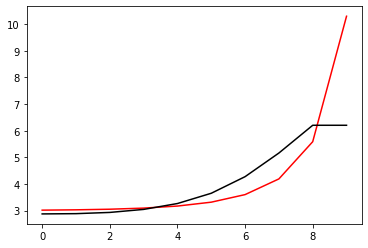

15400 0.031015421104118906
[2.9155862  2.93477244 2.99156945 3.11598799 3.34911135 3.74897283
 4.3897527  5.31072687 6.40237799 6.42391735]


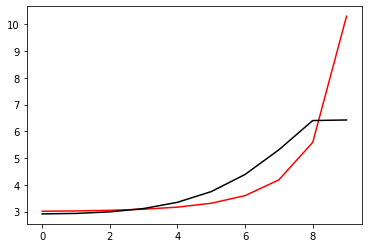

16500 0.08473621671682985
[2.72557716 2.73000276 2.77117279 2.87509895 3.07870855 3.43263666
 3.99919282 4.81846842 5.80661126 5.95420861]


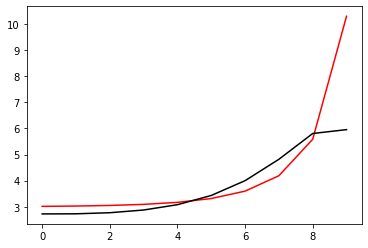

17600 0.010709976386490067
[2.89828132 2.89087498 2.92012405 3.0128513  3.20474166 3.54416763
 4.08911091 4.87371302 5.81307724 5.81385392]


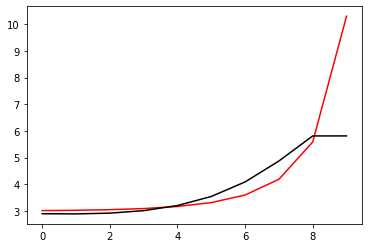

18700 0.01447548775932964
[2.90194545 2.90250646 2.93777167 3.03676543 3.23598155 3.58512269
 4.1448779  4.95412332 5.92384657 5.89202317]


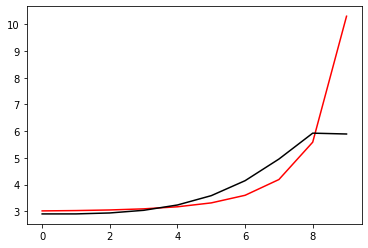

19800 0.0007938494818131301
[2.90622197 2.91528632 2.95755695 3.06314032 3.2695614  3.62787006
 4.201854   5.03747854 6.04450376 6.12161983]


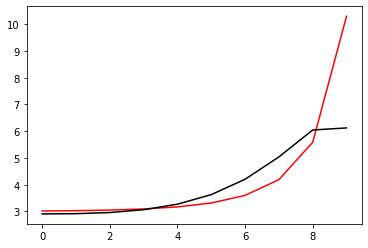

20900 0.010850918771089079
[2.93616711 2.94175035 2.98132337 3.08534943 3.2923022  3.65485024
 4.24123494 5.1094683  6.17356923 6.14769279]


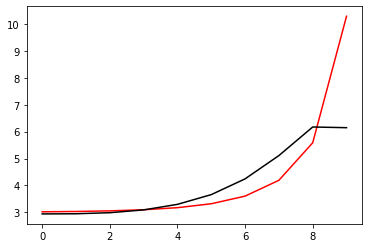

22000 0.010849038858557451
[2.89960429 2.89484714 2.92285249 3.01570508 3.2123374  3.56581891
 4.14715711 5.03018521 6.16180176 6.09692681]


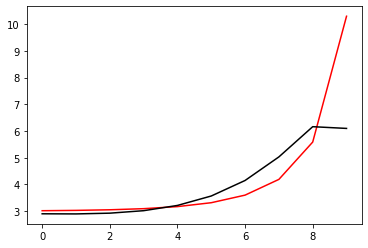

23100 0.010956030218159456
[2.93333193 2.93692508 2.97191067 3.07305687 3.2825841  3.65950204
 4.28880756 5.26971511 6.52331791 6.4419771 ]


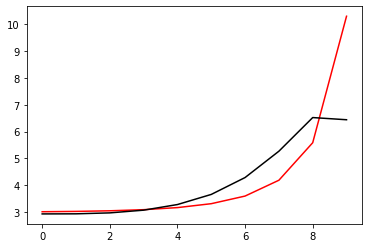

24200 0.021529649704834904
[2.86757974 2.86910217 2.90226071 3.00176135 3.21085424 3.58996358
 4.22649102 5.22759179 6.57066927 6.51773819]


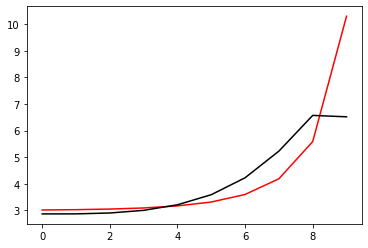

25300 0.01940358805411696
[2.88754737 2.89138085 2.92453174 3.01959609 3.21708836 3.57188773
 4.15959248 5.06730779 6.2928448  6.24436872]


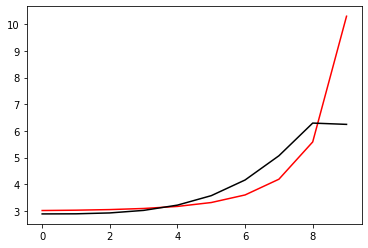

26400 0.030962367355458625
[2.94362892 2.95236664 2.99260188 3.09565073 3.3031446  3.67289381
 4.28652528 5.24027158 6.51851924 6.5362622 ]


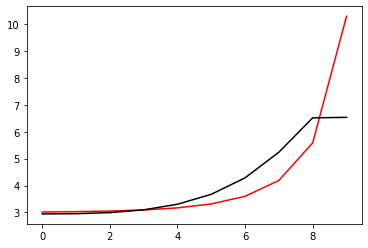

27500 0.020888796532569986
[2.98991094 2.99296134 3.02706379 3.12272114 3.32084948 3.67922351
 4.28044867 5.23049723 6.55343438 6.56783191]


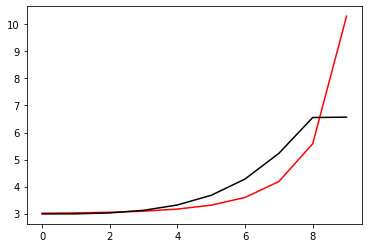

28600 0.04286240094755067
[2.80256603 2.7982851  2.82281801 2.90493213 3.08307446 3.41175274
 3.9669953  4.80232901 5.98543782 6.11144464]


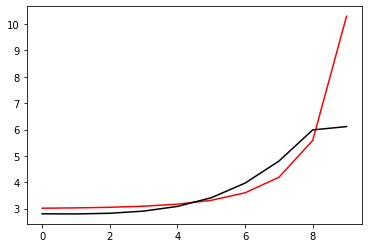

29700 0.019920060180349704
[2.90934404 2.89598276 2.91129348 2.9846304  3.15369172 3.4715937
 4.01156793 4.82576453 5.97982509 5.97693788]


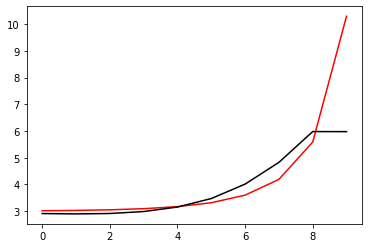

30800 0.0007095525215454546
[2.91574611 2.90836517 2.92789667 3.00515762 3.17837858 3.5013405
 4.04807077 4.87546411 6.04365374 6.04734116]


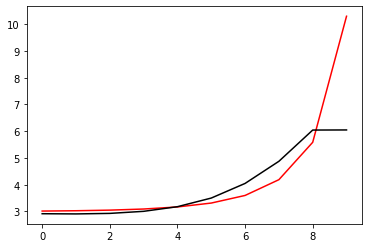

31900 0.010762863035271273
[2.91198532 2.91400773 2.941937   3.0272474  3.20935127 3.54356682
 4.10617784 4.96249509 6.16355325 6.14164548]


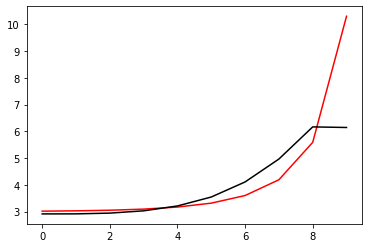

33000 0.010949356800583322
[2.90654237 2.91720353 2.95478928 3.04927985 3.24127663 3.58800568
 4.16891857 5.0616383  6.30703844 6.36418654]


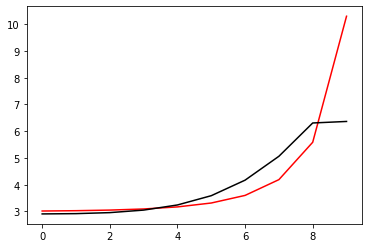

34100 0.010807818303620223
[2.95378402 2.95813238 2.9903686  3.08073545 3.26997244 3.61641444
 4.20281472 5.12257749 6.40904652 6.33396013]


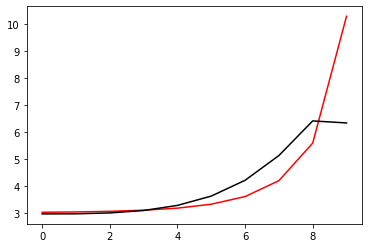

35200 0.06985844025260157
[2.81038154 2.78765596 2.79193002 2.85303157 3.00867292 3.31125425
 3.83243918 4.655296   5.83651523 6.24821931]


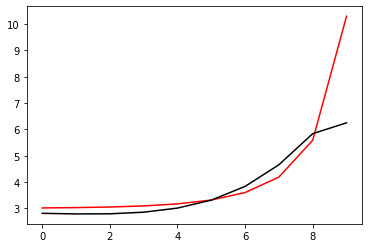

36300 0.0205422441764125
[2.93898389 2.9187193  2.92091437 2.97841912 3.12879311 3.42359774
 3.93360039 4.7426361  5.9044305  5.89576976]


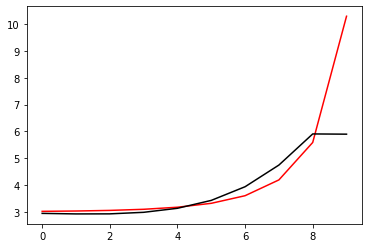

37400 0.03074171358364341
[2.96445893 2.96163109 2.97904838 3.05071661 3.21612169 3.52897285
 4.06431166 4.91468992 6.13344892 6.15286675]


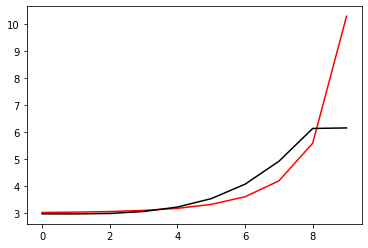

38500 0.020780884668070588
[3.00444182 3.00588291 3.03213757 3.11353173 3.29122677 3.62205005
 4.18657933 5.08887158 6.38675392 6.3923767 ]


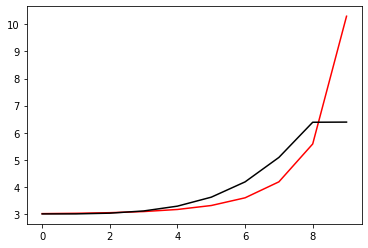

39600 0.010766855283072474
[2.89559086 2.89959428 2.92902466 3.01135492 3.18550705 3.50548576
 4.0455606  4.91152164 6.23739995 6.2346761 ]


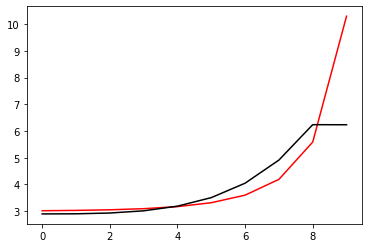

40700 0.010830162923619742
[2.99884161 3.0038398  3.0361     3.12304378 3.30370779 3.63403118
 4.19403609 5.0959592  6.44199542 6.45165608]


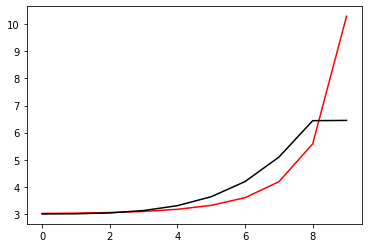

41800 0.0008561881360260578
[2.98738764 2.99361906 3.02723377 3.11578415 3.29792368 3.6305585
 4.19856855 5.12801253 6.54097804 6.55357604]


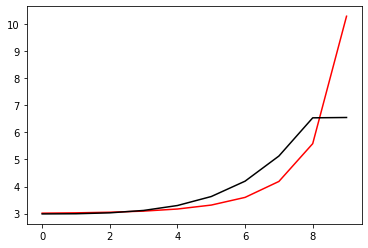

42900 0.010684250316861963
[2.98302751 2.95808815 2.96225953 3.02151504 3.1719143  3.46729384
 3.98859881 4.7921157  5.98460629 6.01220605]


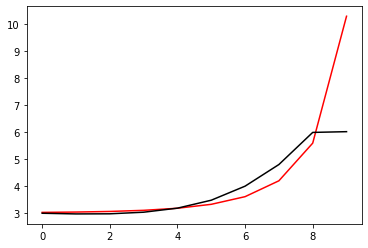

44000 0.01097136802155706
[2.95874535 2.93977362 2.94790404 3.01156962 3.1675412  3.4709191
 4.0044706  4.83142664 6.05115955 6.05094726]


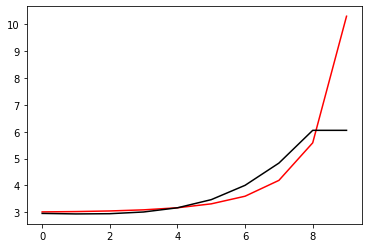

45100 0.01082238906904579
[2.95607124 2.946269   2.96117678 3.03163053 3.19557444 3.50956641
 4.05797387 4.91207441 6.15881327 6.11926862]


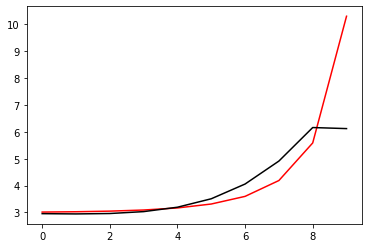

46200 0.021651619738618757
[2.87379446 2.87728757 2.90515854 2.98926238 3.17012485 3.50813006
 4.09403212 5.0172614  6.34544192 6.3104192 ]


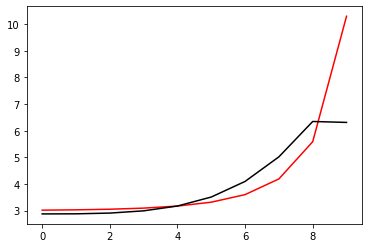

47300 0.024029175857847633
[3.04139642 3.03602134 3.0578389  3.13652767 3.31337096 3.64884797
 4.2312118  5.15460726 6.4760692  6.58721505]


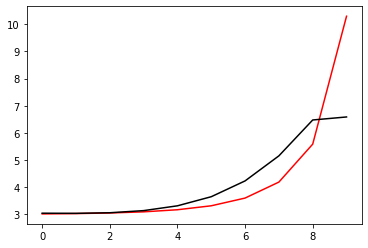

48400 0.030726351222163217
[2.93274876 2.91084241 2.91215566 2.96399321 3.10190525 3.37520633
 3.84862824 4.57537697 5.63355257 5.63316678]


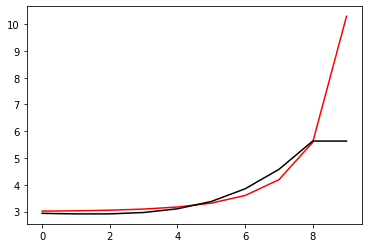

49500 0.011442554501668502
[2.92448597 2.90700658 2.91124785 2.96601775 3.10729198 3.38506151
 3.86539718 4.60514343 5.67839128 5.6721974 ]


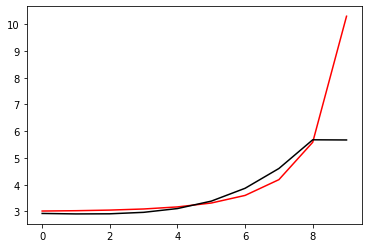

50600 0.010675262976840258
[2.91336535 2.90259565 2.9119029  2.97153426 3.11827048 3.40317639
 3.89445156 4.65470964 5.75169486 5.75031508]


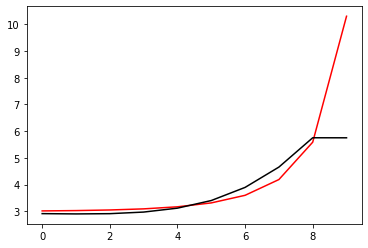

51700 0.020124143245774058
[2.90724404 2.90516197 2.92263445 2.9900838  3.14558354 3.44190082
 3.95053367 4.74262033 5.87574876 5.931296  ]


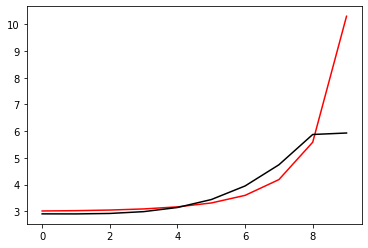

52800 0.0006976586389563698
[2.95763195 2.96912664 3.0022807  3.08465627 3.25549194 3.56957623
 4.10170955 4.93080006 6.09784092 6.10111771]


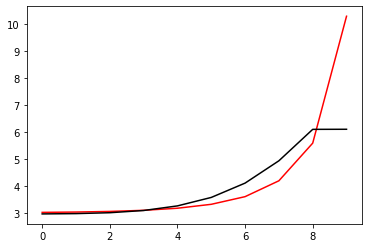

53900 0.010906368871503888
[2.9198496  2.94875156 3.00662656 3.11543196 3.31474184 3.66353215
 4.2449359  5.15335433 6.41169712 6.39762732]


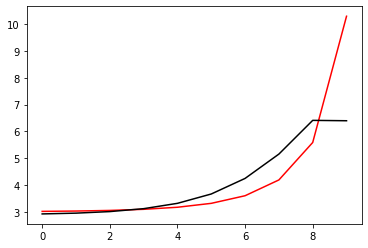

55000 0.010883258890758191
[2.91391021 2.92111261 2.95797353 3.04633954 3.22377777 3.54685762
 4.09242724 4.9288023  6.02586072 6.02630857]


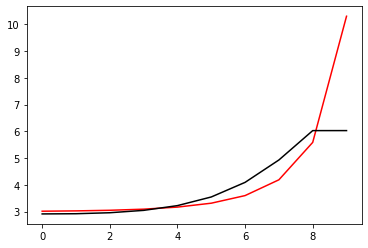

56100 0.01088201808494858
[2.90956048 2.92347629 2.96673025 3.06210928 3.24647985 3.57617049
 4.12892414 4.97835925 6.09686011 6.0902362 ]


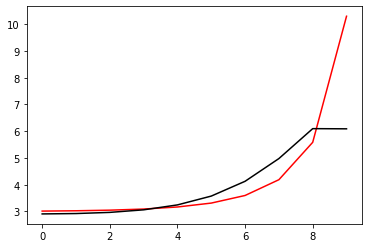

57200 0.022969674565970613
[2.84370218 2.84931743 2.88754308 2.98500888 3.18037278 3.53316039
 4.12721794 5.04570863 6.25396    6.20555496]


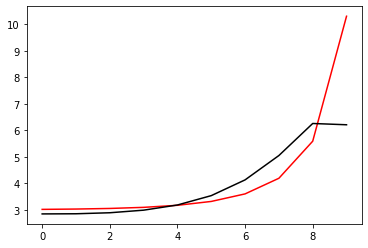

58300 0.02185292704684266
[3.02503388 3.02400358 3.05378928 3.1438875  3.33383464 3.68232197
 4.26966569 5.17447106 6.37850856 6.50165176]


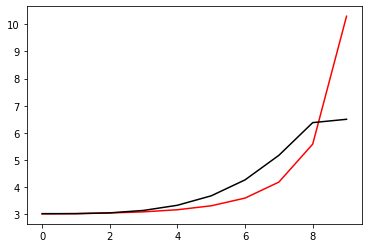

59400 0.031180448366368838
[3.00692901 3.00434943 3.03100464 3.11811405 3.3068808  3.65823688
 4.25988413 5.20677852 6.48337016 6.46322555]


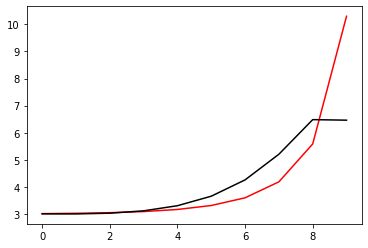

60500 0.011258777653437179
[2.88837306 2.88286094 2.90353554 2.97980776 3.15041184 3.47046552
 4.01175778 4.7697211  5.85270044 6.27532111]


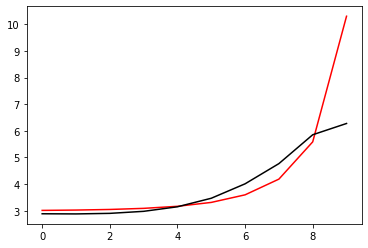

61600 0.010700884922625758
[2.90012052 2.89955445 2.92458198 3.005283   3.18107568 3.50826022
 4.06002824 4.8388477  5.9175486  5.9120776 ]


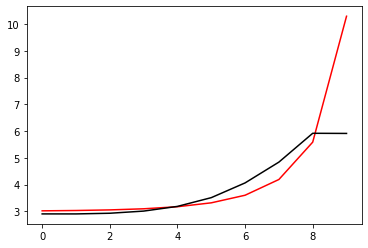

62700 0.014263796470191237
[2.9012732  2.90856315 2.94176681 3.03129521 3.21819721 3.56193833
 4.1414413  4.97356777 6.06283917 6.03581013]


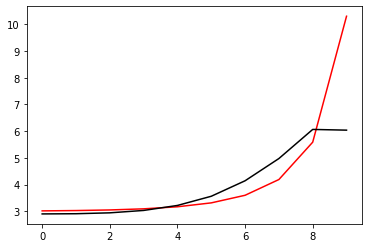

63800 0.0008433010115071164
[2.92510927 2.93976536 2.98213262 3.08142723 3.28010488 3.64043549
 4.24557423 5.12750378 6.22662618 6.26807815]


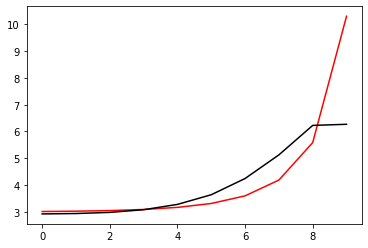

64900 0.01083944518838947
[2.96187225 2.96516543 2.99630473 3.08259091 3.26336319 3.59453936
 4.14517365 4.95502846 6.03278355 6.02785004]


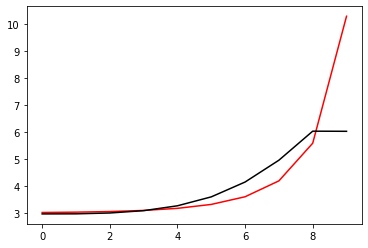

66000 0.010899250985442593
[2.90624377 2.89899669 2.92060022 3.00229774 3.1863012  3.53533977
 4.14028108 5.10958195 6.38745729 6.3260811 ]


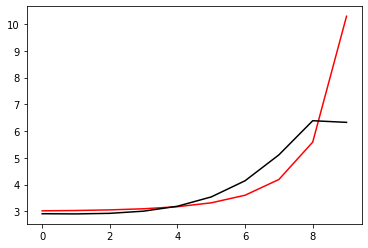

67100 0.5621113735686972
[3.15104512 3.138047   3.15279628 3.22990573 3.41458668 3.77432094
 4.41200945 5.44330743 6.64344408 6.69738963]


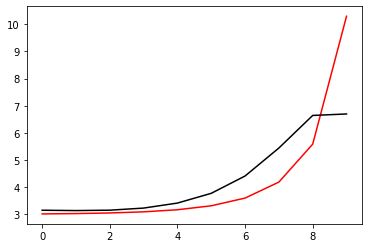

68200 0.02482346582649055
[2.95454607 2.92104767 2.91236213 2.96461007 3.12122175 3.44659408
 4.03944677 5.01332749 6.16062482 6.13517992]


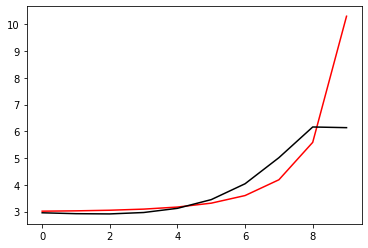

69300 0.02026635351239342
[2.9248393  2.9055107  2.90720259 2.96909232 3.13624637 3.47445598
 4.08398503 5.08060198 6.27291944 6.2813151 ]


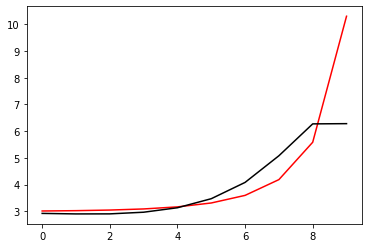

70400 0.030858564324259388
[2.95994856 2.94560169 2.95098274 3.0145426  3.18284613 3.5223959
 4.13360002 5.13411537 6.36004178 6.31297625]


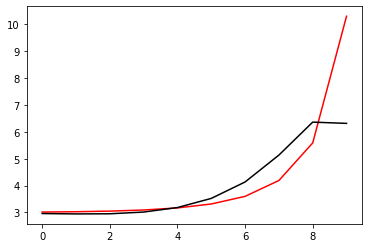

71500 0.012997093021330671
[2.87994925 2.87288586 2.88676315 2.95747531 3.1321256  3.47737615
 4.09200271 5.09359616 6.35649832 6.28483668]


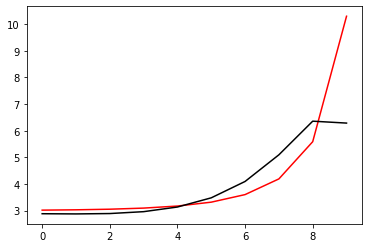

72600 0.01095262780505389
[2.89552029 2.88941636 2.90488853 2.97733821 3.1543322  3.5042778
 4.12931948 5.15616596 6.49840087 6.51705722]


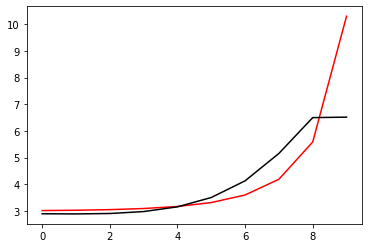

73700 0.011050489993997974
[2.95834237 2.96415313 2.99529843 3.08468761 3.28044933 3.65383041
 4.31188166 5.38961175 6.82896632 6.83573752]


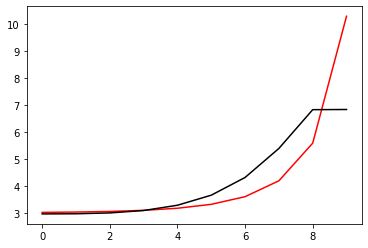

74800 0.0008220630100962913
[2.96601527 2.95087675 2.95956766 3.02440953 3.19127695 3.52878359
 4.13995906 5.13281995 6.25344905 6.24411595]


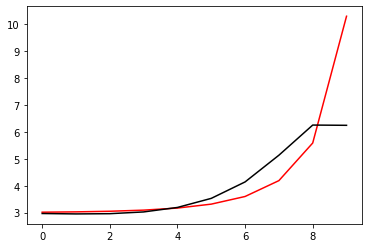

75900 0.010879659869358434
[2.94094573 2.93600999 2.95389331 3.02857732 3.20634769 3.55646744
 4.18228182 5.19310711 6.35676012 6.36417394]


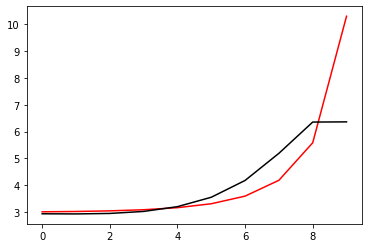

77000 0.011153039633617832
[2.87378873 2.87733814 2.90683158 2.99589683 3.19246031 3.56843831
 4.23053779 5.29239457 6.54792953 6.50431802]


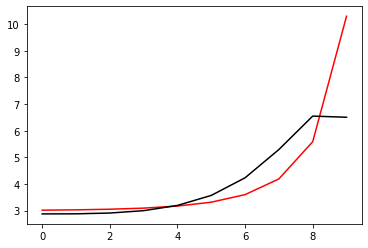

78100 0.01118161062673595
[2.93377938 2.92683141 2.94460416 3.01839598 3.19165979 3.52564967
 4.09955033 4.97614297 6.00542064 5.99642572]


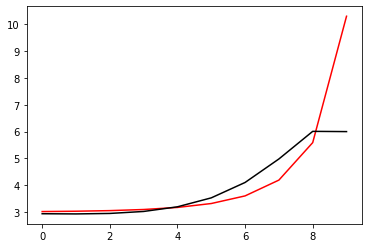

79200 0.023216303759965026
[2.89991211 2.90007861 2.92465055 3.00575598 3.18789381 3.53486755
 4.13246708 5.05281147 6.12153899 6.08703443]


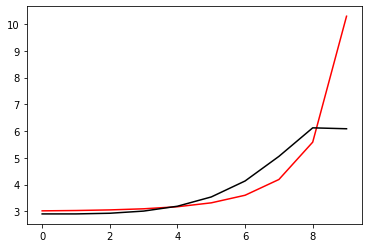

80300 0.01937522822847599
[2.88161206 2.89051933 2.9244988  3.01542719 3.20896168 3.57165603
 4.19570836 5.16054342 6.26906332 6.29705667]


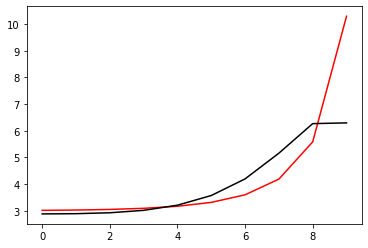

81400 0.03097778844434868
[2.91722653 2.92973759 2.97113327 3.07111801 3.27605097 3.65505792
 4.30522539 5.3099295  6.46060971 6.45593557]


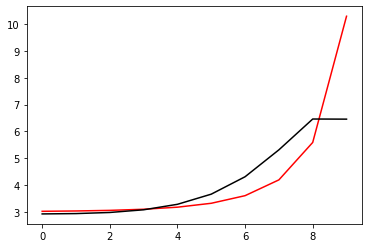

82500 0.012180750485873673
[2.86105171 2.86500864 2.89871809 2.99277544 3.19183761 3.56325574
 4.20351644 5.21635111 6.47687874 6.42527243]


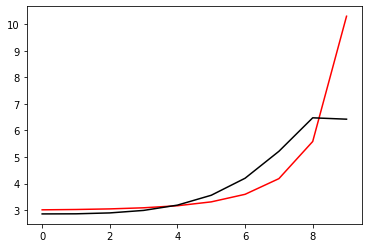

83600 0.01090069918419193
[2.99881143 2.99729673 3.02342725 3.10885669 3.2970555  3.65182976
 4.26183738 5.22417451 6.50324357 6.52088128]


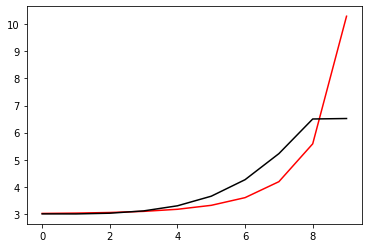

84700 0.04205689160599278
[2.86199072 2.84828059 2.86142033 2.93101527 3.09772311 3.42069617
 3.98260786 4.82334334 5.94642889 6.03003352]


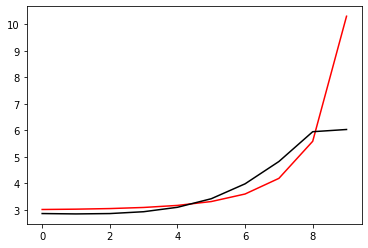

85800 0.0006873705510093298
[2.94555712 2.92547286 2.93186659 2.99578771 3.15762876 3.47598113
 4.031939   4.86665486 5.9799517  5.97665906]


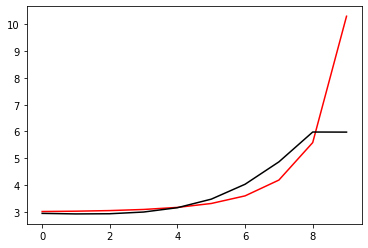

86900 0.010725017808141848
[2.92851084 2.91623517 2.92831636 2.99777711 3.16586727 3.49226995
 4.0595917  4.91746206 6.0609457  6.06395714]


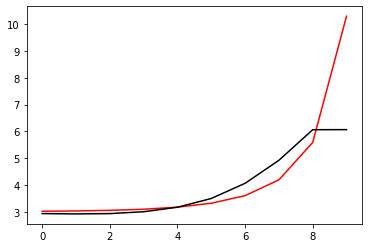

88000 0.010847032353507004
[2.91825245 2.9162803  2.93740807 3.01521242 3.19224266 3.52955036
 4.1115635  4.99961366 6.18257747 6.19560387]


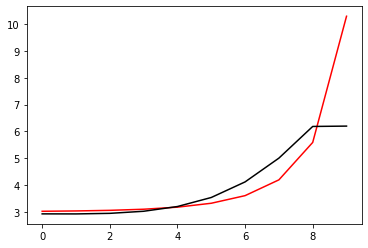

89100 0.010971989832498617
[2.9090729  2.91676476 2.94909892 3.03781636 3.22688018 3.57946884
 4.1834845  5.11696659 6.36145183 6.33958401]


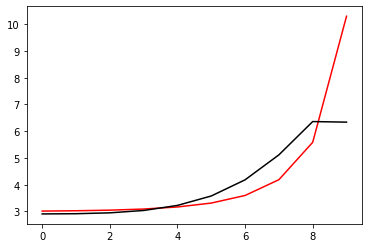

90200 0.02151821594104822
[2.8727324  2.86846974 2.8906901  2.97185472 3.15649981 3.51006856
 4.1287008  5.12334643 6.46512528 6.38814595]


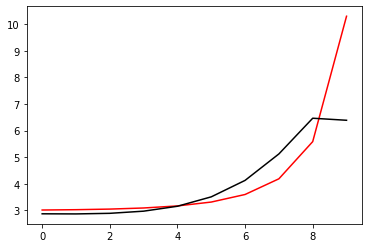

91300 0.10700079900416243
[3.09354196 3.08032861 3.09272986 3.16559916 3.34489973 3.69802142
 4.32265645 5.31572078 6.62886429 6.76214914]


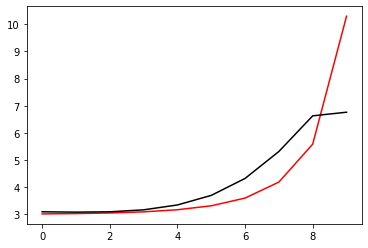

92400 0.030688267616884864
[2.95312871 2.93091955 2.93122842 2.98802714 3.14330882 3.4558319
 4.00377492 4.85089578 5.97043778 5.96845053]


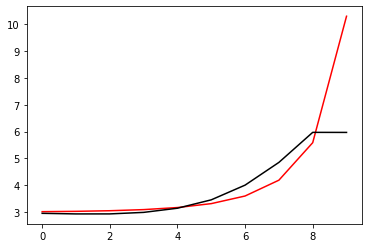

93500 0.01135457714373108
[2.91405591 2.90124169 2.90942085 2.97428627 3.13944923 3.46656104
 4.04042309 4.93590381 6.09832322 6.0801191 ]


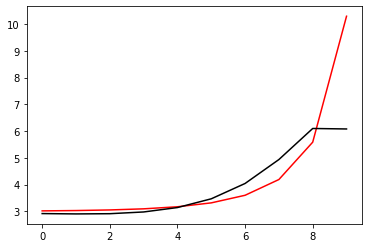

94600 0.010855954044691637
[2.89282031 2.89079497 2.9092665  2.9838391  3.15992085 3.50192801
 4.10022042 5.03963282 6.24150508 6.25387038]


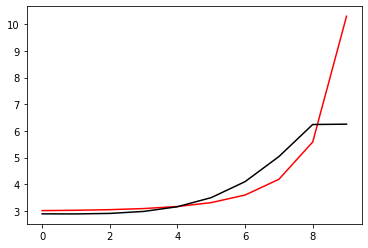

95700 0.010809050310847041
[3.01409065 3.00656697 3.02108226 3.09174635 3.26399015 3.60184294
 4.19304118 5.12203587 6.32075933 6.32786211]


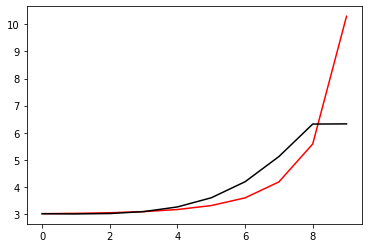

96800 0.0008333068545727603
[2.99228331 2.99072034 3.01140874 3.08694476 3.2623918  3.60203806
 4.19526438 5.14403884 6.41429357 6.42223806]


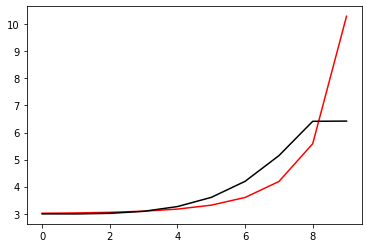

97900 0.010809408967008084
[2.90477979 2.90150922 2.92250856 2.99839867 3.17383092 3.51397695
 4.11138397 5.05149796 6.19426864 6.21268293]


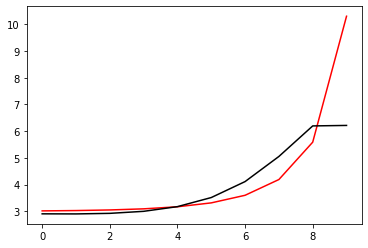

KeyboardInterrupt: 

In [28]:
optimizer=tf.optimizers.Adam(learning_rate=0.001)
for j in range (5000):    
    with tf.GradientTape() as g:
        loss=Error_func(h, Positive[j%10], Negative[j%10])
        gradients=g.gradient(loss, [h])
    for i in range (100):
        optimizer.apply_gradients(zip(gradients, [h]))
    if j%11==0: 
        print(j*100, Error_func(h, Positive[j%10], Negative[j%10]).numpy()), print(h.numpy())
        plt.plot(h_real, 'r-'), plt.plot(h.numpy(), 'k-'), plt.show()

In [ ]:
optimizer=tf.optimizers.Adam(learning_rate=0.001)
for j in range (5000):    
    with tf.GradientTape() as g:
        loss=Error_func(h, Positive[j%10], Negative[j%10])
        gradients=g.gradient(loss, [h])
    for i in range (100):
        optimizer.apply_gradients(zip(gradients, [h]))
    if j%11==0: 
        print(j*100, Error_func(h, Positive[j%10], Negative[j%10]).numpy()), print(h.numpy())
        plt.plot(h_real, 'r-'), plt.plot(h.numpy(), 'k-'), plt.show()

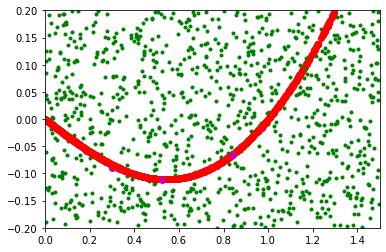

In [29]:
for i in range (set):
    [Positive0[i], Positive1[i]]=NN_func_01(h, Positive[i])
    [Negative0[i], Negative1[i]]=NN_func_01(h, Negative[i])
for i in range (set):
    x_data1[i]=[v[0] for v in Positive0[i]]
    y_data1[i]=[v[1] for v in Positive0[i]]
    x_data2[i]=[v[0] for v in Positive1[i]]
    y_data2[i]=[v[1] for v in Positive1[i]]
    x_data3[i]=[v[0] for v in Negative0[i]]
    y_data3[i]=[v[1] for v in Negative0[i]]
    x_data4[i]=[v[0] for v in Negative1[i]]
    y_data4[i]=[v[1] for v in Negative1[i]]
    plt.plot(x_data4[i], y_data4[i], 'g.')
    plt.plot(x_data2[i], y_data2[i], 'co')
    plt.plot(x_data1[i], y_data1[i], 'ro')
    plt.plot(x_data3[i], y_data3[i], 'mo')
plt.xlim(0.0, 1.5)
plt.ylim(-0.2, 0.2)
plt.show()